In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import praw
from datetime import datetime, timedelta


all_plots_size=(14,4)
start_date = '2019-01-01'
end_date = '2024-08-15'
market_usdt = 'USDT'
market_usd = 'USD'

In [2]:
import nltk

# Download the VADER lexicon for sentiment analysis
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/okpo/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## 1. Utility functions

In [3]:
# handling missing values
def handle_missing_values(df):
    # Fill NaN values with 0 for records that don't have
    df = df.fillna({
        'Hashrate': 0,
        'Difficulty': 0
    })
    # df = df.fillna(0)
    return df

In [4]:
# # feature engineering
# def add_features(df):
    
#     df['Return'] = df['Close'].pct_change()
#     df['Volatility'] = df['Return'].rolling(window=14).std()
#     df['Volume_Mean'] = df['Volume'].rolling(window=14).mean()
#     df['Market Cap'] = df['Close'] * df['Current Supply']
#     # Blockchain measures (example)
#     characteristics['new_addresses'] = data['new_addresses'].sum()
#     characteristics['active_addresses'] = data['active_addresses'].sum()
#     characteristics['transaction_count'] = data['transaction_count'].sum()
#     characteristics['avg_transaction_value'] = data['transaction_value'].mean()
    
#     # Market variables
#     characteristics['trading_volume'] = data['volume'].mean()
#     characteristics['price_impact'] = (data['close'].diff() / data['volume']).abs().mean()
#     characteristics['bid_ask_spread'] = ((data['high'] - data['low']) / data['low']).mean()
#     characteristics['market_cap'] = data['market_cap'].iloc[-1]  # Assuming the last value is the latest market cap


#     # Drop rows with NaN values
#     df = df.dropna()
#     # df = df.fillna(0)
    
#     return df

In [5]:
def separate_trad_mkt_data(yfinance_all_df, trad_mkt_df):
    # Get the unique tickers from trad_mkt_df
    trad_mkt_tickers = trad_mkt_df['Ticker'].unique()

    # Filter yfinance_all_df to get rows with traditional market tickers
    trad_mkt_data = yfinance_all_df[yfinance_all_df['Ticker'].isin(trad_mkt_tickers)]

    # Filter yfinance_all_df to get rows with non-traditional market tickers (i.e., cryptocurrencies)
    crypto_data = yfinance_all_df[~yfinance_all_df['Ticker'].isin(trad_mkt_tickers)]

    return trad_mkt_data, crypto_data


In [6]:
def merge_dataframes(crypto_df, trad_mkt_df, processed_social_data):
    # Convert the 'Date' columns to datetime format without time components to align them
    crypto_df['Date'] = pd.to_datetime(crypto_df['Date']).dt.normalize()
    trad_mkt_df['Date'] = pd.to_datetime(trad_mkt_df['Date']).dt.normalize()
    processed_social_data['Date'] = pd.to_datetime(processed_social_data.index).normalize()

    # Extract risk-free rate from `trad_mkt_df`
    risk_free_rate = trad_mkt_df[trad_mkt_df['Ticker'] == '^TNX'][['Date', 'Close']].rename(columns={'Close': 'Risk_Free_Rate'})

    # calculate Return
    crypto_df['Return'] = crypto_df['Close'].pct_change()
    
    # Extract BTC data for market return from `crypto_df`
    market_return = crypto_df[crypto_df['Ticker'] == 'BTC/USDT'][['Date', 'Return']].rename(columns={'Return': 'Market_Return'})

    # Merge risk-free rate and market return with crypto data
    merged_df = crypto_df.merge(risk_free_rate, on='Date', how='left')
    merged_df = merged_df.merge(market_return, on='Date', how='left')

    # Merge with social sentiment data
    merged_df = merged_df.merge(processed_social_data, on='Date', how='left')
    
    final_df = merged_df.dropna()

    return final_df


In [7]:
def plot_multiple_columns(
    dfs, 
    y_columns,
    titles,
    ylabels,
    locs,
    df_labels=None,
    colors=None,
    linestyles=None,
    figsize=(10, 6)
):
    """
    Plots multiple columns from one or more DataFrames on a single chart with separate y-axes for clarity.

    Parameters:
    - dfs: List of DataFrames containing data to be plotted. The index should be the Date.
    - y_columns: List of column names to be used as the y-axis data (can be the same or different for each DataFrame).
    - titles: Title of the chart.
    - ylabels: List of labels for each y-axis corresponding to each DataFrame.
    - locs: List of legend locations for each DataFrame.
    - df_labels: List of labels for the legend corresponding to each DataFrame (if not provided, will attempt to derive from DataFrame).
    - colors: List of colors for each DataFrame's data (default is ['blue', 'red', 'green', ...]).
    - linestyles: List of linestyles for each DataFrame's data (default is ['solid', 'dotted', 'dashed', 'dashdot']).
    - figsize: Tuple indicating the figure size (default is (10, 6)).
    """

    # Set default colors and linestyles if not provided
    if colors is None:
        colors = ['blue', 'red', 'green', 'purple', 'orange', 'brown']
    if linestyles is None:
        linestyles = ['solid', 'dotted', 'dashed', 'dashdot']

    # Set default df_labels if not provided
    if df_labels is None:
        df_labels = [df.columns.name or f'Data {i+1}' for i, df in enumerate(dfs)]

    # Create the plot
    fig, ax1 = plt.subplots(figsize=figsize)
    axes = [ax1]  # Store the initial axis

    # Plot the first DataFrame's specified column against the index on the first y-axis (left)
    ax1.plot(dfs[0].index, dfs[0][y_columns[0]], label=f'{df_labels[0]} {y_columns[0]}', color=colors[0], linestyle=linestyles[0])

    # Set title and labels for ax1
    ax1.set_title(titles)
    ax1.set_ylabel(ylabels[0], color=colors[0])
    ax1.set_xlabel('Date')

    # Plot additional DataFrames
    for i in range(1, len(dfs)):
        ax = ax1.twinx()
        axes.append(ax)  # Store the new axis

        # Offset the y-axis for readability if there are more than 2 axes
        if i > 1:
            ax.spines['right'].set_position(('outward', 60 * (i - 1)))

        ax.plot(dfs[i].index, dfs[i][y_columns[i]], label=f'{df_labels[i]} {y_columns[i]}', color=colors[i], linestyle=linestyles[0])
        ax.set_ylabel(ylabels[i], color=colors[i])
        ax.legend(loc=locs[i])

    # Display legend for the first DataFrame
    ax1.legend(loc=locs[0])

    # Show plot
    plt.show()

In [8]:
def plot_multiple_axis_ohlc(
    dfs, 
    titles,
    ylabels,
    locs,
    df_labels=None,
    colors=None,
    linestyles=None,
    figsize=(10, 6)):
    """
    Plots multiple OHLC datasets on a single chart with separate y-axes for clarity.

    Parameters:
    - dfs: List of DataFrames containing OHLC data to be plotted.
    - titles: Title of the chart.
    - ylabels: List of labels for each y-axis corresponding to each DataFrame.
    - locs: List of legend locations for each DataFrame.
    - df_labels: List of labels for the legend corresponding to each DataFrame (if not provided, will attempt to derive from DataFrame).
    - colors: List of colors for each DataFrame's OHLC data (default is ['blue', 'red', 'green', ...]).
    - linestyles: List of linestyles for each DataFrame's OHLC data (default is ['solid', 'dotted', 'dashed', 'dashdot']).
    - figsize: Tuple indicating the figure size (default is (10, 6)).
    """

    # Set default colors and linestyles if not provided
    if colors is None:
        colors = ['blue', 'red', 'green', 'purple', 'orange', 'brown']
    if linestyles is None:
        linestyles = ['solid', 'dotted', 'dashed', 'dashdot']

    # Set default df_labels if not provided
    if df_labels is None:
        df_labels = [df.columns.name or f'Data {i+1}' for i, df in enumerate(dfs)]

    # Create the plot
    fig, ax1 = plt.subplots(figsize=figsize)
    axes = [ax1]  # Store the initial axis

    # Plot the first DataFrame's OHLC data on the first y-axis (left)
    ax1.plot(dfs[0].index, dfs[0]['Close'], label=f'{df_labels[0]} Close', color=colors[0], linestyle=linestyles[0])
    ax1.plot(dfs[0].index, dfs[0]['Open'], label=f'{df_labels[0]} Open', color=colors[0], linestyle=linestyles[1])
    ax1.plot(dfs[0].index, dfs[0]['High'], label=f'{df_labels[0]} High', color=colors[0], linestyle=linestyles[2])
    ax1.plot(dfs[0].index, dfs[0]['Low'], label=f'{df_labels[0]} Low', color=colors[0], linestyle=linestyles[3])

    # Set title and labels for ax1
    ax1.set_title(titles)
    ax1.set_ylabel(ylabels[0], color=colors[0])
    ax1.set_xlabel('Date')

    # Plot additional DataFrames
    for i in range(1, len(dfs)):
        ax = ax1.twinx()
        axes.append(ax)  # Store the new axis

        # Offset the y-axis for readability if there are more than 2 axes
        if i > 1:
            ax.spines['right'].set_position(('outward', 60 * (i - 1)))

        ax.plot(dfs[i].index, dfs[i]['Close'], label=f'{df_labels[i]} Close', color=colors[i], linestyle=linestyles[0])
        ax.plot(dfs[i].index, dfs[i]['Open'], label=f'{df_labels[i]} Open', color=colors[i], linestyle=linestyles[1])
        ax.plot(dfs[i].index, dfs[i]['High'], label=f'{df_labels[i]} High', color=colors[i], linestyle=linestyles[2])
        ax.plot(dfs[i].index, dfs[i]['Low'], label=f'{df_labels[i]} Low', color=colors[i], linestyle=linestyles[3])

        ax.set_ylabel(ylabels[i], color=colors[i])
        ax.legend(loc=locs[i])

    # Display legend for the first DataFrame
    ax1.legend(loc=locs[0])

    # Show plot
    plt.show()

In [9]:
def plot_dual_axis_ohlc(
    df1, 
    df2,
    title, 
    ylabel1,
    ylabel2,
    loc1,
    loc2,
    df1_label='Data 1',
    df2_label='Data 2', 
    figsize=(10, 6)):
    """
    Plots two OHLC datasets on a single chart with dual y-axes for clarity.

    Parameters:
    - df1: DataFrame containing the first OHLC data (plotted on the left y-axis)
    - df2: DataFrame containing the second OHLC data (plotted on the right y-axis)
    - title: Title of the chart
    - ylabel1: Label for the left y-axis (corresponding to df1)
    - ylabel2: Label for the right y-axis (corresponding to df2)
    - df1_label: Label for the legend corresponding to df1
    - df2_label: Label for the legend corresponding to df2
    - figsize: Tuple indicating the figure size (default is (10, 6))
    """

    # Create the plot
    fig, ax1 = plt.subplots(figsize=figsize)

    # Plot df1 OHLC data on the left y-axis
    ax1.plot(df1.index, df1['Close'], label=f'{df1_label} Close', color='blue')
    ax1.plot(df1.index, df1['Open'], label=f'{df1_label} Open', color='blue', linestyle='dotted')
    ax1.plot(df1.index, df1['High'], label=f'{df1_label} High', color='blue', linestyle='dashed')
    ax1.plot(df1.index, df1['Low'], label=f'{df1_label} Low', color='blue', linestyle='dashdot')

    # Set title and labels for ax1
    ax1.set_title(title)
    ax1.set_ylabel(ylabel1, color='blue')
    ax1.set_xlabel('Date')

    # Create a second y-axis (ax2) on the right
    ax2 = ax1.twinx()

    # Plot df2 OHLC data on the right y-axis
    ax2.plot(df2.index, df2['Close'], label=f'{df2_label} Close', color='red')
    ax2.plot(df2.index, df2['Open'], label=f'{df2_label} Open', color='red', linestyle='dotted')
    ax2.plot(df2.index, df2['High'], label=f'{df2_label} High', color='red', linestyle='dashed')
    ax2.plot(df2.index, df2['Low'], label=f'{df2_label} Low', color='red', linestyle='dashdot')

    # Set labels for ax2
    ax2.set_ylabel(ylabel2, color='red')

    # Display legends
    ax1.legend(loc=loc1)
    ax2.legend(loc=loc2)

    # Show plot
    plt.show()

In [10]:
def plot_sentiment_timeseries(df, plotsize = all_plots_size):
    plt.figure(figsize=(all_plots_size))

    # Plot sentiment score
    plt.plot(df.index, df['sentiment_score'], label='Sentiment Score', color='blue', linewidth=2)

    # Plot rolling averages
    plt.plot(df.index, df['7_day_avg_sentiment'], label='7-Day Avg Sentiment', color='green', linestyle='--')
    plt.plot(df.index, df['30_day_avg_sentiment'], label='30-Day Avg Sentiment', color='orange', linestyle='--')

    # Plot sentiment momentum
    plt.plot(df.index, df['sentiment_momentum'], label='Sentiment Momentum', color='red', linestyle=':')

    plt.xlabel('Date')
    plt.ylabel('Sentiment Score')
    plt.title('Sentiment Score and Trends Over Time')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [11]:
def plot_sentiment_volatility(df,plotsize = all_plots_size):
    plt.figure(figsize=(all_plots_size))

    # Plot sentiment volatility
    plt.plot(df.index, df['7_day_sentiment_volatility'], label='7-Day Sentiment Volatility', color='purple', linestyle='--')
    plt.plot(df.index, df['30_day_sentiment_volatility'], label='30-Day Sentiment Volatility', color='brown', linestyle='--')

    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.title('Sentiment Volatility Over Time')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [12]:
def plot_composite_vs_text_sentiment(df, plotsize = all_plots_size):
    plt.figure(figsize=(all_plots_size))

    # Plot composite sentiment score
    plt.plot(df.index, df['composite_sentiment_score'], label='Composite Sentiment Score', color='blue', linewidth=2)

    # Plot text sentiment score
    plt.plot(df.index, df['text_sentiment'], label='Text Sentiment', color='green', linestyle='--')

    plt.xlabel('Date')
    plt.ylabel('Sentiment Score')
    plt.title('Composite Sentiment Score vs Text Sentiment')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [13]:
def plot_sentiment_histogram(df,plotsize = all_plots_size):
    plt.figure(figsize=(all_plots_size))

    # Plot histogram of sentiment scores
    plt.hist(df['sentiment_score'], bins=30, color='blue', edgecolor='black')

    plt.xlabel('Sentiment Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of Sentiment Scores')
    plt.tight_layout()
    plt.show()


## 2. Upload and review data

### `extra data download and processing(reddit)`

In [14]:

# def fetch_bitcoin_sentiment(subreddit_name, search_query, start_date, end_date, client_id, client_secret, user_agent, username, password, limit=100):
#     reddit = praw.Reddit(
#         client_id=client_id, 
#         client_secret=client_secret, 
#         user_agent=user_agent,
#         username=username,
#         password=password
#     )

#     try:
#         print(f"Authenticated as: {reddit.user.me()}")
        
#         current_date = start_date
#         all_results = []

#         while current_date < end_date:
#             next_date = current_date + timedelta(days=1)
#             for submission in reddit.subreddit(subreddit_name).search(search_query, limit=limit, time_filter='all'):
#                 submission_date = datetime.fromtimestamp(submission.created_utc)
#                 if current_date <= submission_date < next_date:
#                     all_results.append({
#                         "title": submission.title,
#                         "text": submission.selftext,
#                         "score": submission.score,
#                         "created_utc": submission_date
#                     })

#             current_date = next_date

#         # Convert to DataFrame for further analysis
#         df = pd.DataFrame(all_results)
        
#         # Preprocessing: calculate sentiment score (basic example)
#         df['sentiment_score'] = df['score']  # Placeholder, replace with actual sentiment analysis

#         return df
    
#     except Exception as e:
#         print(f"An error occurred: {e}")
#         return None


In [15]:
# import datetime
# plus_one_hour = datetime.datetime.strptime("21:00:00", "%H:%M:%S") + datetime.timedelta(hours=2)
# print(plus_one_hour.strftime("%H:%M:%S"))

In [16]:
def fetch_bitcoin_sentiment(subreddit_name, search_query, start_date, end_date, client_id, client_secret, user_agent, username, password, limit=100):
    reddit = praw.Reddit(
        client_id=client_id, 
        client_secret=client_secret, 
        user_agent=user_agent,
        username=username,
        password=password
    )

    try:
        print(f"Authenticated as: {reddit.user.me()}")

        all_results = []

        # Fetch submissions based on the search query
        for submission in reddit.subreddit(subreddit_name).search(search_query, limit=limit, time_filter='all'):
            submission_date = datetime.fromtimestamp(submission.created_utc)
            
            # Filter posts within the date range
            # if start_date <= submission_date <= end_date:
            all_results.append({
                    "title": submission.title,
                    "text": submission.selftext,
                    "score": submission.score,
                    "created_utc": submission_date
                })

        # Convert to DataFrame for further analysis
        df = pd.DataFrame(all_results)

        # Preprocessing: calculate sentiment score (basic example)
        df['sentiment_score'] = df['score']  # Placeholder, replace with actual sentiment analysis

        return df

    except Exception as e:
        print(f"An error occurred: {e}")
        return None


In [17]:

bitcoin_sentiment_data = fetch_bitcoin_sentiment(
    subreddit_name='cryptocurrency',
    search_query='Bitcoin',
    start_date=start_date,
    end_date=end_date,
    client_id='Rf2Y97m_q13AgMaM9HPyYg', 
    client_secret='Kf78SyJRSqQdABM2zJ8R4LsF1txO1w', 
    user_agent='my_user_agent',
    username='okpo_e',
    password='bymma1-favjan-Xexnuv',
    limit=1000000  # Increased limit to capture more data
)

if bitcoin_sentiment_data is not None:
    print(bitcoin_sentiment_data.head())

    # Integrate into factor model:
    # - Aggregate sentiment data by month or day, depending on your model's needs
    # - Use the sentiment score as a feature in your model


Authenticated as: okpo_e
                                               title  \
0  A Mysterious Bitcoin Whale who sold 3000 Bitco...   
1                  Bitcoin spot ETF finally approved   
2  Bitcoin Vs. Bitcoin Spot ETFs: the great illus...   
3                       Bitcoin price breaks $69,000   
4  Bitcoin Whales Acquire Staggering $5,200,000,0...   

                                                text  score  \
0                                                      7525   
1                                                      5422   
2  It is quite shocking to see that so many peopl...    769   
3                                                      2731   
4                                                      5576   

          created_utc  sentiment_score  
0 2021-05-20 13:02:32             7525  
1 2024-01-10 21:44:59             5422  
2 2024-01-12 10:31:42              769  
3 2024-03-05 16:05:32             2731  
4 2021-07-30 12:51:53             5576  


In [18]:
bitcoin_sentiment_data.head(3)

,title,text,score,created_utc,sentiment_score
0,A Mysterious Bitcoin Whale who sold 3000 Bitco...,,7525,2021-05-20 13:02:32,7525
1,Bitcoin spot ETF finally approved,,5422,2024-01-10 21:44:59,5422
2,Bitcoin Vs. Bitcoin Spot ETFs: the great illus...,It is quite shocking to see that so many peopl...,769,2024-01-12 10:31:42,769


In [19]:
# Convert 'created_utc' to date (if you want daily aggregation)
bitcoin_sentiment_data['Date'] = bitcoin_sentiment_data['created_utc'].dt.date

# Aggregate sentiment by date (e.g., sum or average sentiment score)
daily_sentiment = bitcoin_sentiment_data.groupby('Date')['sentiment_score'].mean().reset_index()


In [20]:
#  Aggregate sentiment score by date and concatenate text
aggregated_sentiment = bitcoin_sentiment_data.groupby('Date').agg({
    'sentiment_score': 'mean',
    'text': lambda x: ' '.join(x)  # Concatenate text for the same date
}).reset_index()

aggregated_sentiment

,Date,sentiment_score,text
0,2017-10-26,1657.0,Hello fellow bitcoin hodlers! After many years...
1,2017-11-28,6135.0,
2,2017-12-07,6259.0,
3,2017-12-17,6091.0,
4,2018-03-09,3820.0,It's ridiculous that every time BTC dumps all ...
...,...,...,...
207,2024-07-26,537.0,
208,2024-07-29,489.0,
209,2024-08-13,223.0,The new raise is part of Marathon’s strategy t...
210,2024-08-15,288.0,


In [21]:
# Set 'Date' as the index and remove the default number index
aggregated_sentiment.set_index('Date', inplace=True)
aggregated_sentiment

,sentiment_score,text
Date,,
2017-10-26,1657.0,Hello fellow bitcoin hodlers! After many years...
2017-11-28,6135.0,
2017-12-07,6259.0,
2017-12-17,6091.0,
2018-03-09,3820.0,It's ridiculous that every time BTC dumps all ...
...,...,...
2024-07-26,537.0,
2024-07-29,489.0,
2024-08-13,223.0,The new raise is part of Marathon’s strategy t...


In [22]:
import pandas as pd
from nltk.sentiment.vader import SentimentIntensityAnalyzer


# Example sentiment scoring using VADER
def apply_sentiment_analysis(df):
    # Initialize VADER sentiment analyzer
    sid = SentimentIntensityAnalyzer()
    
    # Apply sentiment analysis on text
    df['text_sentiment'] = df['text'].apply(lambda text: sid.polarity_scores(text)['compound'])
    
    # Combine VADER sentiment score with Reddit score to create a composite sentiment score
    df['composite_sentiment_score'] = (df['sentiment_score'] + df['text_sentiment']) / 2
    
    return df

In [23]:
aggregated_sentiment.columns

Index(['sentiment_score', 'text'], dtype='object')

In [24]:
# Apply sentiment scoring
aggregated_sentiment = apply_sentiment_analysis(aggregated_sentiment)

In [25]:
aggregated_sentiment.drop(columns='text', inplace=True)
aggregated_sentiment.head(3)

,sentiment_score,text_sentiment,composite_sentiment_score
Date,,,
2017-10-26,1657.0,0.9784,828.9892
2017-11-28,6135.0,0.0000,3067.5000
2017-12-07,6259.0,0.0000,3129.5000


In [26]:
aggregated_sentiment.describe()

,sentiment_score,text_sentiment,composite_sentiment_score
count,212.000000,212.00000,212.000000
mean,3546.517296,0.13505,1773.326173
std,4479.543143,0.45176,2239.756479
min,123.000000,-0.98910,61.955000
25%,1073.000000,0.00000,536.622325
50%,2093.750000,0.00000,1046.776325
75%,4261.250000,0.19885,2130.625000
max,38850.000000,0.99550,19425.000000


<Axes: xlabel='Date'>

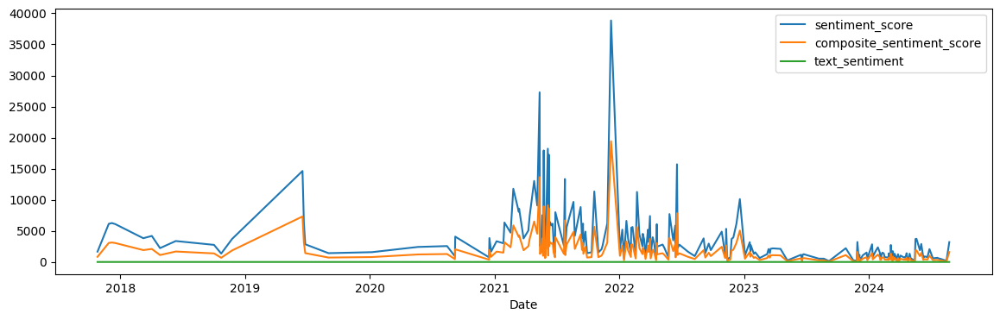

In [27]:
aggregated_sentiment[['sentiment_score','composite_sentiment_score','text_sentiment']].plot(figsize=(all_plots_size))

array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>], dtype=object)

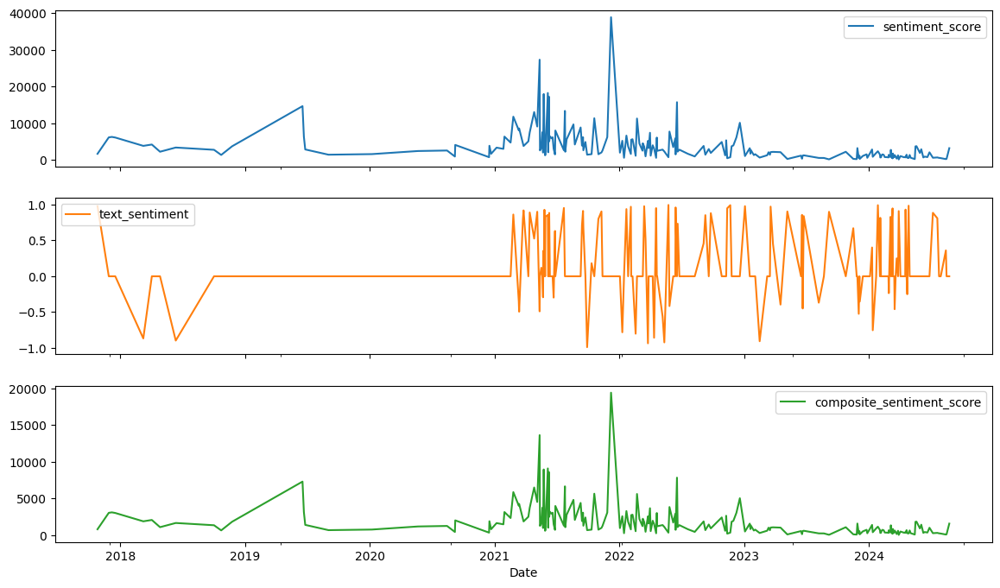

In [28]:
aggregated_sentiment.plot(figsize=((14,8)),subplots=True)

In [29]:
import pandas as pd

def add_features(df):
    """
    Add various features to the aggregated sentiment DataFrame.
    
    Parameters:
    df (pd.DataFrame): The aggregated sentiment DataFrame with 'sentiment_score', 'text_sentiment', and 'composite_sentiment_score'.
    
    Returns:
    pd.DataFrame: The DataFrame with additional features.
    """
    # Ensure 'Date' is a datetime object
    df.index = pd.to_datetime(df.index)
    
    # Calculate rolling averages
    df['7_day_avg_sentiment'] = df['sentiment_score'].rolling(window=7).mean()
    df['30_day_avg_sentiment'] = df['sentiment_score'].rolling(window=30).mean()

    # Calculate sentiment volatility (standard deviation)
    df['7_day_sentiment_volatility'] = df['sentiment_score'].rolling(window=7).std()
    df['30_day_sentiment_volatility'] = df['sentiment_score'].rolling(window=30).std()

    # Calculate sentiment momentum (difference between today and yesterday)
    df['sentiment_momentum'] = df['sentiment_score'].diff()

    # Calculate composite sentiment volatility
    df['7_day_composite_volatility'] = df['composite_sentiment_score'].rolling(window=7).std()
    df['30_day_composite_volatility'] = df['composite_sentiment_score'].rolling(window=30).std()

    # Calculate composite sentiment momentum
    df['composite_momentum'] = df['composite_sentiment_score'].diff()
    
    # Remove any rows with NaN values resulting from rolling operations
    df = df.dropna()

    return df


In [30]:
# Apply the feature engineering function
enhanced_sentiment_data = add_features(aggregated_sentiment)

In [31]:
enhanced_sentiment_data.head(2)

,sentiment_score,text_sentiment,composite_sentiment_score,7_day_avg_sentiment,30_day_avg_sentiment,7_day_sentiment_volatility,30_day_sentiment_volatility,sentiment_momentum,7_day_composite_volatility,30_day_composite_volatility,composite_momentum
Date,,,,,,,,,,,
2021-03-13,8566.0,-0.4939,4282.75305,6545.000000,4346.933333,3160.802219,3195.406962,494.0,1580.479481,1597.712738,246.92835
2021-03-24,4603.5,0.7950,2302.14750,6726.214286,4445.150000,2977.120419,3154.902226,-3962.5,1488.596100,1577.476496,-1980.60555


In [32]:
enhanced_sentiment_data.shape

(183, 11)

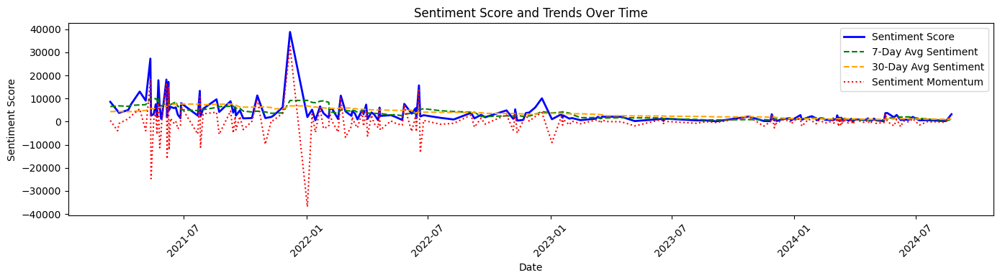

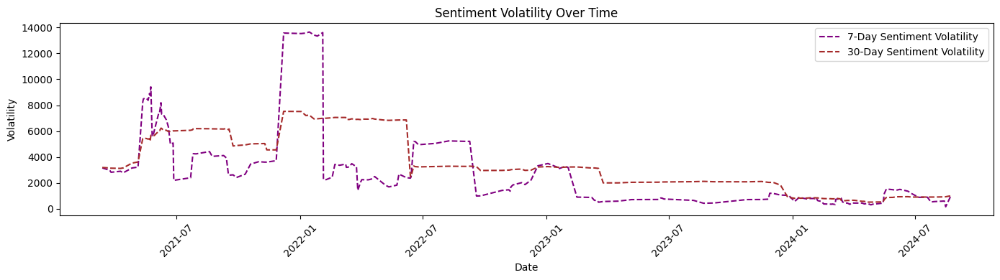

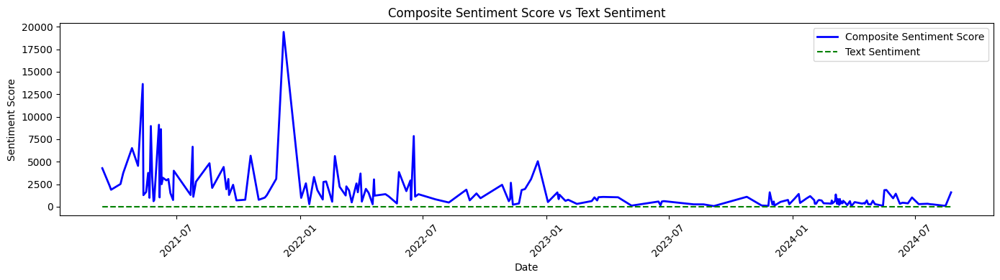

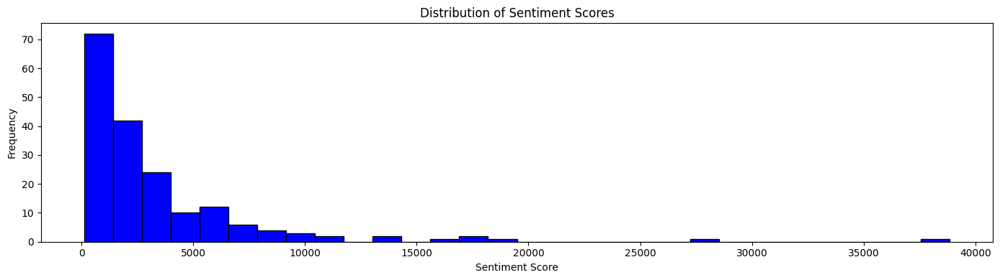

In [33]:
# Call the functions with the enhanced sentiment data
plot_sentiment_timeseries(enhanced_sentiment_data)
plot_sentiment_volatility(enhanced_sentiment_data)
plot_composite_vs_text_sentiment(enhanced_sentiment_data)
plot_sentiment_histogram(enhanced_sentiment_data)


In [34]:
daily_sentiment

,Date,sentiment_score
0,2017-10-26,1657.0
1,2017-11-28,6135.0
2,2017-12-07,6259.0
3,2017-12-17,6091.0
4,2018-03-09,3820.0
...,...,...
207,2024-07-26,537.0
208,2024-07-29,489.0
209,2024-08-13,223.0
210,2024-08-15,288.0


### `extra data download and processing(cryptocompare socials)`

In [35]:
import requests
def fetch_social_data(coin_id, api_key):
    try:
        # url = f"https://min-api.cryptocompare.com/data/social/coin/latest?coinId={coin_id}"
        url = f"https://min-api.cryptocompare.com/data/social/coin/histo/day"
        headers = {
            'Authorization': f'Apikey {api_key}'
        }
        response = requests.get(url, headers=headers)

        if response.status_code == 200:
            return response.json()
        else:
            print(f"Error fetching social data for coin ID {coin_id}: {response.status_code}, {response.text}")
            return None
    except Exception as e:
        print(f"An error occurred while fetching social data for coin ID {coin_id}: {str(e)}")
        return None

def process_social_data(ticker_pairs, api_key):
    # Fetch coin IDs
    # coin_ids = fetch_coin_ids(api_key)

    social_data_list = []
    for ticker in ticker_pairs:
        try:
            symbol = ticker.split('/')[0]

            # if symbol in coin_ids:
            social_data = fetch_social_data(symbol, api_key)

            if social_data and 'Data' in social_data:
                    social_data_list.append({
                        "ticker_pair": ticker,
                        "twitter_followers": social_data['Data']['Twitter'].get('followers', None),
                        "reddit_subscribers": social_data['Data']['Reddit'].get('subscribers', None),
                        "code_repo_stars": social_data['Data']['CodeRepository'].get('Points', None),
                        # Add other fields as needed
                })
            else:
                print(f"No social data found for ticker: {ticker}")
                social_data_list.append({
                        "ticker_pair": ticker,
                        "twitter_followers": None,
                        "reddit_subscribers": None,
                        "code_repo_stars": None,
                        # Add other fields as needed
                })

        except Exception as e:
            print(f"An error occurred while processing ticker {ticker}: {str(e)}")
            social_data_list.append({
                "ticker_pair": ticker,
                "twitter_followers": None,
                "reddit_subscribers": None,
                "code_repo_stars": None,
                # Add other fields as needed
            })

    # Create DataFrame from the collected data
    social_df = pd.DataFrame(social_data_list)
    return social_df


In [36]:
import requests
import pandas as pd
from datetime import datetime

def fetch_social_data(coin_id, api_key, limit=2000):
    try:
        url = "https://min-api.cryptocompare.com/data/social/coin/histo/day"
        params = {
            'coinId': coin_id,
            'limit': limit
        }
        headers = {
            'Authorization': f'Apikey {api_key}'
        }
        
        response = requests.get(url, headers=headers, params=params)
        
        if response.status_code == 200:
            return response.json().get('Data', [])
        else:
            print(f"Error fetching social data for coin ID {coin_id}: {response.status_code}, {response.text}")
            return None
    except Exception as e:
        print(f"An error occurred while fetching social data for coin ID {coin_id}: {str(e)}")
        return None

def process_social_data(data):
    # Convert to DataFrame
    df = pd.DataFrame(data)
    
    # Convert timestamp to datetime
    df['Date'] = pd.to_datetime(df['time'], unit='s')
    
    # Drop the 'time' column as it's redundant
    df.drop(columns=['time'], inplace=True)
    
    # Setting 'Date' as index
    df.set_index('Date', inplace=True)
    
    return df

# Example usage
coin_id = 1182  # Example Coin ID for Bitcoin
# api_key = 'your_api_key_here'  # Replace with your actual API key
api_key = 'fbce8b1c470e0ef8530b34967d0b8206c0b8c21d2d91e66d0f0c19e7b3e0ebd8'
social_data = fetch_social_data(coin_id, api_key)
processed_social_data = process_social_data(social_data)

# if social_data:
#     processed_data = process_social_data(social_data)
#     print(processed_data.head())
# else:
#     print("No data fetched.")


In [37]:
processed_social_data.head(2)

,twitter_followers,twitter_following,twitter_lists,twitter_favourites,twitter_statuses,reddit_subscribers,reddit_active_users,reddit_posts_per_hour,reddit_posts_per_day,reddit_comments_per_hour,reddit_comments_per_day,code_repo_stars,code_repo_forks,code_repo_subscribers,code_repo_open_pull_issues,code_repo_closed_pull_issues,code_repo_open_issues,code_repo_closed_issues,code_repo_contributors
Date,,,,,,,,,,,,,,,,,,,
2019-03-06,0.0,0.0,0.0,0.0,0.0,1021047,4067,4.92,118.08,84.15,2019.64,44945,25634,4172,12081,12081,923.0,5275,0
2019-03-07,0.0,0.0,0.0,0.0,0.0,1021202,3816,4.98,119.54,101.64,2439.30,44949,25635,4172,12087,12087,925.0,5276,0


In [38]:
def derive_social_metrics(df):
    # Reddit Engagement Score
    df['Reddit_Engagement_Score'] = df['reddit_active_users'] * (
        (df['reddit_posts_per_day'] + df['reddit_comments_per_day']) / df['reddit_subscribers'].replace(0, 1)
    )
    
    # Code Repository Activity Score
    df['Code_Repo_Activity_Score'] = df['code_repo_stars'] + df['code_repo_forks'] + df['code_repo_contributors']
    
    # Twitter Engagement Score
    df['Twitter_Engagement_Score'] = df['twitter_followers'] * (
        (df['twitter_statuses'] + df['twitter_lists']) / 1000
    )
    
    # Combined Social Sentiment Score
    df['Overall_Social_Sentiment_Score'] = (df['Reddit_Engagement_Score'] + df['Code_Repo_Activity_Score'] + df['Twitter_Engagement_Score']) / 3
    
    return df


In [39]:

processed_social_data = derive_social_metrics(processed_social_data)

print('process_social_data:')
processed_social_data = processed_social_data[['Reddit_Engagement_Score', 'Code_Repo_Activity_Score', 'Twitter_Engagement_Score', 'Overall_Social_Sentiment_Score']]

processed_social_data


process_social_data:


,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score
Date,,,,
2019-03-06,8.514894,70579,0.000000e+00,2.352917e+04
2019-03-07,9.561804,70584,0.000000e+00,2.353119e+04
2019-03-08,6.691830,1415,0.000000e+00,4.738973e+02
2019-03-09,5.782525,70627,0.000000e+00,2.354426e+04
2019-03-10,7.805681,70631,0.000000e+00,2.354627e+04
...,...,...,...,...
2024-08-22,0.000000,114677,3.233567e+08,1.078238e+08
2024-08-23,0.000000,114690,3.233986e+08,1.078378e+08
2024-08-24,0.000000,114692,3.235759e+08,1.078969e+08


In [40]:
# api_key = 'fbce8b1c470e0ef8530b34967d0b8206c0b8c21d2d91e66d0f0c19e7b3e0ebd8'
# ticker_pairs = ['BTC/USDT', 'ETH/USDT', 'NONEXISTENT/USDT']
# social_df = process_social_data(ticker_pairs, api_key)

### `extra data download and processing(google trends)`

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
from pytrends.request import TrendReq
import numpy as np

In [42]:
# from pytrends.request import TrendReq

# pytrends = TrendReq(hl='en-US', tz=360)

In [43]:
# pytrends.get_historical_interest(kw_list, year_start=2018, month_start=1, day_start=1, hour_start=0, year_end=2018, month_end=2, day_end=1, hour_end=0, cat=0, geo='', gprop='', sleep=0)

In [44]:
# Collect Google Trends data
def fetch_google_trends(keywords, start_date, end_date):
    pytrends = TrendReq(hl='en-US', tz=360)
    pytrends.build_payload(keywords, cat=0, timeframe=f'{start_date} {end_date}', geo='', gprop='')
    trends_data = pytrends.interest_over_time()
    return trends_data

# Example keywords and dates
keywords = ['Bitcoin', 'Cryptocurrency']
google_trends_data = fetch_google_trends(keywords, start_date, end_date)


/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pytrends/request.py:260: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.fillna(False)


In [45]:
start_date, end_date

('2019-01-01', '2024-08-15')

In [46]:
google_trends_data

,Bitcoin,Cryptocurrency,isPartial
date,,,
2019-01-01,14,1,False
2019-02-01,14,1,False
2019-03-01,13,1,False
2019-04-01,18,1,False
2019-05-01,25,2,False
...,...,...,...
2024-04-01,46,1,False
2024-05-01,32,1,False
2024-06-01,28,1,False


<Axes: xlabel='date'>

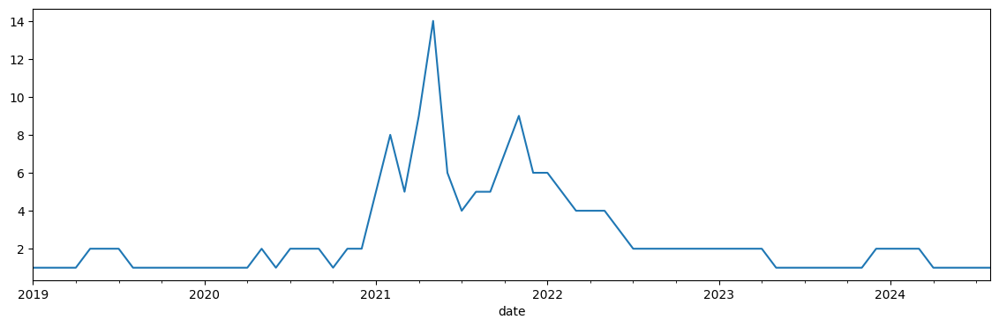

In [47]:
google_trends_data['Cryptocurrency'].plot(figsize=all_plots_size)

<Axes: xlabel='date'>

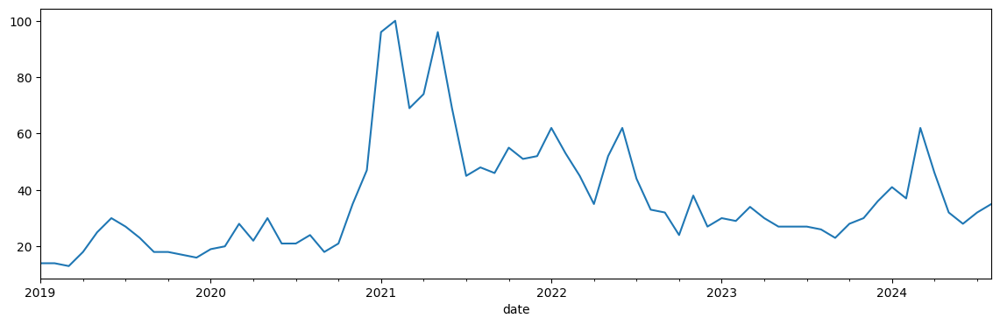

In [48]:
google_trends_data['Bitcoin'].plot(figsize=all_plots_size)

### `extra data download and processing(Fear and Greed)`

In [49]:
# Function to fetch historical Fear and Greed Index data
def fetch_fear_and_greed_data(start_date, end_date):
    base_url = "https://production.dataviz.cnn.io/index/fearandgreed/graphdata/"
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3"}
    response = requests.get(base_url + start_date, headers=headers)
    data = response.json()
    # historical_data = data['fear_and_greed_historical']['data']
    # df = pd.DataFrame(historical_data)
    # df['timestamp'] = pd.to_datetime(df['x'], unit='ms')
    # df = df.set_index('timestamp')
    return data

# start_date = '2020-09-19'
# end_date = '2024-04-10'
# start_date = "2018-09-19"
# end_date = "2024-04-22"
# Fetch Fear and Greed Index data
fear_and_greed_df = fetch_fear_and_greed_data(start_date, end_date)

In [50]:
fear_and_greed_df

{'statusCode': 500, 'error': 'Internal Server Error'}

### `extra data processing(google trends and cccompare socials)`

In [51]:
def merge_social_and_trend_data(social_data, trends_data):
    """
    Merge social sentiment data with Google Trends data based on date.

    Parameters:
    social_data (DataFrame): The processed social data.
    trends_data (DataFrame): The Google Trends data.

    Returns:
    DataFrame: Merged data.
    """
    merged_data = social_data.merge(trends_data, left_index=True, right_index=True, how='inner')
    return merged_data


In [52]:
def create_features(merged_data):
    """
    Create new features based on merged data.

    Parameters:
    merged_data (DataFrame): The merged social and trend data.

    Returns:
    DataFrame: Data with new features.
    """
    merged_data['Combined_Social_Trend_Score'] = merged_data['Overall_Social_Sentiment_Score'] * (merged_data['Bitcoin'] + merged_data['Cryptocurrency'])
    merged_data['Social_Sentiment_Growth'] = merged_data['Overall_Social_Sentiment_Score'].pct_change()
    merged_data['Google_Trends_Growth'] = merged_data[['Bitcoin', 'Cryptocurrency']].mean(axis=1).pct_change()
    return merged_data


In [53]:

def visualize_data(merged_data, figsize=all_plots_size):
    """
    Visualize the relationship between social sentiment and Google Trends data.

    Parameters:
    merged_data (DataFrame): The data with features.

    Returns:
    None: Displays the plot.
    """
    plt.figure(figsize=(figsize))
    plt.plot(merged_data.index, merged_data['Combined_Social_Trend_Score'], label='Combined Social-Trend Score')
    plt.plot(merged_data.index, merged_data['Overall_Social_Sentiment_Score'], label='Overall Social Sentiment Score', linestyle='--')
    plt.plot(merged_data.index, merged_data['Bitcoin'], label='Google Trends - Bitcoin', linestyle='-.')
    plt.xlabel('Date')
    plt.ylabel('Score')
    plt.title('Social Sentiment and Google Trends over Time')
    plt.legend()
    plt.show()


In [54]:

def visualize_data_with_dual_axes(merged_data, figsize=all_plots_size):
    """
    Visualize the relationship between social sentiment and Google Trends data on opposite y-axes.

    Parameters:
    merged_data (DataFrame): The data with features.

    Returns:
    None: Displays the plot with dual y-axes.
    """
    fig, ax1 = plt.subplots(figsize=(figsize))

    # Plotting on the primary y-axis
    ax1.plot(merged_data.index, merged_data['Combined_Social_Trend_Score'], label='Combined Social-Trend Score', color='b')
    ax1.plot(merged_data.index, merged_data['Overall_Social_Sentiment_Score'], label='Overall Social Sentiment Score', linestyle='--', color='g')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Social Scores', color='b')
    ax1.tick_params(axis='y', labelcolor='b')

    # Create a secondary y-axis
    ax2 = ax1.twinx()
    ax2.plot(merged_data.index, merged_data['Bitcoin'], label='Google Trends - Bitcoin', linestyle='-.', color='r')
    ax2.set_ylabel('Google Trends Score', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    # Adding title and legends
    fig.suptitle('Social Sentiment and Google Trends over Time')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')

    plt.show()


In [55]:
process_social_data

<function __main__.process_social_data(data)>

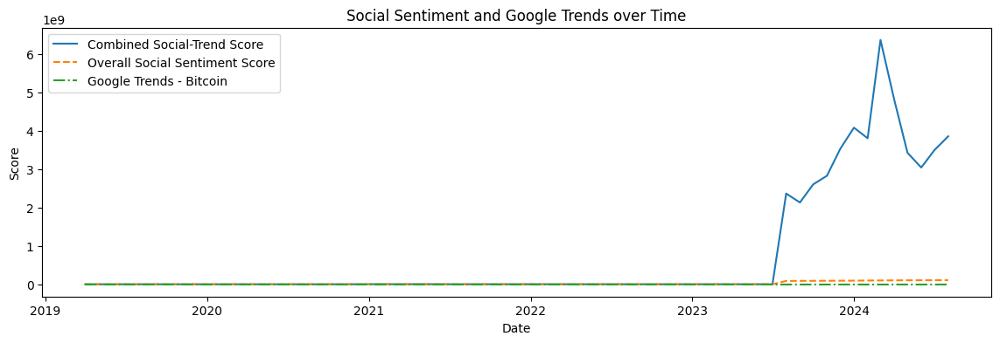

In [56]:
# Step 1: Merge the data
merged_data = merge_social_and_trend_data(processed_social_data, google_trends_data)

# Step 2: Create features
merged_socials_data = create_features(merged_data)

# Step 3: Visualize the data
visualize_data(merged_socials_data)


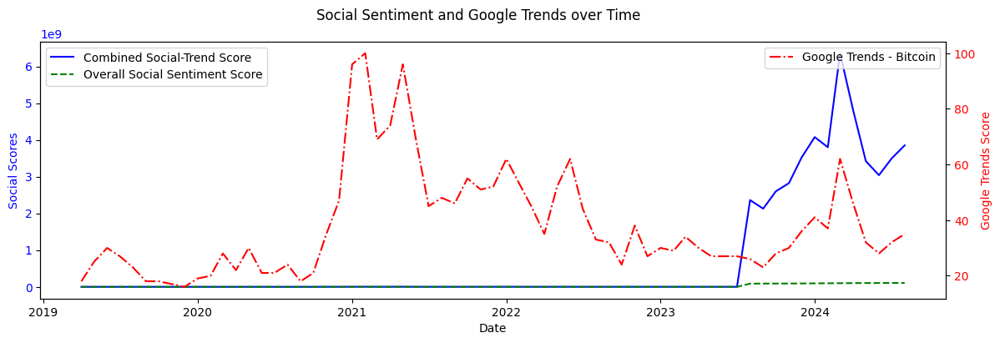

In [57]:
visualize_data_with_dual_axes(merged_socials_data)

In [58]:
merged_socials_data.head(2)

,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score,Bitcoin,Cryptocurrency,isPartial,Combined_Social_Trend_Score,Social_Sentiment_Growth,Google_Trends_Growth
2019-04-01,8.368652,71179,0.0,23729.122884,18,1,False,450853.334795,NaN,NaN
2019-05-01,6.363399,72136,0.0,24047.454466,25,2,False,649281.270588,0.013415,0.421053


### `ctyptocompate-gate data`

In [59]:
ccompare_gate_bchain_merged_df = pd.read_parquet('../data_outputs/ccompare_gate_bchain_merged_df.parquet', engine='fastparquet')
ccompare_gate_bchain_merged_df.drop(columns='VolumeFrom', inplace=True) # base currency, say ETH, BTC, FET, etc
ccompare_gate_bchain_merged_df.rename(columns={'VolumeTo':'Volume'},inplace=True) # quote currency (USDT) 
ccompare_gate_bchain_merged_df.index.rename('Date', inplace=True) 
ccompare_gate_bchain_merged_df.drop_duplicates()
ccompare_gate_bchain_merged_df.sort_index(inplace=True)

In [60]:
ccompare_gate_bchain_merged_df['Ticker'].nunique()

153

In [61]:
ccompare_gate_bchain_merged_df['Ticker'].unique()

array(['ABT/USDT', 'ANKR/USDT', 'NEXT/USDT', 'NMR/USDT', 'NULS/USDT',
       'OAX/USDT', 'OCN/USDT', 'NEXO/USDT', 'AMB/USDT', 'OLT/USDT',
       'OMG/USDT', 'ORBS/USDT', 'OST/USDT', 'AIT/USDT', 'PAY/USDT',
       'OLE/USDT', 'PNT/USDT', 'NCT/USDT', 'MVL/USDT', 'LOOM/USDT',
       'LPT/USDT', 'LRC/USDT', 'LTC/USDT', 'LTO/USDT', 'AST/USDT',
       'NAS/USDT', 'MANA/USDT', 'MDS/USDT', 'METAL/USDT', 'MITH/USDT',
       'ANT/USDT', 'MKR/USDT', 'MLN/USDT', 'MDA/USDT', 'POWR/USDT',
       'PPT/USDT', 'PRO/USDT', 'SKM/USDT', 'SMT/USDT', 'SNM/USDT',
       'SNT/USDT', 'SNTR/USDT', 'SNX/USDT', 'ADX/USDT', 'STAR/USDT',
       'STORJ/USDT', 'ACE/USDT', 'STX/USDT', 'SUSD/USDT', 'SWFTC/USDT',
       'TCT/USDT', 'ADA/USDT', 'SHPING/USDT', 'SENC/USDT', 'SALT/USDT',
       'AGI/USDT', 'PST/USDT', 'QASH/USDT', 'QKC/USDT', 'QSP/USDT',
       'RCN/USDT', 'REF/USDT', 'REM/USDT', 'AERGO/USDT', 'REP/USDT',
       'AE/USDT', 'REQ/USDT', 'RFR/USDT', 'RLC/USDT', 'RUFF/USDT',
       'LION/USDT', 'LINK/USDT', 'AS

In [62]:
ccompare_gate_bchain_merged_df['Market Cap'] = ccompare_gate_bchain_merged_df['Close'] * ccompare_gate_bchain_merged_df['Current Supply']
# ccompare_gate_bchain_merged_df_cleaned['Market Cap'] = ccompare_gate_bchain_merged_df_cleaned['Close'] * ccompare_gate_bchain_merged_df_cleaned['Current Supply']
top_10_by_marketcap_merged = ccompare_gate_bchain_merged_df.groupby('Ticker')['Market Cap'].mean().nlargest(10)
# top_10_by_marketcap_merged_cleaned = ccompare_gate_bchain_merged_df_cleaned.groupby('Ticker')['Market Cap'].mean().nlargest(10)

In [63]:
top_10_by_vol_merged = ccompare_gate_bchain_merged_df.groupby('Ticker')['Volume'].mean().nlargest(10)
# top_10_by_vol_merged_cleaned = ccompare_gate_bchain_merged_df_cleaned.groupby('Ticker')['Volume'].mean().nlargest(10)


In [64]:
top_10_by_vol_merged

Ticker
EDG/USDT     1.125098e+14
AST/USDT     5.694719e+09
BTC/USDT     4.362782e+09
ETH/USDT     2.249283e+09
DOGE/USDT    4.157764e+08
BCH/USDT     3.625393e+08
LTC/USDT     2.795085e+08
ADA/USDT     2.608224e+08
ETC/USDT     2.050600e+08
LINK/USDT    1.626623e+08
Name: Volume, dtype: float64

- YFINANCE WEBSITE:
1. BTC-USD

Symbol	Company Name	Last Price	Change	% Change	Market Time	Volume	Avg Vol (3 month)	Market Cap
BTC-USD	Bitcoin USD	59061.92	-504.89	-0.85%	5:47 PM UTC	24.72B	29.74B	1,166.01B
ETH-USD	Ethereum USD	2610.6458	-45.07	-1.70%	5:46 PM UTC	11.48B	16.86B	314.03B
USDT-USD	Tether USDt USD	1.0002419	-0.00	-0.01%	5:46 PM UTC	45.20B	57.81B	116.92B
BNB-USD	BNB USD	552.26447	+15.48	+2.88%	5:46 PM UTC	1.61B	1.92B	80.60B
SOL-USD	Solana USD	144.05391	-1.18	-0.81%	5:46 PM UTC	1.97B	2.84B	67.16B
USDC-USD	USD Coin USD	0.9999919	-0.00	-0.01%	5:46 PM UTC	4.62B	6.01B	34.99B
XRP-USD	XRP USD	0.60212284	+0.03	+5.47%	5:47 PM UTC	1.34B	1.44B	33.79B
TON11419-USD	Toncoin USD	6.8335657	+0.19	+2.93%	5:42 PM UTC	478.13M	313.73M	17.24B
DOGE-USD	Dogecoin USD	0.10118201	-0.00	-1.22%	5:47 PM UTC	468.42M	924.95M	14.73B
TRX-USD	TRON USD	0.14031595	+0.01	+4.13%	5:46 PM UTC	488.44M	305.98M	12.20B
ADA-USD	Cardano USD	0.33552623	-0.00	-0.71%	5:46 PM UTC	195.34M	350.02M	12.06B
WBTC-USD	Wrapped Bitcoin USD	59072.168	-566.51	-0.95%	5:42 PM UTC	224.53M	283.64M	9.12B
WETH-USD	WETH USD	2600.9912	-60.38	-2.27%	5:43 PM UTC	592.89M	1.02B	8.78B
BCH-USD	Bitcoin Cash USD	337.32355	-2.41	-0.71%	5:46 PM UTC	169.61M	297.33M	6.66B
LINK-USD	Chainlink USD	10.085694	-0.29	-2.80%	5:46 PM UTC	173.11M	346.77M	6.13B
LTC-USD	Litecoin USD	66.57455	-0.59	-0.87%	5:47 PM UTC	248.28M	336.79M	4.99B
MATIC-USD	Polygon USD	0.42556825	+0.01	+2.43%	5:46 PM UTC	180.56M	257.04M	4.24B
PEPE24478-USD	Pepe USD	0.000007654369	+0.00	+2.61%	5:42 PM UTC	476.31M	1.12B	3.22B
FDUSD-USD	-	1.0006982	-0.00	-0.02%	5:42 PM UTC	3.60B	5.08B	2.34B
SUI20947-USD	Sui USD	0.8796629	+0.04	+5.21%	5:42 PM UTC	221.16M	179.23M	2.28B
WIF-USD	dogwifhat USD	1.4094718	-0.03	-2.21%	5:43 PM UTC	257.46M	504.42M	1.41B
NOT-USD	Notcoin USD	0.010687172	-0.00	-2.32%	5:42 PM UTC	251.92M	548.33M	1.10B
VBNB-USD	-	13.530289	+0.45	+3.44%	5:42 PM UTC	835.18M	-	835.18M
VBTC-USD	-	1201.251	-13.57	-1.12%	5:42 PM UTC	658.14M	-	247.26M
SOL16116-USD	Wrapped Solana USD	144.78178	-0.37	-0.25%	5:42 PM UTC	640.22M	944.47M	187.75M
RARE11294-USD	SuperRare USD	0.21732485	-0.08	-26.28%	5:42 PM UTC	422.71M	23.69M	154.10M
SYS-USD	Syscoin USD	0.15954523	+0.06	+55.80%	5:46 PM UTC	207.62M	2.58M	126.45M
DAR-USD	Mines of Dalarnia USD	0.16940418	-0.01	-4.65%	5:42 PM UTC	1.31B	43.07M	103.54M
ARPA-USD	ARPA USD	0.040618632	+0.01	+17.12%	5:42 PM UTC	231.51M	9.95M	59.28M
VUSDT-USD	-	0.024222277	+0.00	+0.03%	5:42 PM UTC	284.47M	-	36.00M


In [65]:
top_10_by_marketcap_merged

Ticker
SMT/USDT      2.771846e+56
BTC/USDT      5.515442e+11
ETH/USDT      1.938527e+11
ADA/USDT      1.590213e+10
ATM/USDT      1.478602e+10
DOGE/USDT     1.132681e+10
BCH/USDT      7.234769e+09
LTC/USDT      6.459401e+09
LINK/USDT     5.624171e+09
MATIC/USDT    5.266053e+09
Name: Market Cap, dtype: float64

### `yfinance-all data`

In [66]:
# yfinance data
yfinance_all_df = pd.read_parquet('../data_outputs/yfinance_all_df.parquet', engine='fastparquet')
yfinance_all_df.drop_duplicates()

yfinance_all_df

,Open,High,Low,Close,Volume,Ticker
Date,,,,,,
2021-04-01 00:00:00,0.737261,0.737489,0.666090,0.730808,3026388,10SET-USD
2021-04-02 00:00:00,0.734999,1.591740,0.732162,1.515820,6055500,10SET-USD
2021-04-03 00:00:00,1.519680,2.528684,1.517770,1.894902,12456785,10SET-USD
2021-04-04 00:00:00,1.888420,3.104582,1.695171,2.899379,11536672,10SET-USD
2021-04-05 00:00:00,2.896329,4.262810,2.820191,3.578173,16051682,10SET-USD
...,...,...,...,...,...,...
2024-08-06 15:00:00,28200.000000,28200.000000,28200.000000,28200.000000,100,8301.T
2024-08-07 15:00:00,28000.000000,28000.000000,28000.000000,28000.000000,100,8301.T
2024-08-08 15:00:00,28000.000000,28000.000000,28000.000000,28000.000000,0,8301.T


In [67]:
yfinance_all_df['Ticker'].unique()

array(['10SET-USD', '1ART-USD', '1CAT-USD', ..., 'HYG', 'Topix', '8301.T'],
      dtype=object)

### trad market and others

In [68]:

cpi_df = pd.read_parquet('../data_outputs/cpi.parquet')
cpi_df.drop_duplicates()

dxy_df = pd.read_parquet('../data_outputs/dxy.parquet')
dxy_df.drop_duplicates()

fed_funds_rate_df = pd.read_parquet('../data_outputs/fed_funds_rate.parquet')
fed_funds_rate_df.drop_duplicates()

gdp_df = pd.read_parquet('../data_outputs/gdp.parquet')
gdp_df.drop_duplicates()

trad_mkt_df = pd.read_parquet('../data_outputs/trad_market_df.parquet')
trad_mkt_df.index = pd.to_datetime(trad_mkt_df.index).tz_localize(None)
trad_mkt_df.drop_duplicates()

treasury_yields_df = pd.read_parquet('../data_outputs/treasury_yield.parquet')
treasury_yields_df.drop_duplicates()

,DGS10
DATE,
2019-01-01,NaN
2019-01-02,2.66
2019-01-03,2.56
2019-01-04,2.67
2019-01-07,2.70
...,...
2024-05-16,4.38
2024-05-22,4.43
2024-05-24,4.46


## 3. Visualizations (Overview)

In [69]:
ccompare_gate_bchain_merged_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap
Date,,,,,,,,,,,,,,
2019-02-22,0.0752,0.0779,0.075,0.07555,49221.43,ABT/USDT,38,27,0,12198.261715,NaN,NaN,1.859933e+08,1.405180e+07
2019-02-22,0.0000,0.0000,0.000,0.00000,0.00,ANKR/USDT,0,0,0,0.000000,NaN,NaN,1.000000e+10,0.000000e+00


In [70]:
trad_mkt_df.head(2)

,Open,High,Low,Close,Volume,Ticker
Date,,,,,,
2019-01-02,3.240214,3.434666,3.225580,3.378612,508752000,NVDA
2019-01-03,3.318341,3.352320,3.167045,3.174486,705552000,NVDA


    nvda_data_trad_gate = trad_gate_merged_df[trad_gate_merged_df['Ticker'] == 'NVDA']
    sp500_data_trad_gate = trad_gate_merged_df[trad_gate_merged_df['Ticker'] == '^GSPC']
    vol_index_trad_gate = trad_gate_merged_df[trad_gate_merged_df['Ticker'] == '^VIX']
    jpy_exch__trad_gate = trad_gate_merged_df[trad_gate_merged_df['Ticker'] == 'JPY=X']
    boj__trad_gate = trad_gate_merged_df[trad_gate_merged_df['Ticker'] == '8301.T']
    gold_trad_gate = trad_gate_merged_df[trad_gate_merged_df['Ticker'] == 'GC=F']

In [71]:
# traditional market
nvidia_trad_mkt_df = trad_mkt_df[trad_mkt_df['Ticker'] == 'NVDA'] # Nvidia
boj_trad_mkt_df = trad_mkt_df[trad_mkt_df['Ticker'] == '8301.T'] # Bank of Japan
sp500_trad_mkt_df = trad_mkt_df[trad_mkt_df['Ticker'] == '^GSPC'] # S&P500
jpy_exch_trad_mkt_df = trad_mkt_df[trad_mkt_df['Ticker'] == 'JPY=X'] # JPY/USD
vol_index_trad_mkt_df = trad_mkt_df[trad_mkt_df['Ticker'] == '^VIX'] # volatility index
gold_trad_mkt_df = trad_mkt_df[trad_mkt_df['Ticker'] == 'GC=F'] # Gold

# cryptocurrency market
btc_merged_data = ccompare_gate_bchain_merged_df[ccompare_gate_bchain_merged_df['Ticker'] == 'BTC/USDT']
fet_merged_data = ccompare_gate_bchain_merged_df[ccompare_gate_bchain_merged_df['Ticker'] == 'FET/USDT']
numerai_merged_data = ccompare_gate_bchain_merged_df[ccompare_gate_bchain_merged_df['Ticker'] == 'NMR/USDT']

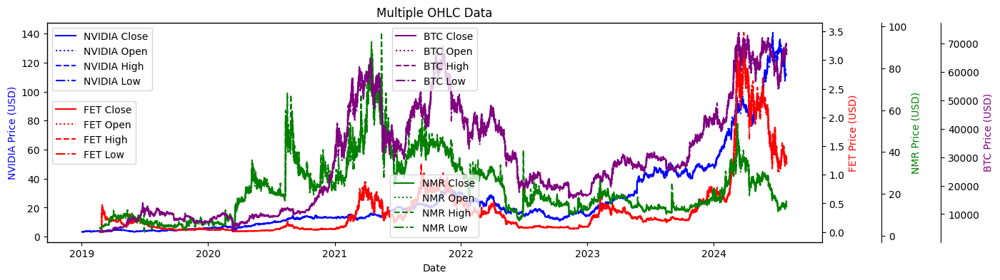

In [72]:
dfs = [nvidia_trad_mkt_df, fet_merged_data, numerai_merged_data, btc_merged_data]
titles = "Multiple OHLC Data"
ylabels = ["NVIDIA Price (USD)", "FET Price (USD)", "NMR Price (USD)", "BTC Price (USD)"]
locs = ["upper left", "center left", 'lower center', 'upper center' ]
# 'best', 'upper right', 'upper left', 'lower left', 'lower right', 'right', 'center left', 'center right', 'lower center', 'upper center', 'center'


# Assuming you want to pass explicit labels:
df_labels = ['NVIDIA', 'FET', 'NMR','BTC']

plot_multiple_axis_ohlc(dfs, titles, ylabels, locs, df_labels=df_labels, figsize=(all_plots_size))

In [73]:
btc_merged_data.head(1)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap
Date,,,,,,,,,,,,,,
2019-02-22,3937.63,3984.77,3931.65,3965.16,9.116206e+08,BTC/USDT,765893,350306,6323,3.928628,4.855744e+07,6.061519e+12,1.755290e+07,6.960004e+10


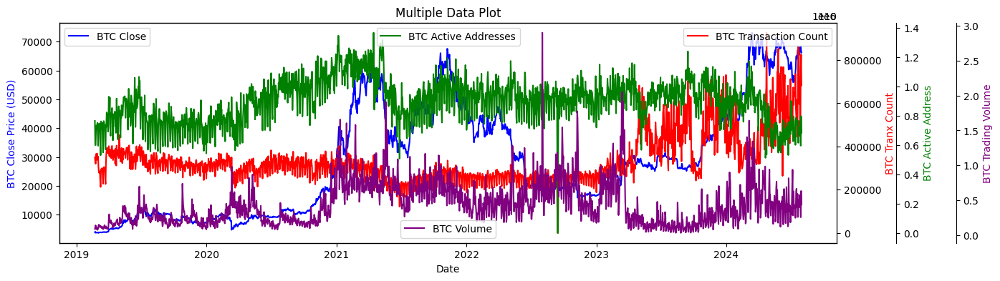

In [74]:
# dfs = [nvidia_trad_mkt_df, fet_merged_data, btc_merged_data]
dfs = [btc_merged_data, btc_merged_data, btc_merged_data, btc_merged_data]
# y_columns = ['Close', 'Close', 'Close']
y_columns = ['Close', 'Transaction Count', 'Active Addresses', 'Volume']
titles = "Multiple Data Plot"
ylabels = ["BTC Close Price (USD)", "BTC Tranx Count", "BTC Active Address", 'BTC Trading Volume']
locs = ["upper left", "upper right", "upper center", "lower center"]

# pass explicit labels:
df_labels = ['BTC', 'BTC', 'BTC','BTC']
# df_labels = ['NVIDIA', 'FET', 'BTC']

plot_multiple_columns(dfs, y_columns, titles, ylabels, locs, df_labels=df_labels, figsize=all_plots_size)

So much in the data, we need rolling averages to make them clearer.

## 4. Modeling

### 4.1 CAPM

In [75]:
ccompare_gate_bchain_merged_df

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap
Date,,,,,,,,,,,,,,
2019-02-22,0.075200,0.077900,0.075000,0.075550,49221.43,ABT/USDT,38,27,0,1.219826e+04,NaN,NaN,1.859933e+08,1.405180e+07
2019-02-22,0.000000,0.000000,0.000000,0.000000,0.00,ANKR/USDT,0,0,0,0.000000e+00,NaN,NaN,1.000000e+10,0.000000e+00
2019-02-22,0.000000,0.000000,0.000000,0.000000,0.00,NEXT/USDT,2,1,1,2.000000e+09,NaN,NaN,2.000000e+09,0.000000e+00
2019-02-22,3.685000,3.719000,3.599000,3.657000,96870.45,NMR/USDT,23,27,0,3.077177e+02,NaN,NaN,7.931157e+06,2.900424e+07
2019-02-22,0.445600,0.448500,0.427600,0.437800,162386.75,NULS/USDT,2,1,0,7.138458e+01,NaN,NaN,4.000000e+07,1.751200e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-30,0.076200,0.076780,0.057320,0.067660,45227.29,FSN/USDT,0,0,0,0.000000e+00,NaN,NaN,7.676415e+07,5.193862e+06
2024-07-30,0.003823,0.003831,0.003640,0.003674,2707.40,HPB/USDT,0,0,0,0.000000e+00,NaN,NaN,7.306995e+07,2.684590e+05
2024-07-30,0.394400,0.395400,0.380000,0.384900,8039901.96,ELF/USDT,18,17,0,1.684218e+03,NaN,NaN,7.319026e+08,2.817093e+08


In [76]:
crypto_df = ccompare_gate_bchain_merged_df
market_df = trad_mkt_df

In [77]:
crypto_df

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap
Date,,,,,,,,,,,,,,
2019-02-22,0.075200,0.077900,0.075000,0.075550,49221.43,ABT/USDT,38,27,0,1.219826e+04,NaN,NaN,1.859933e+08,1.405180e+07
2019-02-22,0.000000,0.000000,0.000000,0.000000,0.00,ANKR/USDT,0,0,0,0.000000e+00,NaN,NaN,1.000000e+10,0.000000e+00
2019-02-22,0.000000,0.000000,0.000000,0.000000,0.00,NEXT/USDT,2,1,1,2.000000e+09,NaN,NaN,2.000000e+09,0.000000e+00
2019-02-22,3.685000,3.719000,3.599000,3.657000,96870.45,NMR/USDT,23,27,0,3.077177e+02,NaN,NaN,7.931157e+06,2.900424e+07
2019-02-22,0.445600,0.448500,0.427600,0.437800,162386.75,NULS/USDT,2,1,0,7.138458e+01,NaN,NaN,4.000000e+07,1.751200e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-30,0.076200,0.076780,0.057320,0.067660,45227.29,FSN/USDT,0,0,0,0.000000e+00,NaN,NaN,7.676415e+07,5.193862e+06
2024-07-30,0.003823,0.003831,0.003640,0.003674,2707.40,HPB/USDT,0,0,0,0.000000e+00,NaN,NaN,7.306995e+07,2.684590e+05
2024-07-30,0.394400,0.395400,0.380000,0.384900,8039901.96,ELF/USDT,18,17,0,1.684218e+03,NaN,NaN,7.319026e+08,2.817093e+08


In [78]:
market_df.head(2)

,Open,High,Low,Close,Volume,Ticker
Date,,,,,,
2019-01-02,3.240214,3.434666,3.225580,3.378612,508752000,NVDA
2019-01-03,3.318341,3.352320,3.167045,3.174486,705552000,NVDA


#### 4.1.1 CAPM - Preprocess

In [79]:
missing_data_mkt = market_df.isna().mean() * 100
print(missing_data_mkt.sort_values(ascending=False))

Open      0.0
High      0.0
Low       0.0
Close     0.0
Volume    0.0
Ticker    0.0
dtype: float64


- No missing in the trad mkt dataset

In [80]:
missing_data_crypto = crypto_df.isna().mean() * 100
print(missing_data_crypto.sort_values(ascending=False))

Hashrate                     95.801046
Difficulty                   95.801046
Open                          0.000000
High                          0.000000
Low                           0.000000
Close                         0.000000
Volume                        0.000000
Ticker                        0.000000
Active Addresses              0.000000
Transaction Count             0.000000
Large Transaction Count       0.000000
Average Transaction Value     0.000000
Current Supply                0.000000
Market Cap                    0.000000
dtype: float64


- We will just handle the missing values for the future though CAPM focuses on one of the prices (Close), which is complete here

In [81]:
crypto_df = handle_missing_values(crypto_df)
print('missing values after imputing:', crypto_df.isnull().sum().sum())

missing values after imputing: 0


#### 4.1.2 CAPM - Calculate Returns 

To calculate the returns for the `crypto_df` dataset, you would typically use the `Close` prices of each cryptocurrency pair to calculate the daily returns. The return for a given day is calculated as the percentage change in the `Close` price from the previous day.

- `Step 1`: Sort the DataFrame
We first ensure that the dataFrame is sorted by `Date` and `Ticker` so that the returns are calculated correctly.

- `Step 2`: Group by `Ticker`
Since your DataFrame contains multiple cryptocurrencies (as indicated by the `Ticker` column), we need to group by `Ticker` and calculate the returns for each group separately.

- `Step 3`: Calculate Returns
The return can be calculated using the formula:

$$\
\text{Return}_{t} = \frac{\text{Close}_{t} - \text{Close}_{t-1}}{\text{Close}_{t-1}}
$$\

Or equivalently:

$$\
\text{Return}_{t} = \frac{\text{Close}_{t}}{\text{Close}_{t-1}} - 1
$$\

This can be easily done using the `pct_change()` function in pandas, which computes the percentage change between the current and a prior element.

In [82]:
market_df.head(1)

,Open,High,Low,Close,Volume,Ticker
Date,,,,,,
2019-01-02,3.240214,3.434666,3.22558,3.378612,508752000,NVDA


In [83]:
crypto_df.head(1)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap
Date,,,,,,,,,,,,,,
2019-02-22,0.0752,0.0779,0.075,0.07555,49221.43,ABT/USDT,38,27,0,12198.261715,0.0,0.0,1.859933e+08,1.405180e+07


In [84]:
# Step 1: sort dataFrame
crypto_df = crypto_df.sort_values(by=['Ticker', 'Date'])
market_df = market_df.sort_values(by=['Ticker', 'Date'])

# Step 2: Group by Ticker and calculate daily returns based on 'Close' price
crypto_df['Return'] = crypto_df.groupby('Ticker')['Close'].pct_change()
market_df['Return'] = market_df.groupby('Ticker')['Close'].pct_change()

# Step 3: Handle any initial NaN values after pct_change (which occur because there's no previous day for the first date)
crypto_df = crypto_df.dropna(subset=['Return'])
market_df = market_df.dropna(subset=['Return'])

market_df.index = pd.to_datetime(market_df.index).tz_localize(None)


In [85]:
market_df[['Close','Return','Ticker']]

,Close,Return,Ticker
Date,,,
2019-01-06 10:00:00,37000.000000,0.027778,8301.T
2019-01-07 10:00:00,37000.000000,0.000000,8301.T
2019-01-08 10:00:00,37000.000000,0.000000,8301.T
2019-01-09 10:00:00,36350.000000,-0.017568,8301.T
2019-01-10 10:00:00,36350.000000,0.000000,8301.T
...,...,...,...
2024-07-23 01:00:00,14.720000,-0.012743,^VIX
2024-07-24 01:00:00,18.040001,0.225544,^VIX
2024-07-25 01:00:00,18.459999,0.023281,^VIX


In [86]:
crypto_df[['Close','Return','Ticker']]

,Close,Return,Ticker
Date,,,
2019-02-23,0.08030,0.062872,ABT/USDT
2019-02-24,0.06980,-0.130760,ABT/USDT
2019-02-25,0.07170,0.027221,ABT/USDT
2019-02-26,0.07600,0.059972,ABT/USDT
2019-02-27,0.07476,-0.016316,ABT/USDT
...,...,...,...
2021-01-23,1.92900,0.015798,THETA/USDT
2021-01-24,1.95000,0.010886,THETA/USDT
2021-01-25,2.07500,0.064103,THETA/USDT


In [87]:
market_df[['Close','Return','Ticker']].isnull().sum()

Close     0
Return    0
Ticker    0
dtype: int64

In [88]:
crypto_df[['Close','Return','Ticker']].isnull().sum()

Close     0
Return    0
Ticker    0
dtype: int64

In [89]:
# Calculate returns, using the fractional or percentage change  formula pct_change
# crypto_returns = crypto_df['Close'].pct_change().dropna()
# market_returns = market_df['Close'].pct_change().dropna() 

#### 4.1.3 CAPM - Visualize and Process Calculated Returns (Crypto)

In [90]:
top_10_by_marketcap_merged

Ticker
SMT/USDT      2.771846e+56
BTC/USDT      5.515442e+11
ETH/USDT      1.938527e+11
ADA/USDT      1.590213e+10
ATM/USDT      1.478602e+10
DOGE/USDT     1.132681e+10
BCH/USDT      7.234769e+09
LTC/USDT      6.459401e+09
LINK/USDT     5.624171e+09
MATIC/USDT    5.266053e+09
Name: Market Cap, dtype: float64

- SMT/USDT is obviously an anomaly. We will handle it later by outlier treatment instead of dropping

<Axes: xlabel='Ticker'>

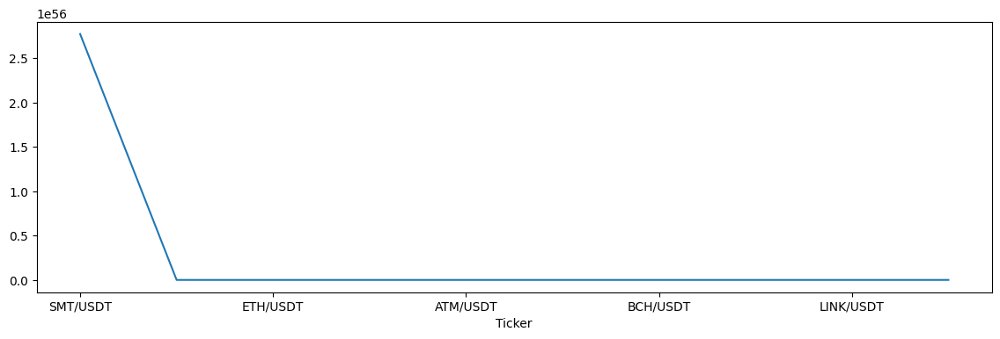

In [91]:
top_10_by_marketcap_merged.plot(figsize=all_plots_size,subplots=False)

In [92]:
# Step 1: Determine the top 10 cryptocurrencies by market cap
top_10_tickers = crypto_df.groupby('Ticker')['Market Cap'].max().nlargest(10).index
top_10_tickers

Index(['SMT/USDT', 'BTC/USDT', 'ETH/USDT', 'ATM/USDT', 'ADA/USDT', 'DOGE/USDT',
       'BCH/USDT', 'LTC/USDT', 'CRO/USDT', 'LINK/USDT'],
      dtype='object', name='Ticker')

In [93]:
# crypto_df.reset_index(inplace=True)
# crypto_df

In [94]:
crypto_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 234532 entries, 2019-02-23 to 2021-01-27
Data columns (total 15 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Open                       234532 non-null  float64
 1   High                       234532 non-null  float64
 2   Low                        234532 non-null  float64
 3   Close                      234532 non-null  float64
 4   Volume                     234532 non-null  float64
 5   Ticker                     234532 non-null  object 
 6   Active Addresses           234532 non-null  int64  
 7   Transaction Count          234532 non-null  int64  
 8   Large Transaction Count    234532 non-null  int64  
 9   Average Transaction Value  234532 non-null  float64
 10  Hashrate                   234532 non-null  float64
 11  Difficulty                 234532 non-null  float64
 12  Current Supply             234532 non-null  float64
 13  Market Cap   

In [95]:
crypto_df.reset_index(inplace=True)
crypto_df[~crypto_df.index.duplicated()]
crypto_df[['Ticker','Close','Return','Date']]

,Ticker,Close,Return,Date
0,ABT/USDT,0.08030,0.062872,2019-02-23
1,ABT/USDT,0.06980,-0.130760,2019-02-24
2,ABT/USDT,0.07170,0.027221,2019-02-25
3,ABT/USDT,0.07600,0.059972,2019-02-26
4,ABT/USDT,0.07476,-0.016316,2019-02-27
...,...,...,...,...
234527,THETA/USDT,1.92900,0.015798,2021-01-23
234528,THETA/USDT,1.95000,0.010886,2021-01-24
234529,THETA/USDT,2.07500,0.064103,2021-01-25
234530,THETA/USDT,2.28500,0.101205,2021-01-26


In [96]:
crypto_df[['Date','Ticker','Close','Return']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234532 entries, 0 to 234531
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   Date    234532 non-null  datetime64[ns]
 1   Ticker  234532 non-null  object        
 2   Close   234532 non-null  float64       
 3   Return  234532 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 7.2+ MB


In [97]:
crypto_df[['Date','Ticker','Close','Return']].isnull().sum()

Date      0
Ticker    0
Close     0
Return    0
dtype: int64

In [98]:
#  Step 2: Filter the DataFrame to include only the top 10 cryptocurrencies
top_10_df = crypto_df[crypto_df['Ticker'].isin(top_10_tickers)]
top_10_df[['Date','Ticker','Close','Return']]

,Date,Ticker,Close,Return
1985,2019-02-23,ADA/USDT,0.048450,0.057168
1986,2019-02-24,ADA/USDT,0.041700,-0.139319
1987,2019-02-25,ADA/USDT,0.043480,0.042686
1988,2019-02-26,ADA/USDT,0.042900,-0.013339
1989,2019-02-27,ADA/USDT,0.042970,0.001632
...,...,...,...,...
217571,2020-02-05,SMT/USDT,0.003743,0.054961
217572,2020-02-06,SMT/USDT,0.003956,0.056906
217573,2020-02-07,SMT/USDT,0.004163,0.052326
217574,2020-02-08,SMT/USDT,0.008221,0.974778


In [99]:
# top_10_df = top_10_df.groupby(top_10_df.index).mean()
# top_10_df = top_10_df[~top_10_df.index.duplicated(keep='first')]

# top_10_df[['Ticker','Close','Return']]

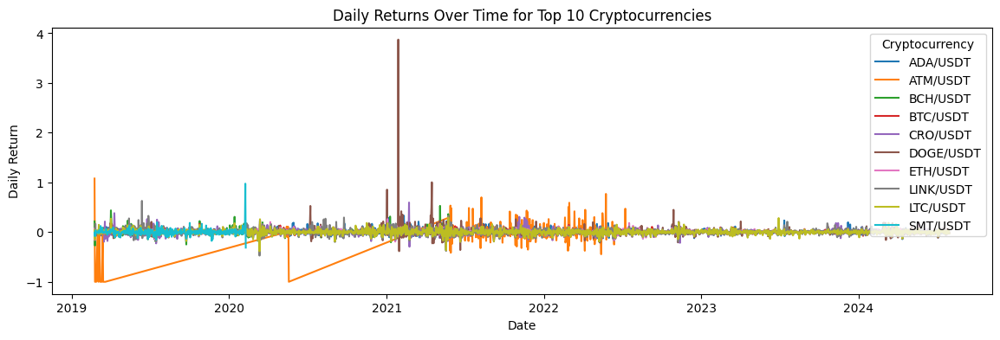

In [100]:

# Step 3: Plot the daily returns over time
plt.figure(figsize=(all_plots_size))
sns.lineplot(data=top_10_df, x=top_10_df['Date'], y='Return', hue='Ticker')
plt.title('Daily Returns Over Time for Top 10 Cryptocurrencies')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.legend(title='Cryptocurrency')
plt.show()


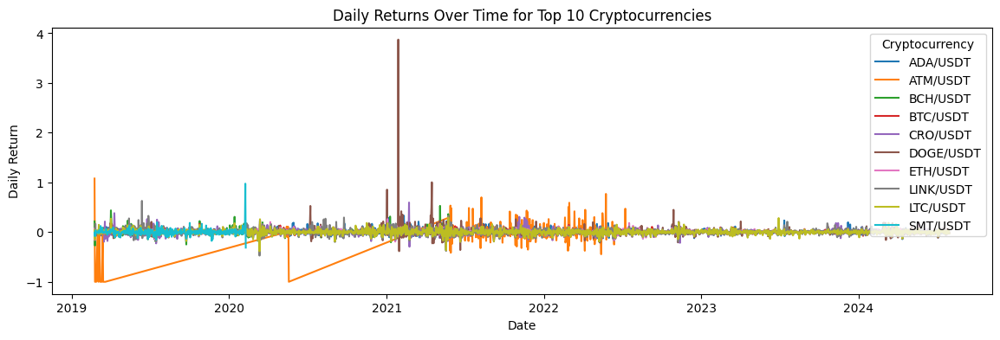

In [101]:
# Step 3: Plot the daily returns over time
plt.figure(figsize=(all_plots_size))
sns.lineplot(data=top_10_df, x=top_10_df['Date'], y='Return', hue='Ticker')
plt.title('Daily Returns Over Time for Top 10 Cryptocurrencies')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.legend(title='Cryptocurrency')
plt.show()

In [102]:


# # Example code
# plt.figure(figsize=(14, 7))
# sns.lineplot(data=crypto_df, x='Date', y='Return', hue='Ticker')
# plt.title('Daily Returns Over Time for Different Cryptocurrencies')
# plt.ylabel('Return')
# plt.xlabel('Date')
# plt.legend(title='Cryptocurrency')
# plt.show()


In [103]:
crypto_df[crypto_df['Ticker'] == 'BTC/USDT']

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap,Return
33268,2019-02-23,3965.16,4155.65,3935.28,4118.76,1.168571e+09,BTC/USDT,600634,328239,5679,3.039165,4.332698e+07,6.061519e+12,1.755468e+07,7.230353e+10,0.038737
33269,2019-02-24,4118.76,4194.06,3722.40,3746.63,1.426308e+09,BTC/USDT,600042,320446,5274,2.976121,4.169903e+07,6.064082e+12,1.755640e+07,6.577732e+10,-0.090350
33270,2019-02-25,3746.63,3869.53,3744.47,3828.38,1.098211e+09,BTC/USDT,698360,336634,7410,4.509687,4.376239e+07,6.071846e+12,1.755818e+07,6.721940e+10,0.021820
33271,2019-02-26,3828.38,3839.74,3787.97,3809.97,8.882927e+08,BTC/USDT,734105,366568,7298,4.698874,4.851848e+07,6.071846e+12,1.756020e+07,6.690382e+10,-0.004809
33272,2019-02-27,3809.97,3833.20,3710.56,3816.98,1.024175e+09,BTC/USDT,706548,344560,6807,4.086122,4.337876e+07,6.071846e+12,1.756196e+07,6.703364e+10,0.001840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35248,2024-07-26,65798.31,68198.45,65724.41,67908.17,4.506694e+09,BTC/USDT,705212,459067,15793,1.309366,6.737822e+08,8.204773e+13,1.973159e+07,1.339936e+12,0.032066
35249,2024-07-27,67908.17,69396.33,66719.73,67907.04,5.427597e+09,BTC/USDT,710081,445730,14684,1.297944,6.322310e+08,8.204773e+13,1.973206e+07,1.339946e+12,-0.000017
35250,2024-07-28,67907.04,68312.60,67068.55,68245.09,2.582574e+09,BTC/USDT,596191,753703,12547,0.498582,6.054497e+08,8.204773e+13,1.973253e+07,1.346648e+12,0.004978
35251,2024-07-29,68245.09,70033.58,66451.32,66784.44,6.345848e+09,BTC/USDT,798502,826129,18724,1.084888,7.342198e+08,8.204773e+13,1.973308e+07,1.317863e+12,-0.021403


In [104]:
# plt.figure(figsize=(all_plots_size))
# sns.scatterplot(
#     x=crypto_df[crypto_df['Ticker'] == 'BTC/USDT']['Return'],
#     y=crypto_df[crypto_df['Ticker'] == 'FET/USDT']['Return']
# )
# plt.title('Scatter Plot of BTC vs ETH Returns')
# plt.xlabel('BTC/USDT Return')
# plt.ylabel('ETH/USDT Return')
# plt.show()


- Analyze the volatility of returns over time using rolling statistics.

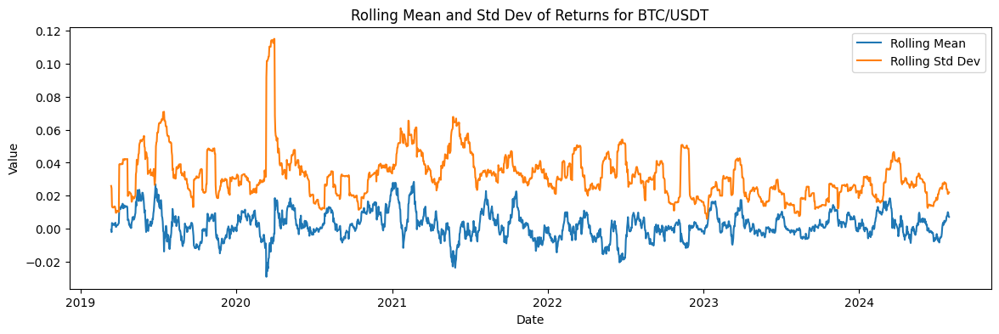

In [105]:
crypto_df['Rolling_Mean'] = crypto_df.groupby('Ticker')['Return'].rolling(window=20).mean().reset_index(0, drop=True)
crypto_df['Rolling_Std'] = crypto_df.groupby('Ticker')['Return'].rolling(window=20).std().reset_index(0, drop=True)

plt.figure(figsize=(all_plots_size))
sns.lineplot(data=crypto_df[crypto_df['Ticker'] == 'BTC/USDT'], x='Date', y='Rolling_Mean', label='Rolling Mean')
sns.lineplot(data=crypto_df[crypto_df['Ticker'] == 'BTC/USDT'], x='Date', y='Rolling_Std', label='Rolling Std Dev')
plt.title('Rolling Mean and Std Dev of Returns for BTC/USDT')
plt.ylabel('Value')
plt.xlabel('Date')
plt.legend()
plt.show()


In [106]:
def analyze_crypto_returns(
    df, 
    tickers, 
    start_date=None, 
    end_date=None, 
    ma_window=30, 
    anomaly_threshold=3, 
    figsize=(14, 8)
):
    """
    Analyze the behavior of returns, detect patterns or anomalies, and compare performance.

    Parameters:
    - df: DataFrame containing cryptocurrency data, including 'Date', 'Ticker', 'Return'.
    - tickers: List of tickers to analyze.
    - start_date: Start date for analysis (optional).
    - end_date: End date for analysis (optional).
    - ma_window: Window size for calculating moving averages (default is 30).
    - anomaly_threshold: Z-score threshold for detecting anomalies (default is 3).
    - figsize: Tuple indicating the figure size (default is (14, 8)).
    """

    print("Starting analysis of crypto returns...")

    # Filter data by date range if provided
    if start_date:
        df = df[df['Date'] >= start_date]
        print(f"Filtered data from start date: {start_date}")

    if end_date:
        df = df[df['Date'] <= end_date]
        print(f"Filtered data up to end date: {end_date}")

    # Filter data for selected tickers
    df = df[df['Ticker'].isin(tickers)]
    print(f"Filtered data for tickers: {tickers}")
    print(f"Data after filtering:\n{df.head()}")

    # Plot Daily Returns Over Time
    print("Plotting daily returns over time...")
    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x=df['Date'], y='Return', hue='Ticker')
    plt.title('Daily Returns Over Time')
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.legend(title='Cryptocurrency')
    plt.show()

    # Calculate Moving Averages
    print(f"Calculating {ma_window}-day moving averages...")
    df['MA_Return'] = df.groupby('Ticker')['Return'].transform(lambda x: x.rolling(ma_window).mean())
    print(f"Data with moving averages:\n{df[['Return', 'MA_Return']]}")

    # Plot Moving Averages
    print("Plotting moving averages of returns...")
    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x=df['Date'], y='MA_Return', hue='Ticker')
    plt.title(f'{ma_window}-Day Moving Average of Returns')
    plt.xlabel('Date')
    plt.ylabel(f'{ma_window}-Day Moving Average of Daily Return')
    plt.legend(title='Cryptocurrency')
    plt.show()

    # Detect and Highlight Anomalies
    print("Detecting anomalies in returns...")
    df['Z_Score'] = df.groupby('Ticker')['Return'].transform(lambda x: (x - x.mean()) / x.std())
    anomalies = df[df['Z_Score'].abs() > anomaly_threshold]
    print(f"Detected anomalies:\n{anomalies[['Return', 'Z_Score']]}")

    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x=df.index, y='Return', hue='Ticker')
    plt.scatter(anomalies['Date'], anomalies['Return'], color='red', label='Anomaly', s=50)
    plt.title('Anomaly Detection in Daily Returns')
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.legend(title='Cryptocurrency')
    plt.show()

    # Compare Cumulative Performance
    print("Comparing cumulative performance of cryptocurrencies...")
    df['Cumulative_Return'] = df.groupby('Ticker')['Return'].cumsum()
    print(f"Data with cumulative returns:\n{df[['Return', 'Cumulative_Return']]}")

    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x=df['Date'], y='Cumulative_Return', hue='Ticker')
    plt.title('Cumulative Returns Over Time')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Return')
    plt.legend(title='Cryptocurrency')
    plt.show()

    print("Analysis completed.")

Starting analysis of crypto returns...
Filtered data from start date: 2021-01-01
Filtered data up to end date: 2023-01-01
Filtered data for tickers: ['BTC/USDT', 'ETH/USDT', 'XRP/USDT']
Data after filtering:
            Date      Open      High       Low     Close        Volume  \
33946 2021-01-01  28921.33  29606.95  28687.23  29333.16  5.218639e+09   
33947 2021-01-02  29333.16  33266.13  28957.24  32175.58  9.364231e+09   
33948 2021-01-03  32175.58  34760.81  32000.17  32997.95  1.020181e+10   
33949 2021-01-04  32997.95  33576.43  28677.10  31996.20  1.150407e+10   
33950 2021-01-05  31996.20  34366.62  29933.55  33938.50  9.377418e+09   

         Ticker  Active Addresses  Transaction Count  Large Transaction Count  \
33946  BTC/USDT           1003690             258080                    15797   
33947  BTC/USDT           1144903             297111                    22745   
33948  BTC/USDT           1194185             359116                    24479   
33949  BTC/USDT        

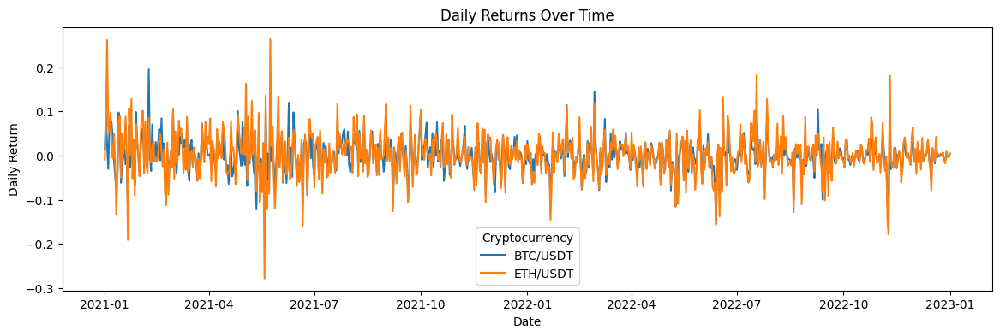

Calculating 30-day moving averages...
Data with moving averages:
         Return  MA_Return
33946  0.014240        NaN
33947  0.096901        NaN
33948  0.025559        NaN
33949 -0.030358        NaN
33950  0.060704        NaN
...         ...        ...
86707 -0.017755   0.001020
86708  0.009025  -0.000070
86709 -0.000641  -0.002226
86710 -0.003492  -0.001865
86711  0.003755  -0.002243

[1462 rows x 2 columns]
Plotting moving averages of returns...


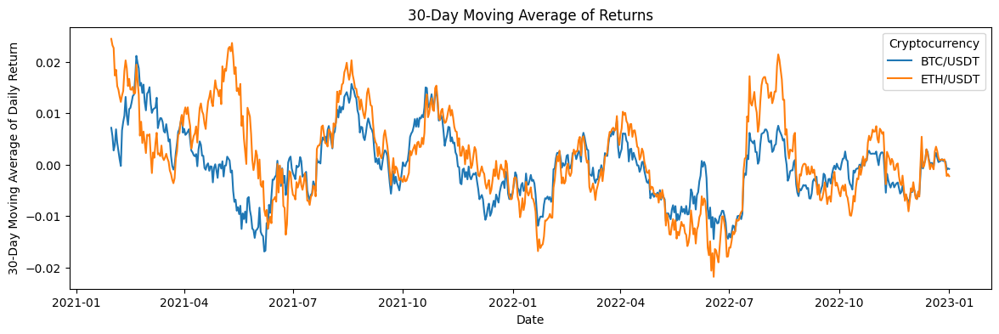

Detecting anomalies in returns...
Detected anomalies:
         Return   Z_Score
33966 -0.130205 -3.410796
33984  0.195022  5.110609
34077 -0.122000 -3.195814
34084 -0.144491 -3.785117
34089  0.120360  3.154363
34105  0.119690  3.136812
34369  0.145383  3.810002
34439 -0.115778 -3.032805
34474 -0.154080 -4.036350
34623 -0.142969 -3.745227
85983  0.261300  5.046012
86001 -0.190924 -3.754122
86103  0.162269  3.118915
86119 -0.278100 -5.450531
86124  0.263435  5.087570
86152 -0.159215 -3.137071
86509 -0.157390 -3.101558
86544  0.181782  3.498615
86658 -0.178311 -3.508685
86659  0.180745  3.478438


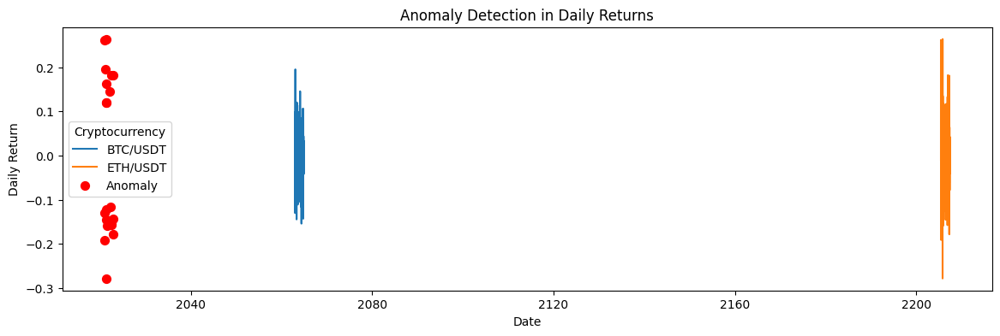

Comparing cumulative performance of cryptocurrencies...
Data with cumulative returns:
         Return  Cumulative_Return
33946  0.014240           0.014240
33947  0.096901           0.111141
33948  0.025559           0.136700
33949 -0.030358           0.106342
33950  0.060704           0.167046
...         ...                ...
86707 -0.017755           1.448789
86708  0.009025           1.457814
86709 -0.000641           1.457173
86710 -0.003492           1.453681
86711  0.003755           1.457436

[1462 rows x 2 columns]


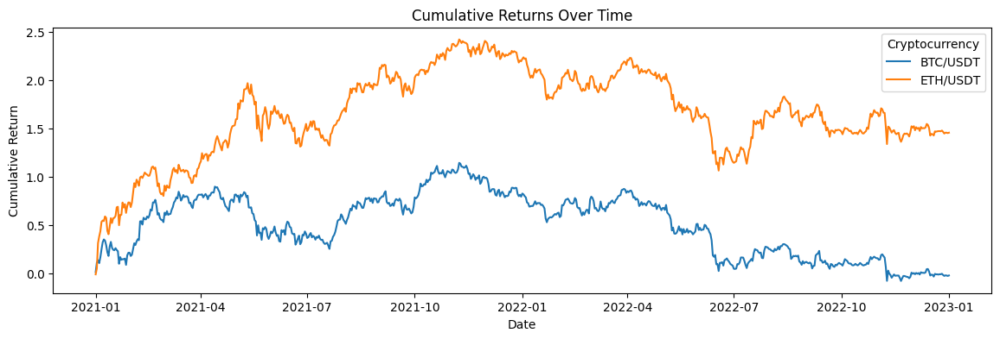

Analysis completed.


In [107]:

analyze_crypto_returns(crypto_df, tickers=['BTC/USDT', 'ETH/USDT', 'XRP/USDT'], start_date='2021-01-01', end_date='2023-01-01', figsize=all_plots_size)


In [108]:
import numpy as np

def detect_anomalies(df, z_threshold=3):
    """
    Detect anomalies in returns for multiple cryptocurrencies.

    Parameters:
    - df: DataFrame containing 'Return' and 'Ticker' columns.
    - z_threshold: Z-Score threshold to detect anomalies (default is 3).

    Returns:
    - anomalies_df: DataFrame with detected anomalies including Ticker, Return, and Z-Score.
    """
    print("Calculating Z-Scores for returns...")

    # Drop rows with NaN or infinite values in 'Return' column
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Return'])
    # df = df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # Print statistics for debugging
    print("Data after cleaning:")
    print(df.head())
    print(f"Number of rows after cleaning: {len(df)}")

    # Check if there are enough data points after dropping NaNs
    if len(df) < 2:
        print("Not enough data to calculate Z-Scores.")
        return pd.DataFrame(columns=['Ticker', 'Return', 'Z_Score'])
    
    # Calculate the mean and standard deviation of the returns
    mean_return = df['Return'].mean()
    std_return = df['Return'].std()

    print(f"Mean Return: {mean_return}")
    print(f"Standard Deviation of Return: {std_return}")

    # Check if standard deviation is zero
    if std_return == 0:
        print("Standard deviation is zero. No variability in 'Return' column.")
        return pd.DataFrame(columns=['Ticker', 'Return', 'Z_Score'])

    # Calculate the Z-Score for each return
    df['Z_Score'] = (df['Return'] - mean_return) / std_return

    print("Calculated Z-Scores:")
    print(df[['Return', 'Z_Score']])

    # Detect anomalies based on the Z-Score threshold
    anomalies_df = df[np.abs(df['Z_Score']) > z_threshold]

    print("Detected anomalies:")
    print(anomalies_df[['Ticker', 'Return', 'Z_Score']])
    
    return anomalies_df

crypto_anomalies_df = detect_anomalies(crypto_df)


Calculating Z-Scores for returns...
Data after cleaning:
        Date     Open     High      Low    Close    Volume    Ticker  \
0 2019-02-23  0.07555  0.08080  0.07555  0.08030  68992.97  ABT/USDT   
1 2019-02-24  0.08030  0.08399  0.06970  0.06980  96970.58  ABT/USDT   
2 2019-02-25  0.06980  0.07413  0.06950  0.07170  54495.95  ABT/USDT   
3 2019-02-26  0.07170  0.07891  0.07095  0.07600  42915.79  ABT/USDT   
4 2019-02-27  0.07600  0.07892  0.07234  0.07476  59732.48  ABT/USDT   

   Active Addresses  Transaction Count  Large Transaction Count  \
0                36                 35                        0   
1                57                 66                        0   
2                36                 36                        0   
3                37                 38                        0   
4                48                 50                        0   

   Average Transaction Value  Hashrate  Difficulty  Current Supply  \
0               39029.683530       0.

In [109]:
crypto_df[['Close','Return','Date']].sort_values(by='Date')

,Close,Return,Date
0,0.08030,0.062872,2019-02-23
198507,0.01700,-0.086022,2019-02-23
23371,174.20000,0.215038,2019-02-23
24560,0.02128,0.000470,2019-02-23
196522,0.01660,0.024691,2019-02-23
...,...,...,...
129677,0.04078,0.029538,2024-07-30
50963,0.04023,0.017451,2024-07-30
70906,0.00236,0.000848,2024-07-30
30205,0.59300,-0.021129,2024-07-30


In [110]:
crypto_df[['Close','Return']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234532 entries, 0 to 234531
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Close   234532 non-null  float64
 1   Return  234532 non-null  float64
dtypes: float64(2)
memory usage: 3.6 MB


In [111]:
crypto_df['Return'].describe()

/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


count    2.345320e+05
mean              inf
std               NaN
min     -1.000000e+00
25%     -2.910361e-02
50%      0.000000e+00
75%      2.696985e-02
max               inf
Name: Return, dtype: float64

In [112]:
mean_return = crypto_df['Return'].mean()
mean_return

inf

In [113]:

std_return = crypto_df['Return'].std()
std_return

/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


nan

In [114]:
ser = pd.Series([5, 6, np.nan, 0, -1])
print(ser)

print(ser.isna())


0    5.0
1    6.0
2    NaN
3    0.0
4   -1.0
dtype: float64
0    False
1    False
2     True
3    False
4    False
dtype: bool


In [115]:
# Check for infinite values
infinite_values = crypto_df['Return'].isin([np.inf, -np.inf]).sum()
print(f"Number of infinite values in Return column: {infinite_values}")

# Check for NaN values
nan_values = crypto_df['Return'].isna().sum()
print(f"Number of NaN values in Return column: {nan_values}")


Number of infinite values in Return column: 342
Number of NaN values in Return column: 0


In [116]:
print("Max value in Return column:", crypto_df['Return'].max())
print("Min value in Return column:", crypto_df['Return'].min())

Max value in Return column: inf
Min value in Return column: -1.0


In [117]:
crypto_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap,Return,Rolling_Mean,Rolling_Std
0,2019-02-23,0.07555,0.08080,0.07555,0.0803,68992.97,ABT/USDT,36,35,0,39029.68353,0.0,0.0,1.859933e+08,1.493526e+07,0.062872,NaN,NaN
1,2019-02-24,0.08030,0.08399,0.06970,0.0698,96970.58,ABT/USDT,57,66,0,17863.00957,0.0,0.0,1.859933e+08,1.298233e+07,-0.130760,NaN,NaN


#### 4.1.4 CAPM - Visualize and Process Calculated Returns (Trad Mkt)

In [118]:
market_anomalies_df = detect_anomalies(market_df)
market_anomalies_df

Calculating Z-Scores for returns...
Data after cleaning:
                        Open     High      Low    Close  Volume  Ticker  \
Date                                                                      
2019-01-06 10:00:00  37000.0  37000.0  37000.0  37000.0     100  8301.T   
2019-01-07 10:00:00  37000.0  37000.0  37000.0  37000.0       0  8301.T   
2019-01-08 10:00:00  37000.0  37000.0  37000.0  37000.0       0  8301.T   
2019-01-09 10:00:00  36350.0  36350.0  36350.0  36350.0     100  8301.T   
2019-01-10 10:00:00  36350.0  36350.0  36350.0  36350.0       0  8301.T   

                       Return  
Date                           
2019-01-06 10:00:00  0.027778  
2019-01-07 10:00:00  0.000000  
2019-01-08 10:00:00  0.000000  
2019-01-09 10:00:00 -0.017568  
2019-01-10 10:00:00  0.000000  
Number of rows after cleaning: 15879
Mean Return: 0.0006382927139539117
Standard Deviation of Return: 0.040655491036883824
Calculated Z-Scores:
                       Return   Z_Score
Date     

,Open,High,Low,Close,Volume,Ticker,Return,Z_Score
Date,,,,,,,,
2021-02-28 10:00:00,29950.000000,33000.000000,29950.00,33000.000000,4100,8301.T,0.178571,4.376608
2021-03-01 10:00:00,34400.000000,40000.000000,34400.00,40000.000000,6900,8301.T,0.212121,5.201829
2021-03-02 10:00:00,47000.000000,47000.000000,46000.00,47000.000000,10900,8301.T,0.175000,4.288762
2021-03-03 10:00:00,54000.000000,54000.000000,54000.00,54000.000000,11600,8301.T,0.148936,3.647672
2021-03-04 10:00:00,54000.000000,58000.000000,44000.00,44000.000000,10900,8301.T,-0.185185,-4.570686
...,...,...,...,...,...,...,...,...
2023-10-13 01:00:00,16.530001,20.780001,16.50,19.320000,0,^VIX,0.157579,3.860267
2024-02-13 01:00:00,13.960000,17.940001,13.43,15.850000,0,^VIX,0.137832,3.374544
2024-04-04 01:00:00,14.290000,16.920000,13.74,16.350000,0,^VIX,0.140963,3.451557


#### 4.1.5 CAPM - Handle Errors in the Return Column (Market and Crypto)

In [119]:
crypto_df['Z_Score'] = crypto_df.groupby('Ticker')['Return'].transform(lambda x: (x - x.mean()) / x.std())
market_df['Z_Score'] = market_df.groupby('Ticker')['Return'].transform(lambda x: (x - x.mean()) / x.std())

/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


In [120]:
market_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Return,Z_Score
Date,,,,,,,,
2019-01-06 10:00:00,37000.0,37000.0,37000.0,37000.0,100,8301.T,0.027778,1.148184
2019-01-07 10:00:00,37000.0,37000.0,37000.0,37000.0,0,8301.T,0.000000,-0.006237


In [121]:
crypto_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap,Return,Rolling_Mean,Rolling_Std,Z_Score
0,2019-02-23,0.07555,0.08080,0.07555,0.0803,68992.97,ABT/USDT,36,35,0,39029.68353,0.0,0.0,1.859933e+08,1.493526e+07,0.062872,NaN,NaN,0.725183
1,2019-02-24,0.08030,0.08399,0.06970,0.0698,96970.58,ABT/USDT,57,66,0,17863.00957,0.0,0.0,1.859933e+08,1.298233e+07,-0.130760,NaN,NaN,-1.676689


In [122]:
# Filter and inspect the anomalies in the crypto_df
crypto_anomalies_df = crypto_df.loc[crypto_df['Z_Score'].abs() > 3, ['Ticker', 'Date', 'Close', 'Return', 'Z_Score']]
print("Anomalies to Investigate in Crypto:")
print(crypto_anomalies_df)


Anomalies to Investigate in Crypto:
            Ticker       Date    Close    Return   Z_Score
8         ABT/USDT 2019-03-03  0.09677  0.255123  3.109926
9         ABT/USDT 2019-03-04  0.12420  0.283456  3.461370
28        ABT/USDT 2019-03-23  0.20720  0.336774  4.122751
75        ABT/USDT 2019-05-09  0.66280  0.317170  3.879576
246       ABT/USDT 2019-10-27  0.17920  0.305171  3.730737
...            ...        ...      ...       ...       ...
234271  THETA/USDT 2020-05-12  0.17890  0.213704  3.072309
234279  THETA/USDT 2020-05-20  0.27910  0.280863  4.068616
234302  THETA/USDT 2020-06-12  0.25180  0.231296  3.333283
234499  THETA/USDT 2020-12-26  1.66600  0.298519  4.330550
234506  THETA/USDT 2021-01-02  2.40000  0.220132  3.167669

[2753 rows x 5 columns]


In [123]:
market_df

,Open,High,Low,Close,Volume,Ticker,Return,Z_Score
Date,,,,,,,,
2019-01-06 10:00:00,37000.000000,37000.000000,37000.000000,37000.000000,100,8301.T,0.027778,1.148184
2019-01-07 10:00:00,37000.000000,37000.000000,37000.000000,37000.000000,0,8301.T,0.000000,-0.006237
2019-01-08 10:00:00,37000.000000,37000.000000,37000.000000,37000.000000,0,8301.T,0.000000,-0.006237
2019-01-09 10:00:00,36350.000000,36350.000000,36350.000000,36350.000000,100,8301.T,-0.017568,-0.736331
2019-01-10 10:00:00,36350.000000,36350.000000,36350.000000,36350.000000,0,8301.T,0.000000,-0.006237
...,...,...,...,...,...,...,...,...
2024-07-23 01:00:00,15.210000,15.350000,13.900000,14.720000,0,^VIX,-0.012743,-0.196416
2024-07-24 01:00:00,15.350000,18.459999,15.180000,18.040001,0,^VIX,0.225544,2.856726
2024-07-25 01:00:00,18.410000,19.360001,16.420000,18.459999,0,^VIX,0.023281,0.265164


In [124]:
# # Filter and inspect the anomalies
# market_anomalies_df = market_df.loc[market_df['Z_Score'].abs() > 3, ['Ticker', 'Date', 'Close', 'Return', 'Z_Score']]
# print("Anomalies to Investigate in Market:")
# print(market_anomalies_df)


In [125]:
# Filter the dataset for tickers with anomalies
anomalous_tickers = crypto_anomalies_df['Ticker'].unique()
anomalies_data = crypto_df[crypto_df['Ticker'].isin(anomalous_tickers)]
anomalies_data

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap,Return,Rolling_Mean,Rolling_Std,Z_Score
0,2019-02-23,0.07555,0.08080,0.07555,0.08030,6.899297e+04,ABT/USDT,36,35,0,39029.683530,0.0,0.0,1.859933e+08,1.493526e+07,0.062872,NaN,NaN,0.725183
1,2019-02-24,0.08030,0.08399,0.06970,0.06980,9.697058e+04,ABT/USDT,57,66,0,17863.009570,0.0,0.0,1.859933e+08,1.298233e+07,-0.130760,NaN,NaN,-1.676689
2,2019-02-25,0.06980,0.07413,0.06950,0.07170,5.449595e+04,ABT/USDT,36,36,0,18237.855518,0.0,0.0,1.859933e+08,1.333572e+07,0.027221,NaN,NaN,0.282949
3,2019-02-26,0.07170,0.07891,0.07095,0.07600,4.291579e+04,ABT/USDT,37,38,0,27112.939836,0.0,0.0,1.859933e+08,1.413549e+07,0.059972,NaN,NaN,0.689209
4,2019-02-27,0.07600,0.07892,0.07234,0.07476,5.973248e+04,ABT/USDT,48,50,0,24261.007125,0.0,0.0,1.859933e+08,1.390486e+07,-0.016316,NaN,NaN,-0.257091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234527,2021-01-23,1.89900,2.02000,1.86700,1.92900,4.124381e+07,THETA/USDT,40,25,0,721.556207,0.0,0.0,1.000000e+09,1.929000e+09,0.015798,-0.002705,0.067929,0.136340
234528,2021-01-24,1.92900,2.01200,1.88700,1.95000,3.712642e+07,THETA/USDT,12,6,0,240.135273,0.0,0.0,1.000000e+09,1.950000e+09,0.010886,0.001599,0.065788,0.063480
234529,2021-01-25,1.95000,2.29500,1.93000,2.07500,1.083841e+08,THETA/USDT,18,10,0,129.056275,0.0,0.0,1.000000e+09,2.075000e+09,0.064103,0.000637,0.064661,0.852948
234530,2021-01-26,2.07500,2.41400,2.06100,2.28500,1.236119e+08,THETA/USDT,31,20,0,300.164975,0.0,0.0,1.000000e+09,2.285000e+09,0.101205,0.004900,0.068425,1.403365


In [126]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Set up the plot
# plt.figure(figsize=(14, 8))

# # Plot returns for each anomalous ticker
# sns.lineplot(data=anomalies_data, x='Date', y='Return', hue='Ticker', marker='o')

# # Highlight the anomalies with a different color
# anomalies = anomalies_data[anomalies_data['Z_Score'].abs() > 3]
# sns.scatterplot(data=anomalies, x='Date', y='Return', hue='Ticker', style='Ticker', markers=True, s=100, legend=False, palette='deep')

# # Set plot labels and title
# plt.xlabel('Date')
# plt.ylabel('Return')
# plt.title('Returns Over Time for Anomalous Tickers')
# plt.legend(title='Ticker', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.grid(True)
# plt.show()


In [127]:
# # Set up the plot
# plt.figure(figsize=(14, 8))

# # Plot close prices for each anomalous ticker
# sns.lineplot(data=anomalies_data, x='Date', y='Close', hue='Ticker')

# # Highlight the anomalies with a different color
# sns.scatterplot(data=anomalies, x='Date', y='Close', hue='Ticker', style='Ticker', markers=True, s=100, legend=False, palette='deep')

# # Set plot labels and title
# plt.xlabel('Date')
# plt.ylabel('Close Price')
# plt.title('Close Prices Over Time for Anomalous Tickers')
# plt.legend(title='Ticker', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.grid(True)
# plt.show()


In [128]:
crypto_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker',
       'Active Addresses', 'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score'],
      dtype='object')

In [129]:
# Excluding anomalies from the dataset for further analysis
cleaned_crypto_df = crypto_df.loc[crypto_df['Z_Score'].abs() <= 3]

# Optionally, we can also drop rows with extreme returns (Z_Score > 3) if they are deemed to be data errors
# cleaned_crypto_df = crypto_df.loc[crypto_df['Z_Score'].abs() <= 3]
cleaned_crypto_df[['Ticker','Date','Return','Close','Current Supply','Market Cap']]

,Ticker,Date,Return,Close,Current Supply,Market Cap
0,ABT/USDT,2019-02-23,0.062872,0.08030,1.859933e+08,1.493526e+07
1,ABT/USDT,2019-02-24,-0.130760,0.06980,1.859933e+08,1.298233e+07
2,ABT/USDT,2019-02-25,0.027221,0.07170,1.859933e+08,1.333572e+07
3,ABT/USDT,2019-02-26,0.059972,0.07600,1.859933e+08,1.413549e+07
4,ABT/USDT,2019-02-27,-0.016316,0.07476,1.859933e+08,1.390486e+07
...,...,...,...,...,...,...
234527,THETA/USDT,2021-01-23,0.015798,1.92900,1.000000e+09,1.929000e+09
234528,THETA/USDT,2021-01-24,0.010886,1.95000,1.000000e+09,1.950000e+09
234529,THETA/USDT,2021-01-25,0.064103,2.07500,1.000000e+09,2.075000e+09
234530,THETA/USDT,2021-01-26,0.101205,2.28500,1.000000e+09,2.285000e+09


#### 4.1.6 CAPM - Modeling

Implementing a Capital Asset Pricing Model (CAPM) involves estimating the relationship between the return of an asset (e.g., a cryptocurrency) and the return of the market portfolio. The CAPM is typically represented by the equation:

$$\ \text{Expected Return}_i = \text{Risk-Free Rate} + \beta_i (\text{Market Return} - \text{Risk-Free Rate}) \$$

<!-- Where:
- $$\ \text{Expected Return}_i \$$ \is the expected return of asset $$\ i \$$.
- $$\ \text{Risk-Free Rate} \$$ is the return on a risk-free asset (e.g., government bonds).
- $$\ \beta_i \$$ is the sensitivity of the asset's returns to the market returns.
- $$\ \text{Market Return} \$$ is the return of the market portfolio. -->

- 4.2 Steps to Implement CAPM:

1. **Data Preparation**:
   - Ensure that you have the returns for the cryptocurrency and the market index.
   - Decide on a proxy for the risk-free rate (e.g., the return on a 10-year Treasury bond).
   
2. **Calculate Excess Returns**:
   - Calculate the excess return for the cryptocurrency and the market by subtracting the risk-free rate from their respective returns.

3. **Estimate Beta**:
   - Perform a linear regression where the dependent variable is the excess return of the cryptocurrency, and the independent variable is the excess return of the market.

4. **Interpret Results**:
   - Interpret the regression coefficient (beta) and assess the relationship between the cryptocurrency and the market return.

- Step 3: Interpret the Results

- **Alpha (Intercept)**: This represents the return of the cryptocurrency when the market return is zero. In the CAPM context, it should ideally be close to zero if the asset is correctly priced.
- **Beta (Slope)**: This is the main focus. It indicates how sensitive the cryptocurrency's returns are to the market returns. A beta greater than 1 indicates more sensitivity (higher risk), while a beta less than 1 indicates less sensitivity (lower risk).

- Example Output:

The summary output from `capm_model.summary()` will include:

- **Coefficient (Beta)**: Indicates the asset's sensitivity to market movements.
- **P-value**: Tells you whether the coefficient is statistically significant.
- **R-squared**: Shows how well the market return explains the asset return.

- Next Steps:

After implementing and reviewing the CAPM model, we can compare the results with the multi-factor model or refine the CAPM analysis further by examining different market proxies or adjusting for anomalies.

In [130]:
yfinance_all_df

,Open,High,Low,Close,Volume,Ticker
Date,,,,,,
2021-04-01 00:00:00,0.737261,0.737489,0.666090,0.730808,3026388,10SET-USD
2021-04-02 00:00:00,0.734999,1.591740,0.732162,1.515820,6055500,10SET-USD
2021-04-03 00:00:00,1.519680,2.528684,1.517770,1.894902,12456785,10SET-USD
2021-04-04 00:00:00,1.888420,3.104582,1.695171,2.899379,11536672,10SET-USD
2021-04-05 00:00:00,2.896329,4.262810,2.820191,3.578173,16051682,10SET-USD
...,...,...,...,...,...,...
2024-08-06 15:00:00,28200.000000,28200.000000,28200.000000,28200.000000,100,8301.T
2024-08-07 15:00:00,28000.000000,28000.000000,28000.000000,28000.000000,100,8301.T
2024-08-08 15:00:00,28000.000000,28000.000000,28000.000000,28000.000000,0,8301.T


In [131]:
crypto_df

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap,Return,Rolling_Mean,Rolling_Std,Z_Score
0,2019-02-23,0.07555,0.08080,0.07555,0.08030,6.899297e+04,ABT/USDT,36,35,0,39029.683530,0.0,0.0,1.859933e+08,1.493526e+07,0.062872,NaN,NaN,0.725183
1,2019-02-24,0.08030,0.08399,0.06970,0.06980,9.697058e+04,ABT/USDT,57,66,0,17863.009570,0.0,0.0,1.859933e+08,1.298233e+07,-0.130760,NaN,NaN,-1.676689
2,2019-02-25,0.06980,0.07413,0.06950,0.07170,5.449595e+04,ABT/USDT,36,36,0,18237.855518,0.0,0.0,1.859933e+08,1.333572e+07,0.027221,NaN,NaN,0.282949
3,2019-02-26,0.07170,0.07891,0.07095,0.07600,4.291579e+04,ABT/USDT,37,38,0,27112.939836,0.0,0.0,1.859933e+08,1.413549e+07,0.059972,NaN,NaN,0.689209
4,2019-02-27,0.07600,0.07892,0.07234,0.07476,5.973248e+04,ABT/USDT,48,50,0,24261.007125,0.0,0.0,1.859933e+08,1.390486e+07,-0.016316,NaN,NaN,-0.257091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234527,2021-01-23,1.89900,2.02000,1.86700,1.92900,4.124381e+07,THETA/USDT,40,25,0,721.556207,0.0,0.0,1.000000e+09,1.929000e+09,0.015798,-0.002705,0.067929,0.136340
234528,2021-01-24,1.92900,2.01200,1.88700,1.95000,3.712642e+07,THETA/USDT,12,6,0,240.135273,0.0,0.0,1.000000e+09,1.950000e+09,0.010886,0.001599,0.065788,0.063480
234529,2021-01-25,1.95000,2.29500,1.93000,2.07500,1.083841e+08,THETA/USDT,18,10,0,129.056275,0.0,0.0,1.000000e+09,2.075000e+09,0.064103,0.000637,0.064661,0.852948
234530,2021-01-26,2.07500,2.41400,2.06100,2.28500,1.236119e+08,THETA/USDT,31,20,0,300.164975,0.0,0.0,1.000000e+09,2.285000e+09,0.101205,0.004900,0.068425,1.403365


In [132]:
processed_social_data

,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score
Date,,,,
2019-03-06,8.514894,70579,0.000000e+00,2.352917e+04
2019-03-07,9.561804,70584,0.000000e+00,2.353119e+04
2019-03-08,6.691830,1415,0.000000e+00,4.738973e+02
2019-03-09,5.782525,70627,0.000000e+00,2.354426e+04
2019-03-10,7.805681,70631,0.000000e+00,2.354627e+04
...,...,...,...,...
2024-08-22,0.000000,114677,3.233567e+08,1.078238e+08
2024-08-23,0.000000,114690,3.233986e+08,1.078378e+08
2024-08-24,0.000000,114692,3.235759e+08,1.078969e+08


In [133]:
processed_social_data.reset_index(inplace=True)
processed_social_data.head(1)

,Date,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score
0,2019-03-06,8.514894,70579,0.0,23529.171631


In [134]:
crypto_df.head(1)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,Hashrate,Difficulty,Current Supply,Market Cap,Return,Rolling_Mean,Rolling_Std,Z_Score
0,2019-02-23,0.07555,0.0808,0.07555,0.0803,68992.97,ABT/USDT,36,35,0,39029.68353,0.0,0.0,1.859933e+08,1.493526e+07,0.062872,NaN,NaN,0.725183


In [135]:
trad_mkt_df.reset_index(inplace=True)
trad_mkt_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker
0,2019-01-02,3.240214,3.434666,3.225580,3.378612,508752000,NVDA
1,2019-01-03,3.318341,3.352320,3.167045,3.174486,705552000,NVDA


In [136]:
trad_mkt_df['Ticker'].unique()

array(['NVDA', '^GSPC', '^VIX', '^TNX', '^N225', 'JPY=X', 'GC=F', 'CL=F',
       'DX-Y.NYB', 'HYG', 'Topix', '8301.T'], dtype=object)

- Step 1: Extract the Relevant Data

In [137]:
trad_mkt_data, yf_crypto_data = separate_trad_mkt_data(yfinance_all_df, trad_mkt_df)

In [138]:
yf_crypto_data['Ticker'].nunique(), yfinance_all_df['Ticker'].nunique()

(2112, 2124)

In [139]:
trad_mkt_data['Ticker'].nunique(), trad_mkt_df['Ticker'].nunique(),

(12, 12)

In [140]:
yf_crypto_data.reset_index("Date", inplace=True)
yf_crypto_data

,Date,Open,High,Low,Close,Volume,Ticker
0,2021-04-01,0.737261,0.737489,0.666090,0.730808,3026388,10SET-USD
1,2021-04-02,0.734999,1.591740,0.732162,1.515820,6055500,10SET-USD
2,2021-04-03,1.519680,2.528684,1.517770,1.894902,12456785,10SET-USD
3,2021-04-04,1.888420,3.104582,1.695171,2.899379,11536672,10SET-USD
4,2021-04-05,2.896329,4.262810,2.820191,3.578173,16051682,10SET-USD
...,...,...,...,...,...,...,...
2182967,2024-08-10,0.120661,0.120749,0.119035,0.120475,128375,ZZZ-USD
2182968,2024-08-11,0.120475,0.121838,0.114884,0.115288,158018,ZZZ-USD
2182969,2024-08-12,0.115287,0.118990,0.111842,0.115929,202618,ZZZ-USD
2182970,2024-08-13,0.115929,0.120402,0.111843,0.119292,168936,ZZZ-USD


In [141]:
# yfinance_all_merged_df = merge_dataframes(crypto_df, trad_mkt_df, processed_social_data)
# yfinance_all_merged_df

In [142]:
# ccompare_gate_merged_df = merge_dataframes(yf_crypto_data, trad_mkt_df, processed_social_data)
# ccompare_gate_merged_df

In [143]:
trad_mkt_df['Ticker'].unique()

array(['NVDA', '^GSPC', '^VIX', '^TNX', '^N225', 'JPY=X', 'GC=F', 'CL=F',
       'DX-Y.NYB', 'HYG', 'Topix', '8301.T'], dtype=object)

In [144]:
# Extracting gold, JPY/USD, and other relevant variables
gold_price = trad_mkt_df[trad_mkt_df['Ticker'] == 'GC=F'][['Date', 'Close']].rename(columns={'Close': 'Gold_Price'})
jpy_usd = trad_mkt_df[trad_mkt_df['Ticker'] == 'JPY=X'][['Date', 'Close']].rename(columns={'Close': 'JPY_USD'})
sp500 = trad_mkt_df[trad_mkt_df['Ticker'] == '^GSPC'][['Date', 'Close']].rename(columns={'Close': 'SP500'})
vix = trad_mkt_df[trad_mkt_df['Ticker'] == '^VIX'][['Date', 'Close']].rename(columns={'Close': 'VIX'})

nvidia = trad_mkt_df[trad_mkt_df['Ticker'] == 'NVDA'][['Date', 'Close']].rename(columns={'Close': 'NVIDIA'})
usd_index = trad_mkt_df[trad_mkt_df['Ticker'] == 'DX-Y.NYB'][['Date', 'Close']].rename(columns={'Close': 'USD_Index'})
# tokyo_index = trad_mkt_df[trad_mkt_df['Ticker'] == 'Topix'][['Date', 'Close']].rename(columns={'Close': 'TOKYO_Stock_Index'})
boj = trad_mkt_df[trad_mkt_df['Ticker'] == '8301.T'][['Date', 'Close']].rename(columns={'Close': 'BOJ'})

# Extract risk-free rate from `trad_mkt_df`
risk_free_rate = trad_mkt_df[trad_mkt_df['Ticker'] == '^TNX'][['Date', 'Close']].rename(columns={'Close': 'Risk_Free_Rate'})

# Convert 'Date' columns to datetime format without time components
gold_price['Date'] = pd.to_datetime(gold_price['Date']).dt.normalize()
jpy_usd['Date'] = pd.to_datetime(jpy_usd['Date']).dt.normalize()
sp500['Date'] = pd.to_datetime(sp500['Date']).dt.normalize()
vix['Date'] = pd.to_datetime(vix['Date']).dt.normalize()

nvidia['Date'] = pd.to_datetime(nvidia['Date']).dt.normalize()
usd_index['Date'] = pd.to_datetime(usd_index['Date']).dt.normalize()
# tokyo_index['Date'] = pd.to_datetime(tokyo_index['Date']).dt.normalize()
boj['Date'] = pd.to_datetime(boj['Date']).dt.normalize()

risk_free_rate['Date'] = pd.to_datetime(risk_free_rate['Date']).dt.normalize()


In [145]:
jpy_usd['Date'].describe()

count                          1453
mean     2021-10-13 07:38:51.452168
min             2018-12-31 00:00:00
25%             2020-05-24 00:00:00
50%             2021-10-13 00:00:00
75%             2023-03-06 00:00:00
max             2024-07-28 00:00:00
Name: Date, dtype: object

In [146]:
yf_crypto_data

,Date,Open,High,Low,Close,Volume,Ticker
0,2021-04-01,0.737261,0.737489,0.666090,0.730808,3026388,10SET-USD
1,2021-04-02,0.734999,1.591740,0.732162,1.515820,6055500,10SET-USD
2,2021-04-03,1.519680,2.528684,1.517770,1.894902,12456785,10SET-USD
3,2021-04-04,1.888420,3.104582,1.695171,2.899379,11536672,10SET-USD
4,2021-04-05,2.896329,4.262810,2.820191,3.578173,16051682,10SET-USD
...,...,...,...,...,...,...,...
2182967,2024-08-10,0.120661,0.120749,0.119035,0.120475,128375,ZZZ-USD
2182968,2024-08-11,0.120475,0.121838,0.114884,0.115288,158018,ZZZ-USD
2182969,2024-08-12,0.115287,0.118990,0.111842,0.115929,202618,ZZZ-USD
2182970,2024-08-13,0.115929,0.120402,0.111843,0.119292,168936,ZZZ-USD


In [147]:
# Merge extracted data with yf_crypto_data
yf_crypto_data = yf_crypto_data.merge(gold_price, on='Date', how='left')
yf_crypto_data = yf_crypto_data.merge(jpy_usd, on='Date', how='left')
yf_crypto_data = yf_crypto_data.merge(sp500, on='Date', how='left')
yf_crypto_data = yf_crypto_data.merge(vix, on='Date', how='left')

yf_crypto_data = yf_crypto_data.merge(nvidia, on='Date', how='left')
yf_crypto_data = yf_crypto_data.merge(usd_index, on='Date', how='left')
# yf_crypto_data = yf_crypto_data.merge(tokyo_index, on='Date', how='left')
yf_crypto_data = yf_crypto_data.merge(boj, on='Date', how='left')

yf_crypto_data = yf_crypto_data.merge(risk_free_rate, on='Date', how='left')
   


In [148]:
# calculate Return
yf_crypto_data['Return'] = yf_crypto_data['Close'].pct_change()

In [149]:
yf_crypto_data[yf_crypto_data['Ticker'] == 'BTC-USD'].head(1)

,Date,Open,High,Low,Close,Volume,Ticker,Gold_Price,JPY_USD,SP500,VIX,NVIDIA,USD_Index,BOJ,Risk_Free_Rate,Return
293247,2019-01-01,3746.713379,3850.913818,3707.231201,3843.52002,4324200990,BTC-USD,NaN,109.667999,NaN,NaN,NaN,NaN,NaN,NaN,79695.43439


In [150]:
# Extract BTC/USDT return data for market return
yf_btc_market_return = yf_crypto_data[yf_crypto_data['Ticker'] == 'BTC-USD'][['Date', 'Return']].rename(columns={'Return': 'Market_Return'})


In [151]:
yf_btc_market_return.head(2)

,Date,Market_Return
293247,2019-01-01,79695.434390
293248,2019-01-02,0.025989


In [152]:
# Merge Market_Return with the full crypto_df dataset
yf_crypto_data = yf_crypto_data.merge(yf_btc_market_return, on='Date', how='left') 

In [153]:
yf_crypto_data['Market_Return'].unique()

array([ 0.00300374,  0.00488197, -0.02998135, ...,  0.01260436,
       -0.00554646, -0.01530337])

In [154]:
yf_crypto_data.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker',
       'Gold_Price', 'JPY_USD', 'SP500', 'VIX', 'NVIDIA', 'USD_Index', 'BOJ',
       'Risk_Free_Rate', 'Return', 'Market_Return'],
      dtype='object')

In [155]:
# Merge extracted data with crypto_df
crypto_df = crypto_df.merge(gold_price, on='Date', how='left')
crypto_df = crypto_df.merge(jpy_usd, on='Date', how='left')
crypto_df = crypto_df.merge(sp500, on='Date', how='left')
crypto_df = crypto_df.merge(vix, on='Date', how='left')

crypto_df = crypto_df.merge(nvidia, on='Date', how='left')
crypto_df = crypto_df.merge(usd_index, on='Date', how='left')
# crypto_df = crypto_df.merge(tokyo_index, on='Date', how='left')
crypto_df = crypto_df.merge(boj, on='Date', how='left')
crypto_df = crypto_df.merge(risk_free_rate, on='Date', how='left')


In [156]:
# Extract BTC/USDT return data for market return
btc_market_return = crypto_df[crypto_df['Ticker'] == 'BTC/USDT'][['Date', 'Return']].rename(columns={'Return': 'Market_Return'})


In [157]:
# Merge Market_Return with the full crypto_df dataset
crypto_df = crypto_df.merge(btc_market_return, on='Date', how='left')

In [158]:
crypto_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker',
       'Active Addresses', 'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score',
       'Gold_Price', 'JPY_USD', 'SP500', 'VIX', 'NVIDIA', 'USD_Index', 'BOJ',
       'Risk_Free_Rate', 'Market_Return'],
      dtype='object')

In [159]:
# Merge social sentiment data with yf_crypto_data
yf_crypto_data = yf_crypto_data.merge(processed_social_data, on='Date', how='left')

In [160]:
yf_crypto_data['Date'].min(), yf_crypto_data['Date'].max(), yf_crypto_data['Ticker'].nunique()

(Timestamp('2019-01-01 00:00:00'), Timestamp('2024-08-14 00:00:00'), 2112)

In [161]:
crypto_df['Market_Return'].unique()

array([ 0.0387374 , -0.09035001,  0.02181961, ...,  0.00497813,
       -0.021403  , -0.00890327])

In [162]:
# Merge social sentiment data with crypto_df
crypto_df = crypto_df.merge(processed_social_data, on='Date', how='left')

In [163]:
crypto_df['NVIDIA'].unique()

array([         nan,   3.93592644,   3.89649034, ..., 112.27999878,
       113.05999756, 111.58999634])

In [164]:
crypto_all_merged_df = crypto_df.dropna()  # Dropping rows with NaN values
crypto_all_merged_df

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,VIX,NVIDIA,USD_Index,BOJ,Risk_Free_Rate,Market_Return,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score
19,2019-03-14,0.1029,0.1062,0.1001,0.1009,8.423731e+04,ABT/USDT,38,48,0,...,13.500000,4.110553,96.790001,37000.0,2.630,0.002711,8.397228,70747.0,0.0,23585.132409
23,2019-03-18,0.1056,0.1089,0.1028,0.1061,7.079408e+04,ABT/USDT,33,40,1,...,13.100000,4.194719,96.519997,35650.0,2.602,0.001323,7.061709,70821.0,0.0,23609.353903
24,2019-03-19,0.1061,0.1170,0.1061,0.1153,1.978546e+05,ABT/USDT,91,124,0,...,13.560000,4.362558,96.379997,35650.0,2.614,0.007054,9.599922,70854.0,0.0,23621.199974
26,2019-03-21,0.1388,0.1599,0.1307,0.1449,3.429624e+05,ABT/USDT,78,129,0,...,13.630000,4.566894,96.500000,37050.0,2.537,-0.014859,5.347607,70898.0,0.0,23634.449202
30,2019-03-25,0.1867,0.1918,0.1687,0.1727,4.971339e+05,ABT/USDT,140,300,2,...,16.330000,4.314640,96.570000,36000.0,2.420,-0.013848,5.454593,70992.0,0.0,23665.818198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234524,2021-01-20,2.0010,2.0410,1.8450,2.0330,4.471843e+07,THETA/USDT,28,18,0,...,21.580000,13.333975,90.470001,25500.0,1.090,-0.011860,17.739416,76226.0,0.0,25414.579805
234525,2021-01-21,2.0330,2.0420,1.7130,1.7420,4.224459e+07,THETA/USDT,22,13,0,...,21.320000,13.834529,90.129997,26390.0,1.109,-0.130205,154.570932,76270.0,0.0,25474.856977
234529,2021-01-25,1.9500,2.2950,1.9300,2.0750,1.083841e+08,THETA/USDT,18,10,0,...,23.190001,13.620790,90.389999,26420.0,1.040,0.000553,22.548004,76405.0,0.0,25475.849335
234530,2021-01-26,2.0750,2.4140,2.0610,2.2850,1.236119e+08,THETA/USDT,31,20,0,...,23.020000,13.403308,90.169998,26420.0,1.040,0.006151,24.110431,76439.0,0.0,25487.703477


In [167]:
crypto_all_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 104663 entries, 19 to 234531
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date                            104663 non-null  datetime64[ns]
 1   Open                            104663 non-null  float64       
 2   High                            104663 non-null  float64       
 3   Low                             104663 non-null  float64       
 4   Close                           104663 non-null  float64       
 5   Volume                          104663 non-null  float64       
 6   Ticker                          104663 non-null  object        
 7   Active Addresses                104663 non-null  int64         
 8   Transaction Count               104663 non-null  int64         
 9   Large Transaction Count         104663 non-null  int64         
 10  Average Transaction Value       104663 non-null  float64    

In [166]:
crypto_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234532 entries, 0 to 234531
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date                            234532 non-null  datetime64[ns]
 1   Open                            234532 non-null  float64       
 2   High                            234532 non-null  float64       
 3   Low                             234532 non-null  float64       
 4   Close                           234532 non-null  float64       
 5   Volume                          234532 non-null  float64       
 6   Ticker                          234532 non-null  object        
 7   Active Addresses                234532 non-null  int64         
 8   Transaction Count               234532 non-null  int64         
 9   Large Transaction Count         234532 non-null  int64         
 10  Average Transaction Value       234532 non-null  float64

In [168]:
yf_crypto_merged_df = yf_crypto_data.dropna()  # Dropping rows with NaN values
yf_crypto_merged_df.shape

(1089640, 21)

In [169]:
yf_crypto_merged_df['Ticker'].nunique()

2061

In [170]:
# save to disk for later use to minimize memory imprint
yf_crypto_merged_df.to_parquet('../data_outputs/yf_merged_df.parquet')
crypto_all_merged_df.to_parquet('../data_outputs/crypto_merged_df.parquet')

In [ ]:
crypto_df['Ticker'].nunique()

143

In [ ]:
crypto_all_merged_df['Ticker'].nunique()

110

In [ ]:
# Using BTC/USDT as a benchmark

In [ ]:
crypto_all_merged_df[['Date','Ticker','Risk_Free_Rate','Return','Market_Return']]

,Date,Ticker,Risk_Free_Rate,Return,Market_Return
19,2019-03-14,ABT/USDT,2.630,-0.019436,0.002711
23,2019-03-18,ABT/USDT,2.602,0.004735,0.001323
24,2019-03-19,ABT/USDT,2.614,0.086711,0.007054
26,2019-03-21,ABT/USDT,2.537,0.043948,-0.014859
30,2019-03-25,ABT/USDT,2.420,-0.074987,-0.013848
...,...,...,...,...,...
234524,2021-01-20,THETA/USDT,1.090,0.015992,-0.011860
234525,2021-01-21,THETA/USDT,1.109,-0.143138,-0.130205
234529,2021-01-25,THETA/USDT,1.040,0.064103,0.000553
234530,2021-01-26,THETA/USDT,1.040,0.101205,0.006151


-` Step 3: Implement the CAPM Model (ccompare_gate_merged_df)`

- `First check for stationarity and outliers`

1. `Outlier detection using rolling statistics`

In [ ]:
crypto_all_merged_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker',
       'Active Addresses', 'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score',
       'Gold_Price', 'JPY_USD', 'SP500', 'VIX', 'NVIDIA', 'USD_Index', 'BOJ',
       'Risk_Free_Rate', 'Market_Return', 'Reddit_Engagement_Score',
       'Code_Repo_Activity_Score', 'Twitter_Engagement_Score',
       'Overall_Social_Sentiment_Score'],
      dtype='object')

In [ ]:
if 'Date' in crypto_all_merged_df.columns:
    crypto_all_merged_df.set_index('Date', inplace=True)
    crypto_all_merged_df.index = pd.to_datetime(crypto_all_merged_df.index)

In [ ]:
# Calculate rolling mean and standard deviation
df_rolling = crypto_all_merged_df['Return'].rolling(window=21).agg(['mean', 'std'])

# Rename columns for clarity
df_rolling.columns = ['Mean_Return', 'STD_Return']

crypto_all_merged_df = crypto_all_merged_df.join(df_rolling)

crypto_all_merged_df[['Return', 'Mean_Return', 'STD_Return']].head(1)


,Return,Mean_Return,STD_Return
Date,,,
2019-03-14,-0.019436,NaN,NaN


In [ ]:
# - calculate the lower and upper thresholds

N_SIGMAS = 3
crypto_all_merged_df["Upper"] = crypto_all_merged_df["Mean_Return"] + N_SIGMAS * crypto_all_merged_df["STD_Return"]
crypto_all_merged_df["Lower"] = crypto_all_merged_df["Mean_Return"] - N_SIGMAS * crypto_all_merged_df["STD_Return"]

In [ ]:
crypto_all_merged_df.index.min(),crypto_all_merged_df.index.max()

(Timestamp('2019-03-14 00:00:00'), Timestamp('2024-07-25 00:00:00'))

In [ ]:
# Identify the outliers using the previously calculated thresholds:

crypto_all_merged_df["Outlier_RW"] = (
    (crypto_all_merged_df["Return"] > crypto_all_merged_df["Upper"]) | (crypto_all_merged_df["Return"] < crypto_all_merged_df["Lower"])
)

In [ ]:
crypto_all_merged_df["Outlier_RW"].unique()

array([False,  True])

In [ ]:
def plot_outliers_rolling(df, plot_title="Cryptocurrency Returns with Outliers", plot_size=(10, 6)):
    """
    Plot the returns together with thresholds and mark the outliers.
    
    Parameters:
    - df: DataFrame containing the data
    - ticker: Column name of the ticker
    - plot_title: Title of the plot (default="Cryptocurrency Returns with Outliers")
    - all_plots_size: Tuple for figure size (default=(10, 6))
    """
    fig, ax = plt.subplots(figsize=plot_size)

    df[['Return', 'Upper', 'Lower']].plot(ax=ax)
    
    ax.scatter(df.loc[df['Outlier_RW']].index, 
               df.loc[df['Outlier_RW'], 'Return'], 
               color='black', label='Outlier Rolling Window')
    
    ax.set_title(plot_title)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    sns.despine()
    plt.tight_layout()
    plt.show()


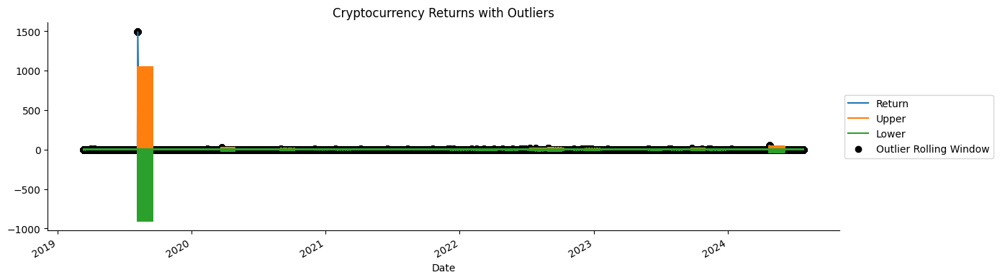

In [ ]:
plot_outliers_rolling(crypto_all_merged_df,plot_title="Cryptocurrency Returns with Outliers", plot_size=all_plots_size)

In [ ]:
def calculate_ticker_outliers_rolling(df, ticker_column, ticker, window=21, n_sigmas=3):
    """
    Calculate rolling mean, standard deviation, and identify outliers for a specific ticker.
    
    Parameters:
    - df: DataFrame containing the data
    - ticker_column: Column name containing tickers
    - ticker: The ticker symbol to filter the data
    - window: Rolling window size (default=21)
    - n_sigmas: Number of standard deviations for threshold (default=3)
    
    Returns:
    - df_ticker: DataFrame filtered by ticker with added columns for rolling mean, std, upper, lower thresholds, and outliers.
    """
    # Filter the DataFrame by the specified ticker
    df_ticker = df[df[ticker_column] == ticker].copy()
    
    # Ensure 'Return' column exists
    if 'Return' not in df_ticker.columns:
        raise ValueError("DataFrame must contain a 'Return' column")
    
    # Calculate rolling mean and standard deviation
    df_rolling = df_ticker['Return'].rolling(window=window).agg(['mean', 'std'])
    
    # Rename columns for clarity
    df_rolling.columns = ['Mean_Return', 'STD_Return']
    
    # Join back to the filtered DataFrame
    df_ticker = df_ticker.join(df_rolling)
    
    # Calculate upper and lower thresholds
    df_ticker['Upper'] = df_ticker['Mean_Return'] + n_sigmas * df_ticker['STD_Return']
    df_ticker['Lower'] = df_ticker['Mean_Return'] - n_sigmas * df_ticker['STD_Return']
    
    # Identify outliers
    df_ticker['Outlier_RW'] = (df_ticker['Return'] > df_ticker['Upper']) | (df_ticker['Return'] < df_ticker['Lower'])
    
    return df_ticker


In [ ]:
def plot_ticker_outliers_rolling(df_ticker, plot_title="Cryptocurrency Returns with Outliers", plots_size=(10, 6)):
    """
    Plot the returns together with thresholds and mark the outliers for a specific ticker.
    
    Parameters:
    - df_ticker: DataFrame filtered by ticker containing the data
    - plot_title: Title of the plot (default="Cryptocurrency Returns with Outliers")
    - all_plots_size: Tuple for figure size (default=(10, 6))
    """
    fig, ax = plt.subplots(figsize=plots_size)

    df_ticker[['Return', 'Upper', 'Lower']].plot(ax=ax)
    
    ax.scatter(df_ticker.loc[df_ticker['Outlier_RW']].index, 
               df_ticker.loc[df_ticker['Outlier_RW'], 'Return'], 
               color='black', label='Outlier Rolling Window')
    
    ax.set_title(plot_title)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    sns.despine()
    plt.tight_layout()
    plt.show()


In [ ]:
# Calculate outliers for the specific ticker
# df_ticker = calculate_ticker_outliers_rolling(crypto_all_merged_df, ticker_column='Ticker', ticker='BTC/USDT')


In [171]:
bitcoin_merged_df = crypto_all_merged_df[crypto_all_merged_df['Ticker'] == 'BTC/USDT']
bitcoin_merged_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,VIX,NVIDIA,USD_Index,BOJ,Risk_Free_Rate,Market_Return,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score
33287,2019-03-14,3866.26,3912.87,3822.33,3876.74,1.020429e+09,BTC/USDT,754397,299929,7416,...,13.5,4.110553,96.790001,37000.0,2.630,0.002711,8.397228,70747.0,0.0,23585.132409
33291,2019-03-18,3982.66,4032.99,3957.20,3987.93,1.100758e+09,BTC/USDT,729520,291505,7668,...,13.1,4.194719,96.519997,35650.0,2.602,0.001323,7.061709,70821.0,0.0,23609.353903


In [ ]:
bitcoin_merged_df[['Return', 'Upper', 'Lower']].head(2)

,Return,Upper,Lower
Date,,,
2019-03-14,0.002711,NaN,NaN
2019-03-14,0.002711,0.149459,-0.172746


- Check Tesla

In [ ]:
# import yfinance as yf

# df = yf.download("BTC-USD", 
#                  start="2019-01-01", 
#                  end="2024-12-31",
#                  progress=False)
# df

<Axes: title={'center': 'Detecting Outliers In All Dataset Before Cleaning'}, xlabel='Date', ylabel='Price Return (Percentage)'>

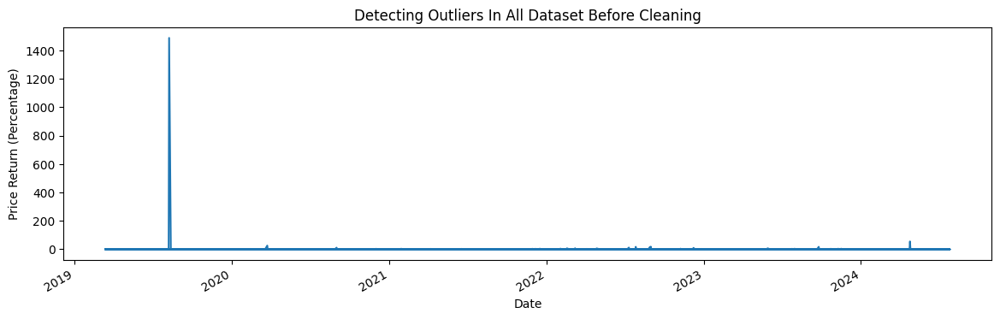

In [ ]:
crypto_all_merged_df['Return'].plot(
    figsize=(all_plots_size), 
    title="Detecting Outliers In All Dataset Before Cleaning",
    ylabel='Price Return (Percentage)'
    )

<Axes: xlabel='Date'>

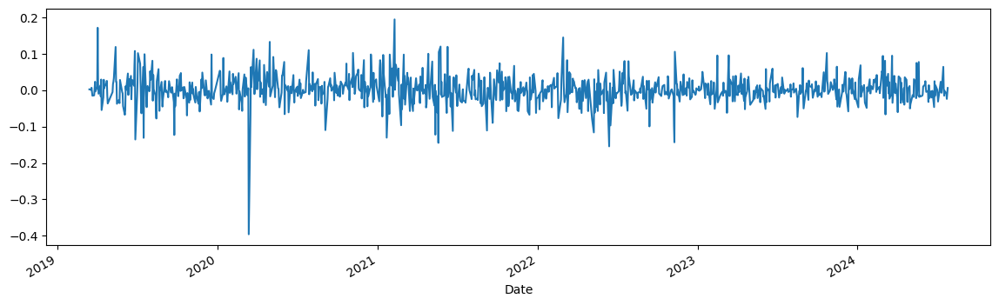

In [ ]:
bitcoin_merged_df['Return'].plot(figsize=(all_plots_size))

In [ ]:
def plot_rolling_outliers(df, window=21, n_sigmas=1.5, plot_size=(10, 6), title_text='Single Asset Price Returns with Outliers'):
    """
    Plot returns with rolling mean and std deviation, identifying outliers for the entire dataset.

    Parameters:
    - df: DataFrame containing the 'Return' column
    - window: Rolling window size (default=21)
    - n_sigmas: Number of standard deviations for threshold (default=1.5)
    - plot_size: Size of the plot (default=(10, 6))
    """
    # Ensure the DataFrame contains 'Return' column
    if 'Return' not in df.columns:
        raise ValueError("DataFrame must contain a 'Return' column")
    
    # df = df[["Return"]].copy()
    
    # Calculate rolling mean and standard deviation
    df_rolling = df[['Return']].rolling(window=window).agg(['mean', 'std'])
    df_rolling.columns = df_rolling.columns.droplevel()  # Remove multi-index
    
    # Join rolling stats back to the original DataFrame
    df = df.join(df_rolling)
    
    # Drop rows with NaN values
    # df.dropna(inplace=True)
    
    # Calculate upper and lower thresholds
    df["Rolling_Upper"] = df["mean"] + n_sigmas * df["std"]
    df["Rolling_Lower"] = df["mean"] - n_sigmas * df["std"]

    # Identify outliers
    df["Outlier"] = (df["Return"] > df["Rolling_Upper"]) | (df["Return"] < df["Rolling_Lower"])

    # Debug print to ensure correct calculation
    print(df.head(1))
    
    # Plot returns with rolling stats and outliers
    fig, ax = plt.subplots(figsize=plot_size)

    df[["Return", "Rolling_Upper", "Rolling_Lower"]].plot(ax=ax)
    
    ax.scatter(df.loc[df["Outlier"]].index, 
               df.loc[df["Outlier"], "Return"], 
               color="black", label="Outlier")
    
    ax.set_title(title_text)
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    
    sns.despine()
    plt.tight_layout()
    plt.show()


              Return  mean  std  Rolling_Upper  Rolling_Lower  Outlier
Date                                                                  
2019-03-14  0.002711   NaN  NaN            NaN            NaN    False


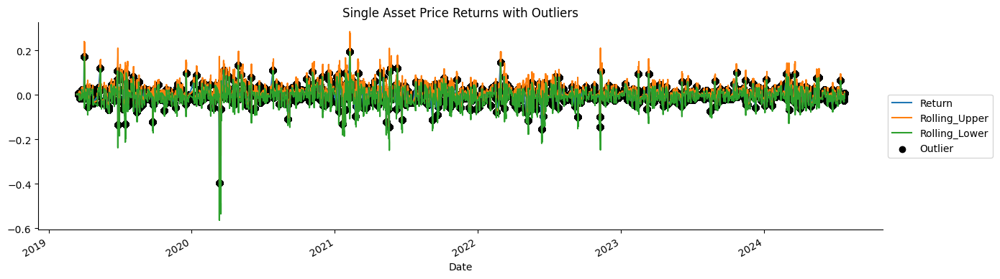

In [ ]:

plot_rolling_outliers(bitcoin_merged_df[['Return']], window=21, n_sigmas=1.5, plot_size=(all_plots_size))


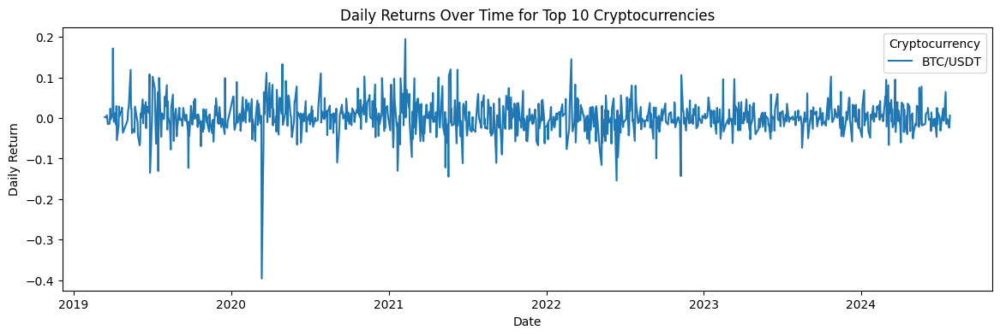

In [ ]:
plt.figure(figsize=(all_plots_size))
sns.lineplot(data=bitcoin_merged_df, x=bitcoin_merged_df.index, y='Return', hue='Ticker')
plt.title('Daily Returns Over Time for Top 10 Cryptocurrencies')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.legend(title='Cryptocurrency')
plt.show()

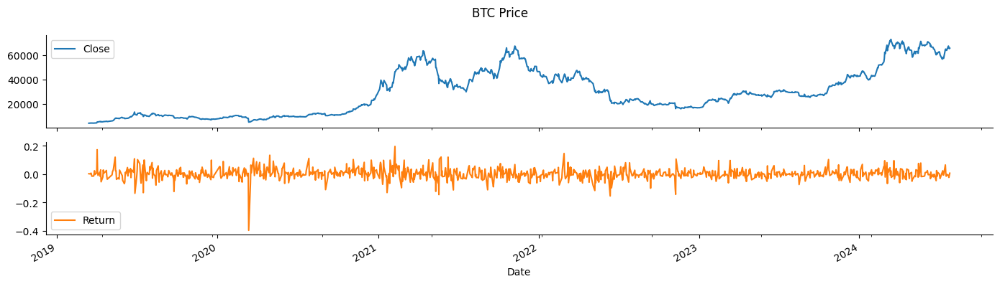

In [ ]:
# Plot the close prices and simple returns in one plot:
bitcoin_merged_df[["Close", "Return"]].plot(
          subplots=True, sharex=True, 
          title="BTC Price",
          figsize=(all_plots_size)
          )

sns.despine()
plt.tight_layout()

- seasonal patterns

In [ ]:
bitcoin_merged_df['NVIDIA']

Date
2019-03-14      4.110553
2019-03-14      4.110553
2019-03-14      4.110553
2019-03-14      4.110553
2019-03-14      4.110553
                 ...    
2024-07-25    112.279999
2024-07-25    112.279999
2024-07-25    112.279999
2024-07-25    112.279999
2024-07-25    112.279999
Name: NVIDIA, Length: 104663, dtype: float64

In [ ]:
bitcoin_merged_df["year"] = bitcoin_merged_df.index.year
bitcoin_merged_df["month"] = bitcoin_merged_df.index.strftime("%b")

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/2104198693.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bitcoin_merged_df["year"] = bitcoin_merged_df.index.year
/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/2104198693.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bitcoin_merged_df["month"] = bitcoin_merged_df.index.strftime("%b")


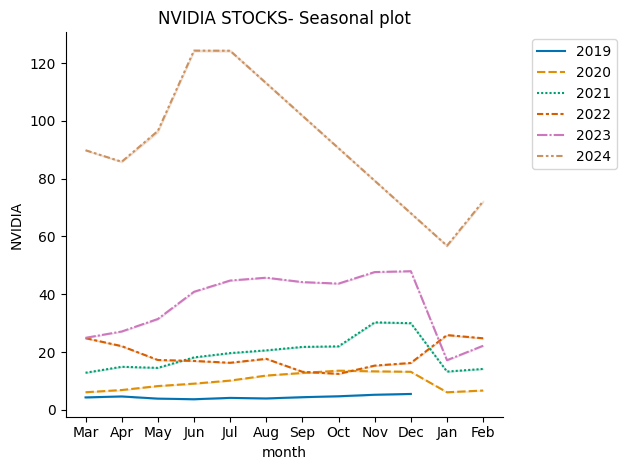

In [ ]:
sns.lineplot(data=bitcoin_merged_df, 
             x="month", 
             y="NVIDIA", 
             hue="year",
             style="year", 
             legend="full",
             palette="colorblind")

plt.title("NVIDIA STOCKS- Seasonal plot")
# plt.figure(figsize=all_plots_size)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

sns.despine()
plt.tight_layout()
# plt.savefig('images/figure_3_7', dpi=200)

In [ ]:
from statsmodels.graphics.tsaplots import month_plot, quarter_plot
import plotly.express as px

In [ ]:
bitcoin_merged_df["Gold_Price"].index

DatetimeIndex(['2019-03-14', '2019-03-14', '2019-03-14', '2019-03-14',
               '2019-03-14', '2019-03-14', '2019-03-14', '2019-03-14',
               '2019-03-14', '2019-03-14',
               ...
               '2024-07-25', '2024-07-25', '2024-07-25', '2024-07-25',
               '2024-07-25', '2024-07-25', '2024-07-25', '2024-07-25',
               '2024-07-25', '2024-07-25'],
              dtype='datetime64[ns]', name='Date', length=104663, freq=None)

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/1584383119.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = data.resample('M').mean()


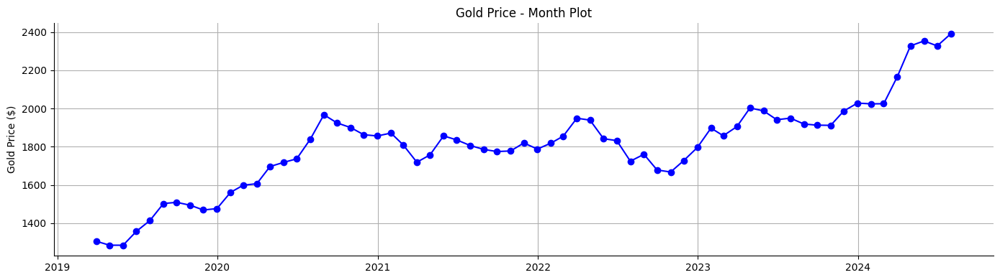

In [ ]:

def plot_monthly_data(data, ylabel="Close Price ($)", title="BTC Price - Month plot"):
    # Ensure the 'Date' column is in datetime format
    data = data.copy()  # Make a copy to avoid modifying the original dataframe
    
    if isinstance(data, pd.Series):
        data = data.to_frame()  # Convert to DataFrame for resampling if needed

    # data.index = pd.to_datetime(data.index)
    
    # Resample the data to monthly frequency
    monthly_data = data.resample('M').mean()
    
    # monthly_gold_price = bitcoin_merged_df['Gold_Price'].resample('M').mean()

    # Plot the monthly data
    plt.figure(figsize=(all_plots_size))
    plt.plot(monthly_data, marker='o', linestyle='-', color='b')
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(True)
    sns.despine()
    plt.tight_layout()
    plt.show()

# Usage
plot_monthly_data(bitcoin_merged_df["Gold_Price"], ylabel="Gold Price ($)", title="Gold Price - Month Plot")


In [ ]:
bitcoin_merged_df['Gold_Price'].head(3)

Date
2019-03-14    1293.400024
2019-03-14    1293.400024
2019-03-14    1293.400024
Name: Gold_Price, dtype: float64

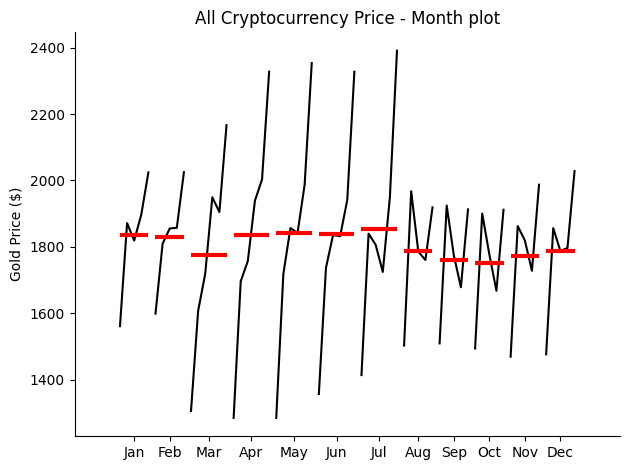

In [ ]:
# Resample to monthly data by taking the mean of each month
monthly_gold_price = crypto_all_merged_df['Gold_Price'].resample('MS').mean()

# Plot the month plot with the aggregated monthly data
month_plot(monthly_gold_price, ylabel="Gold Price ($)")
plt.title("All Cryptocurrency Price - Month plot")
sns.despine()
plt.tight_layout()


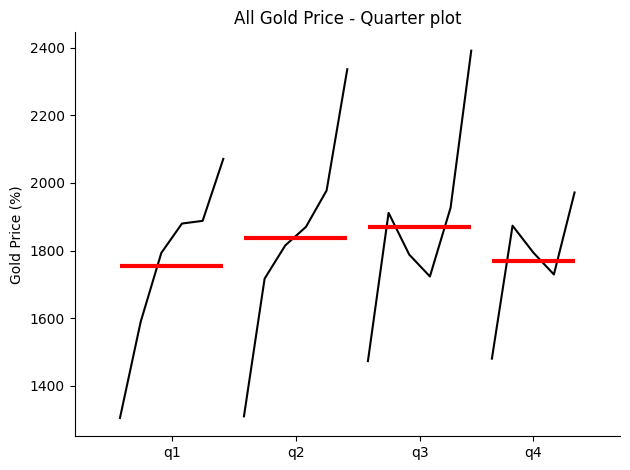

In [ ]:
quarter_plot(crypto_all_merged_df["Gold_Price"].resample("QE").mean(), 
             ylabel="Gold Price (%)")
plt.title("All Gold Price - Quarter plot");

sns.despine()
plt.tight_layout()

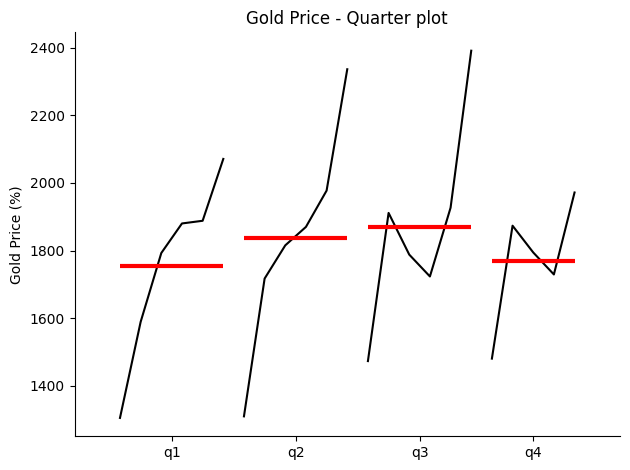

In [ ]:
# quarter plot
quarter_plot(bitcoin_merged_df["Gold_Price"].resample("QE").mean(), 
             ylabel="Gold Price (%)")
plt.title("Gold Price - Quarter plot");

sns.despine()
plt.tight_layout()

In [ ]:
bitcoin_merged_df['Gold_Price']

Date
2019-03-14    1293.400024
2019-03-14    1293.400024
2019-03-14    1293.400024
2019-03-14    1293.400024
2019-03-14    1293.400024
                 ...     
2024-07-25    2351.899902
2024-07-25    2351.899902
2024-07-25    2351.899902
2024-07-25    2351.899902
2024-07-25    2351.899902
Name: Gold_Price, Length: 104663, dtype: float64

In [ ]:
# # polar seasonal
# fig = px.line_polar(
#     bitcoin_merged_df, r="Gold_Price", theta="month", 
#     color="year", line_close=True, 
#     title="Gold Price - Polar seasonal plot",
#     width=600, height=500,
#     range_r=[3, 7]
# )

# fig.show()

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/3995256794.py:9: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dates = pd.to_datetime(list(map(lambda x: '-'.join(x) + '-1',


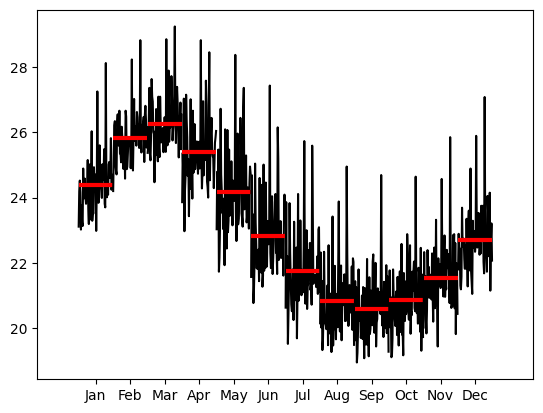

In [ ]:
import statsmodels.api as sm
import pandas as pd

dta = sm.datasets.elnino.load_pandas().data
dta['YEAR'] = dta.YEAR.astype(int).astype(str)

dta = dta.set_index('YEAR').T.unstack()

dates = pd.to_datetime(list(map(lambda x: '-'.join(x) + '-1',
                                dta.index.values)))

dta.index = pd.DatetimeIndex(dates, freq='MS')
fig = sm.graphics.tsa.month_plot(dta)
# plot()

- `check duplicated rows`

In [ ]:
# # Check for exact duplicates across all columns
# duplicate_rows = crypto_all_merged_df.duplicated()

# # Display the duplicates
# crypto_all_merged_df[duplicate_rows]


In [ ]:
# Remove exact duplicates
crypto_all_merged_df = crypto_all_merged_df.drop_duplicates()
crypto_all_merged_df

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,...,Market_Return,Reddit_Engagement_Score,Code_Repo_Activity_Score,Twitter_Engagement_Score,Overall_Social_Sentiment_Score,Mean_Return,STD_Return,Upper,Lower,Outlier_RW
Date,,,,,,,,,,,,,,,,,,,,,
2019-03-14,0.1029,0.1062,0.1001,0.1009,84237.31,ABT/USDT,38,48,0,23280.754636,...,0.002711,8.397228,70747.0,0.0,23585.132409,NaN,NaN,NaN,NaN,False
2019-03-14,0.1029,0.1062,0.1001,0.1009,84237.31,ABT/USDT,38,48,0,23280.754636,...,0.002711,8.397228,70747.0,0.0,23585.132409,-0.011643,0.053701,0.149459,-0.172746,False
2019-03-14,0.1029,0.1062,0.1001,0.1009,84237.31,ABT/USDT,38,48,0,23280.754636,...,0.002711,8.397228,70747.0,0.0,23585.132409,0.005107,0.030687,0.097169,-0.086955,False
2019-03-14,0.1029,0.1062,0.1001,0.1009,84237.31,ABT/USDT,38,48,0,23280.754636,...,0.002711,8.397228,70747.0,0.0,23585.132409,0.001722,0.035471,0.108135,-0.104691,False
2019-03-14,0.1029,0.1062,0.1001,0.1009,84237.31,ABT/USDT,38,48,0,23280.754636,...,0.002711,8.397228,70747.0,0.0,23585.132409,-0.015872,0.071297,0.198019,-0.229763,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-27,2.2850,2.2860,1.9590,1.9930,66141003.30,THETA/USDT,23,18,0,242.667722,...,-0.065037,23.887813,76475.0,0.0,25499.629271,-0.015490,0.089110,0.251840,-0.282819,False
2021-01-27,2.2850,2.2860,1.9590,1.9930,66141003.30,THETA/USDT,23,18,0,242.667722,...,-0.065037,23.887813,76475.0,0.0,25499.629271,0.001258,0.010136,0.031667,-0.029151,True
2021-01-27,2.2850,2.2860,1.9590,1.9930,66141003.30,THETA/USDT,23,18,0,242.667722,...,-0.065037,23.887813,76475.0,0.0,25499.629271,-0.015908,0.065169,0.179600,-0.211417,False


In [ ]:
# Check for exact duplicates across all columns
duplicate_rows = crypto_all_merged_df.duplicated()

# Display the duplicates
print("duplicate rows after removing:", crypto_all_merged_df[duplicate_rows])
print("data structure after removing:", crypto_all_merged_df.shape)


duplicate rows after removing: Empty DataFrame
Columns: [Open, High, Low, Close, Volume, Ticker, Active Addresses, Transaction Count, Large Transaction Count, Average Transaction Value, Hashrate, Difficulty, Current Supply, Market Cap, Return, Rolling_Mean, Rolling_Std, Z_Score, Gold_Price, JPY_USD, SP500, VIX, NVIDIA, USD_Index, BOJ, Risk_Free_Rate, Market_Return, Reddit_Engagement_Score, Code_Repo_Activity_Score, Twitter_Engagement_Score, Overall_Social_Sentiment_Score, Mean_Return, STD_Return, Upper, Lower, Outlier_RW]
Index: []

[0 rows x 36 columns]
data structure after removing: (10598549, 36)


In [ ]:
import cufflinks as cf
from plotly.offline import iplot

# cf.go_offline()
cf.set_config_file(offline=False)
cf.get_config_file()

{'sharing': 'public',
 'theme': 'pearl',
 'colorscale': 'dflt',
 'offline': False,
 'offline_connected': True,
 'offline_url': '',
 'offline_show_link': True,
 'offline_link_text': 'Export to plot.ly',
 'datagen_mode': 'stocks',
 'dimensions': None,
 'margin': None,
 'offline_config': None}

In [ ]:
# qf = cf.QuantFig(
#     bitcoin_merged_df, title="Twitter's Stock Price", 
#     legend="top", name="Twitter's stock prices in 2018"
# )

# qf.add_volume()
# qf.add_sma(periods=20, column="Close", color="red")
# qf.add_ema(periods=20, color="green") 

# qf.iplot()

- Leverage effect

In [ ]:

# Calculate volatility measures as moving standard deviations


- `Check and Handle Stationarity` 

In [ ]:
# import libraries 
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tools.sm_exceptions import InterpolationWarning

def adf_test(x):
    '''
    Function for performing the Augmented Dickey-Fuller test for stationarity
    
    Null Hypothesis: time series is not stationary
    Alternate Hypothesis: time series is stationary

    Parameters
    ----------
    x : pd.Series / np.array
        The time series to be checked for stationarity
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the ADF test's results
    '''

    indices = ['Test Statistic', 'p-value',
               '# of Lags Used', '# of Observations Used']

    adf_test = adfuller(x, autolag='AIC')
    results = pd.Series(adf_test[0:4], index=indices)

    for key, value in adf_test[4].items():
        results[f'Critical Value ({key})'] = value

    return results


def kpss_test(x, h0_type='c'):
    '''
    Function for performing the Kwiatkowski-Phillips-Schmidt-Shin test for stationarity

    Null Hypothesis: time series is stationary
    Alternate Hypothesis: time series is not stationary

    Parameters
    ----------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    h0_type: str{'c', 'ct'}
        Indicates the null hypothesis of the KPSS test:
            * 'c': The data is stationary around a constant(default)
            * 'ct': The data is stationary around a trend
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the KPSS test's results
    '''

    indices = ['Test Statistic', 'p-value', '# of Lags']

    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)

    for key, value in kpss_test[3].items():
        results[f'Critical Value ({key})'] = value

    return results


def test_autocorrelation(x, n_lags=20, alpha=0.05, h0_type='c', figsize=all_plots_size):
    '''
    Function for testing the stationarity of a series by using:
    * the ADF test
    * the KPSS test
    * ACF/PACF plots

    Parameters
    ----------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    n_lags : int
        The number of lags for the ACF/PACF plots
    alpha : float
        Significance level for the ACF/PACF plots
    h0_type: str{'c', 'ct'}
        Indicates the null hypothesis of the KPSS test:
            * 'c': The data is stationary around a constant(default)
            * 'ct': The data is stationary around a trend

    Returns
    -------
    fig : matplotlib.figure.Figure
        Figure containing the ACF/PACF plot
    '''

    adf_results = adf_test(x)
    kpss_results = kpss_test(x, h0_type=h0_type)

    print('ADF test statistic: {:.2f} (p-val: {:.2f})'.format(adf_results['Test Statistic'],
                                                             adf_results['p-value']))
    print('KPSS test statistic: {:.2f} (p-val: {:.2f})'.format(kpss_results['Test Statistic'],
                                                              kpss_results['p-value']))

    fig, ax = plt.subplots(2, figsize=(all_plots_size))
    plot_acf(x, ax=ax[0], lags=n_lags, alpha=alpha)
    plot_pacf(x, ax=ax[1], lags=n_lags, alpha=alpha)

    return fig


In [ ]:
# adf_results = adf_test(crypto_all_merged_df['Return'])
# print('all assets adf_results:', '\n', adf_results)

In [ ]:
kpss_results = kpss_test(crypto_all_merged_df['Return'])
print('all assets kpss_results:', '\n', kpss_results)

all assets kpss_results: 
 Test Statistic              0.094701
p-value                     0.100000
# of Lags                1663.000000
Critical Value (10%)        0.347000
Critical Value (5%)         0.463000
Critical Value (2.5%)       0.574000
Critical Value (1%)         0.739000
dtype: float64


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/2500038012.py:62: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




-  KPSS Test Results:

- **Test Statistic:** 0.095
- **p-value:** 0.100000
- **# of Lags:** 1663
- **Critical Values:**
  - 1%: 0.739
  - 5%: 0.463
  - 10%: 0.347

- Interpretation:

- **Test Statistic vs Critical Values:**
  - The test statistic (0.095) is well below the critical values at the 1%, 5%, and 10% levels. This suggests that the test statistic does not exceed the thresholds for non-stationarity.

- **p-value:**
  - The p-value (0.100) is above common significance levels (such as 0.01, 0.05). This implies that the null hypothesis of stationarity cannot be rejected.

- **Warning Message:**
  - The warning indicates that the test statistic is outside the range of p-values available in the look-up table. In this case, the actual p-value is likely greater than 0.1. This reinforces the finding that the time series is stationary since the p-value is not significant enough to reject the null hypothesis of stationarity.

- **KPSS Test:** Suggests that the time series is stationary, as the test statistic is below the critical values and the p-value is high.

- `Summary:`
Both ADF and KPSS tests indicate that the time series for all assets is stationary. The KPSS test's results confirm this, given that the test statistic is below the critical values and the p-value is high.


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/2500038012.py:62: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




ADF test statistic: -27.43 (p-val: 0.00)
KPSS test statistic: 0.24 (p-val: 0.10)


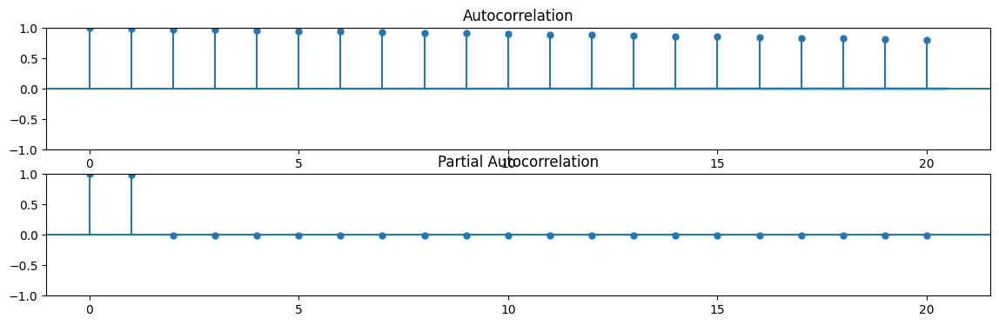

In [ ]:
fig = test_autocorrelation(bitcoin_merged_df['Return'])
plt.show()


In [ ]:
crypto_all_merged_df[['Return', 'Mean_Return', 'STD_Return']].head(2)

,Return,Mean_Return,STD_Return
Date,,,
2019-03-14,-0.019436,NaN,NaN
2019-03-14,-0.019436,-0.011643,0.053701


- Remove Outliers

In [ ]:
def remove_outliers(df, column, z_thresh=3):
    df = df.copy()
    z_scores = np.abs((df[column] - df[column].mean()) / df[column].std())
    
    return df[z_scores < z_thresh]


In [ ]:
# crypto_all_merged_df = remove_outliers(crypto_all_merged_df, 'Return')

In [ ]:
# yf_crypto_merged_df.set_index("Date",inplace=True)
# yf_crypto_merged_df.head(2)

In [ ]:
# # handling infinit numbers
# yf_crypto_merged_df['Return'].replace([np.inf, -np.inf], np.nan, inplace=True)
# yf_crypto_merged_df['Return'].describe()

In [ ]:
# yf_crypto_merged_df['Return'].plot(
#     figsize=(all_plots_size), 
#     title="Detecting Outliers In All Dataset Before Cleaning(yf_crypto_merged_df) ",
#     ylabel='Price Return (Percentage)'
#     )

In [172]:

def analyze_outliers(df, return_col='Return', close_col='Close', lower_quantile=0.01, upper_quantile=0.99):
    """
    Analyze outliers in a DataFrame and compare their statistics with non-outlier data.
    Includes additional return statistics for both original and outlier-removed data.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing cryptocurrency data with at least 'Ticker', 'Return', and 'Close' columns.
    return_col : str
        Name of the column representing returns. Default is 'Return'.
    close_col : str
        Name of the column representing closing prices. Default is 'Close'.
    lower_quantile : float
        Lower quantile threshold to identify outliers. Default is 0.01.
    upper_quantile : float
        Upper quantile threshold to identify outliers. Default is 0.99.

    Returns
    -------
    pd.DataFrame, pd.DataFrame, pd.DataFrame
        comparison_df_sorted : DataFrame
            DataFrame with comparison between outlier and normal range statistics.
        df : DataFrame
            The original DataFrame provided.
        outlier_cleaned_df : DataFrame
            DataFrame with outliers removed.
    """
    
        # Replace infinities with NaN
    df[return_col].replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # yf_crypto_merged_df['Return'].replace([np.inf, -np.inf], np.nan, inplace=True)

    # Set quantile thresholds
    lower_bound = df[return_col].quantile(lower_quantile)
    upper_bound = df[return_col].quantile(upper_quantile)
    max_return = df[return_col].max()
    min_return = df[return_col].min()
    
    print('Outlier stats:')
    print(f'Lower Bound: {lower_bound}; Upper Bound: {upper_bound}; Max: {max_return}; Min: {min_return}\n')

    # Identify outliers
    outliers_df = df[(df[return_col] < lower_bound) | (df[return_col] > upper_bound)]

    # Normal range (non-outliers)
    normal_range_df = df[(df[return_col] >= lower_bound) & (df[return_col] <= upper_bound)]

    # Aggregation for outliers
    outlier_analysis = outliers_df.groupby('Ticker').agg(
        outlier_mean_return=(return_col, 'mean'),
        outlier_max_return=(return_col, 'max'),
        outlier_mean_close=(close_col, 'mean'),
        outlier_max_close=(close_col, 'max')
    ).reset_index()

    # Aggregation for normal range
    normal_analysis = normal_range_df.groupby('Ticker').agg(
        normal_mean_return=(return_col, 'mean'),
        normal_max_return=(return_col, 'max'),
        normal_mean_close=(close_col, 'mean'),
        normal_max_close=(close_col, 'max')
    ).reset_index()

    # Aggregation for original data
    original_analysis = df.groupby('Ticker').agg(
        original_mean_return=(return_col, 'mean'),
        original_max_return=(return_col, 'max'),
        original_mean_close=(close_col, 'mean'),
        original_max_close=(close_col, 'max')
    ).reset_index()

    # Merge the results
    comparison_df = pd.merge(outlier_analysis, normal_analysis, on='Ticker', suffixes=('_outlier', '_normal'))
    comparison_df = pd.merge(comparison_df, original_analysis, on='Ticker')

    # Calculate return difference
    comparison_df['return_difference'] = comparison_df['outlier_mean_return'] - comparison_df['normal_mean_return']
    comparison_df_sorted = comparison_df.sort_values(by='return_difference', ascending=False)
    
    # Cleaned DataFrame with outliers removed
    outlier_cleaned_df = df.copy()
    outlier_cleaned_df.loc[(df[return_col] < lower_bound) | (df[return_col] > upper_bound), return_col] = pd.NA
    outlier_cleaned_df = outlier_cleaned_df.dropna(subset=[return_col])

    return comparison_df_sorted, df, outlier_cleaned_df


In [181]:
outlier_yf_crypto_merged_df, original_yf_crypto_merged_df, outlier_cleaned_yf_crypto_merged_df = analyze_outliers(yf_crypto_merged_df)
outlier_yf_crypto_merged_df.head(10)

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_2873/4247665778.py:31: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[return_col].replace([np.inf, -np.inf], np.nan, inplace=True)
/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_2873/4247665778.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[return_col].replace([n

Outlier stats:
Lower Bound: -0.2598303416880432; Upper Bound: 0.39183979558162085; Max: 231139602.24470422; Min: -0.9999999838505823



,Ticker,outlier_mean_return,outlier_max_return,outlier_mean_close,outlier_max_close,normal_mean_return,normal_max_return,normal_mean_close,normal_max_close,original_mean_return,original_max_return,original_mean_close,original_max_close,return_difference
1409,QUICK-USD,1.926163e+07,2.311396e+08,583.215010,1252.058472,-0.003984,0.377276,162.064302,1051.810547,352884.890064,2.311396e+08,169.780040,1252.058472,1.926163e+07
823,INV-USD,1.087046e+07,1.195750e+08,579.578265,1554.475220,-0.012462,0.299012,197.315308,1615.762085,184245.010819,1.195750e+08,203.794341,1615.762085,1.087046e+07
1844,WEETH-USD,9.056805e+06,9.056805e+06,2318.542236,2318.542236,0.003602,0.189367,3230.762308,4178.279297,76107.605534,9.056805e+06,3223.096594,4178.279297,9.056805e+06
1282,PANDORA-USD,1.917828e+06,7.671309e+06,13100.932373,25213.101562,-0.003786,0.343361,8110.494829,24230.974609,82487.215730,7.671309e+06,8325.137304,25213.101562,1.917828e+06
1127,MYRIA-USD,1.781489e+06,5.468163e+07,2613.911785,42519.902344,0.002008,0.374359,298.193719,21571.808594,329013.739970,5.468163e+07,725.871380,42519.902344,1.781489e+06
412,CWS-USD,1.450228e+06,1.305205e+07,9.916291,26.352022,-0.005396,0.385410,4.630320,55.342171,19597.669277,1.305205e+07,4.701752,55.342171,1.450228e+06
1941,YFI-USD,1.215407e+06,4.861628e+06,25432.579193,48368.699219,0.000341,0.337489,17066.063325,82745.187500,6330.245889,4.861628e+06,17109.638929,82745.187500,1.215407e+06
981,LPOOL-USD,9.722262e+05,8.750034e+06,7.056450,52.500210,-0.004365,0.384279,2.104728,40.712223,13338.464524,8.750034e+06,2.172663,52.500210,9.722262e+05
765,HIGH-USD,7.848248e+05,1.569650e+06,3.184139,4.708953,-0.005424,0.354086,3.511470,29.613567,2956.020114,1.569650e+06,3.510238,29.613567,7.848248e+05
699,GME-USD,5.703705e+05,5.133332e+06,157.943656,280.000000,-0.001181,0.387945,103.480196,310.399994,10807.018464,5.133332e+06,104.512135,310.399994,5.703705e+05


In [ ]:
# original_yf_crypto_merged_df.shape, yf_crypto_merged_df.shape,outlier_cleaned_yf_crypto_merged_df.shape

In [ ]:
# outlier_cleaned_yf_crypto_merged_df.columns

`Key Observations:`

1. **Extreme Outlier Returns**:
   - **QUICK-USD** has the highest outlier mean return at approximately 19.26 million, far surpassing its normal mean return of -0.003984.
   - **INV-USD** and **WEETH-USD** also exhibit very high outlier mean returns, with over 10 million and 9 million, respectively.

2. **Close Prices**:
   - Despite the extreme returns, the `Close` prices of outliers (e.g., **PANDORA-USD**, **MYRIA-USD**) show substantial differences from their normal range, indicating significant price spikes during these periods.
   - For instance, **MYRIA-USD** shows an outlier mean `Close` price of 2,613.91 compared to a normal mean of 298.19, suggesting price volatility.

3. **Return Differences**:
   - The `return_difference` column quantifies the gap between outlier and normal returns. For **QUICK-USD**, the difference is incredibly large, highlighting an extreme outlier behavior.


1. **Use Case**:
   - This data can be very useful for anomaly detection and understanding the characteristics of extreme price movements. It might be beneficial to investigate these periods further to determine any underlying causes.

2. **Visualization**:
   - visualizing the return distributions for these tickers, focusing on the comparison between outlier periods and the normal range is desirable.

3. **Risk Management**:
   - When conducting risk analysis, this data could inform risk models, particularly in identifying assets prone to extreme volatility.

Based on the results you've provided, here's a markdown summary that highlights the comparison between outlier periods and normal ranges for the tickers:

---

`Outlier vs. Normal Range Comparison`

`Summary of Key Metrics`

| Ticker       | Outlier Mean Return | Outlier Max Return | Outlier Mean Close | Outlier Max Close | Normal Mean Return | Normal Max Return | Normal Mean Close | Normal Max Close | Return Difference |
|--------------|----------------------|---------------------|---------------------|--------------------|---------------------|--------------------|-------------------|-------------------|--------------------|
| QUICK-USD    | 1.93e+07             | 2.31e+08            | 583.22              | 1252.06            | -0.00398            | 0.37728            | 162.06            | 1051.81           | 1.93e+07           |
| INV-USD      | 1.09e+07             | 1.20e+08            | 579.58              | 1554.48            | -0.01246            | 0.29901            | 197.32            | 1615.76           | 1.09e+07           |
| WEETH-USD    | 9.06e+06             | 9.06e+06            | 2318.54             | 2318.54            | 0.00360             | 0.18937            | 3230.76           | 4178.28           | 9.06e+06           |
| PANDORA-USD  | 1.92e+06             | 7.67e+06            | 13100.93            | 25213.10           | -0.00379            | 0.34336            | 8110.49           | 24230.97          | 1.92e+06           |
| MYRIA-USD    | 1.78e+06             | 5.47e+07            | 2613.91             | 42519.90           | 0.00201             | 0.37436            | 298.19            | 21571.81          | 1.78e+06           |
| CWS-USD      | 1.45e+06             | 1.31e+07            | 9.92                | 26.35              | -0.00540            | 0.38541            | 4.63              | 55.34             | 1.45e+06           |
| YFI-USD      | 1.22e+06             | 4.86e+06            | 25432.58            | 48368.70           | 0.00034             | 0.33749            | 17066.06          | 82745.19          | 1.22e+06           |
| LPOOL-USD    | 9.72e+05             | 8.75e+06            | 7.06                | 52.50              | -0.00437            | 0.38428            | 2.10              | 40.71             | 9.72e+05           |
| HIGH-USD     | 7.85e+05             | 1.57e+06            | 3.18                | 4.71               | -0.00542            | 0.35409            | 3.51              | 29.61             | 7.85e+05           |
| GME-USD      | 5.70e+05             | 5.13e+06            | 157.94              | 280.00             | -0.00118            | 0.38795            | 103.48            | 310.40            | 5.70e+05           |


`Insights:`

- **High Return Values**: Tickers like `QUICK-USD` and `INV-USD` show very high mean returns during outlier periods compared to their normal ranges.
- **Extreme Values**: Outliers for some tickers, such as `WEETH-USD` and `PANDORA-USD`, have mean returns and maximum returns that are significantly higher than their normal ranges.
- **Impact on Closing Prices**: The outlier periods also show higher mean and maximum closing prices for some tickers, like `PANDORA-USD` and `MYRIA-USD`.


In [ ]:
# yf_crypto_merged_df['Ticker'].nunique(), outlier_cleaned_yf_crypto_merged_df['Ticker'].nunique(), original_yf_crypto_merged_df['Ticker'].nunique()

- 2 tickers are removed after outlier removal

In [ ]:
# # Visualization function
# def plot_return_distributions(df, tickers, outlier_col='Outlier', return_col='Return'):
#     for ticker in tickers:
#         # Filter data for the ticker
#         ticker_data = df[df['Ticker'] == ticker]

#         # Separate outlier and normal periods
#         outlier_data = ticker_data[ticker_data[outlier_col]]
#         normal_data = ticker_data[~ticker_data[outlier_col]]

#         # Create plots
#         plt.figure(figsize=(14, 7))
#         sns.histplot(outlier_data[return_col], bins=50, color='red', label='Outlier Periods', kde=True)
#         sns.histplot(normal_data[return_col], bins=50, color='blue', label='Normal Periods', kde=True)
#         plt.title(f'Return Distribution for {ticker}')
#         plt.xlabel('Return')
#         plt.ylabel('Frequency')
#         plt.legend()
#         plt.show()


In [173]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_return_distributions(comparison_df_sorted, original_df, cleaned_df, return_col='Return', close_col='Close'):
    """
    Plot return distributions for outlier periods and normal ranges, along with comparison with cleaned data.
    
    Parameters
    ----------
    comparison_df_sorted : pd.DataFrame
        DataFrame with comparison between outlier and normal range statistics.
    original_df : pd.DataFrame
        The original DataFrame with outliers.
    cleaned_df : pd.DataFrame
        DataFrame with outliers removed.
    return_col : str
        Name of the column representing returns. Default is 'Return'.
    close_col : str
        Name of the column representing closing prices. Default is 'Close'.
    """
    
    # Plotting setup
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='row')

    # Distribution of Returns for Outliers
    sns.histplot(original_df[original_df[return_col].isna() == False][return_col], kde=True, bins=100, ax=ax[0, 0], color='blue')
    sns.histplot(original_df[(original_df[return_col] < comparison_df_sorted['outlier_mean_return'].max()) & (original_df[return_col] > comparison_df_sorted['outlier_mean_return'].min())][return_col], kde=True, bins=100, ax=ax[0, 0], color='orange', alpha=0.5)
    ax[0, 0].set_title('Return Distribution: Outliers vs. Normal Range')
    ax[0, 0].set_xlabel('Return')
    ax[0, 0].set_ylabel('Frequency')

    # Return Distribution for Cleaned Data
    sns.histplot(cleaned_df[return_col], kde=True, bins=100, ax=ax[0, 1], color='green')
    ax[0, 1].set_title('Return Distribution: Cleaned Data')
    ax[0, 1].set_xlabel('Return')
    ax[0, 1].set_ylabel('Frequency')

    # Distribution of Closing Prices for Outliers
    sns.histplot(original_df[original_df[return_col].isna() == False][close_col], kde=True, bins=100, ax=ax[1, 0], color='blue')
    sns.histplot(original_df[(original_df[return_col] < comparison_df_sorted['outlier_mean_return'].max()) & (original_df[return_col] > comparison_df_sorted['outlier_mean_return'].min())][close_col], kde=True, bins=100, ax=ax[1, 0], color='orange', alpha=0.5)
    ax[1, 0].set_title('Close Price Distribution: Outliers vs. Normal Range')
    ax[1, 0].set_xlabel('Close Price')
    ax[1, 0].set_ylabel('Frequency')

    # Close Price Distribution for Cleaned Data
    sns.histplot(cleaned_df[close_col], kde=True, bins=100, ax=ax[1, 1], color='green')
    ax[1, 1].set_title('Close Price Distribution: Cleaned Data')
    ax[1, 1].set_xlabel('Close Price')
    ax[1, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()



In [180]:
outlier_crypto_all_merged_df, original_crypto_all_merged_df, outlier_cleaned_crypto_all_merged_df = analyze_outliers(crypto_all_merged_df)

Outlier stats:
Lower Bound: -0.20796185822355862; Upper Bound: 0.27431606716765955; Max: 1487.771466314399; Min: -0.9758967297762479



/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_2873/4247665778.py:31: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[return_col].replace([np.inf, -np.inf], np.nan, inplace=True)
/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_2873/4247665778.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[return_col].replace([n

In [175]:
outlier_crypto_all_merged_df.head(10)

,Ticker,outlier_mean_return,outlier_max_return,outlier_mean_close,outlier_max_close,normal_mean_return,normal_max_return,normal_mean_close,normal_max_close,original_mean_return,original_max_return,original_mean_close,original_max_close,return_difference
46,FTT/USDT,124.171123,1487.771466,1.045206e+01,6.515000e+01,0.000087,0.270821,1.417590e+01,7.963000e+01,1.453796,1487.771466,1.413230e+01,7.963000e+01,124.171036
80,OPEN/USDT,2.222299,54.931686,4.327592e-03,3.668000e-02,-0.003122,0.271718,2.439526e-03,3.715000e-02,0.053382,54.931686,2.487465e-03,3.715000e-02,2.225422
100,SNM/USDT,1.732539,17.166667,2.065446e-01,6.108000e-01,0.000851,0.229640,9.902000e-02,8.501000e-01,0.031261,17.166667,1.009082e-01,8.501000e-01,1.731688
38,EOSDAC/USDT,0.761158,25.766667,2.636057e-03,2.409000e-02,-0.002353,0.259016,1.856453e-03,1.890000e-02,0.025208,25.766667,1.884595e-03,2.409000e-02,0.763511
34,EDG/USDT,0.729598,17.881413,1.330127e-02,5.130000e-02,0.001115,0.265383,2.227621e-02,1.345000e-01,0.107993,17.881413,2.095947e-02,1.345000e-01,0.728483
5,AGI/USDT,0.687809,3.310000,1.920786e-01,5.821000e-01,-0.001255,0.268797,1.196094e-01,5.408000e-01,0.014425,3.310000,1.212585e-01,5.821000e-01,0.689064
48,GARD/USDT,0.665477,11.128119,3.059124e-04,1.011000e-03,-0.004722,0.265985,7.514903e-05,9.484000e-04,0.006394,11.128119,7.897632e-05,1.011000e-03,0.670198
43,FREE/USDT,0.560846,7.000000,1.928571e-07,6.400000e-07,-0.001684,0.272727,1.558358e-07,7.200000e-07,0.005999,7.000000,1.563415e-07,7.200000e-07,0.562530
85,PRO/USDT,0.504900,4.049166,7.857730e-01,2.492000e+00,-0.002682,0.267366,6.214892e-01,4.173000e+00,0.017126,4.049166,6.279003e-01,4.173000e+00,0.507582
39,ESS/USDT,0.487086,3.114642,6.963400e-04,1.450000e-03,-0.001173,0.245047,1.152741e-03,1.413000e-03,0.003591,3.114642,1.148289e-03,1.450000e-03,0.488259


In [176]:
original_crypto_all_merged_df.shape, crypto_all_merged_df.shape,outlier_cleaned_crypto_all_merged_df.shape

((104663, 32), (104663, 32), (102569, 32))

In [178]:
outlier_cleaned_crypto_all_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 102569 entries, 19 to 234531
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date                            102569 non-null  datetime64[ns]
 1   Open                            102569 non-null  float64       
 2   High                            102569 non-null  float64       
 3   Low                             102569 non-null  float64       
 4   Close                           102569 non-null  float64       
 5   Volume                          102569 non-null  float64       
 6   Ticker                          102569 non-null  object        
 7   Active Addresses                102569 non-null  int64         
 8   Transaction Count               102569 non-null  int64         
 9   Large Transaction Count         102569 non-null  int64         
 10  Average Transaction Value       102569 non-null  float64    

In [179]:
outlier_cleaned_crypto_all_merged_df.to_parquet("../data_outputs/cleaned_crypto_df.parquet")

In [182]:
outlier_cleaned_yf_crypto_merged_df.to_parquet('../data_outputs/yf_merged_df.parquet')

In [ ]:

# plot_return_distributions(outlier_yf_crypto_merged_df, original_yf_crypto_merged_df, outlier_cleaned_yf_crypto_merged_df)

In [ ]:
# top_10_tickers_vol = 
# top 10 by vol
# yf_crypto_merged_df.groupby('Ticker')['Volume'].mean().nlargest(10).index


In [ ]:
# yf_crypto_merged_df = remove_outliers(yf_crypto_merged_df, 'Return')

- check after removing

In [ ]:
# outlier_cleaned_yf_crypto_merged_df['Return'].plot(
#     figsize=(all_plots_size), 
#     title="Detecting Outliers In All Dataset After Cleaning(yf_crypto_merged_df)",
#     ylabel='Price Return (Percentage)'
#     )

<Axes: title={'center': 'Detecting Outliers In All Dataset After Cleaning(crypto_all_merged_df)'}, xlabel='Date', ylabel='Price Return (Percentage)'>

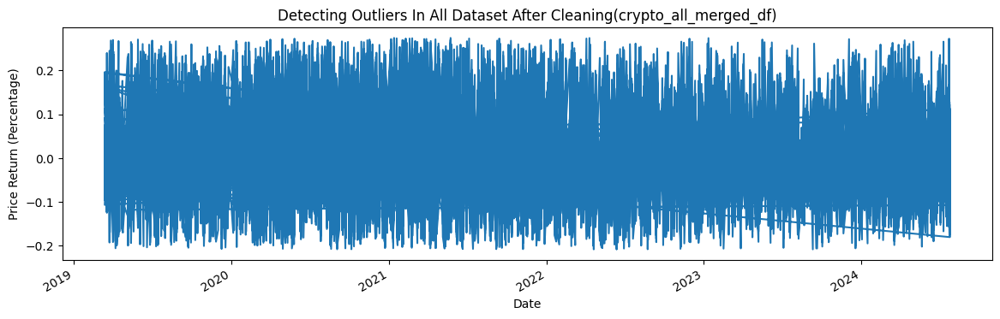

In [ ]:
outlier_cleaned_crypto_all_merged_df['Return'].plot(
    figsize=(all_plots_size), 
    title="Detecting Outliers In All Dataset After Cleaning(crypto_all_merged_df)",
    ylabel='Price Return (Percentage)'
    )

In [ ]:
# crypto_all_merged_df['Return'].plot(
#     figsize=(all_plots_size), 
#     title="Detecting Outliers In All Dataset After Cleaning",
#     ylabel='Price Return (Percentage)'
#     )

In [ ]:
# plot_outliers_rolling(outlier_cleaned_yf_crypto_merged_df, plot_title="All Cryprocurrency Returns with Outlier Removed(yf_crypto_merged_df)", plot_size=all_plots_size)

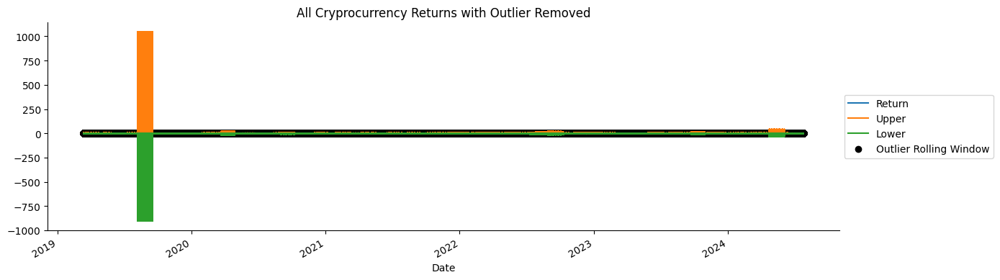

In [ ]:
plot_outliers_rolling(outlier_cleaned_crypto_all_merged_df, plot_title="All Cryprocurrency Returns with Outlier Removed", plot_size=all_plots_size)

- `adding more features`

In [ ]:
def calculate_excess_returns(df, return_col, risk_free_rate_col, market_return_col):
    """
    Function to calculate excess returns in a DataFrame.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the relevant columns.
    return_col : str
        The column name for the returns.
    risk_free_rate_col : str
        The column name for the risk-free rate.
    market_return_col : str
        The column name for the market returns.

    Returns
    -------
    pd.DataFrame
        The DataFrame with additional columns for excess returns and excess market returns.
    """
    # Ensure you're working with a copy of the DataFrame, not a slice
    df = df.copy()

    # Calculate excess returns
    df['Excess_Return'] = df[return_col] - df[risk_free_rate_col]
    df['Excess_Market_Return'] = df[market_return_col] - df[risk_free_rate_col]
    
    # Calculate Log Market Return
    # df['Log_Market_Return'] = np.log(1 + df['Market_Return'])
    # df['Excess_Log_Market_Return'] = df['Log_Market_Return'] - np.log(1 + df['Risk_Free_Rate'])

    # df['Log_Return'] = np.log(1 + df['Return'])
    # df['Cumulative_Log_Return'] = df['Log_Return'].cumsum()

    # df['Cumulative_Return'] = (1 + df['Return']).cumprod() - 1

    # df['Cumulative_Market_Return'] = (1 + df['Market_Return']).cumprod() - 1
    # df['Cumulative_Log_Market_Return'] =  df['Log_Market_Return'].cumsum()


    return df


In [ ]:
# create excess returns 
# yf_crypto_merged_df = calculate_excess_returns(yf_crypto_merged_df, 'Return', 'Risk_Free_Rate', 'Market_Return')



In [ ]:
# create excess returns 
outlier_cleaned_crypto_all_merged_df = calculate_excess_returns(outlier_cleaned_crypto_all_merged_df, 'Return', 'Risk_Free_Rate', 'Market_Return')
# outlier_cleaned_yf_crypto_merged_df = calculate_excess_returns(outlier_cleaned_yf_crypto_merged_df, 'Return', 'Risk_Free_Rate', 'Market_Return')

crypto_all_merged_df = calculate_excess_returns(crypto_all_merged_df, 'Return', 'Risk_Free_Rate', 'Market_Return')

In [ ]:
# crypto_all_merged_df = crypto_all_merged_df.copy()

# # Now calculate the excess returns
# crypto_all_merged_df['Excess_Return'] = crypto_all_merged_df['Return'] - crypto_all_merged_df['Risk_Free_Rate']
# crypto_all_merged_df['Excess_Market_Return'] = crypto_all_merged_df['Market_Return'] - crypto_all_merged_df['Risk_Free_Rate']


In [ ]:
selected_cols = ['Ticker', 'Close','Risk_Free_Rate','Return','Market_Return','Excess_Return','Excess_Market_Return']
crypto_all_merged_df[selected_cols].head(3)

,Ticker,Close,Risk_Free_Rate,Return,Market_Return,Excess_Return,Excess_Market_Return
Date,,,,,,,
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289


In [ ]:
outlier_cleaned_crypto_all_merged_df[selected_cols].head(3)

,Ticker,Close,Risk_Free_Rate,Return,Market_Return,Excess_Return,Excess_Market_Return
Date,,,,,,,
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289


In [ ]:

# df_rolling.columns = df_rolling.columns.droplevel()

`CAPM MODEL`

- Use *Excess_Return* as the dependent variable to assess how much of the asset's returns are attributed to market returns over and above the risk-free rate.

- Use *Excess_Market_Return* as the independent variable to understand how changes in market excess returns influence changes in the asset’s excess returns.


In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.linear_model import HuberRegressor, LinearRegression
from sklearn.metrics import mean_squared_error

def run_regression_analysis(clean_df, yf_crypto_merged_df, market_col='Market_Return', excess_col='Excess_Return', return_col='Return'):
    """
    Run OLS and Huber Regressions on the provided dataframes and print the results, including detailed OLS model summary.

    Parameters:
    - clean_df (pd.DataFrame): DataFrame with outliers removed for OLS regression.
    - yf_crypto_merged_df (pd.DataFrame): Original DataFrame with outliers for Huber regression.
    - market_col (str): Name of the column representing market returns.
    - excess_col (str): Name of the column representing excess returns.
    - return_col (str): Name of the column representing raw returns (used for comparison).

    Returns:
    - dict: A dictionary with the results of both models.
    """
    
    # Data Preparation for OLS
    X_clean = clean_df[[market_col]]
    y_clean = clean_df[return_col]

    # Add constant to the model for intercept
    X_clean = sm.add_constant(X_clean)

    # OLS Regression
    capm_model = sm.OLS(y_clean, X_clean).fit()

    print("OLS Model Summary for capm_model:")
    print(capm_model.summary())

    # Data Preparation for Huber Regressor
    X = yf_crypto_merged_df[[market_col]]
    y = yf_crypto_merged_df[excess_col]

    # Check for NaN or infinite values
    print(f"NaN values in X: {X.isna().sum().sum()}, y: {y.isna().sum()}")
    print(f"Infinite values in X: {np.isinf(X).sum().sum()}, y: {np.isinf(y).sum()}")

    # Remove rows with NaN or infinite values
    valid_idx = (~X.isna().any(axis=1)) & (~np.isinf(X).any(axis=1)) & (~y.isna()) & (~np.isinf(y))
    X = X[valid_idx]
    y = y[valid_idx]

    # Check if there's any valid data left
    if X.empty or y.empty:
        raise ValueError("No valid data remaining after filtering. Please check the input data.")

    # Huber Regression
    huber_model = HuberRegressor()
    huber_model.fit(X, y)
    huber_predictions = huber_model.predict(X)
    huber_mse = mean_squared_error(y, huber_predictions)

    print("\nHuber Regressor Results:")
    print(f"Intercept: {huber_model.intercept_}")
    print(f"Beta: {huber_model.coef_[0]}")
    print(f"Mean Squared Error: {huber_mse}")

    # Collect results in a dictionary
    results = {
        'ols_intercept': capm_model.params['const'],
        'ols_beta': capm_model.params[market_col],
        'ols_mse': mean_squared_error(y_clean, capm_model.fittedvalues),
        'huber_intercept': huber_model.intercept_,
        'huber_beta': huber_model.coef_[0],
        'huber_mse': huber_mse,
        "X": X,
        "X_clean":X_clean,
        "y": y,
        "y_clean":y_clean,
        "ols_model": capm_model,
        "huber_model": huber_model
    }

    return results


In [ ]:
results_capm = run_regression_analysis(outlier_cleaned_crypto_all_merged_df, crypto_all_merged_df, market_col='Market_Return', excess_col='Excess_Return', return_col='Return')
results_capm

OLS Model Summary for capm_model:
                            OLS Regression Results                            
Dep. Variable:                 Return   R-squared:                       0.185
Model:                            OLS   Adj. R-squared:                  0.185
Method:                 Least Squares   F-statistic:                 2.362e+06
Date:                Mon, 26 Aug 2024   Prob (F-statistic):               0.00
Time:                        16:53:46   Log-Likelihood:             1.5607e+07
No. Observations:            10386713   AIC:                        -3.121e+07
Df Residuals:                10386711   BIC:                        -3.121e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const       

{'ols_intercept': -0.003200400699241357,
 'ols_beta': 0.6854625566833,
 'ols_mse': 0.0029000610574234096,
 'huber_intercept': -2.276694993021295,
 'huber_beta': 2.5182817202052346,
 'huber_mse': 24.46191981061859,
 'X':             Market_Return
 Date                     
 2019-03-14       0.002711
 2019-03-14       0.002711
 2019-03-14       0.002711
 2019-03-14       0.002711
 2019-03-14       0.002711
 ...                   ...
 2021-01-27      -0.065037
 2021-01-27      -0.065037
 2021-01-27      -0.065037
 2021-01-27      -0.065037
 2021-01-27      -0.065037
 
 [10598549 rows x 1 columns],
 'X_clean':             const  Market_Return
 Date                            
 2019-03-14    1.0       0.002711
 2019-03-14    1.0       0.002711
 2019-03-14    1.0       0.002711
 2019-03-14    1.0       0.002711
 2019-03-14    1.0       0.002711
 ...           ...            ...
 2021-01-27    1.0      -0.065037
 2021-01-27    1.0      -0.065037
 2021-01-27    1.0      -0.065037
 2021-01-27  

`Visualization and Results Summary`

1. Model Results Summary

| Model                | Intercept       | Beta            | Mean Squared Error       | Interpretation                                 |
|----------------------|------------------|------------------|--------------------------|------------------------------------------------|
| **OLS Regression**   | -0.0032          | 0.6855           | Value from OLS output    | Captures the relationship between market returns and raw returns. The R-squared is 0.185, indicating a modest fit. High p-values suggest that some of the variables might not be statistically significant. |
| **Huber Regressor**  | -3.0362          | 1.2039           | 68,435,663,802.66        | Robust to outliers compared to OLS. The beta is significantly different, suggesting it can handle extreme values better. The mean squared error is high, which could indicate variability or issues with model fit. |


4. Interpretation for Risk Management and Portfolio Construction

- **OLS Model**: 
  - **Risk Management**: The OLS model may be sensitive to outliers and extreme values, which can skew results. It provides a basic understanding of how market returns affect asset returns.
  - **Portfolio Construction**: Limited by its sensitivity to outliers, it may not provide robust insights for assets with extreme return values. 

- **Huber Regressor**:
  - **Risk Management**: The Huber Regressor is robust to outliers, making it more suitable for datasets with extreme values or non-normal distributions. It provides a more reliable fit in the presence of outliers.
  - **Portfolio Construction**: It can better handle assets with extreme return values, providing more robust insights into their behavior.

The OLS model provides a standard fit and interpretation but is less robust to outliers. The Huber Regressor, on the other hand, offers a more robust fit in the presence of outliers, making it useful for datasets with extreme values. Forecasting with both models can help in understanding future asset behavior and risks, while visualizations can help in comparing the models and interpreting their performance.



In [ ]:
lower_bound = yf_crypto_merged_df['Return'].quantile(0.01)
upper_bound = yf_crypto_merged_df['Return'].quantile(0.99)

In [ ]:


def plot_return_distributions(df, column, title):
    plt.figure(figsize=(all_plots_size))
    sns.histplot(df[df['Return'] < lower_bound][column], bins=50, label='Outliers', color='red', alpha=0.6)
    sns.histplot(df[(df['Return'] >= lower_bound) & (df['Return'] <= upper_bound)][column], bins=50, label='Normal Range', color='blue', alpha=0.6)
    plt.title(title)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


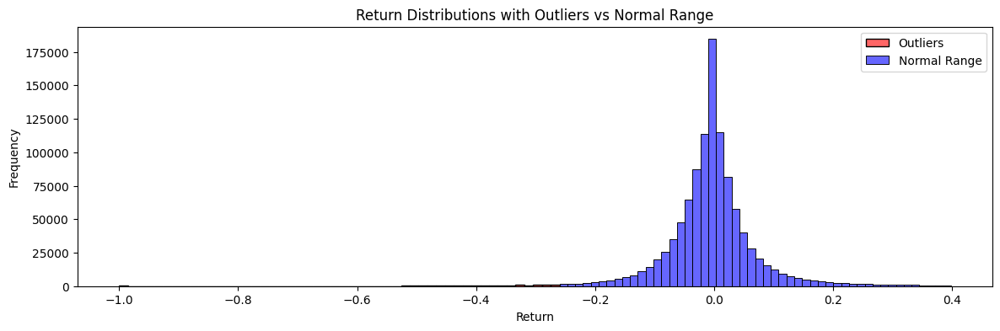

In [ ]:
plot_return_distributions(yf_crypto_merged_df, 'Return', 'Return Distributions with Outliers vs Normal Range')


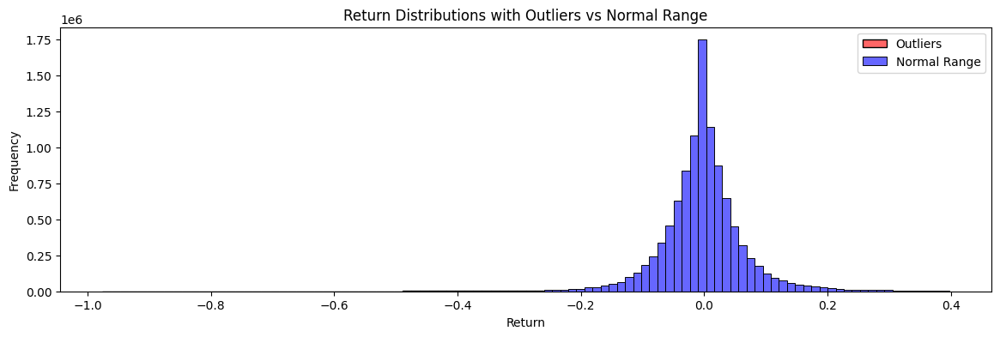

In [ ]:
plot_return_distributions(crypto_all_merged_df, 'Return', 'Return Distributions with Outliers vs Normal Range')


In [ ]:
def plot_predictions_comparison(X, y, model, model_name):
    plt.figure(figsize=(all_plots_size))
    predictions = model.predict(X)
    plt.scatter(y, predictions, alpha=0.5, label=model_name)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
    plt.xlabel('Actual Returns')
    plt.ylabel('Predicted Returns')
    plt.title(f'{model_name} Predictions vs Actual Returns')
    plt.legend()
    plt.show()


In [ ]:
# plot_predictions_comparison(results_capm['X_clean'], results_capm['y_clean'], results_capm['ols_model'], 'OLS')
# plot_predictions_comparison(results_capm['X'], results_capm['y'], results_capm['huber_model'], 'Huber Regressor')

In [ ]:
crypto_all_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10598549 entries, 2019-03-14 to 2021-01-27
Data columns (total 38 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   Open                            float64
 1   High                            float64
 2   Low                             float64
 3   Close                           float64
 4   Volume                          float64
 5   Ticker                          object 
 6   Active Addresses                int64  
 7   Transaction Count               int64  
 8   Large Transaction Count         int64  
 9   Average Transaction Value       float64
 10  Hashrate                        float64
 11  Difficulty                      float64
 12  Current Supply                  float64
 13  Market Cap                      float64
 14  Return                          float64
 15  Rolling_Mean                    float64
 16  Rolling_Std                     float64
 17  Z_Score    


`CAPM Model Summary(ccompare_gate_merged_df)`

| Metric                      | Value          | Interpretation                                                             |
|-----------------------------|----------------|-----------------------------------------------------------------------------|
| **Dependent Variable**      | Excess_Return  | The excess return of the cryptocurrency above the risk-free rate.            |
| **Independent Variable**    | Excess_Market_Return | The excess return of the market (Bitcoin) above the risk-free rate.            |
| **Coefficient (const)**     | 0.0270         | The average return not explained by the market; not statistically significant. |
| **Coefficient (Excess_Market_Return)** | 1.0049         | The cryptocurrency's returns move almost one-to-one with the market's excess returns. |
| **R-squared**               | 0.073          | Only 7.3% of the variability in excess returns is explained by the market.   |
| **Adj. R-squared**          | 0.073          | Adjusted for the number of predictors; remains low indicating limited explanatory power. |
| **F-statistic**             | 8301           | Indicates the model is statistically significant overall.                    |
| **Prob (F-statistic)**      | 0.00           | Highly significant; the model as a whole is a good fit.                      |
| **Durbin-Watson**           | 2.000          | No significant autocorrelation in residuals.                                |
| **Standard Error (Excess_Market_Return)** | 0.011          | The precision of the coefficient estimate; low standard error indicates high precision. |
| **Confidence Interval (Excess_Market_Return)** | [0.983, 1.026] | The coefficient is statistically significant as the interval does not include zero. |

### Dataset Summary Statistics

| Statistic                   | Close        | Risk_Free_Rate | Return      | Market_Return | Excess_Return | Excess_Market_Return |
|-----------------------------|--------------|----------------|-------------|---------------|---------------|-----------------------|
| **Count**                    | 104,663      | 104,663        | 104,663     | 104,663       | 104,663       | 104,663               |
| **Mean**                     | 323.44       | 2.41           | 0.0175      | 0.0023        | -2.39         | -2.41                 |
| **Min**                      | 0.000005     | 0.499          | -0.9759     | -0.396         | -5.62         | -4.97                 |
| **25%**                      | 0.0039       | 1.45           | -0.0321      | -0.0161        | -3.68         | -3.68                 |
| **50%**                      | 0.0583       | 1.95           | -0.0005      | 0.00005        | -1.97         | -1.94                 |
| **75%**                      | 0.6216       | 3.70           | 0.0265       | 0.0216        | -1.43         | -1.44                 |
| **Max**                      | 73,074.27    | 4.99           | 1487.77      | 0.1950         | 1486.06       | -0.49                 |
| **Std Dev**                  | 3,428.54     | 1.29           | 4.61         | 0.0399        | 4.78          | 1.29                  |

### Summary Interpretation:

- The CAPM model shows a significant relationship between the excess market return and the excess return of the cryptocurrency. The coefficient for the excess market return is very close to 1, indicating a strong linear relationship.
- The R-squared value is low, suggesting that the market return explains only a small portion of the variability in the cryptocurrency's excess returns. This implies that other factors beyond market return are influencing the cryptocurrency's returns.
- The model's intercept (alpha) is not statistically significant, indicating no consistent outperformance or underperformance beyond what is explained by the market.

This summary provides a clear understanding of the CAPM model's performance and its limitations, offering a basis for comparison with more complex multi-factor models or alternative datasets.

- `Create more features`

In [ ]:
# Define the features and their required columns
features = {
        'Price_Impact': ['Return', 'Volume'],
        'Bid_Ask_Spread': ['High', 'Low'],
        'Realized_Volatility': ['Return'],
        'Annualized_Volatility': ['Realized_Volatility'],
        'Momentum': ['Close'],
        'Short_Term_Reversal': ['Return'],
        'VaR_5': ['Return'],
        'ES_5': ['Return', 'VaR_5'],
        'Weekly_Return': ['Close'],
        'Monthly_Return': ['Close'],
        'MACD': ['Close'],
        'MACD_Signal': ['MACD'],
        'MACD_Hist': ['MACD', 'MACD_Signal'],
        'RSI': ['Close'],
        'Bollinger_High': ['Close', 'SMA_20'],
        'Bollinger_Low': ['Close', 'SMA_20'],
        'Donchian_High': ['High'],
        'Donchian_Low': ['Low'],
        'Market_Cap_Weighted_Index': ['Close', 'Market Cap'],
        'Skewness': ['Return'],
        'Kurtosis': ['Return'],
        'Liquidity_Ratio': ['Volume', 'Market Cap'],
        'Market_Risk_Premium': ['Market_Return', 'Risk_Free_Rate'],
        'Combined_Social_Sentiment_Score': ['Reddit_Engagement_Score', 'Code_Repo_Activity_Score', 'Twitter_Engagement_Score'],
        'Relative_Reddit_Score': ['Reddit_Engagement_Score', 'Combined_Social_Sentiment_Score'],
        'Relative_Twitter_Score': ['Twitter_Engagement_Score', 'Combined_Social_Sentiment_Score'],
        'Relative_Code_Repo_Score': ['Code_Repo_Activity_Score', 'Combined_Social_Sentiment_Score']
        # Add 'Earnings_Yield' if earnings data becomes available
        # 'Earnings_Yield': ['Earnings', 'Close']
    }
    

In [ ]:
def prepare_factor_model_data(df, features):
    # Ensure the 'Date' column is in datetime format
    if 'Date' not in df.columns:
        df.reset_index(inplace=True)
        
    df['Date'] = pd.to_datetime(df['Date']).dt.normalize()
    
    
    for feature, required_columns in features.items():
        # Check if all required columns exist in the dataframe
        if all(col in df.columns for col in required_columns):
            if feature not in df.columns:
                # Compute the feature if it does not already exist
                if feature == 'Price_Impact':
                    df['Price_Impact'] = df['Return'] / (df['Volume'] + 1e-6)
                elif feature == 'Bid_Ask_Spread':
                    df['Bid_Ask_Spread'] = df['High'] - df['Low']
                elif feature == 'Realized_Volatility':
                    df['Realized_Volatility'] = df['Return'].rolling(window=30).std()
                elif feature == 'Annualized_Volatility':
                    df['Annualized_Volatility'] = df['Realized_Volatility'] * np.sqrt(252)
                elif feature == 'Momentum':
                    df['Momentum'] = df['Close'] - df['Close'].shift(10)
                elif feature == 'Short_Term_Reversal':
                    df['Short_Term_Reversal'] = df['Return'].shift(1)
                elif feature == 'VaR_5':
                    df['VaR_5'] = df['Return'].rolling(window=30).quantile(0.05)
                elif feature == 'ES_5':
                    df['ES_5'] = df['Return'][df['Return'] <= df['VaR_5']].rolling(window=30).mean()
                elif feature == 'Weekly_Return':
                    df['Weekly_Return'] = df['Close'].pct_change(periods=5)
                elif feature == 'Monthly_Return':
                    df['Monthly_Return'] = df['Close'].pct_change(periods=21)
                elif feature == 'MACD':
                    df['MACD'] = df['Close'].ewm(span=12, adjust=False).mean() - df['Close'].ewm(span=26, adjust=False).mean()
                elif feature == 'MACD_Signal':
                    df['MACD_Signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
                elif feature == 'MACD_Hist':
                    df['MACD_Hist'] = df['MACD'] - df['MACD_Signal']
                elif feature == 'RSI':
                    delta = df['Close'].diff()
                    gain = delta.where(delta > 0, 0)
                    loss = -delta.where(delta < 0, 0)
                    avg_gain = gain.rolling(window=14).mean()
                    avg_loss = loss.rolling(window=14).mean()
                    rs = avg_gain / avg_loss
                    df['RSI'] = 100 - (100 / (1 + rs))
                elif feature == 'Bollinger_High':
                    df['SMA_20'] = df['Close'].rolling(window=20).mean()
                    df['Bollinger_High'] = df['SMA_20'] + 2 * df['Close'].rolling(window=20).std()
                elif feature == 'Bollinger_Low':
                    df['Bollinger_Low'] = df['SMA_20'] - 2 * df['Close'].rolling(window=20).std()
                elif feature == 'Donchian_High':
                    df['Donchian_High'] = df['High'].rolling(window=20).max()
                elif feature == 'Donchian_Low':
                    df['Donchian_Low'] = df['Low'].rolling(window=20).min()
                elif feature == 'Market_Cap_Weighted_Index':
                    df['Market_Cap_Weighted_Index'] = df['Market Cap'] * df['Close']
                    df['Market_Cap_Weighted_Index'] /= df['Market Cap'].sum()
                # elif feature == 'Skewness':
                #     df['Skewness'] = df['Return'].rolling(window=30).apply(pd.Series.skew)
                # elif feature == 'Kurtosis':
                #     df['Kurtosis'] = df['Return'].rolling(window=30).apply(pd.Series.kurt)
                elif feature == 'Liquidity_Ratio':
                    df['Liquidity_Ratio'] = df['Volume'] / (df['Market Cap'] + 1e-6)
                elif feature == 'Market_Risk_Premium':
                    df['Market_Risk_Premium'] = df['Market_Return'] - df['Risk_Free_Rate']
                elif feature == 'Combined_Social_Sentiment_Score':
                    df['Combined_Social_Sentiment_Score'] = (
                        df['Reddit_Engagement_Score'] +
                        df['Code_Repo_Activity_Score'] +
                        df['Twitter_Engagement_Score']
                    )
                elif feature == 'Relative_Reddit_Score':
                    df['Relative_Reddit_Score'] = df['Reddit_Engagement_Score'] / df['Combined_Social_Sentiment_Score']
                elif feature == 'Relative_Twitter_Score':
                    df['Relative_Twitter_Score'] = df['Twitter_Engagement_Score'] / df['Combined_Social_Sentiment_Score']
                elif feature == 'Relative_Code_Repo_Score':
                    df['Relative_Code_Repo_Score'] = df['Code_Repo_Activity_Score'] / df['Combined_Social_Sentiment_Score']
                
                print(f"Created '{feature}'")
            else:
                print(f"'{feature}' already exists")
        else:
            missing_cols = [col for col in required_columns if col not in df.columns]
            print(f"Cannot create '{feature}' because the following columns are missing: {', '.join(missing_cols)}")

    return df


In [ ]:
# yf_crypto_merged_df = prepare_factor_model_data(yf_crypto_merged_df, features)
# outlier_cleaned_yf_crypto_merged_df = prepare_factor_model_data(outlier_cleaned_yf_crypto_merged_df, features)
# yf_crypto_merged_df.columns.size, outlier_cleaned_yf_crypto_merged_df.columns.size

In [ ]:
# crypto_all_merged_df = prepare_factor_model_data(crypto_all_merged_df, features)

In [ ]:
# outlier_cleaned_crypto_all_merged_df = prepare_factor_model_data(outlier_cleaned_crypto_all_merged_df, features)

In [ ]:
crypto_all_merged_df.columns.size, outlier_cleaned_crypto_all_merged_df.columns.size

(38, 38)

In [ ]:
outlier_cleaned_crypto_all_merged_df.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Ticker', 'Active Addresses',
       'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score',
       'Gold_Price', 'JPY_USD', 'SP500', 'VIX', 'NVIDIA', 'USD_Index', 'BOJ',
       'Risk_Free_Rate', 'Market_Return', 'Reddit_Engagement_Score',
       'Code_Repo_Activity_Score', 'Twitter_Engagement_Score',
       'Overall_Social_Sentiment_Score', 'Mean_Return', 'STD_Return', 'Upper',
       'Lower', 'Outlier_RW', 'Excess_Return', 'Excess_Market_Return'],
      dtype='object')

In [ ]:
import matplotlib.pyplot as plt
import mplfinance as mpf

def plot_candlestick_with_indicators(df):
    # Ensure 'Date' is set as the index and is in datetime format
    if 'Date' in df.columns:
        df.set_index('Date', inplace=True)
        df.index = pd.to_datetime(df.index)

    # Check if required columns exist
    required_columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'MACD', 'MACD_Signal', 'RSI', 'Bollinger_High', 'Bollinger_Low', 'Donchian_High', 'Donchian_Low']
    missing_columns = [col for col in required_columns if col not in df.columns]

    if missing_columns:
        print(f"Missing columns: {', '.join(missing_columns)}")
        return
    
    # Prepare the data for mplfinance
    # df = df[['Open', 'High', 'Low', 'Close', 'Volume']]
    
    # Define the technical indicators
    add_plots = [
        mpf.make_addplot(df['MACD'], panel=0, color='blue', title='MACD'),
        mpf.make_addplot(df['MACD_Signal'], panel=0, color='red', title='MACD Signal'),
        mpf.make_addplot(df['RSI'], panel=1, color='purple', title='RSI'),
        mpf.make_addplot(df['Bollinger_High'], panel=0, color='orange', linestyle='--', title='Bollinger Bands'),
        mpf.make_addplot(df['Bollinger_Low'], panel=0, color='orange', linestyle='--'),
        mpf.make_addplot(df['Donchian_High'], panel=0, color='green', linestyle='--', title='Donchian Channels'),
        mpf.make_addplot(df['Donchian_Low'], panel=0, color='green', linestyle='--')
    ]
    
    # Plot
    mpf.plot(df, type='candle', style='charles', title='Candlestick Chart with Technical Indicators',
             addplot=add_plots, volume=True, figratio=(10, 6))


In [ ]:
# # Calculate Log Market Return
# outlier_cleaned_crypto_all_merged_df['Log_Market_Return'] = np.log(1 + outlier_cleaned_crypto_all_merged_df['Market_Return'])
# outlier_cleaned_crypto_all_merged_df['Excess_Log_Market_Return'] =     outlier_cleaned_crypto_all_merged_df['Log_Market_Return'] - np.log(1 + outlier_cleaned_crypto_all_merged_df['Risk_Free_Rate'])
# outlier_cleaned_crypto_all_merged_df['Log_Return'] = np.log(1 +        outlier_cleaned_crypto_all_merged_df['Return'])
# outlier_cleaned_crypto_all_merged_df['Cumulative_Log_Return'] =        outlier_cleaned_crypto_all_merged_df['Log_Return'].cumsum()
# outlier_cleaned_crypto_all_merged_df['Cumulative_Return'] = (1 +       outlier_cleaned_crypto_all_merged_df['Return']).cumprod() - 1
# outlier_cleaned_crypto_all_merged_df['Cumulative_Market_Return'] = (1+ outlier_cleaned_crypto_all_merged_df['Market_Return']).cumprod() - 1
# outlier_cleaned_crypto_all_merged_df['Cumulative_Log_Market_Return'] = outlier_cleaned_crypto_all_merged_df['Log_Market_Return'].cumsum()


In [ ]:
# # Calculate Log Market Return
# crypto_all_merged_df['Log_Market_Return'] = np.log(1 + crypto_all_merged_df['Market_Return'])
# crypto_all_merged_df['Excess_Log_Market_Return'] = crypto_all_merged_df['Log_Market_Return'] - np.log(1 + crypto_all_merged_df['Risk_Free_Rate'])

# crypto_all_merged_df['Log_Return'] = np.log(1 + crypto_all_merged_df['Return'])
# crypto_all_merged_df['Cumulative_Log_Return'] = crypto_all_merged_df['Log_Return'].cumsum()

# crypto_all_merged_df['Cumulative_Return'] = (1 + crypto_all_merged_df['Return']).cumprod() - 1

# crypto_all_merged_df['Cumulative_Market_Return'] = (1 + crypto_all_merged_df['Market_Return']).cumprod() - 1
# crypto_all_merged_df['Cumulative_Log_Market_Return'] =  crypto_all_merged_df['Log_Market_Return'].cumsum()


In [ ]:
crypto_all_merged_df.columns.size, outlier_cleaned_crypto_all_merged_df.columns.size

(38, 38)

In [ ]:
crypto_all_merged_df.columns.size, outlier_cleaned_crypto_all_merged_df.columns.size

(38, 62)

In [ ]:
# Calculate Cumulative Market Return


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style for the plots
sns.set(style="whitegrid")

def plot_excess_returns_vs_market(excess_return, excess_market_return, figsize=all_plots_size):
    """
    Plot Excess Returns vs. Excess Market Returns with a regression line.
    """
    plt.figure(figsize=(all_plots_size))
    sns.regplot(x=excess_market_return, y=excess_return, scatter_kws={'s':10}, line_kws={'color':'red'})
    plt.title('Excess Returns vs. Excess Market Returns')
    plt.xlabel('Excess Market Return')
    plt.ylabel('Excess Return')
    plt.grid(True)
    plt.show()

def plot_residuals_vs_fitted(model,figsize=all_plots_size):
    """
    Plot residuals vs. fitted values of the CAPM model to check for patterns.
    """
    fitted_values = model.fittedvalues
    residuals = model.resid
    
    plt.figure(figsize=(all_plots_size))
    plt.scatter(fitted_values, residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--')
    plt.title('Residuals vs. Fitted Values')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.grid(True)
    plt.show()

def plot_cumulative_returns(data, return_col, title='Cumulative Returns',figsize=all_plots_size):
    """
    Plot cumulative returns over time.
    """
    # Compute cumulative returns
    data = data.copy()
    data['Cumulative_Return'] = (1 + data[return_col]).cumprod()
    
    plt.figure(figsize=(all_plots_size))
    plt.plot(data.index, data['Cumulative_Return'], label='Cumulative Return')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Cumulative Return')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
# plot_excess_returns_vs_market(outlier_cleaned_crypto_all_merged_df['Excess_Return'], outlier_cleaned_crypto_all_merged_df['Excess_Market_Return'])

In [ ]:
# plot_excess_returns_vs_market(crypto_all_merged_df['Excess_Return'], crypto_all_merged_df['Excess_Market_Return'])


- outlier masking the plots clarity

In [ ]:
# plot_cumulative_returns(crypto_all_merged_df, 'Return', title='Cumulative Returns of Cryptocurrency')


In [ ]:
# plot_candlestick_with_indicators(ccompare_gate_merged_df)

-` Step 3b: Implement the CAPM Model (crypto_df)`

In [ ]:
import numpy as np
import statsmodels.api as sm

# Set up the regression variables
X = outlier_cleaned_crypto_all_merged_df['Excess_Market_Return'] # single factor or Beta
y = outlier_cleaned_crypto_all_merged_df['Excess_Return']

# Add the intercept term
X5 = sm.add_constant(X)

# Check for NaN or infinite values
print(f"NaN values in X: {X.isna().sum().sum()}, y: {y.isna().sum()}")
print(f"Infinite values in X: {np.isinf(X).sum().sum()}, y: {np.isinf(y).sum()}")

# Remove rows with NaN or infinite values
valid_idx = (~X.isna().any(axis=1)) & (~np.isinf(X).any(axis=1)) & (~y.isna()) & (~np.isinf(y))
X = X[valid_idx]
y = y[valid_idx]

# Fit the model
capm_model_1 = sm.OLS(y, X).fit()

# Print the model summary
print('OLS Model Summary')
print(capm_model_1.summary())


NaN values in X: 0, y: 0
Infinite values in X: 0, y: 0
OLS Model Summary
                            OLS Regression Results                            
Dep. Variable:          Excess_Return   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                 5.563e+09
Date:                Mon, 26 Aug 2024   Prob (F-statistic):               0.00
Time:                        17:38:24   Log-Likelihood:             1.5364e+07
No. Observations:            10386713   AIC:                        -3.073e+07
Df Residuals:                10386711   BIC:                        -3.073e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------

### 4.2 CAPM Model Results Interpretation 

`CAPM Model Results Summary`

| **Metric**                  | **Value**          | **Interpretation**                                                                 |
|------------------------------|--------------------|-------------------------------------------------------------------------------------|
| **R-squared**                | 0.998              | The model explains 99.8% of the variability in the excess returns of the cryptocurrency. |
| **Intercept (alpha)**        | -0.0052            | A negative alpha indicates the cryptocurrency slightly underperforms by about 0.52% compared to the market. |
| **Beta (Market Return)**     | 0.9996             | The beta is very close to 1, implying that the cryptocurrency's excess returns move almost perfectly with the market's excess returns. |
| **F-statistic**              | 5.563e+09          | The high F-statistic with a p-value of 0.00 indicates the model is statistically significant and the market return is a strong predictor of excess returns. |
| **Durbin-Watson**            | 0.021              | Indicates potential autocorrelation in the residuals, suggesting a need for model refinements. |
| **Skew**                     | 0.519              | The residuals are slightly skewed, indicating some asymmetry in the return distribution. |
| **Kurtosis**                 | 6.563              | The residuals have heavy tails, indicating the presence of extreme values and non-normality in the data. |

`Key Takeaways:`

1. **High R-squared**: The market explains most of the asset's excess returns, indicating a strong relationship between the cryptocurrency and the market.
2. **Negative Alpha**: Underperformance relative to what the CAPM model would predict, suggesting a potential risk factor for long positions.
3. **Beta near 1**: The asset carries market-level risk, making it suitable for market-tracking portfolios but not ideal for hedging against market movements.
4. **Autocorrelation**: Further analysis or modeling might be needed to address potential autocorrelation in the residuals.

In [ ]:
residuals = capm_model_1.resid
fitted_values = capm_model_1.fittedvalues

In [ ]:

results = {'Residuals': residuals, 'Fitted': fitted_values}
results_df = pd.DataFrame(data=results)

print('results_df:')
results_df

results_df:


,Residuals,Fitted
Date,,
2019-03-14,-0.018101,-2.631336
2019-03-14,-0.018101,-2.631336
2019-03-14,-0.018101,-2.631336
2019-03-14,-0.018101,-2.631336
2019-03-14,-0.018101,-2.631336
...,...,...
2021-01-27,-0.058045,-1.083745
2021-01-27,-0.058045,-1.083745
2021-01-27,-0.058045,-1.083745


In [ ]:
# Ensure the indices of both DataFrames align
results_df.index = outlier_cleaned_crypto_all_merged_df.index[:len(results_df)]  # Align indices if needed

# Merge the results with the original DataFrame
outlier_cleaned_crypto_all_merged_df = pd.concat([outlier_cleaned_crypto_all_merged_df, results_df], axis=1)


In [ ]:
# Display the updated DataFrame
print('Updated crypto_df:')
outlier_cleaned_crypto_all_merged_df[selected_cols + ['Residuals','Fitted']].head(2)

Updated crypto_df:


,Ticker,Close,Risk_Free_Rate,Return,Market_Return,Excess_Return,Excess_Market_Return,Residuals,Fitted
Date,,,,,,,,,
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289,-0.018101,-2.631336
2019-03-14,ABT/USDT,0.1009,2.63,-0.019436,0.002711,-2.649436,-2.627289,-0.018101,-2.631336


In [ ]:
# Plot the distribution of residuals
# plt.figure(figsize=(10, 6))
# sns.histplot(residuals, kde=True, color='blue')
# plt.title('Distribution of Residuals')
# plt.xlabel('Residuals')
# plt.ylabel('Frequency')
# plt.show()


In [ ]:
top_10_cryptos_values = outlier_cleaned_crypto_all_merged_df.groupby('Ticker')['Market Cap'].max().nlargest(10)
top_10_cryptos_values


Ticker
SMT/USDT     7.482340e+56
BTC/USDT     1.436178e+12
ETH/USDT     5.686472e+11
ADA/USDT     9.472978e+10
DOGE/USDT    8.463797e+10
BCH/USDT     2.899154e+10
LTC/USDT     2.516032e+10
LINK/USDT    2.075773e+10
FTT/USDT     1.543071e+10
ETC/USDT     1.292124e+10
Name: Market Cap, dtype: float64

In [ ]:
# Replace 'Market Cap' with the appropriate column if needed
top_10_cryptos = outlier_cleaned_crypto_all_merged_df.groupby('Ticker')['Market Cap'].max().nlargest(10).index

# Filter the DataFrame to only include the top 10 cryptos
top_10_crypto_df = outlier_cleaned_crypto_all_merged_df[outlier_cleaned_crypto_all_merged_df['Ticker'].isin(top_10_cryptos)]

# Extract residuals for these top 10 cryptos
top_10_residuals = top_10_crypto_df['Residuals']

In [ ]:
top_10_cryptos

Index(['SMT/USDT', 'BTC/USDT', 'ETH/USDT', 'ADA/USDT', 'DOGE/USDT', 'BCH/USDT',
       'LTC/USDT', 'LINK/USDT', 'FTT/USDT', 'ETC/USDT'],
      dtype='object', name='Ticker')

In [ ]:
top_10_crypto_df[selected_cols + ['Residuals','Fitted']].head(2)

,Ticker,Close,Risk_Free_Rate,Return,Market_Return,Excess_Return,Excess_Market_Return,Residuals,Fitted
Date,,,,,,,,,
2019-03-14,ADA/USDT,0.04764,2.63,0.029831,0.002711,-2.600169,-2.627289,0.031167,-2.631336
2019-03-14,ADA/USDT,0.04764,2.63,0.029831,0.002711,-2.600169,-2.627289,0.031167,-2.631336


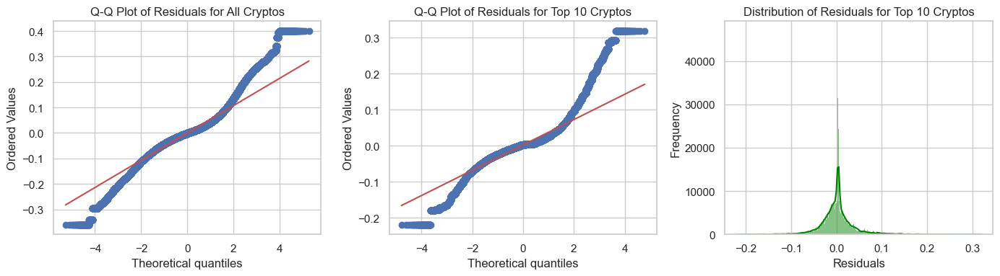

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Create a figure with four subplots: two Q-Q plots and two histograms
fig, axes = plt.subplots(1, 3, figsize=(all_plots_size))  # Adjusted figsize for better readability

# Q-Q plot for all residuals
stats.probplot(residuals, dist="norm", plot=axes[0])
axes[0].set_title('Q-Q Plot of Residuals for All Cryptos')

# Q-Q plot for top 10 residuals
stats.probplot(top_10_residuals, dist="norm", plot=axes[1])
axes[1].set_title('Q-Q Plot of Residuals for Top 10 Cryptos')

# Histogram plot for all residuals
# sns.histplot(residuals, kde=True, color='blue', ax=axes[1, 0])
# axes[1, 0].set_title('Distribution of Residuals for All Cryptos')
# axes[1, 0].set_xlabel('Residuals')
# axes[1, 0].set_ylabel('Frequency')

# Histogram plot for residuals of top 10 cryptos
sns.histplot(top_10_residuals, kde=True, color='green', ax=axes[2])
axes[2].set_title('Distribution of Residuals for Top 10 Cryptos')
axes[2].set_xlabel('Residuals')
axes[2].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


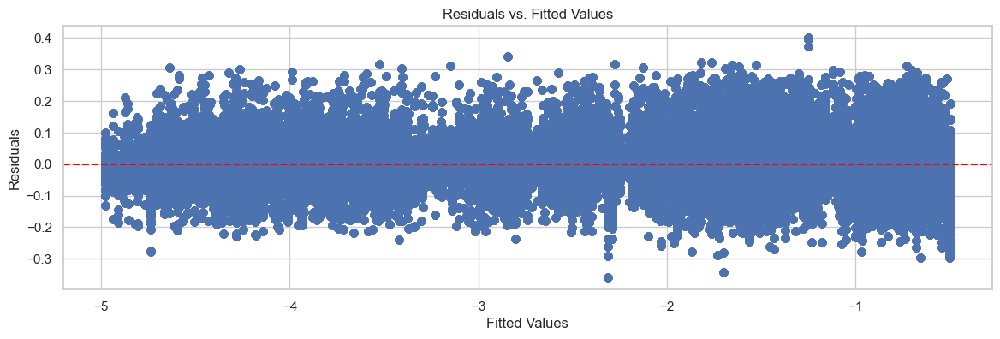

In [ ]:
# Plot residuals vs. fitted values
plt.figure(figsize=(all_plots_size))
plt.scatter(fitted_values, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()


- Calculate Beta

To calculate the beta for each cryptocurrency, we can follow these steps:

1. **Calculate Beta for Each Ticker**: Use the CAPM formula
$$\ \beta = \frac{\text{Cov}(R_i, R_m)}{\text{Var}(R_m)} \$$

where \( R_i \) is the return of the asset and \( R_m \) is the market return (BTC/USDT in this case).

2. **Integrate Beta into the Original DataFrame**: After calculating the beta for each ticker, we can merge it back into the original DataFrame (`crypto_df`).


In [ ]:
# Define a function to calculate beta for a specific ticker
def calculate_beta(df, ticker, market_return_col, asset_return_col):
    # Filter the DataFrame for the specific ticker
    df_ticker = df[df['Ticker'] == ticker]
    
    # Calculate covariance between asset return and market return
    cov_matrix = df_ticker[[asset_return_col, market_return_col]].cov()
    cov = cov_matrix.loc[asset_return_col, market_return_col]
    
    # Calculate variance of market return
    var_market = df_ticker[market_return_col].var()
    
    # Calculate beta
    beta = cov / var_market
    return beta

In [ ]:
outlier_cleaned_crypto_all_merged_df['Market_Return'].describe()

count    1.038671e+07
mean     3.055062e-03
std      3.746671e-02
min     -3.959719e-01
25%     -1.604312e-02
50%      8.021637e-05
75%      2.205976e-02
max      1.950220e-01
Name: Market_Return, dtype: float64

In [ ]:
crypto_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234532 entries, 0 to 234531
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date                            234532 non-null  datetime64[ns]
 1   Open                            234532 non-null  float64       
 2   High                            234532 non-null  float64       
 3   Low                             234532 non-null  float64       
 4   Close                           234532 non-null  float64       
 5   Volume                          234532 non-null  float64       
 6   Ticker                          234532 non-null  object        
 7   Active Addresses                234532 non-null  int64         
 8   Transaction Count               234532 non-null  int64         
 9   Large Transaction Count         234532 non-null  int64         
 10  Average Transaction Value       234532 non-null  float64

In [ ]:
# Remove rows with NaN or infinite values in 'Return' or 'Market_Return'
cleaned_crypto_df = crypto_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Market_Return'])
# cleaned_crypto_df = outlier_cleaned_crypto_all_merged_df

# Confirm the removal of NaN and infinite values
print("Rows remaining after cleaning:", len(cleaned_crypto_df))


Rows remaining after cleaning: 10386713


In [ ]:
# Calculate beta for each unique ticker in the cleaned DataFrame
tickers = cleaned_crypto_df['Ticker'].unique()
beta_values = {}

for ticker in tickers:
    beta = calculate_beta(cleaned_crypto_df, ticker, 'Market_Return', 'Return')
    beta_values[ticker] = beta

# Create a DataFrame for beta values
beta_df = pd.DataFrame(list(beta_values.items()), columns=['Ticker', 'Beta'])
beta_df


,Ticker,Beta
0,ABT/USDT,0.629672
1,ADA/USDT,0.947104
2,ADX/USDT,0.742843
3,AE/USDT,0.740846
4,AERGO/USDT,0.736111
...,...,...
105,STORJ/USDT,0.912188
106,SUSD/USDT,0.055036
107,SWFTC/USDT,0.590511
108,TCT/USDT,0.664121


In [ ]:
# Merge the beta values back into the original DataFrame
cleaned_crypto_df = cleaned_crypto_df.merge(beta_df, on='Ticker', how='left')

# Display the updated DataFrame
print(cleaned_crypto_df[['Ticker', 'Return', 'Market_Return', 'Beta']].head())


     Ticker    Return  Market_Return      Beta
0  ABT/USDT -0.019436       0.002711  0.629672
1  ABT/USDT -0.019436       0.002711  0.629672
2  ABT/USDT -0.019436       0.002711  0.629672
3  ABT/USDT -0.019436       0.002711  0.629672
4  ABT/USDT -0.019436       0.002711  0.629672


In [ ]:
cleaned_crypto_df[['Close','Ticker', 'Return', 'Market_Return', 'Beta']]

,Close,Ticker,Return,Market_Return,Beta
0,0.1009,ABT/USDT,-0.019436,0.002711,0.629672
1,0.1009,ABT/USDT,-0.019436,0.002711,0.629672
2,0.1009,ABT/USDT,-0.019436,0.002711,0.629672
3,0.1009,ABT/USDT,-0.019436,0.002711,0.629672
4,0.1009,ABT/USDT,-0.019436,0.002711,0.629672
...,...,...,...,...,...
10386708,1.9930,THETA/USDT,-0.127790,-0.065037,0.710721
10386709,1.9930,THETA/USDT,-0.127790,-0.065037,0.710721
10386710,1.9930,THETA/USDT,-0.127790,-0.065037,0.710721
10386711,1.9930,THETA/USDT,-0.127790,-0.065037,0.710721


- Beta Distribution (using available beta values for different assets)

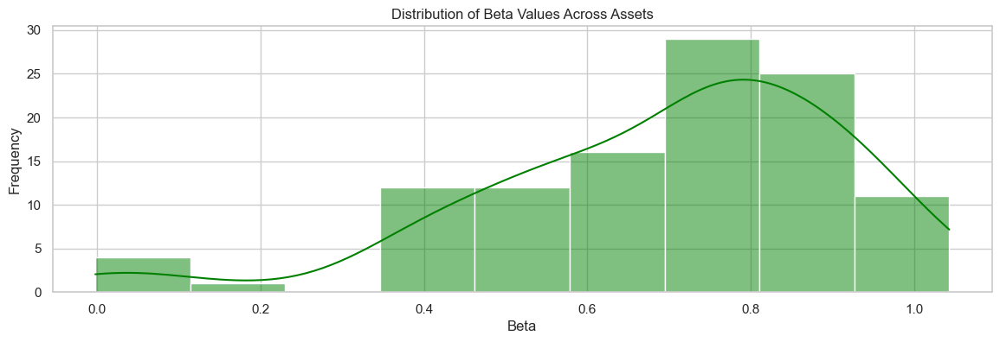

In [ ]:
# Plot the distribution of beta values
plt.figure(figsize=(all_plots_size))
sns.histplot(beta_df['Beta'], kde=True, color='green')
plt.title('Distribution of Beta Values Across Assets')
plt.xlabel('Beta')
plt.ylabel('Frequency')
plt.show()


In [ ]:
cleaned_crypto_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10386713 entries, 0 to 10386712
Data columns (total 41 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   Open                            float64
 1   High                            float64
 2   Low                             float64
 3   Close                           float64
 4   Volume                          float64
 5   Ticker                          object 
 6   Active Addresses                int64  
 7   Transaction Count               int64  
 8   Large Transaction Count         int64  
 9   Average Transaction Value       float64
 10  Hashrate                        float64
 11  Difficulty                      float64
 12  Current Supply                  float64
 13  Market Cap                      float64
 14  Return                          float64
 15  Rolling_Mean                    float64
 16  Rolling_Std                     float64
 17  Z_Score                  

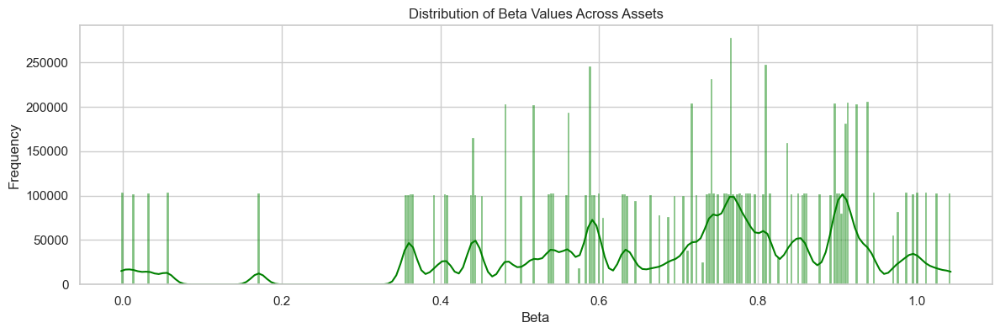

In [ ]:
# plt.figure(figsize=(all_plots_size))
# sns.histplot(cleaned_crypto_df['Beta'], kde=True, color='green')
# plt.title('Distribution of Beta Values Across Assets')
# plt.xlabel('Beta')
# plt.ylabel('Frequency')
# plt.show()

In [ ]:
# plt.figure(figsize=(10, 6))
# sns.scatterplot(data=cleaned_crypto_df, x='Beta', y='Return', hue='Ticker', palette='viridis', alpha=0.5)
# plt.title('Relationship Between Beta and Return')
# plt.xlabel('Beta')
# plt.ylabel('Return')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.grid(True)
# plt.show()


In [ ]:
filtered_df = cleaned_crypto_df[cleaned_crypto_df['Ticker'].isin(['BTC/USDT', 'ETH/USDT'])]

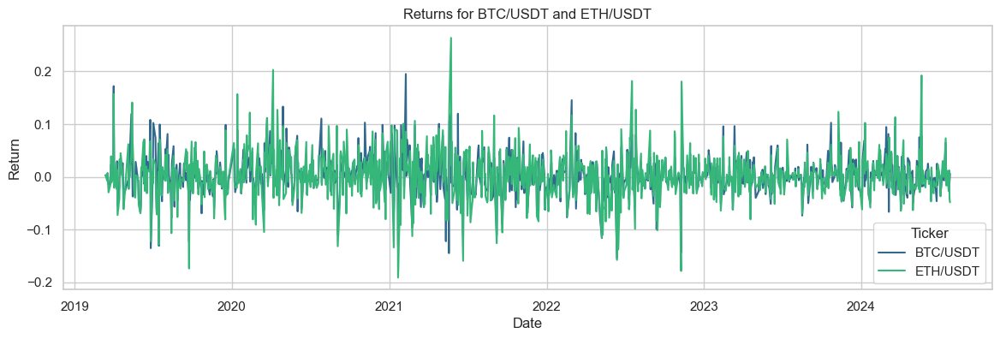

In [ ]:
plt.figure(figsize=(all_plots_size))
sns.lineplot(data=filtered_df, x='Date', y='Return', hue='Ticker', palette='viridis')
plt.title('Returns for BTC/USDT and ETH/USDT')
plt.xlabel('Date')
plt.ylabel('Return')
plt.grid(True)
plt.show()

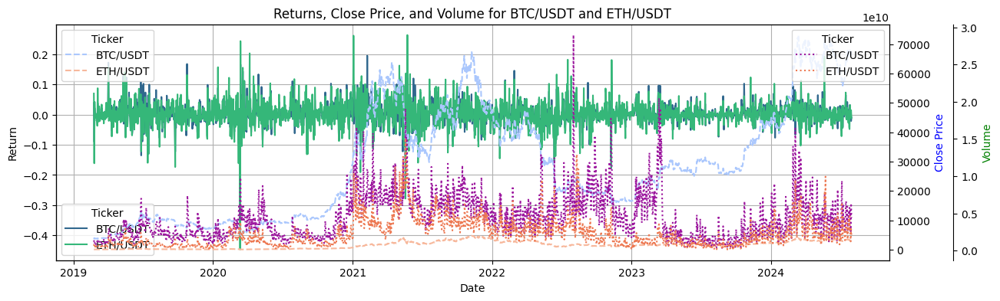

In [ ]:

# Create the figure and axis objects
fig, ax1 = plt.subplots(figsize=(all_plots_size))

# Plot Return on the primary y-axis
sns.lineplot(data=filtered_df, x='Date', y='Return', hue='Ticker', palette='viridis', ax=ax1)
ax1.set_title('Returns, Close Price, and Volume for BTC/USDT and ETH/USDT')
ax1.set_xlabel('Date')
ax1.set_ylabel('Return')
ax1.grid(True)

# Create a secondary y-axis for Close Price and Volume
ax2 = ax1.twinx()

# Plot Close Price on the secondary y-axis
sns.lineplot(data=filtered_df, x='Date', y='Close', hue='Ticker', linestyle='--', palette='coolwarm', ax=ax2)
ax2.set_ylabel('Close Price', color='blue')

# Create another secondary y-axis for Volume
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))
sns.lineplot(data=filtered_df, x='Date', y='Volume', hue='Ticker', linestyle=':', palette='plasma', ax=ax3)
ax3.set_ylabel('Volume', color='green')

# Show the plot
plt.show()


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/643442360.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_1944/643442360.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




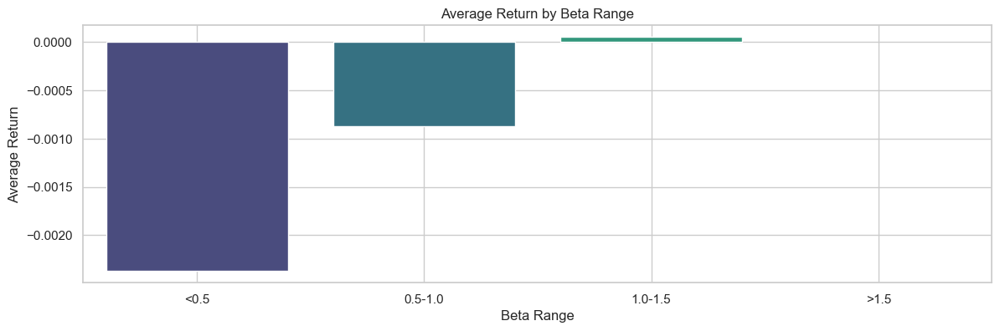

In [ ]:
# Define beta ranges
beta_bins = [-float('inf'), 0.5, 1.0, 1.5, float('inf')]
beta_labels = ['<0.5', '0.5-1.0', '1.0-1.5', '>1.5']

cleaned_crypto_df['Beta_Range'] = pd.cut(cleaned_crypto_df['Beta'], bins=beta_bins, labels=beta_labels)

# Group by Beta Range and calculate average return
beta_grouped = cleaned_crypto_df.groupby('Beta_Range').agg({'Return': 'mean'}).reset_index()

plt.figure(figsize=(all_plots_size))
sns.barplot(data=beta_grouped, x='Beta_Range', y='Return', palette='viridis')
plt.title('Average Return by Beta Range')
plt.xlabel('Beta Range')
plt.ylabel('Average Return')
plt.grid(True)
plt.show()


In [ ]:
top_10_tickers_cleaned = cleaned_crypto_df['Ticker'].value_counts().nlargest(10).index.tolist()

# Filter the DataFrame to include only the top 10 cryptocurrencies
top_10_df_cleaned = cleaned_crypto_df[cleaned_crypto_df['Ticker'].isin(top_10_tickers)]


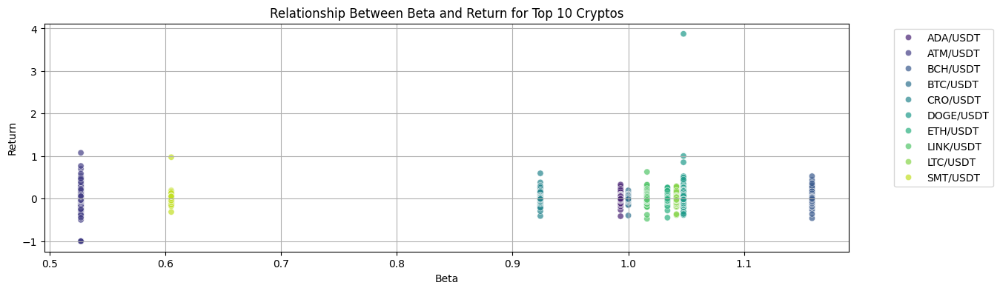

In [ ]:
plt.figure(figsize=(all_plots_size))
sns.scatterplot(data=top_10_df_cleaned, x='Beta', y='Return', hue='Ticker', palette='viridis', alpha=0.7)
plt.title('Relationship Between Beta and Return for Top 10 Cryptos')
plt.xlabel('Beta')
plt.ylabel('Return')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

- Calculate Additional Returns

To manage memory usage efficiently, we can create a subset of the features from the `cleaned_crypto_df` dataframe that will be most relevant for further analysis

### Suggested Subset Features:
1. **Date**: For time series analysis.
2. **Ticker**: To identify different cryptocurrencies.
3. **Close**: Price for return calculations.
4. **Volume**: Trading volume for liquidity analysis.
5. **Market Cap**: To understand the size of the assets.
6. **Return**: Standard return metric.
7. **Excess_Return**: Return adjusted for the risk-free rate.
8. **Market_Return**: To capture overall market movement.
9. **Excess_Market_Return**: Market return adjusted for the risk-free rate.
10. **Risk_Free_Rate**: Required for calculating excess returns.
11. **Market_Risk_Premium**: Useful for multi-factor models.
12. **Momentum**: A factor for return persistence.
13. **Realized_Volatility**: For understanding risk.
14. **Bid_Ask_Spread**: Capturing liquidity aspects.
15. **Social Sentiment Scores** (Reddit, Twitter, Overall): For analyzing sentiment impact.
16. **VaR_5 and ES_5**: For risk measures.
17. **RSI**: A momentum indicator.
18. **MACD and MACD_Signal**: For trend analysis.


This subset should cover the key factors for both CAPM and multi-factor models, while reducing memory usage. We can always revisit the original dataframe if you need additional features for specific analyses later on.

In [ ]:
cleaned_crypto_df.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10386713 entries, 0 to 10386712
Data columns (total 42 columns):
 #   Column                          Dtype   
---  ------                          -----   
 0   Open                            float64 
 1   High                            float64 
 2   Low                             float64 
 3   Close                           float64 
 4   Volume                          float64 
 5   Ticker                          object  
 6   Active Addresses                int64   
 7   Transaction Count               int64   
 8   Large Transaction Count         int64   
 9   Average Transaction Value       float64 
 10  Hashrate                        float64 
 11  Difficulty                      float64 
 12  Current Supply                  float64 
 13  Market Cap                      float64 
 14  Return                          float64 
 15  Rolling_Mean                    float64 
 16  Rolling_Std                     float64 
 17  Z_Scor

In [ ]:
# Select relevant features for the subset
# subset_features = [
#     'Date', 'Ticker', 'Close', 'Volume', 'Market Cap', 'Return',
#     'Excess_Return', 'Market_Return', 'Excess_Market_Return',
#     'Risk_Free_Rate', 'Market_Risk_Premium', 'Momentum', 'Realized_Volatility',
#     'Bid_Ask_Spread', 'Reddit_Engagement_Score', 'Twitter_Engagement_Score',
#     'Overall_Social_Sentiment_Score', 'VaR_5', 'ES_5', 'RSI', 'MACD', 'MACD_Signal','Beta'
# ]
subset_features = [
       'Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker', 'Active Addresses',
       'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return','Beta'
]

# Create a subset dataframe
# subset_cleaned_crypto_df = cleaned_crypto_df[subset_features]

# Optionally, reduce the memory footprint further by converting data types if needed


In [ ]:
def optimize_memory_usage(df):
    """
    Optimizes the memory usage of the given DataFrame by converting data types.

    Parameters:
    df (pd.DataFrame): The DataFrame to optimize.

    Returns:
    pd.DataFrame: The optimized DataFrame with reduced memory usage.
    """
    # Convert object (string) columns to category
    for col in df.select_dtypes(include=['object']).columns:
        df[col] = df[col].astype('category')

    # Convert integer columns to the smallest appropriate subtype
    for col in df.select_dtypes(include=['int64', 'int32']).columns:
        df[col] = pd.to_numeric(df[col], downcast='integer')

    # Convert float columns to the smallest appropriate subtype
    for col in df.select_dtypes(include=['float64', 'float32']).columns:
        df[col] = pd.to_numeric(df[col], downcast='float')

    # Convert datetime columns to datetime64 format
    for col in df.select_dtypes(include=['datetime']).columns:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    return df


In [ ]:
# optimized_cleaned_crypto_df = optimize_memory_usage(subset_cleaned_crypto_df)


In [ ]:
# optimized_cleaned_crypto_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10386713 entries, 0 to 10386712
Data columns (total 22 columns):
 #   Column                          Dtype         
---  ------                          -----         
 0   Date                            datetime64[ns]
 1   Ticker                          category      
 2   Close                           float64       
 3   Volume                          float64       
 4   Market Cap                      float64       
 5   Return                          float32       
 6   Excess_Return                   float32       
 7   Market_Return                   float32       
 8   Excess_Market_Return            float32       
 9   Risk_Free_Rate                  float32       
 10  Market_Risk_Premium             float32       
 11  Momentum                        float32       
 12  Realized_Volatility             float32       
 13  Bid_Ask_Spread                  float32       
 14  Reddit_Engagement_Score         float32       
 

In [ ]:
# subset_cleaned_crypto_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10386713 entries, 0 to 10386712
Data columns (total 22 columns):
 #   Column                          Dtype         
---  ------                          -----         
 0   Date                            datetime64[ns]
 1   Ticker                          object        
 2   Close                           float64       
 3   Volume                          float64       
 4   Market Cap                      float64       
 5   Return                          float64       
 6   Excess_Return                   float64       
 7   Market_Return                   float64       
 8   Excess_Market_Return            float64       
 9   Risk_Free_Rate                  float64       
 10  Market_Risk_Premium             float64       
 11  Momentum                        float64       
 12  Realized_Volatility             float64       
 13  Bid_Ask_Spread                  float64       
 14  Reddit_Engagement_Score         float64       
 

In [ ]:
# Ensure the DataFrame is sorted by date for each ticker
cleaned_crypto_df = cleaned_crypto_df.sort_values(by=['Ticker', 'Date'])

# Calculate 1-month, quarterly, and 1-year returns
def calculate_period_return(df, period):
    return df.groupby('Ticker')['Close'].pct_change(periods=period).rename(f'Return_{period}_Days')

# Add return columns for 1-month, quarterly, and 1-year returns
cleaned_crypto_df['Return_1_Month'] = calculate_period_return(cleaned_crypto_df, 30)
cleaned_crypto_df['Return_3_Months'] = calculate_period_return(cleaned_crypto_df, 90)
cleaned_crypto_df['Return_1_Year'] = calculate_period_return(cleaned_crypto_df, 365)

top_10_df_cleaned['Return_1_Month'] = calculate_period_return(top_10_df_cleaned, 30)
top_10_df_cleaned['Return_3_Months'] = calculate_period_return(top_10_df_cleaned, 90)
top_10_df_cleaned['Return_1_Year'] = calculate_period_return(top_10_df_cleaned, 365)

# Drop rows with NaN values in the new columns
cleaned_crypto_df = cleaned_crypto_df.dropna(subset=['Return_1_Month', 'Return_3_Months', 'Return_1_Year'])
top_10_df_cleaned = top_10_df_cleaned.dropna(subset=['Return_1_Month', 'Return_3_Months', 'Return_1_Year'])


In [ ]:
# # Ensure the DataFrame is sorted by date for each ticker
# cleaned_crypto_df = cleaned_crypto_df.sort_values(by=['Ticker', 'Date'])

# # Calculate 1-month, quarterly, and 1-year returns
# def calculate_period_return(df, period):
#     return df.groupby('Ticker')['Close'].pct_change(periods=period).rename(f'Return_{period}_Days')

# # Add return columns for 1-month, quarterly, and 1-year returns
# cleaned_crypto_df['Return_1_Month'] = calculate_period_return(cleaned_crypto_df, 30)
# cleaned_crypto_df['Return_3_Months'] = calculate_period_return(cleaned_crypto_df, 90)
# cleaned_crypto_df['Return_1_Year'] = calculate_period_return(cleaned_crypto_df, 365)

# top_10_df_cleaned['Return_1_Month'] = calculate_period_return(top_10_df_cleaned, 30)
# top_10_df_cleaned['Return_3_Months'] = calculate_period_return(top_10_df_cleaned, 90)
# top_10_df_cleaned['Return_1_Year'] = calculate_period_return(top_10_df_cleaned, 365)

# # Drop rows with NaN values in the new columns
# cleaned_crypto_df = cleaned_crypto_df.dropna(subset=['Return_1_Month', 'Return_3_Months', 'Return_1_Year'])
# top_10_df_cleaned = top_10_df_cleaned.dropna(subset=['Return_1_Month', 'Return_3_Months', 'Return_1_Year'])


In [ ]:
# Calculate summary statistics for Beta and Return for top 10 cryptos
summary_stats_top10_cleaned = top_10_df_cleaned.groupby('Ticker').agg({
    'Beta': ['mean', 'std', 'min', 'max'],
    'Return': ['mean', 'std', 'min', 'max'],
    'Return_1_Month': ['mean', 'std', 'min', 'max'],
    'Return_3_Months': ['mean', 'std', 'min', 'max'],
    'Return_1_Year': ['mean', 'std', 'min', 'max']
}).reset_index()

# Calculate summary statistics for Beta and Return for top 10 cryptos
summary_stats_all_cleaned = cleaned_crypto_df.groupby('Ticker').agg({
    'Beta': ['mean', 'std', 'min', 'max'],
    'Return': ['mean', 'std', 'min', 'max'],
    'Return_1_Month': ['mean', 'std', 'min', 'max'],
    'Return_3_Months': ['mean', 'std', 'min', 'max'],
    'Return_1_Year': ['mean', 'std', 'min', 'max'] 
}).reset_index()

# Flatten the multi-level columns
summary_stats_top10_cleaned.columns = ['_'.join(col).strip() for col in summary_stats_top10_cleaned.columns.values]
summary_stats_top10_cleaned = summary_stats_top10_cleaned.rename(columns={'Ticker_': 'Ticker'})

summary_stats_all_cleaned.columns = ['_'.join(col).strip() for col in summary_stats_all_cleaned.columns.values]
summary_stats_all_cleaned = summary_stats_all_cleaned.rename(columns={'Ticker_': 'Ticker'})

# Calculate correlation between Beta and Return
correlation_top10_cleaned = top_10_df_cleaned[['Beta', 'Return']].corr().iloc[0, 1]
correlation_all_cleaned = cleaned_crypto_df[['Beta', 'Return']].corr().iloc[0, 1]

print("\nCorrelation between Beta and Return for Top 10 Cryptos:", correlation_top10_cleaned)
print("\nCorrelation between Beta and Return for All Cryptos:", correlation_all_cleaned)



In [ ]:
# Print the results
print("Summary Statistics for Top 10 Cryptos:")
summary_stats_top10_cleaned

Summary Statistics for Top 10 Cryptos:


,Ticker,Beta_mean,Beta_std,Beta_min,Beta_max,Return_mean,Return_std,Return_min,Return_max,Return_1_Month_mean,...,Return_1_Month_min,Return_1_Month_max,Return_3_Months_mean,Return_3_Months_std,Return_3_Months_min,Return_3_Months_max,Return_1_Year_mean,Return_1_Year_std,Return_1_Year_min,Return_1_Year_max
0,ADA/USDT,0.993324,0.0,0.993324,0.993324,0.002589,0.052982,-0.412950,0.331586,0.096434,...,-0.632666,2.987159,0.450730,1.384909,-0.623927,8.073632,4.422896,9.383785,-0.860291,52.431563
1,ATM/USDT,0.527204,0.0,0.527204,0.527204,0.010026,0.127329,-0.446669,0.769231,-0.001084,...,-0.690238,1.368421,-0.350208,0.234846,-0.731069,0.300769,inf,NaN,-0.841500,inf
2,BCH/USDT,1.158698,0.0,1.158698,1.158698,0.002277,0.063788,-0.460202,0.528062,0.049559,...,-0.687918,1.316193,0.182186,0.484641,-0.638450,2.449738,0.737045,0.985208,-0.524941,5.575787
3,BTC/USDT,1.000000,0.0,1.000000,1.000000,0.001809,0.034761,-0.395972,0.195022,0.056560,...,-0.531144,1.196787,0.209704,0.510688,-0.585436,2.593696,1.077896,1.811898,-0.762227,10.944892
4,CRO/USDT,0.924055,0.0,0.924055,0.924055,0.001883,0.050684,-0.295272,0.595730,0.069088,...,-0.574688,3.661935,0.267106,0.843848,-0.765861,4.942915,0.858118,1.962095,-0.925856,11.274363
5,DOGE/USDT,1.047670,0.0,1.047670,1.047670,0.006069,0.119619,-0.384548,3.873486,0.245759,...,-0.501322,10.717447,1.239749,4.427039,-0.708164,44.174470,17.053025,38.984326,-0.840189,262.376309
6,ETH/USDT,1.033792,0.0,1.033792,1.033792,0.002592,0.044832,-0.446581,0.263435,0.084863,...,-0.580995,1.305323,0.291347,0.593792,-0.697081,3.053248,2.234099,3.840995,-0.767187,21.421967
7,LINK/USDT,1.016152,0.0,1.016152,1.016152,0.002424,0.057822,-0.473684,0.327456,0.072674,...,-0.586926,1.300599,0.241883,0.656374,-0.655672,4.103613,1.899993,3.046224,-0.857763,15.632997
8,LTC/USDT,1.041575,0.0,1.041575,1.041575,0.001171,0.048429,-0.385408,0.293494,0.027563,...,-0.610094,1.372523,0.110596,0.505324,-0.611286,2.630700,0.449707,1.398899,-0.823570,8.078035


In [ ]:
print("Summary Statistics foe All Cryptos:")
summary_stats_all_cleaned

Summary Statistics foe All Cryptos:


,Ticker,Beta_mean,Beta_std,Beta_min,Beta_max,Return_mean,Return_std,Return_min,Return_max,Return_1_Month_mean,...,Return_1_Month_min,Return_1_Month_max,Return_3_Months_mean,Return_3_Months_std,Return_3_Months_min,Return_3_Months_max,Return_1_Year_mean,Return_1_Year_std,Return_1_Year_min,Return_1_Year_max
0,ABT/USDT,0.742206,0.0,0.742206,0.742206,0.004468,0.082912,-0.453824,1.390308,0.159025,...,-0.701767,8.095816,0.746464,2.550360,-0.695374,21.226640,2.488642,7.972530,-0.868404,47.695768
1,ADA/USDT,0.993324,0.0,0.993324,0.993324,0.002589,0.052982,-0.412950,0.331586,0.096434,...,-0.632666,2.987159,0.450730,1.384909,-0.623927,8.073632,4.422896,9.383785,-0.860291,52.431563
2,ADX/USDT,0.843532,0.0,0.843532,0.843532,0.002656,0.071771,-0.454793,1.181239,0.057238,...,-0.660557,1.870297,0.212926,0.703727,-0.785550,3.619019,1.477980,4.413309,-0.855664,27.508124
3,AE/USDT,0.917691,0.0,0.917691,0.917691,0.000292,0.063663,-0.507997,0.233165,0.027800,...,-0.711885,0.645544,0.080231,0.438050,-0.618064,1.181396,-0.622635,0.213451,-0.846793,-0.052683
4,AERGO/USDT,0.867199,0.0,0.867199,0.867199,0.003220,0.073664,-0.421257,0.651986,0.079453,...,-0.591641,3.373648,0.341442,1.336956,-0.768383,10.718454,1.383085,3.640647,-0.953751,21.068311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,SUSD/USDT,0.039537,0.0,0.039537,0.039537,0.000071,0.011296,-0.077889,0.068735,0.000272,...,-0.118190,0.225625,-0.000042,0.026516,-0.121457,0.256250,0.003041,0.034757,-0.138087,0.256250
128,SWFTC/USDT,0.819473,0.0,0.819473,0.819473,0.004134,0.091196,-0.450338,1.004967,0.115708,...,-0.763596,2.911649,0.301636,1.015925,-0.848964,8.449147,0.461083,1.239624,-0.783885,5.274385
129,TCT/USDT,0.882409,0.0,0.882409,0.882409,0.001028,0.079467,-0.576485,0.748918,0.009776,...,-0.784938,2.803120,0.097964,1.028080,-0.900438,7.215199,0.343193,2.336768,-0.974408,15.583894
130,TFUEL/USDT,0.655743,0.0,0.655743,0.655743,0.014418,0.115715,-0.235379,1.006444,0.543220,...,-0.454817,9.373349,1.272854,1.700962,-0.477528,6.033784,1.963623,3.469681,-0.900994,14.767790


Based on the statistics for the top 10 cryptocurrencies and all cryptocurrencies,we can gain the following insights:

1. **Beta and Return Metrics**
- **Top 10 Cryptos:** The Beta values are relatively stable at 1.00 or close to it, indicating that these cryptocurrencies have movements closely aligned with the market. Returns show variability with high standard deviations, suggesting significant fluctuations in performance.
- **All Cryptos:** Beta values for all cryptocurrencies also cluster around 1.00, but there’s greater diversity in returns, with some assets showing very high variability in both positive and negative directions.

2. **Return Variability**
- **Top 10 Cryptos:** The return metrics for the top 10 cryptocurrencies show a considerable spread. For instance, **DOGE/USDT** exhibits the highest return variability, with extreme values in the one-year return range.
- **All Cryptos:** The one-month and one-year returns across all cryptocurrencies show high standard deviations, reflecting the volatile nature of the cryptocurrency market.

3. **Return Patterns**
- **Top 10 Cryptos:** Cryptocurrencies like **ADA/USDT** and **ETH/USDT** show relatively consistent positive returns with moderate volatility. In contrast, **DOGE/USDT** has extreme return values, both positive and negative, indicating higher risk.
- **All Cryptos:** There's a wide range of return patterns, with some cryptocurrencies having extremely high returns over various periods, indicating potential for significant gains or losses.

4. **Correlation Between Beta and Return**
- **Top 10 Cryptos:** The correlation between Beta and Return is near zero (-0.002064), suggesting no strong relationship between market sensitivity (Beta) and actual return performance among the top 10 cryptocurrencies.
- **All Cryptos:** Similarly, the correlation between Beta and Return for all cryptocurrencies is also near zero (0.002135). This further supports the idea that Beta does not strongly predict the return performance in the broader crypto market.

5. **Specific Observations**
- **BTC/USDT** consistently shows stability with a Beta of 1.00 and moderate returns. It serves as a benchmark with relatively predictable performance.
- **CRO/USDT** and **BCH/USDT** show positive returns but with varying degrees of risk and volatility.
- **DOGE/USDT** stands out for its extreme returns, both in terms of high gains and significant losses, highlighting its high-risk profile.

Summary
- **Risk vs. Return:** Cryptocurrencies with higher Beta values (or those with Beta close to 1) do not necessarily exhibit higher returns. Risk in the crypto market is not solely associated with Beta but with the inherent volatility and market conditions.
- **Volatility:** The high standard deviation in returns indicates that cryptocurrencies are highly volatile, with significant potential for both gains and losses.
- **Benchmarking:** BTC/USDT remains a more stable benchmark compared to other cryptocurrencies, with more predictable performance.

Overall, investing in cryptocurrencies remains high-risk, with potential for significant gains or losses. It's essential to consider individual volatility and return patterns when making investment decisions.

In [ ]:
cleaned_crypto_df['Ticker'].nunique()

132

- More

- Calculate Beta Using Linear Regression Method

This method uses linear regression to directly estimate the slope of the line that best fits the relationship between the market returns and the cryptocurrency returns. The slope of this line is the Beta.

In [ ]:
some_cols = ['Risk_Free_Rate','Market_Return','Excess_Return','Excess_Market_Return','Residuals','Fitted','Beta','Return_1_Month','Return_3_Months','Return_1_Year']
top_10_df_cleaned[some_cols].head()

,Risk_Free_Rate,Market_Return,Excess_Return,Excess_Market_Return,Residuals,Fitted,Beta,Return_1_Month,Return_3_Months,Return_1_Year
2350,NaN,0.030546,NaN,NaN,-0.003029,-3.401386,0.993324,0.370329,0.720469,0.271620
2351,1.377,-0.029000,-1.419039,-1.406000,-0.019498,-3.509221,0.993324,0.367470,0.608613,0.415348
2352,1.330,-0.035081,-1.378966,-1.365081,-0.037673,-3.474794,0.993324,0.256267,0.439600,0.290938
2353,1.310,-0.056488,-1.433998,-1.366488,0.014754,-3.436331,0.993324,0.027157,0.260446,0.146154
2354,1.299,0.002652,-1.285577,-1.296348,0.013065,-3.488380,0.993324,-0.059456,0.207122,0.159646


In [ ]:
top_10_df_cleaned.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,Market_Return,Excess_Return,Excess_Market_Return,Residuals,Fitted,Beta,Beta_Range,Return_1_Month,Return_3_Months,Return_1_Year
2350,2020-02-23,0.05821,0.06197,0.05814,0.06161,19565993.40,ADA/USDT,0,0,0,...,0.030546,NaN,NaN,-0.003029,-3.401386,0.993324,0.5-1.0,0.370329,0.720469,0.271620
2351,2020-02-24,0.06161,0.06178,0.05732,0.05902,23779419.44,ADA/USDT,0,0,0,...,-0.029000,-1.419039,-1.406,-0.019498,-3.509221,0.993324,0.5-1.0,0.367470,0.608613,0.415348


In [ ]:
top_10_df_cleaned[['Date','Ticker','Close','Market_Return']]

,Date,Ticker,Close,Market_Return
2350,2020-02-23,ADA/USDT,0.06161,0.030546
2351,2020-02-24,ADA/USDT,0.05902,-0.029000
2352,2020-02-25,ADA/USDT,0.05613,-0.035081
2353,2020-02-26,ADA/USDT,0.04917,-0.056488
2354,2020-02-27,ADA/USDT,0.04983,0.002652
...,...,...,...,...
139969,2024-07-26,LTC/USDT,71.31000,0.032066
139970,2024-07-27,LTC/USDT,71.32000,-0.000017
139971,2024-07-28,LTC/USDT,71.08000,0.004978
139972,2024-07-29,LTC/USDT,73.70000,-0.021403


In [ ]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import pandas as pd
from scipy.stats import t
import math

# Function to calculate the 95% confidence interval
def confidence_interval(estimator, stderr, n, alpha=0.05):
    df = n - 2  # Degrees of freedom
    t_value = abs(t.ppf(alpha / 2, df))  # Two-sided t-distribution value
    return t_value * stderr

# Function to calculate Beta, confidence intervals, and plot the data
def analyze_crypto(crypto, x, y, ax, benchmark_label):
    res = stats.linregress(x, y)
    slope, intercept, r_value, p_value, std_err = res.slope, res.intercept, res.rvalue, res.pvalue, res.stderr
    
    # Confidence intervals
    n = len(x)
    slope_ci = confidence_interval(slope, std_err, n)
    intercept_ci = confidence_interval(intercept, std_err, n)
    
    # Plot the data along with the fitted line
    ax.scatter(x, y, color='blue', label=f'{crypto} vs {benchmark_label}')
    ax.plot(x, intercept + slope*x, color='red', label=f'Fitted line (Beta = {slope:.2f})')
    ax.set_xlabel(f'{benchmark_label}')
    # ax.set_xlabel('Market Returns (BTC Benchmark)')
    ax.set_ylabel(f'{crypto} Returns')
    ax.set_title(f'{crypto} Linear Regression')
    ax.legend()
    ax.grid(True)
    
    return {
        'Crypto': crypto,
        'Beta': slope,
        'R-squared': r_value**2,
        'P-value': p_value,
        'Standard Error': std_err,
        'Slope 95% CI': f"{slope:.6f} +/- {slope_ci:.6f}",
        'Intercept 95% CI': f"{intercept:.6f} +/- {intercept_ci:.6f}"
    }

In [ ]:
# Prepare the DataFrame for analysis
top_10_df_cleaned = top_10_df_cleaned.dropna(subset=['Market_Return', 'Excess_Return'])

# Ensure numerical data for regression
# top_10_df_cleaned = top_10_df_cleaned.apply(pd.to_numeric, errors='ignore')

top_10_df_cleaned[['Date','Ticker','Close','Market_Return']]

,Date,Ticker,Close,Market_Return
2351,2020-02-24,ADA/USDT,0.05902,-0.029000
2352,2020-02-25,ADA/USDT,0.05613,-0.035081
2353,2020-02-26,ADA/USDT,0.04917,-0.056488
2354,2020-02-27,ADA/USDT,0.04983,0.002652
2355,2020-02-28,ADA/USDT,0.04886,-0.014010
...,...,...,...,...
139966,2024-07-23,LTC/USDT,72.91000,-0.023625
139967,2024-07-24,LTC/USDT,71.28000,-0.008476
139968,2024-07-25,LTC/USDT,68.80000,0.006455
139969,2024-07-26,LTC/USDT,71.31000,0.032066


In [ ]:

# Prepare the DataFrame for analysis by pivoting it to wide format
wide_df = top_10_df_cleaned.pivot(index='Date', columns='Ticker', values='Close')
wide_df

Ticker,ADA/USDT,ATM/USDT,BCH/USDT,BTC/USDT,CRO/USDT,DOGE/USDT,ETH/USDT,LINK/USDT,LTC/USDT
Date,,,,,,,,,
2020-02-24,0.05902,NaN,378.62,9659.43,NaN,0.002582,265.59,3.919,75.57
2020-02-25,0.05613,NaN,353.19,9320.57,NaN,0.002481,247.00,3.498,71.04
2020-02-26,0.04917,NaN,316.67,8794.07,NaN,0.002350,224.62,3.578,60.49
2020-02-27,0.04983,NaN,324.47,8817.39,NaN,0.002325,227.39,3.951,61.69
2020-02-28,0.04886,NaN,315.34,8693.86,NaN,0.002282,226.91,4.163,59.89
...,...,...,...,...,...,...,...,...,...
2024-07-23,0.41000,NaN,NaN,65935.18,0.09193,0.130300,3482.59,13.910,72.91
2024-07-24,0.40630,NaN,NaN,65376.30,0.09187,0.128000,3335.87,13.400,71.28
2024-07-25,0.39480,NaN,NaN,65798.31,0.08930,0.125300,3175.19,12.940,68.80


In [ ]:
wide_df['ATM/USDT'].unique()

array([  nan, 3.9  , 3.7  , 3.322, 2.747, 1.52 , 2.1  , 2.6  , 4.6  ,
       3.804, 3.967, 4.8  , 3.6  , 3.5  , 3.302, 3.301, 2.8  , 2.786,
       4.   , 4.01 , 3.8  , 3.94 , 3.79 , 4.083, 4.03 , 4.17 , 4.3  ,
       4.691, 5.073])

In [ ]:
#  Calculate daily returns for each crypto
# crypto_returns = wide_df.pct_change().dropna()
crypto_returns = wide_df.pct_change().fillna(0)
crypto_returns

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_69926/181420803.py:3: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  crypto_returns = wide_df.pct_change().fillna(0)


Ticker,ADA/USDT,ATM/USDT,BCH/USDT,BTC/USDT,CRO/USDT,DOGE/USDT,ETH/USDT,LINK/USDT,LTC/USDT
Date,,,,,,,,,
2020-02-24,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-02-25,-0.048966,0.0,-0.067165,-0.035081,0.000000,-0.039117,-0.069995,-0.107425,-0.059944
2020-02-26,-0.123998,0.0,-0.103400,-0.056488,0.000000,-0.052801,-0.090607,0.022870,-0.148508
2020-02-27,0.013423,0.0,0.024631,0.002652,0.000000,-0.010638,0.012332,0.104248,0.019838
2020-02-28,-0.019466,0.0,-0.028138,-0.014010,0.000000,-0.018495,-0.002111,0.053657,-0.029178
...,...,...,...,...,...,...,...,...,...
2024-07-23,-0.038010,0.0,0.000000,-0.023625,-0.008734,-0.054427,0.012496,-0.001436,0.022437
2024-07-24,-0.009024,0.0,0.000000,-0.008476,-0.000653,-0.017652,-0.042130,-0.036664,-0.022356
2024-07-25,-0.028304,0.0,0.000000,0.006455,-0.027974,-0.021094,-0.048167,-0.034328,-0.034792


<Axes: xlabel='Date'>

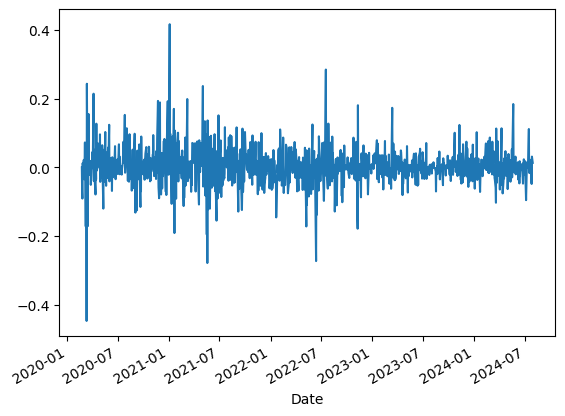

In [ ]:
crypto_returns['ETH/USDT'].plot()

In [ ]:
crypto_returns.describe()

Ticker,ADA/USDT,ATM/USDT,BCH/USDT,BTC/USDT,CRO/USDT,DOGE/USDT,ETH/USDT,LINK/USDT,LTC/USDT
count,1115.000000,1115.000000,1115.000000,1115.000000,1115.000000,1115.000000,1115.000000,1115.000000,1115.000000
mean,0.003718,0.000797,0.001215,0.002645,0.002702,0.008856,0.003804,0.003385,0.001614
std,0.063566,0.035642,0.046247,0.042074,0.059914,0.145258,0.055010,0.066662,0.056433
min,-0.412950,-0.446669,-0.460202,-0.395972,-0.295894,-0.387727,-0.446581,-0.473684,-0.385408
25%,-0.028478,0.000000,0.000000,-0.016623,-0.023464,-0.026717,-0.020986,-0.031780,-0.024539
50%,0.000202,0.000000,0.000000,0.001473,0.000909,0.000000,0.002013,0.002415,0.002504
75%,0.030890,0.000000,0.000000,0.021368,0.026784,0.024448,0.027796,0.037877,0.027602
max,0.371247,0.769231,0.528062,0.211100,0.629360,3.873486,0.416388,0.397438,0.282899


In [ ]:

# Market returns, assuming 'Market_Return' represents the benchmark
market_returns = top_10_df_cleaned.groupby('Date')['Market_Return'].first()
market_returns.head(2)

Date
2020-02-24   -0.029000
2020-02-25   -0.035081
Name: Market_Return, dtype: float64

In [ ]:
crypto_returns.index

DatetimeIndex(['2020-02-24', '2020-02-25', '2020-02-26', '2020-02-27',
               '2020-02-28', '2020-03-02', '2020-03-03', '2020-03-04',
               '2020-03-05', '2020-03-06',
               ...
               '2024-07-16', '2024-07-17', '2024-07-18', '2024-07-19',
               '2024-07-22', '2024-07-23', '2024-07-24', '2024-07-25',
               '2024-07-26', '2024-07-29'],
              dtype='datetime64[ns]', name='Date', length=1115, freq=None)

In [ ]:
market_returns.index

DatetimeIndex(['2020-02-24', '2020-02-25', '2020-02-26', '2020-02-27',
               '2020-02-28', '2020-03-02', '2020-03-03', '2020-03-04',
               '2020-03-05', '2020-03-06',
               ...
               '2024-07-16', '2024-07-17', '2024-07-18', '2024-07-19',
               '2024-07-22', '2024-07-23', '2024-07-24', '2024-07-25',
               '2024-07-26', '2024-07-29'],
              dtype='datetime64[ns]', name='Date', length=1115, freq=None)

In [ ]:
missing_timestamps = [ts for ts in market_returns.index if ts not in crypto_returns.index]
print("Missing Timestamps:", missing_timestamps)


Missing Timestamps: []


In [ ]:
# Ensure the indices are aligned
crypto_returns = crypto_returns.loc[market_returns.index]
crypto_returns

Ticker,ADA/USDT,ATM/USDT,BCH/USDT,BTC/USDT,CRO/USDT,DOGE/USDT,ETH/USDT,LINK/USDT,LTC/USDT
Date,,,,,,,,,
2020-02-24,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-02-25,-0.048966,0.0,-0.067165,-0.035081,0.000000,-0.039117,-0.069995,-0.107425,-0.059944
2020-02-26,-0.123998,0.0,-0.103400,-0.056488,0.000000,-0.052801,-0.090607,0.022870,-0.148508
2020-02-27,0.013423,0.0,0.024631,0.002652,0.000000,-0.010638,0.012332,0.104248,0.019838
2020-02-28,-0.019466,0.0,-0.028138,-0.014010,0.000000,-0.018495,-0.002111,0.053657,-0.029178
...,...,...,...,...,...,...,...,...,...
2024-07-23,-0.038010,0.0,0.000000,-0.023625,-0.008734,-0.054427,0.012496,-0.001436,0.022437
2024-07-24,-0.009024,0.0,0.000000,-0.008476,-0.000653,-0.017652,-0.042130,-0.036664,-0.022356
2024-07-25,-0.028304,0.0,0.000000,0.006455,-0.027974,-0.021094,-0.048167,-0.034328,-0.034792


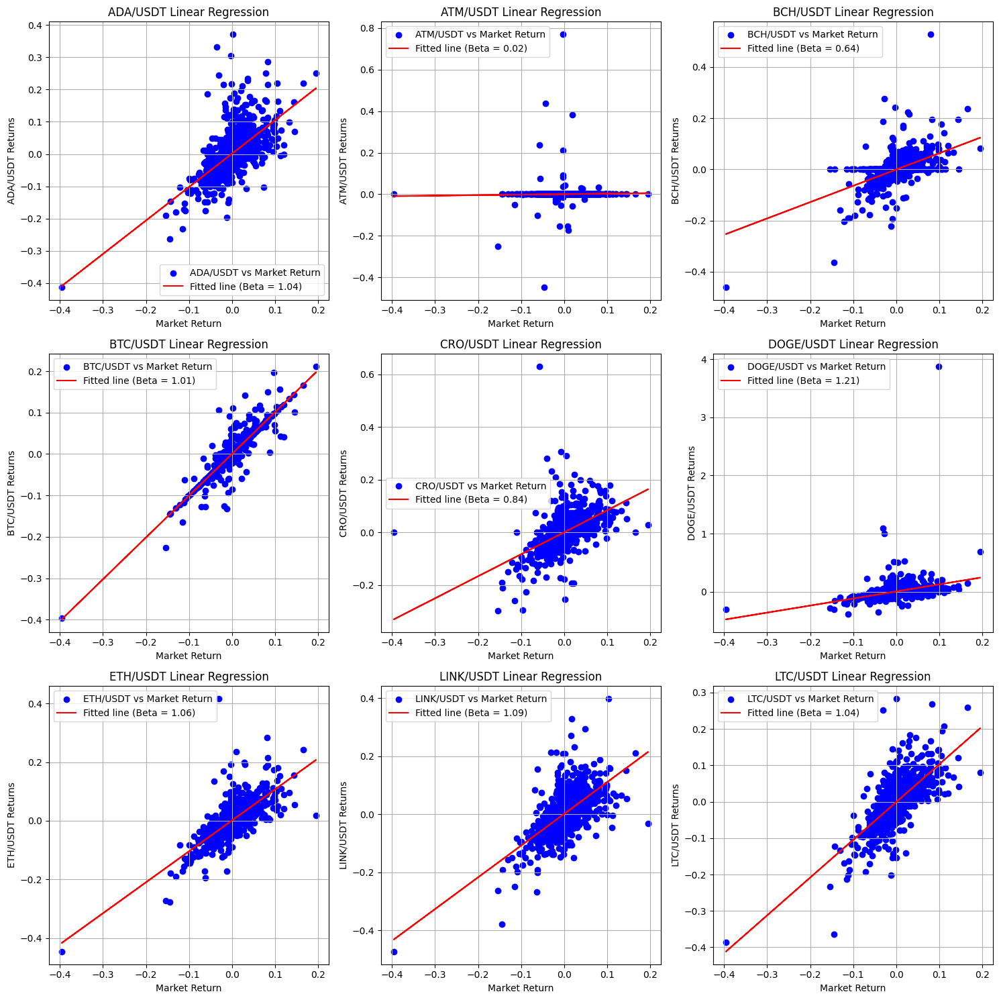

Summary of Beta Analysis for Linear Regression:


,Crypto,Beta,R-squared,P-value,Standard Error,Slope 95% CI,Intercept 95% CI
0,ADA/USDT,1.038234,0.400279,1.012949e-125,0.038093,1.038234 +/- 0.074741,0.001551 +/- 0.074741
1,ATM/USDT,0.024279,0.000696,3.787161e-01,0.027571,0.024279 +/- 0.054097,0.000746 +/- 0.054097
2,BCH/USDT,0.637791,0.285364,2.806293e-83,0.030253,0.637791 +/- 0.059360,-0.000116 +/- 0.059360
3,BTC/USDT,1.009920,0.864483,0.000000e+00,0.011986,1.009920 +/- 0.023517,0.000537 +/- 0.023517
4,CRO/USDT,0.835507,0.291779,1.837399e-85,0.039018,0.835507 +/- 0.076556,0.000958 +/- 0.076556
5,DOGE/USDT,1.214036,0.104809,1.276825e-28,0.106351,1.214036 +/- 0.208671,0.006322 +/- 0.208671
6,ETH/USDT,1.057454,0.554447,1.315191e-197,0.028414,1.057454 +/- 0.055751,0.001597 +/- 0.055751
7,LINK/USDT,1.093815,0.403970,3.246339e-127,0.039825,1.093815 +/- 0.078140,0.001102 +/- 0.078140
8,LTC/USDT,1.038716,0.508328,8.761263e-174,0.030621,1.038716 +/- 0.060081,-0.000554 +/- 0.060081


In [ ]:
# Set up grid for plotting
num_cryptos = crypto_returns.shape[1]
rows = math.ceil(num_cryptos / 3)
cols = 3 if num_cryptos >= 3 else num_cryptos

fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
axes = axes.flatten()  # Flatten in case there are fewer than 9 cryptos

# Initialize a list to store results
results = []

# Iterate through each cryptocurrency and analyze
for i, crypto in enumerate(crypto_returns.columns):
    x, y = market_returns, crypto_returns[crypto]
    ax = axes[i]
    result = analyze_crypto(crypto, x, y, ax, 'Market Return')
    results.append(result)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Create a DataFrame to summarize results
results_df = pd.DataFrame(results)

plt.tight_layout()
plt.show()

print("Summary of Beta Analysis for Linear Regression:")
results_df


- **Interpretation:** 

- A Beta greater than 1 indicates that the cryptocurrency is more volatile than the market, while a Beta less than 1 indicates lower volatility relative to the market.



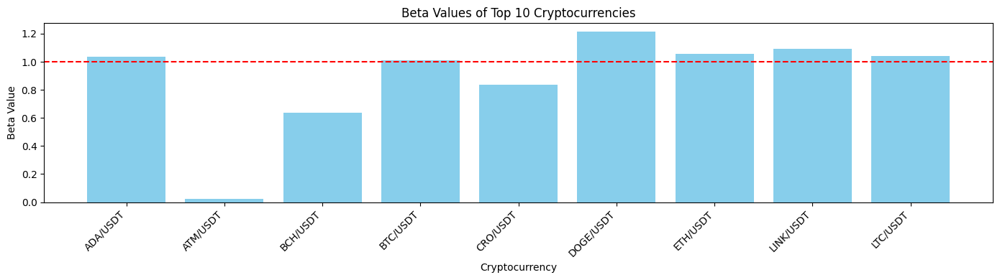

In [ ]:
cryptos = results_df['Crypto']
betas = results_df['Beta']

# Creating a bar chart for Betas
plt.figure(figsize=(all_plots_size))
plt.bar(cryptos, betas, color='skyblue')

plt.axhline(1, color='red', linestyle='--', label='Reference Beta = 1')

# Adding labels and title
plt.xlabel('Cryptocurrency')
plt.ylabel('Beta Value')
plt.title('Beta Values of Top 10 Cryptocurrencies')

# Rotating the x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Displaying the chart
plt.tight_layout()
plt.show()


### 4.3 CAPM - Candlesticks

Candlestick analysis can play a valuable role in understanding cryptocurrency price movements and trends. 
1. **Trend Identification**
   - **Bullish and Bearish Trends**: Candlestick patterns can help identify bullish or bearish trends. For example, patterns like "Bullish Engulfing" or "Bearish Engulfing" can signal potential trend reversals or continuation.
   - **Support and Resistance**: Recognize support and resistance levels more effectively by analyzing candlestick formations at these key levels.

2. **Entry and Exit Signals**
   - **Trade Timing**: Candlestick patterns can provide entry and exit signals. Patterns such as "Doji," "Hammer," and "Shooting Star" can indicate potential market reversals, helping you make more informed trading decisions.

3. **Market Sentiment**
   - **Investor Sentiment**: Candlestick patterns reflect market sentiment and psychological factors. For instance, a long white candle following a downtrend might indicate a shift in market sentiment from bearish to bullish.

4. **Confirmation with Other Indicators**
   - **Complementary Analysis**: Use candlestick patterns in conjunction with other technical indicators like Moving Averages, RSI, or MACD. For example, a candlestick pattern signaling a reversal might be more reliable if confirmed by a momentum indicator.

5. **Volatility Analysis**
   - **Price Action**: Candlestick patterns provide insights into market volatility and price action. Patterns like "Marubozu" indicate strong buying or selling pressure, while patterns with long wicks reflect market indecision.

6. **Historical Pattern Recognition**
   - **Pattern Analysis**: Recognize recurring patterns such as "Head and Shoulders," "Double Top/Bottom," or "Triangles." These patterns can offer insights into future price movements based on historical behavior.

7. **Integration with Your Models**
   - **Factor Models**: Combine candlestick analysis with your factor models to enrich your trading strategy. For example, use candlestick patterns to refine timing for factors such as beta or volatility.



- Combining with Other Metrics:
We overlay candlestick charts with other metrics like volume, moving averages, or beta to provide a comprehensive view:


By integrating candlestick analysis into the cryptocurrency trading strategy, we can enhance your ability to interpret price movements and make more informed decisions based on technical signals and patterns.

In [ ]:
top_10_crypto_df['Ticker'].unique()

array(['ADA/USDT', 'ATM/USDT', 'BCH/USDT', 'BTC/USDT', 'CRO/USDT',
       'DOGE/USDT', 'ETH/USDT', 'LINK/USDT', 'LTC/USDT', 'SMT/USDT'],
      dtype=object)

In [ ]:
top_10_crypto_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,Return,Rolling_Mean,Rolling_Std,Z_Score,Risk_Free_Rate,Market_Return,Excess_Return,Excess_Market_Return,Residuals,Fitted
1985,2019-02-23,0.04583,0.04899,0.04546,0.04845,11496015.84,ADA/USDT,2779,1205,9,...,0.057168,NaN,NaN,1.055792,NaN,0.038737,NaN,NaN,-0.035305,-1.247333
1986,2019-02-24,0.04845,0.05050,0.04121,0.04170,19686686.69,ADA/USDT,3753,1525,160,...,-0.139319,NaN,NaN,-2.734144,NaN,-0.090350,NaN,NaN,0.138696,-1.343747


In [ ]:
cleaned_crypto_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,Market_Return,Excess_Return,Excess_Market_Return,Residuals,Fitted,Beta,Beta_Range,Return_1_Month,Return_3_Months,Return_1_Year
365,2020-02-23,0.1476,0.1512,0.1411,0.1481,3475576.35,ABT/USDT,34,57,0,...,0.030546,NaN,NaN,-0.046088,-0.477924,0.742206,0.5-1.0,0.163394,0.013689,0.844334
366,2020-02-24,0.1481,0.1514,0.1408,0.1452,3554430.37,ABT/USDT,36,90,0,...,-0.029000,-1.396581,-1.406,0.051758,-0.518548,0.742206,0.5-1.0,0.146014,-0.024194,1.080229


/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/mplfinance/_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


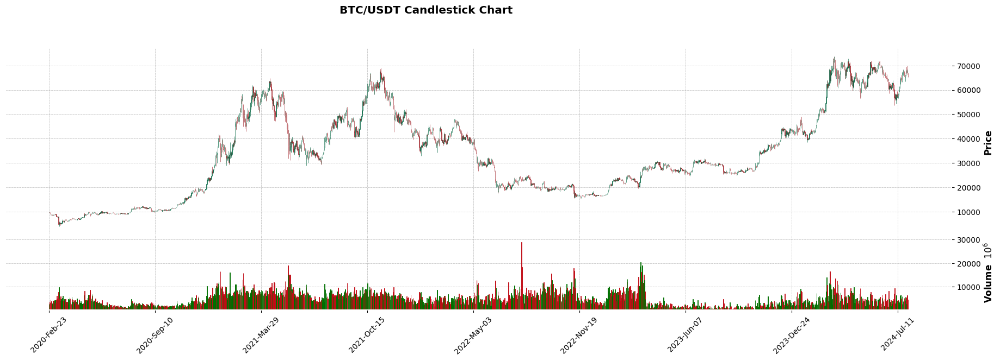

In [ ]:
import mplfinance as mpf

# Prepare data for candlestick chart
candlestick_data = cleaned_crypto_df[cleaned_crypto_df['Ticker'] == 'BTC/USDT'].copy()
candlestick_data.set_index('Date', inplace=True)
candlestick_data = candlestick_data[['Open', 'High', 'Low', 'Close', 'Volume']]

# Plot candlestick chart
mpf.plot(candlestick_data, type='candle', style='charles',
         title='BTC/USDT Candlestick Chart',
         ylabel='Price',
         volume=True,
         figratio=(all_plots_size),
         figscale=1.2,
         warn_too_much_data=1000)


/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/mplfinance/_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


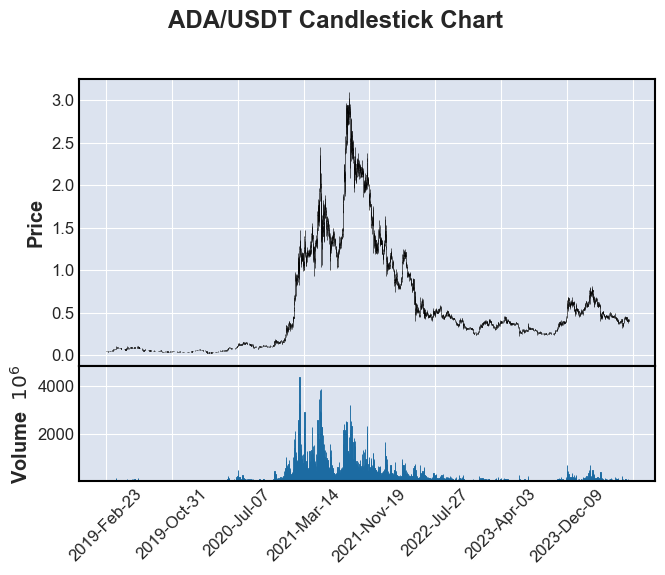

In [ ]:
# Example: Plotting candlestick chart for ADA/USDT
ada_df = top_10_crypto_df[top_10_crypto_df['Ticker'] == 'ADA/USDT'].set_index('Date')

# Select relevant columns
ada_ohlc = ada_df[['Open', 'High', 'Low', 'Close', 'Volume']]

# Plotting the candlestick chart
mpf.plot(ada_ohlc, type='candle', volume=True, title='ADA/USDT Candlestick Chart')


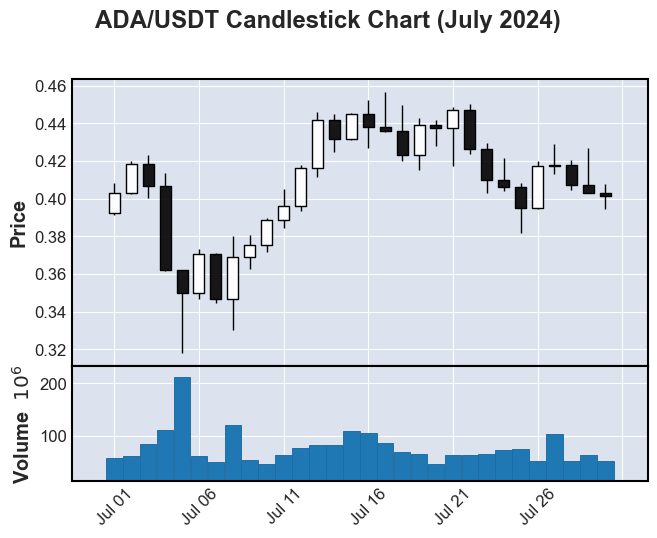

In [ ]:
# Filter data for the last 30 days
filtered_dfs = ada_df.loc['2024-07-01':'2024-07-31']

# Plotting the filtered candlestick chart
mpf.plot(filtered_dfs, type='candle', volume=True, title='ADA/USDT Candlestick Chart (July 2024)')


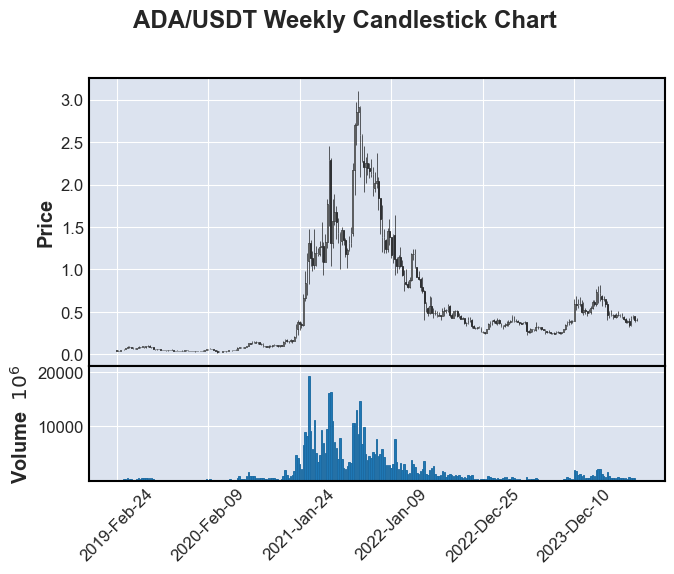

In [ ]:
# Resample the data to weekly OHLC
ada_weekly = ada_df.resample('W').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last',
    'Volume': 'sum'
})

# Plotting the weekly candlestick chart
mpf.plot(ada_weekly, type='candle', volume=True, title='ADA/USDT Weekly Candlestick Chart')


/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/mplfinance/_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


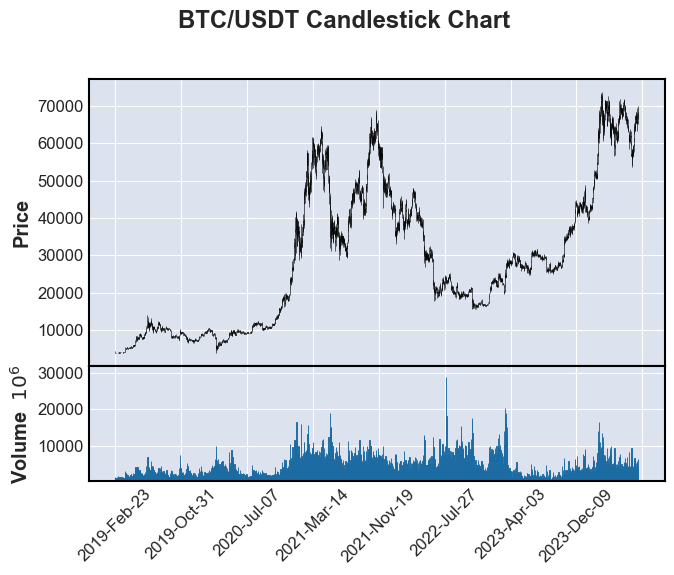

In [ ]:
# Plotting candlestick chart for a specific crypto (e.g., BTC/USDT)
btc_df = top_10_crypto_df[top_10_crypto_df['Ticker'] == 'BTC/USDT'].set_index('Date')
mpf.plot(btc_df[['Open', 'High', 'Low', 'Close', 'Volume']], type='candle', volume=True, title='BTC/USDT Candlestick Chart')


In [ ]:
import plotly.graph_objects as go

# Example: Plotting ADA/USDT with Plotly
fig = go.Figure(data=[go.Candlestick(x=ada_df.index,
                                     open=ada_df['Open'],
                                     high=ada_df['High'],
                                     low=ada_df['Low'],
                                     close=ada_df['Close'])])

fig.update_layout(title='ADA/USDT Candlestick Chart', xaxis_rangeslider_visible=False)
fig.show()


In [ ]:
# import matplotlib.pyplot as plt
# import mplfinance as mpf

# fig, axes = plt.subplots(3, 2, figsize=(14, 10))

# cryptos = ['BTC/USDT', 'ETH/USDT', 'ADA/USDT']  # Add other tickers as needed

# for i, ticker in enumerate(cryptos):
#     ax = axes[i//2, i%2]
#     crypto_df = top_10_crypto_df[top_10_crypto_df['Ticker'] == ticker].set_index('Date')
#     mpf.plot(crypto_df[['Open', 'High', 'Low', 'Close', 'Volume']], type='candle', volume=False, ax=ax, title=ticker)

# plt.tight_layout()
# plt.show()


In [ ]:
# Calculate daily volatility
top_10_crypto_df['Volatility'] = (top_10_crypto_df['High'] - top_10_crypto_df['Low']) / top_10_crypto_df['Open']

# Add this new factor to the factor model
factors = ['Market_Return', 'Volatility', 'Beta']  # Example factors including Volatility


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_69926/2106500393.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### 4.4 Multi-Factor

#### 4.4.1 Multi-Factor Additionals

In [ ]:
# # Proceed with further analysis, such as multi-factor modeling

# # For instance, you might want to prepare features and run a regression model
# import statsmodels.api as sm

# # Example of running a simple OLS regression as a step towards multi-factor modeling
# X = cleaned_crypto_df[['Close', 'Volume', 'Market Cap', 'Active Addresses']]  # Example features
# # X = cleaned_crypto_df[['Beta', 'Market_Return']]  # Add other features as needed  (e.g. inflation rates, interest rates, or other macroeconomic indicators.)

# X = sm.add_constant(X)  # Add a constant to the model
# y = cleaned_crypto_df['Return']  # Dependent variable

# # Fit the model
# model = sm.OLS(y, X).fit()

# # Summarize the results
# print('multi factor model summary')
# print(model.summary())


1. Verify Data Integrity
- Check for Missing Values and Data Completeness

In [ ]:
def check_data_integrity(df):
    # Check for missing values
    missing_values = df.isnull().sum()
    print("Missing Values:\n", missing_values)
    
    # Check for unique values and their counts for critical columns
    print("\nUnique Values and Counts:\n", df[['Close', 'Current Supply', 'Volume']].nunique())
    
    # Check for basic statistics to ensure no unexpected values
    print("\nBasic Statistics:\n", df[['Close', 'Current Supply', 'Volume']].describe())
    
    return df

# Apply the data integrity check
cleaned_crypto_df = check_data_integrity(cleaned_crypto_df)


Missing Values:
 Date                             0
Open                             0
High                             0
Low                              0
Close                            0
Volume                           0
Ticker                           0
Active Addresses                 0
Transaction Count                0
Large Transaction Count          0
Average Transaction Value        0
Hashrate                         0
Difficulty                       0
Current Supply                   0
Market Cap                       0
Return                           0
Rolling_Mean                   255
Rolling_Std                    255
Z_Score                      21751
Risk_Free_Rate               57482
Market_Return                    0
Excess_Return                57482
Excess_Market_Return         57482
Residuals                    58177
Fitted                       58177
Beta                             0
Beta_Range                       0
Return_1_Month                   0
Ret

 2. Test Feature Engineering on Sample Data
- Create a Sample Subset and Manually Verify Calculations

In [ ]:
def test_feature_engineering(df, sample_size=5):
    # Create a sample subset of the data
    sample_df = df.head(sample_size)
    
    # Calculate features manually for verification
    sample_df['Return'] = sample_df['Close'].pct_change()
    sample_df['Volatility'] = sample_df['Return'].rolling(window=14).std()
    sample_df['Volume_Mean'] = sample_df['Volume'].rolling(window=14).mean()
    sample_df['Market Cap'] = sample_df['Close'] * sample_df['Current Supply']
    
    # Print the sample data with calculated features
    print("\nSample Data with Calculated Features:\n", sample_df)
    
    return sample_df

# Apply the feature engineering test
sample_test_df = test_feature_engineering(cleaned_crypto_df)



Sample Data with Calculated Features:
           Date    Open    High     Low   Close      Volume    Ticker  \
365 2020-02-23  0.1476  0.1512  0.1411  0.1481  3475576.35  ABT/USDT   
366 2020-02-24  0.1481  0.1514  0.1408  0.1452  3554430.37  ABT/USDT   
367 2020-02-25  0.1452  0.1490  0.1322  0.1327  4037834.50  ABT/USDT   
368 2020-02-26  0.1327  0.1336  0.1179  0.1192  3763279.77  ABT/USDT   
369 2020-02-27  0.1192  0.1256  0.1107  0.1233  3227522.78  ABT/USDT   

     Active Addresses  Transaction Count  Large Transaction Count  ...  \
365                34                 57                        0  ...   
366                36                 90                        0  ...   
367                37                 54                        0  ...   
368                47                 86                        0  ...   
369                33                 50                        0  ...   

     Excess_Market_Return  Residuals    Fitted      Beta  Beta_Range  \
365       

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_69926/2697353166.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_69926/2697353166.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_69926/2697353166.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

3. Consider Data Frequency

- Ensure Rolling Window and Data Frequency Alignment

In [ ]:
def check_rolling_window(df, window_size=14):
    # Check if rolling window calculation is appropriate for data frequency
    data_frequency = df.index.to_series().diff().mode()[0]  # Most common time difference
    print(f"Data Frequency: {data_frequency}")
    
    if pd.Timedelta(data_frequency).days < window_size:
        print(f"Warning: Rolling window size of {window_size} days may be too large for the given data frequency.")
    
    return df

# Apply the rolling window check
cleaned_crypto_df = check_rolling_window(cleaned_crypto_df)


Data Frequency: 1.0


4. Exploratory Data Analysis (EDA)
- 4.1 Summary Statistics

- Start by getting a high-level overview of your data:

In [ ]:
# Summary statistics for numerical columns
print(cleaned_crypto_df.describe())

# Summary statistics for categorical columns
print(cleaned_crypto_df.describe(include=['object']))


/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning:

invalid value encountered in subtract

/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning:

invalid value encountered in subtract



                                Date           Open           High  \
count                         184446  184446.000000  184446.000000   
mean   2022-04-26 01:44:24.779935744     332.779369     341.127933   
min              2020-02-23 00:00:00       0.000000       0.000000   
25%              2021-03-14 00:00:00       0.004138       0.004449   
50%              2022-04-17 00:00:00       0.064425       0.068410   
75%              2023-06-02 00:00:00       0.626000       0.657875   
max              2024-07-30 00:00:00   73074.270000   73776.320000   
std                              NaN    3547.193953    3631.065561   

                 Low          Close        Volume  Active Addresses  \
count  184446.000000  184446.000000  1.844460e+05      1.844460e+05   
mean      324.014911     333.114944  1.010289e+12      1.771703e+04   
min         0.000000       0.000000  0.000000e+00      0.000000e+00   
25%         0.003872       0.004133  2.056313e+04      2.000000e+00   
50%         0.

/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning:

invalid value encountered in subtract



4.2 Distribution of Features

- Visualizing the distribution of individual features can reveal important insights:

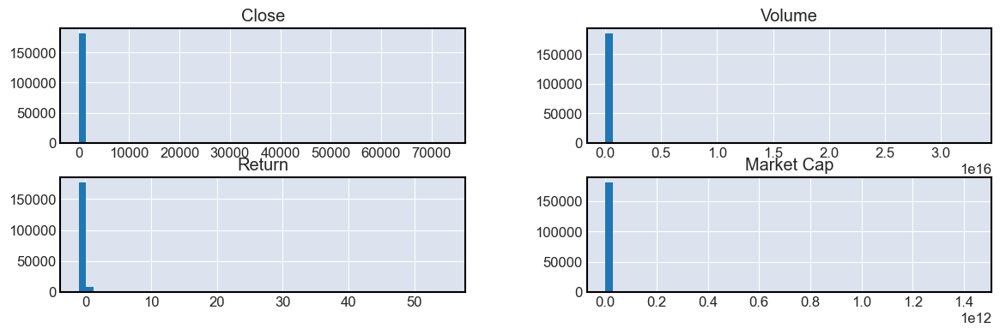

In [ ]:
# # Plot histograms for numerical features
cleaned_crypto_df[['Close', 'Volume', 'Return', 'Market Cap']].hist(bins=50, figsize=(all_plots_size))
plt.show()

# # Plot distributions using seaborn
# for column in ['Close', 'Volume', 'Return', 'Volatility']:
#     sns.histplot(cleaned_crypto_df[column], kde=True)
#     plt.title(f'Distribution of {column}')
#     plt.show()


In [ ]:
cleaned_crypto_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker',
       'Active Addresses', 'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score',
       'Risk_Free_Rate', 'Market_Return', 'Excess_Return',
       'Excess_Market_Return', 'Residuals', 'Fitted', 'Beta', 'Beta_Range',
       'Return_1_Month', 'Return_3_Months', 'Return_1_Year'],
      dtype='object')

4.3 Time Series Analysis

- Since we’re working with time series data, visualizing the trends over time can be helpful:

In [ ]:
# # Plot closing price over time
# plt.figure(figsize=(14, 7))
# plt.plot(cleaned_crypto_df.index, cleaned_crypto_df['Close'], label='Close Price')
# plt.xlabel('Date')
# plt.ylabel('Close Price')
# plt.title('Close Price Over Time')
# plt.legend()
# plt.show()

# # Plot volume over time
# plt.figure(figsize=(14, 7))
# plt.plot(cleaned_crypto_df.index, cleaned_crypto_df['Volume'], label='Volume', color='orange')
# plt.xlabel('Date')
# plt.ylabel('Volume')
# plt.title('Volume Over Time')
# plt.legend()
# plt.show()


In [ ]:
# # Scatter plot of Close vs. Volume
# plt.figure(figsize=(all_plots_size))
# sns.scatterplot(x='Volume', y='Close', data=cleaned_crypto_df)
# plt.xlabel('Volume')
# plt.ylabel('Close Price')
# plt.title('Close Price vs. Volume')
# plt.show()


4.4 Feature Relationships

- Explore relationships between features, such as price vs. volume:

5. Feature Engineering
- 5.1 Create Lagged Features

- Lagged features can be useful in capturing temporal dependencies. For instance, creating lagged versions of price and volume variables can help the model understand trends.

In [ ]:
# Example of creating lagged features for the 'Close' price
for lag in [1, 5, 10]:  # Creating lag of 1, 5, and 10 days
    cleaned_crypto_df[f'Close_lag_{lag}'] = cleaned_crypto_df['Close'].shift(lag)


- 5.2 Calculate Moving Averages

- Moving averages can help smooth out price data and identify trends

In [ ]:
# Example of calculating moving averages
for window in [7, 30, 90]:  # 7-day, 30-day, and 90-day moving averages
    cleaned_crypto_df[f'Close_MA_{window}'] = cleaned_crypto_df['Close'].rolling(window=window).mean()


- 5.3 Generate Technical Indicators

- Technical indicators such as RSI (Relative Strength Index), MACD (Moving Average Convergence Divergence), and Bollinger Bands can be valuable.

In [ ]:
import talib

# Example of calculating RSI
cleaned_crypto_df['RSI'] = talib.RSI(cleaned_crypto_df['Close'].values, timeperiod=14)

# Example of calculating MACD
macd, macdsignal, macdhist = talib.MACD(cleaned_crypto_df['Close'].values, fastperiod=12, slowperiod=26, signalperiod=9)
cleaned_crypto_df['MACD'] = macd
cleaned_crypto_df['MACD_Signal'] = macdsignal
cleaned_crypto_df['MACD_Hist'] = macdhist

- 5.4 Create Interaction Terms

- Interaction terms can capture relationships between different features.

In [ ]:
# Example of creating interaction terms between 'Close' and 'Volume'
cleaned_crypto_df['Close_Volume'] = cleaned_crypto_df['Close'] * cleaned_crypto_df['Volume']


- 5.5 Add Rolling Statistics

- Rolling statistics like standard deviation can help capture volatility.

In [ ]:
# Example of calculating rolling standard deviation
cleaned_crypto_df['Close_StdDev_30'] = cleaned_crypto_df['Close'].rolling(window=30).std()


- 5.6 Feature Selection

- After creating new features, it’s essential to evaluate their relevance. This can be done using various methods:

In [ ]:
# correlation_matrix = cleaned_crypto_df.corr()
# print(correlation_matrix['target_variable'].sort_values(ascending=False))


In [ ]:
# from sklearn.ensemble import RandomForestRegressor


# X = cleaned_crypto_df.drop(columns=['target_variable'])
# y = cleaned_crypto_df['target_variable']

# model = RandomForestRegressor()
# model.fit(X, y)
# importances = model.feature_importances_
# feature_importances = pd.Series(importances, index=X.columns)
# print(feature_importances.sort_values(ascending=False))


- 5.7 Missing Values Analysis

- Identify patterns in missing data:

In [ ]:
# # Plot missing values
# import missingno as msno

# msno.matrix(cleaned_crypto_df)
# plt.show()

In [ ]:
# Calculate the percentage of missing data in each column
missing_data = cleaned_crypto_df.isna().mean() * 100

# Select columns with more than 90% missing values
columns_to_review = cleaned_crypto_df.loc[:, missing_data > 90]

# Include the Ticker column in the output
columns_to_review_with_ticker = cleaned_crypto_df[['Ticker']].join(columns_to_review)

# Display the first few rows to review the data
print("Columns with more than 90% missing values, including the Ticker names:")
print(columns_to_review_with_ticker.head())


Columns with more than 90% missing values, including the Ticker names:
       Ticker
365  ABT/USDT
366  ABT/USDT
367  ABT/USDT
368  ABT/USDT
369  ABT/USDT


- 5.8 Feature Engineering Insights

- Analyze the new features you created:

In [ ]:
# Histograms for new features
# new_features = ['Close_lag_1', 'Close_MA_7', 'RSI', 'MACD', 'MACD_Signal', 'Close_Volume']
# for feature in new_features:
#     sns.histplot(cleaned_crypto_df[feature].dropna(), kde=True)
#     plt.title(f'Distribution of {feature}')
#     plt.show()


In [ ]:
# active_addresses: Indicates user activity on the network.
# transaction_count: Reflects the number of transactions, which can indicate network usage.
# large_transaction_count: Points to the number of significant transactions, often by institutional players.
# average_transaction_value: Provides insight into the typical transaction size, which can reflect market sentiment.
# hashrate: Measures the computational power used in mining, linked to network security.
# difficulty: Indicates how hard it is to mine new blocks, which can impact supply.
# current_supply: The total amount of cryptocurrency in circulation, crucial for supply-demand analysis.

In [ ]:
from scipy import stats

def detect_outliers(df, column):
    z_scores = np.abs(stats.zscore(df[column]))
    return df[(z_scores < 3)]

# cleaned_crypto_df = detect_outliers(cleaned_crypto_df, 'Close')

In [ ]:
cleaned_crypto_df['Close']

- `Avoid Survivorship Bias`

- To avoid survivorship bias, ensure that your dataset includes assets that may have been delisted or are not tradable by the end of the sample period. This can be achieved by:

1. Including all available historical data for each asset, even if they are not actively traded anymore.

2. Ensuring that your filtering criteria do not inadvertently exclude assets that have been delisted or have ceased trading.

In [ ]:
# import requests

# def fetch_transaction_data(asset, start_date, end_date):
#     """
#     Fetch transaction data for a given asset from a blockchain explorer.
    
#     Parameters:
#     asset (str): The ticker or symbol of the asset.
#     start_date (str): The start date for fetching data in 'YYYY-MM-DD' format.
#     end_date (str): The end date for fetching data in 'YYYY-MM-DD' format.
#     api_key (str): API key for the blockchain explorer.
    
#     Returns:
#     pd.DataFrame: DataFrame containing transaction data for the asset.
#     """
#     url = f'https://api.blockchainexplorer.com/{asset}/transactions'
#     params = {
#         'start_date': start_date,
#         'end_date': end_date,
#         # 'api_key': api_key
#     }
#     response = requests.get(url, params=params)
#     data = response.json()
#     df = pd.DataFrame(data)
#     return df

# # Example usage:
# api_key = 'your_api_key_here'
# transaction_data = fetch_transaction_data('BTC', start_date, end_date)
# print(transaction_data.head())

1. Price Data: Historical prices aggregated across exchanges.
2. Volume Data: Trading volumes to indicate market activity and liquidity.
3. Order Book Data: Depth of market, bid-ask spread, and order flow.
4. Transaction Data: Number of transactions, average transaction size, and transaction frequency.
5. Volatility: Historical volatility measures.
6. Market Sentiment: Data from social media, news sentiment, and forum discussions.
7. Macroeconomic Indicators: Interest rates, inflation rates, and economic reports.
8. Technical Indicators: Moving averages, RSI, MACD, Bollinger Bands, etc.
9. On-Chain Data: Blockchain data such as transaction counts, active addresses, and hash rates.
10. External Factors: Regulatory news, major partnerships, and technological advancements.


In [ ]:
# import yfinance as yf
# import pandas_datareader.data as web
# import requests
# import pandas as pd

# def fetch_usd_data(start_date, end_date):
#     # Fetch USD Index (DXY) data
#     dxy = yf.download("DX-Y.NYB", start=start_date, end=end_date)
#     return dxy

# def fetch_cryptocurrency_data(pairs, start_date, end_date):
#     # Placeholder function to fetch cryptocurrency data
#     all_data = []
#     for pair in pairs:
#         try:
#             ticker = yf.Ticker(pair)
#             data = ticker.history(start=start_date, end=end_date)
#             if not data.empty:
#                 data = data[['Open', 'High', 'Low', 'Close', 'Volume']]
#                 data['Ticker'] = pair
#                 all_data.append(data)
#         except Exception as e:
#             print(f"Error fetching data for {pair}: {e}")
#     combined_data = pd.concat(all_data) if all_data else pd.DataFrame()
#     return combined_data

# def get_top_cryptocurrencies(limit=100, order='market_cap_desc'):
#     url = 'https://api.coingecko.com/api/v3/coins/markets'
#     params = {
#         'vs_currency': 'usd',
#         'order': order,
#         'per_page': limit,
#         'page': 1,
#         'sparkline': False
#     }
#     response = requests.get(url, params=params)
#     if response.status_code == 200:
#         data = response.json()
#         usdt_pairs = [coin['symbol'].upper() + '/USDT' for coin in data]
#         # usd_pairs = [coin['symbol'].upper() + '/USD' for coin in data]
#         return usdt_pairs
#     else:
#         print(f"Error fetching data: {response.status_code}")
#         return [], []


In [ ]:
# usd_data = fetch_usd_data('2019-01-01', '2024-07-31')
# usd_data

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-01-02,96.139999,96.959999,95.820000,96.820000,96.820000,0
2019-01-03,96.720001,96.750000,96.209999,96.309998,96.309998,0
2019-01-04,96.279999,96.610001,96.050003,96.190002,96.190002,0
2019-01-07,96.160004,96.160004,95.639999,95.709999,95.709999,0
2019-01-08,95.690002,96.029999,95.680000,95.900002,95.900002,0
...,...,...,...,...,...,...
2024-07-24,104.480003,104.559998,104.120003,104.389999,104.389999,0
2024-07-25,104.379997,104.459999,104.080002,104.360001,104.360001,0
2024-07-26,104.360001,104.449997,104.209999,104.320000,104.320000,0


In [ ]:
# crypto_pairs = get_top_cryptocurrencies(000)
# print(crypto_pairs)

In [ ]:


# crypto_data = fetch_cryptocurrency_data(crypto_pairs, '2019-01-01', '2024-07-31')

In [ ]:
cleaned_crypto_df.isnull().sum()

Date                             0
Open                             0
High                             0
Low                              0
Close                            0
Volume                           0
Ticker                           0
Active Addresses                 0
Transaction Count                0
Large Transaction Count          0
Average Transaction Value        0
Hashrate                         0
Difficulty                       0
Current Supply                   0
Market Cap                       0
Return                           0
Rolling_Mean                   255
Rolling_Std                    255
Z_Score                      21751
Risk_Free_Rate               57482
Market_Return                    0
Excess_Return                57482
Excess_Market_Return         57482
Residuals                    58177
Fitted                       58177
Beta                             0
Beta_Range                       0
Return_1_Month                   0
Return_3_Months     

#### 4.4.2 Multi-Factor Linear Model - OLS

                            OLS Regression Results                            
Dep. Variable:          Excess_Return   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                 7.598e+05
Date:                Sun, 25 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:44:52   Log-Likelihood:                 5493.9
No. Observations:              101428   AIC:                        -1.098e+04
Df Residuals:                  101422   BIC:                        -1.092e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.5295      0.001  -3514.528      0.0

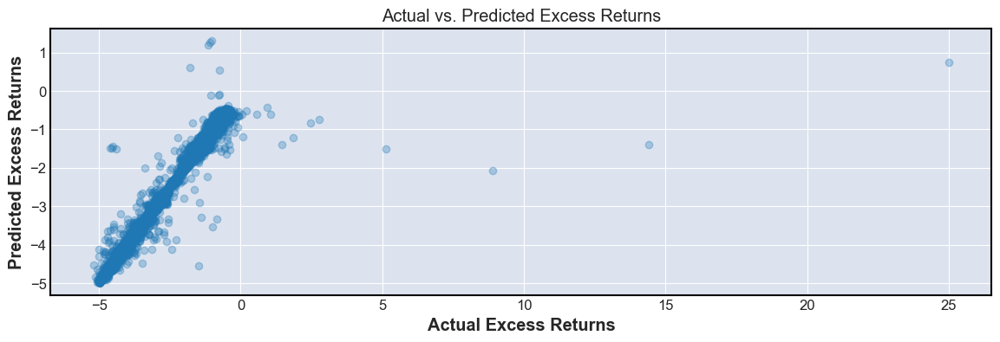

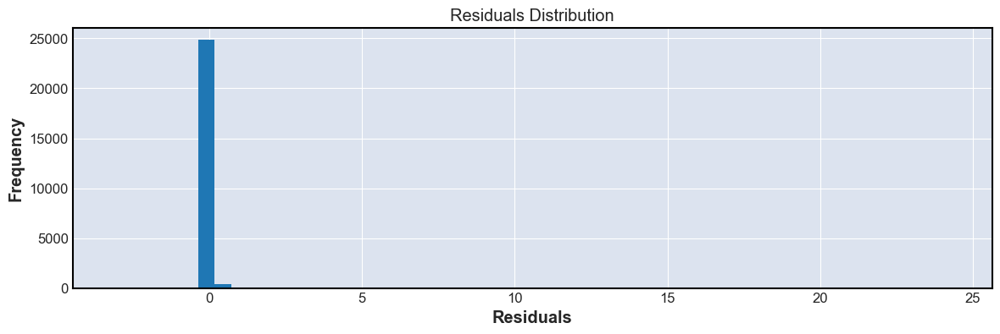

In [ ]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Calculate daily volatility
cleaned_crypto_df['Volatility'] = (cleaned_crypto_df['High'] - cleaned_crypto_df['Low']) / cleaned_crypto_df['Open']

# Example: Calculate a momentum factor based on consecutive bullish days
cleaned_crypto_df['Momentum'] = cleaned_crypto_df['Close'] > cleaned_crypto_df['Open']

# Sum up consecutive bullish days as a momentum factor
cleaned_crypto_df['Bullish_Momentum'] = cleaned_crypto_df['Momentum'].rolling(window=5).sum()

# Select relevant columns for the model
factors = ['Market_Return', 'Bullish_Momentum', 'Rolling_Std', 'Beta', 'Risk_Free_Rate']
target = 'Excess_Return'  # Target variable

# Drop any rows with missing values
cleaned_crypto_df.dropna(subset=factors + [target], inplace=True)

# Split data into features (X) and target (y)
X = cleaned_crypto_df[factors]
y = cleaned_crypto_df[target]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split into training and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Add a constant to the model (intercept term)
X_train_with_const = sm.add_constant(X_train)
X_test_with_const = sm.add_constant(X_test)

# Fit the linear regression model using OLS
model = sm.OLS(y_train, X_train_with_const).fit()

# Print the summary of the model
print(model.summary(), '\n')

# Predict on the test set
y_pred = model.predict(X_test_with_const)

# Calculate R-squared for the test set
r_squared = model.rsquared
adjusted_r_squared = model.rsquared_adj

print(f"R-squared: {r_squared}")
print(f"Adjusted R-squared: {adjusted_r_squared}",'\n')

# Plot actual vs. predicted returns
plt.figure(figsize=(all_plots_size))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.xlabel('Actual Excess Returns')
plt.ylabel('Predicted Excess Returns')
plt.title('Actual vs. Predicted Excess Returns')
plt.show()

# Plot residuals
residuals = y_test - y_pred

plt.figure(figsize=(all_plots_size))
plt.hist(residuals, bins=50)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Residuals Distribution')
plt.show()


In [ ]:
X_train, X_test, y_train, y_test

In [ ]:
cleaned_crypto_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,Close_MA_90,RSI,MACD,MACD_Signal,MACD_Hist,Close_Volume,Close_StdDev_30,Volatility,Momentum,Bullish_Momentum
369,2020-02-27,0.1192,0.1256,0.1107,0.1233,3227522.78,ABT/USDT,33,50,0,...,NaN,NaN,NaN,NaN,NaN,397953.558774,NaN,0.125000,True,2.0
370,2020-02-28,0.1233,0.1251,0.1121,0.1184,2366736.61,ABT/USDT,36,40,0,...,NaN,NaN,NaN,NaN,NaN,280221.614624,NaN,0.105434,False,1.0


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import gaussian_filter1d

def plot_actual_vs_predicted_with_ticker_and_smoothing(cleaned_crypto_df, y_train, y_test, y_pred, all_plots_size=(12, 8), sigma=2):
    # Get the indices of the train and test sets
    train_indices = y_train.index
    test_indices = y_test.index

    # Create a DataFrame for the train set with actual returns and dates
    train_df = pd.DataFrame({
        'Date': cleaned_crypto_df.loc[train_indices, 'Date'],
        'Ticker': cleaned_crypto_df.loc[train_indices, 'Ticker'],
        'Market Cap': cleaned_crypto_df.loc[train_indices, 'Market Cap'],
        'Actual_Train': y_train,
    })

    # Create a DataFrame for the test set with actual and predicted returns and dates
    test_df = pd.DataFrame({
        'Date': cleaned_crypto_df.loc[test_indices, 'Date'],
        'Ticker': cleaned_crypto_df.loc[test_indices, 'Ticker'],
        'Market Cap': cleaned_crypto_df.loc[test_indices, 'Market Cap'],
        'Actual_Test': y_test,
        'Predicted_Test': y_pred
    })

    # Combine the train and test DataFrames for plotting
    combined_df = pd.concat([train_df, test_df])

    # Sort by Date (just in case the order got mixed up)
    combined_df.sort_values(by='Date', inplace=True)

    # Plot setup
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=all_plots_size)

    # Plot actual and predicted returns
    axes[0].plot(combined_df['Date'], combined_df['Actual_Train'], label='Actual Train Returns', color='green', alpha=0.6)
    axes[0].plot(combined_df['Date'], combined_df['Actual_Test'], label='Actual Test Returns', color='blue', alpha=0.6)
    axes[0].plot(combined_df['Date'], combined_df['Predicted_Test'], label='Predicted Test Returns', color='red', alpha=0.6)
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel('Excess Returns')
    axes[0].set_title('Actual vs. Predicted Excess Returns Over Time')
    axes[0].legend()

    # Apply Gaussian smoothing for a clearer view
    combined_df['Smoothed_Actual_Train'] = gaussian_filter1d(combined_df['Actual_Train'].fillna(0), sigma=sigma)
    combined_df['Smoothed_Actual_Test'] = gaussian_filter1d(combined_df['Actual_Test'].fillna(0), sigma=sigma)
    combined_df['Smoothed_Predicted_Test'] = gaussian_filter1d(combined_df['Predicted_Test'].fillna(0), sigma=sigma)

    # Plot smoothed graphs
    axes[1].plot(combined_df['Date'], combined_df['Smoothed_Actual_Train'], label='Smoothed Actual Train Returns', color='green', alpha=0.6)
    axes[1].plot(combined_df['Date'], combined_df['Smoothed_Actual_Test'], label='Smoothed Actual Test Returns', color='blue', alpha=0.6)
    axes[1].plot(combined_df['Date'], combined_df['Smoothed_Predicted_Test'], label='Smoothed Predicted Test Returns', color='red', alpha=0.6)
    axes[1].set_xlabel('Date')
    axes[1].set_ylabel('Excess Returns')
    axes[1].set_title('Smoothed Actual vs. Predicted Excess Returns Over Time')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    return combined_df


In [ ]:
def plot_excess_returns_over_time(cleaned_crypto_df, y_train, y_test, y_pred, all_plots_size):
    # Get the indices of the train and test sets
    train_indices = y_train.index
    test_indices = y_test.index

    # Create a DataFrame for the train set with actual returns, dates, tickers, and market cap
    train_df = pd.DataFrame({
        'Date': cleaned_crypto_df.loc[train_indices, 'Date'],
        'Ticker': cleaned_crypto_df.loc[train_indices, 'Ticker'],
        'Market Cap': cleaned_crypto_df.loc[train_indices, 'Market Cap'],
        'Actual_Train': y_train,
    })

    # Create a DataFrame for the test set with actual and predicted returns, dates, tickers, and market cap
    test_df = pd.DataFrame({
        'Date': cleaned_crypto_df.loc[test_indices, 'Date'],
        'Ticker': cleaned_crypto_df.loc[test_indices, 'Ticker'],
        'Market Cap': cleaned_crypto_df.loc[test_indices, 'Market Cap'],
        'Actual_Test': y_test,
        'Predicted_Test': y_pred
    })

    # Combine the train and test DataFrames for plotting
    combined_df = pd.concat([train_df, test_df])

    # Sort by Date (just in case the order got mixed up)
    combined_df.sort_values(by='Date', inplace=True)

    # Plotting
    plt.figure(figsize=(all_plots_size))

    # Plot actual train set returns
    plt.plot(combined_df['Date'], combined_df['Actual_Train'], label='Actual Train Returns', color='green', alpha=0.6)

    # Plot actual test set returns
    plt.plot(combined_df['Date'], combined_df['Actual_Test'], label='Actual Test Returns', color='blue', alpha=0.6)

    # Plot predicted test set returns
    plt.plot(combined_df['Date'], combined_df['Predicted_Test'], label='Predicted Test Returns', color='red', alpha=0.6)

    plt.xlabel('Date')
    plt.ylabel('Excess Returns')
    plt.title('Actual vs. Predicted Excess Returns Over Time')
    plt.legend()
    plt.show()

    return combined_df


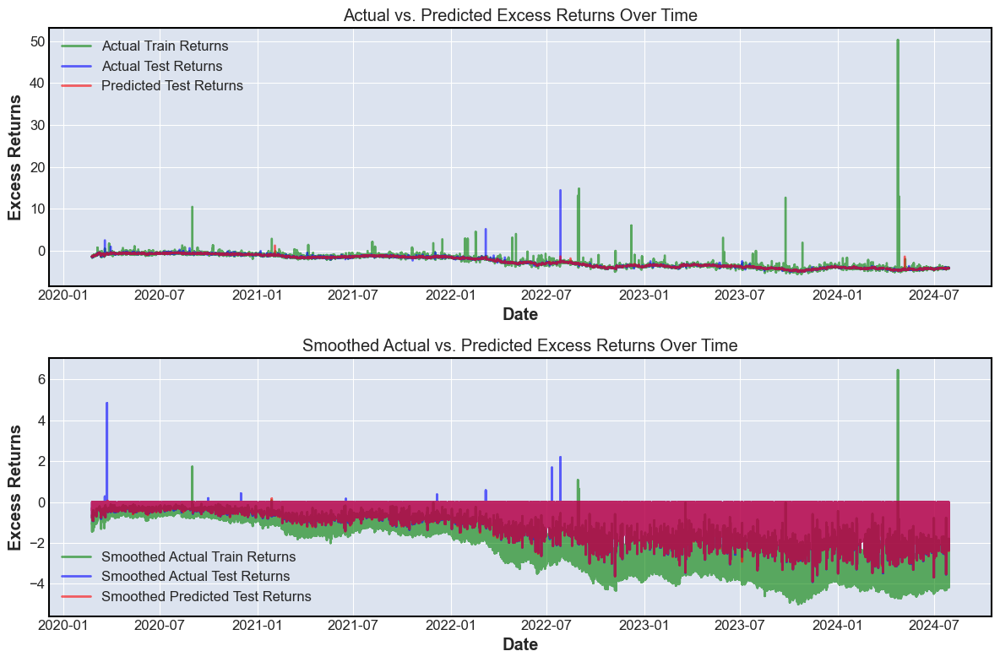

In [ ]:
combined_df = plot_actual_vs_predicted_with_ticker_and_smoothing(cleaned_crypto_df, y_train, y_test, y_pred, all_plots_size=(12, 8), sigma=2)

In [ ]:
top_5_by_marketcap_cleaned = cleaned_crypto_df.groupby('Ticker')['Market Cap'].max().nlargest(5).index.tolist()
top_5_by_marketcap_cleaned

['BTC/USDT', 'ETH/USDT', 'ADA/USDT', 'DOGE/USDT', 'BCH/USDT']

In [ ]:
top_5_by_marketcap_combined = combined_df.groupby('Ticker')['Market Cap'].max().nlargest(5).index.tolist()
top_5_by_marketcap_combined

['BTC/USDT', 'ETH/USDT', 'ADA/USDT', 'DOGE/USDT', 'BCH/USDT']

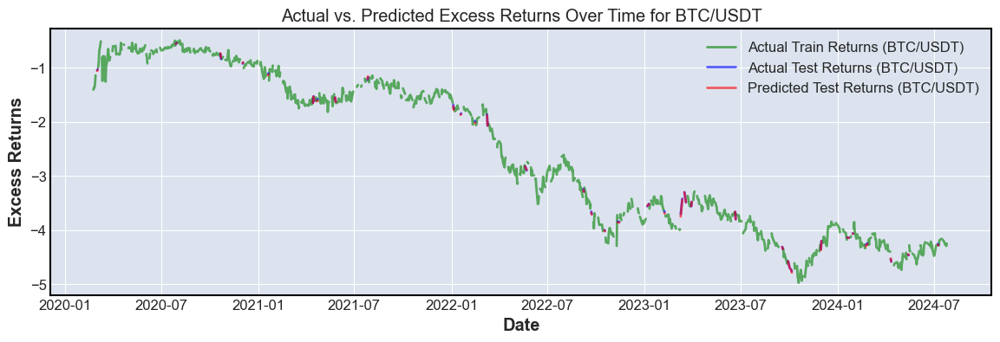

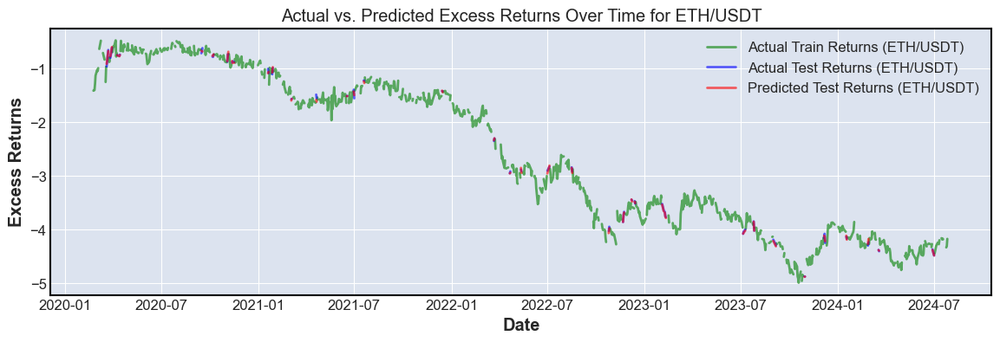

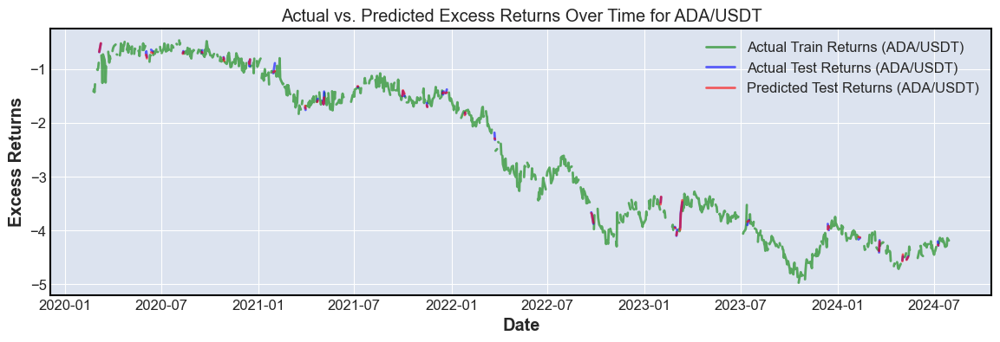

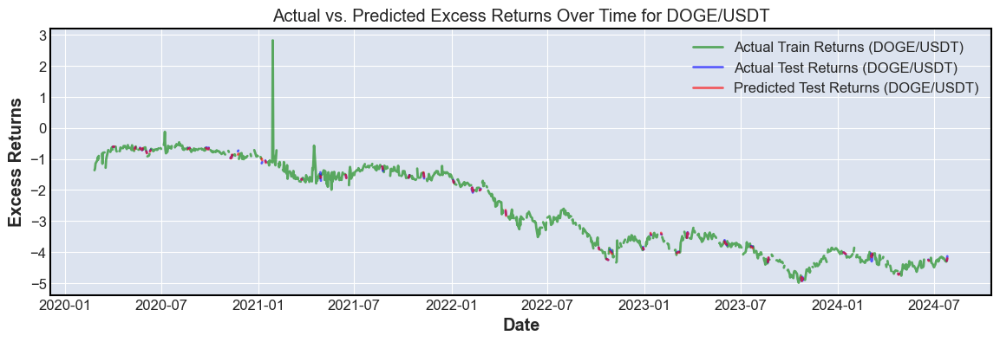

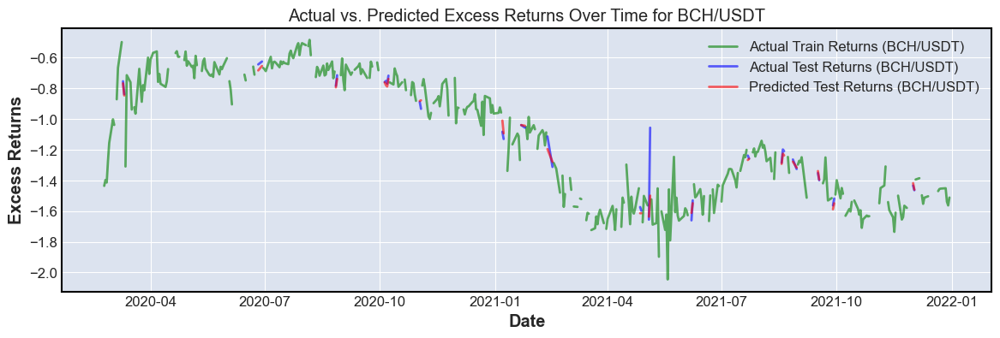

In [ ]:

# Plotting for the combined dataset with the ability to filter by Ticker
# for ticker in combined_df['Ticker'].unique():
for ticker in top_5_by_marketcap_combined:
    ticker_df = combined_df[combined_df['Ticker'] == ticker]
    
    plt.figure(figsize=(all_plots_size))

    # Plot actual train set returns
    plt.plot(ticker_df['Date'], ticker_df['Actual_Train'], label=f'Actual Train Returns ({ticker})', color='green', alpha=0.6)

    # Plot actual test set returns
    plt.plot(ticker_df['Date'], ticker_df['Actual_Test'], label=f'Actual Test Returns ({ticker})', color='blue', alpha=0.6)

    # Plot predicted test set returns
    plt.plot(ticker_df['Date'], ticker_df['Predicted_Test'], label=f'Predicted Test Returns ({ticker})', color='red', alpha=0.6)

    plt.xlabel('Date')
    plt.ylabel('Excess Returns')
    plt.title(f'Actual vs. Predicted Excess Returns Over Time for {ticker}')
    plt.legend()
    plt.show()


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = factors
vif_data['VIF'] = [variance_inflation_factor(X_train_with_const, i+1) for i in range(len(factors))]  # Skip intercept

print('vif_data:')
vif_data


vif_data:


,Feature,VIF
0,Market_Return,1.035063
1,Bullish_Momentum,1.061606
2,Rolling_Std,1.002095
3,Beta,1.028647
4,Risk_Free_Rate,1.004081


In [ ]:
# Interpretation: Look at the coefficients and their statistical significance
print('mode_params:')
print(model.params)

mode_params:
const   -2.529534
x1       0.030268
x2       0.016891
x3       0.054566
x4      -0.004649
x5      -1.398149
dtype: float64


#### 4.4.3 Multi-Factor OLS Model Results Interpretation

`Interpretation of Multi-Factor Model Results:`

1. **Model Summary:**
   - **R-squared: 0.974** and **Adjusted R-squared: 0.974** indicate that the model explains 97.4% of the variance in excess returns. This is a strong fit, suggesting the selected factors are highly predictive.
   - **F-statistic: 7.598e+05** and its p-value (0.00) show that the overall model is statistically significant.
   - **AIC and BIC** values are used for model comparison, with lower values indicating a better model.

2. **Coefficients (Parameters):**
   - **const (-2.5295):** The negative intercept suggests that when all factors are zero, the excess return would be negative.
   - **x1 (0.0303):** Represents the coefficient for `Market_Return`. A positive coefficient indicates that as market returns increase, the excess returns also increase.
   - **x2 (0.0169):** Represents the coefficient for `Bullish_Momentum`. Positive momentum contributes positively to excess returns.
   - **x3 (0.0546):** Represents the coefficient for `Rolling_Std` (Volatility). Higher volatility correlates with higher excess returns, possibly indicating a risk-return tradeoff.
   - **x4 (-0.0046):** Represents the coefficient for `Beta`. The negative coefficient suggests that higher beta (more sensitivity to market movements) is associated with lower excess returns, which might indicate a divergence from traditional CAPM assumptions.
   - **x5 (-1.3981):** Represents the coefficient for `Risk_Free_Rate`. A strong negative relationship between the risk-free rate and excess returns could indicate that higher risk-free rates reduce the attractiveness of risky assets.

   All coefficients are statistically significant (p-values are 0.00), indicating that the factors have a significant impact on excess returns.

3. **Variance Inflation Factor (VIF):**
   - All VIF values are close to 1, indicating no multicollinearity issues among the factors.

4. **Model Diagnostics:**
   - **Durbin-Watson (2.002):** This statistic is close to 2, indicating no significant autocorrelation in the residuals.
   - **Omnibus and Jarque-Bera:** These tests show that the residuals deviate from normality, as indicated by very high test statistics. This may suggest that there are some outliers or non-normal distribution in the data.

` Next Steps:`

1. **Model Refinement:**
   - You could explore adding or removing factors to further improve the model. Nonlinear models or interaction terms might also be considered if relationships are more complex.
   
2. **Outlier Treatment:**
   - Given the non-normality indicated by the Omnibus and Jarque-Bera tests, you may want to investigate potential outliers and their impact on the model.

3. **Backtesting and Validation:**
   - Validate the model over different time periods to assess its robustness. You could perform cross-validation or backtesting to understand how well the model generalizes to unseen data.

4. **Visualization:**
   - Plot the predicted vs. actual excess returns to visually assess the model's performance.

#### 4.4.4 Multi-Factor OLS Model Further Refinement

`Step 1`: Model Refinement

- Since the model already has good performance (R-squared and Adjusted R-squared are high), further refinements can focus on improving the model by testing additional factors, interaction terms, or nonlinear relationships. For now, we'll proceed with the current model as a baseline.

`Step 2:` Outlier Treatment
- Given the non-normality indicated by the Omnibus and Jarque-Bera tests, we might want to identify and potentially remove or adjust any outliers that could be influencing the model.

In [ ]:
# Calculate residuals for the current multi-factor model
cleaned_crypto_df['MultiFactor_Residuals'] = y_train - model.predict(X_train_with_const)


`Step 3`: Outlier Detection using the New Residuals
- We will identify outliers based on the Residuals column and then rebuild the model without these outliers.

In [ ]:
# Calculate Z-scores for the new residuals
cleaned_crypto_df['Residuals_ZScore'] = (cleaned_crypto_df['MultiFactor_Residuals'] - 
                                         np.mean(cleaned_crypto_df['MultiFactor_Residuals'])) / np.std(cleaned_crypto_df['MultiFactor_Residuals'])

# Filter out outliers (e.g., Z-scores greater than 3 or less than -3)
filtered_df = cleaned_crypto_df[np.abs(cleaned_crypto_df['Residuals_ZScore']) <= 3]

# Rebuild the model without outliers
X_filtered = filtered_df[factors]  # Use the correct factor columns
y_filtered = filtered_df[target]   # Use 'Excess_Return' as the target column

# standardize
X_filtered_scaled = scaler.fit_transform(X_filtered)

# Split into training and test sets (80-20 split)
X_filtered_train, X_filtered_test, y_filtered_train, y_filtered_test = train_test_split(X_filtered_scaled, y_filtered, test_size=0.2, random_state=42)

# add an intercept
X_train_filtered_with_const = sm.add_constant(X_filtered_train)
X_test_filtered_with_const = sm.add_constant(X_filtered_test)

# fit the linear regression model
model_filtered = sm.OLS(y_filtered_train, X_train_filtered_with_const).fit()
print(model_filtered.summary())


                            OLS Regression Results                            
Dep. Variable:          Excess_Return   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                 6.564e+06
Date:                Sun, 25 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:48:34   Log-Likelihood:             1.0068e+05
No. Observations:               80882   AIC:                        -2.013e+05
Df Residuals:                   80876   BIC:                        -2.013e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.5324      0.000  -1.03e+04      0.0

`Step 4`: Backtesting and Validation
- We will validate the model using cross-validation to ensure it generalizes well.

In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation (e.g., 5-fold) on the filtered data
cross_val_scores = cross_val_score(LinearRegression(), X_filtered_scaled, y_filtered, cv=5, scoring='r2')

print(f"Cross-Validation R-squared scores: {cross_val_scores}")
print(f"Mean Cross-Validation R-squared: {cross_val_scores.mean()}")


Cross-Validation R-squared scores: [0.99776602 0.99753971 0.99764638 0.99787    0.99700789]
Mean Cross-Validation R-squared: 0.9975660018443502


The cross-validation R-squared (R²) scores provide an assessment of the model's performance on unseen data across different folds during the cross-validation process. Here's how to interpret the results:

1. **Individual R-squared Scores**: 
   - The scores for each fold are: [0.99776602, 0.99753971, 0.99764638, 0.99787, 0.99700789].
   - These scores are close to 1, indicating that the model explains around 99.75% to 99.87% of the variance in the data across different subsets. This suggests that the model is performing very well on the validation data.

2. **Mean Cross-Validation R-squared**: 
   - The mean R² score is 0.9975660018443502.
   - This average indicates that, on average, the model explains about 99.76% of the variance in the data. The high mean R² score reinforces that the model is highly accurate and consistent across different data splits.

3. **Consistency**:
   - The R² scores across the different folds are very close to each other, with only a slight variation. This consistency implies that the model's performance is stable and not overly dependent on specific data splits, which is a good indicator of generalization.

4. **Overall Interpretation**:
   - These cross-validation results suggest that the model is very robust and can be trusted to perform well on unseen data. The high R² scores imply that the model has captured the underlying patterns in the data effectively, minimizing prediction errors.

## Cross-Validation R-squared Results

| Fold Number | R-squared Score |
|-------------|-----------------|
| Fold 1      | 0.99776602      |
| Fold 2      | 0.99753971      |
| Fold 3      | 0.99764638      |
| Fold 4      | 0.99787000      |
| Fold 5      | 0.99700789      |

**Mean Cross-Validation R-squared**: 0.997566


`Step 5: Visualization`
- We will visualize the model’s performance by plotting actual vs. predicted excess returns and residuals.

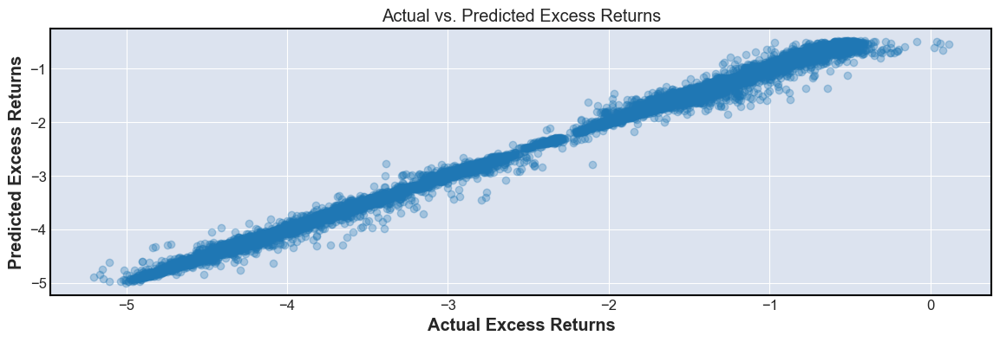

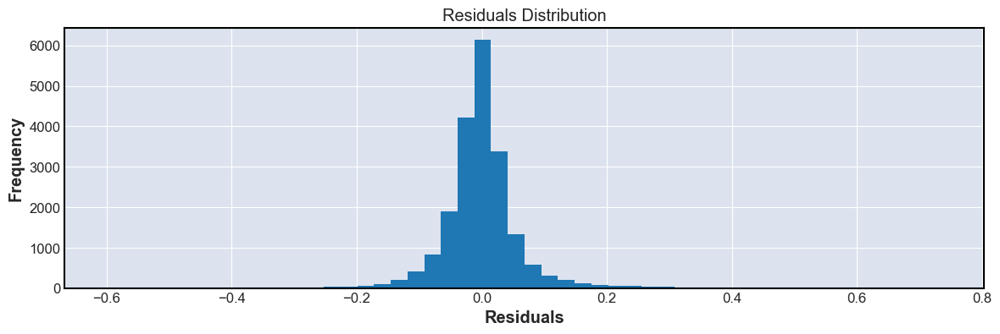

In [ ]:
import matplotlib.pyplot as plt

# Predict on the test set (filtered)
# y_pred_filtered = model_filtered.predict(sm.add_constant(scaler.transform(X_filtered_scaled)))
y_pred_filtered = model_filtered.predict(X_test_filtered_with_const)

# Plot actual vs. predicted returns
plt.figure(figsize=(all_plots_size))
plt.scatter(y_filtered_test, y_pred_filtered, alpha=0.3)
plt.xlabel('Actual Excess Returns')
plt.ylabel('Predicted Excess Returns')
plt.title('Actual vs. Predicted Excess Returns')
plt.show()

# Plot residuals
residuals_filtered = y_filtered_test - y_pred_filtered

plt.figure(figsize=(all_plots_size))
plt.hist(residuals_filtered, bins=50)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Residuals Distribution')
plt.show()


- Display cross-validation results to understand model consistency.

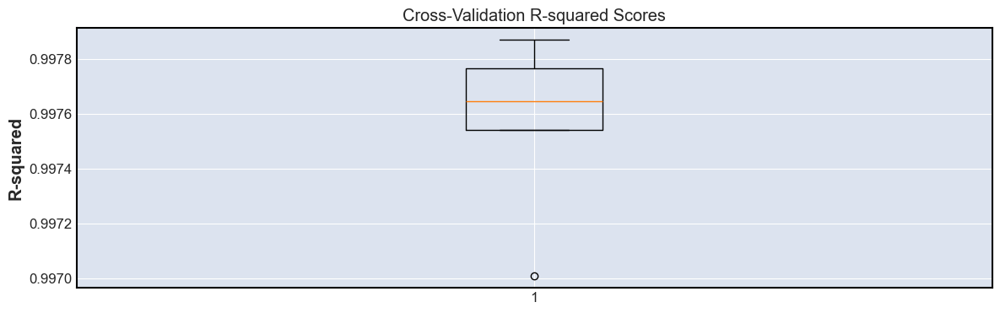

In [ ]:
plt.figure(figsize=(all_plots_size))
plt.boxplot(cross_val_scores)
plt.ylabel('R-squared')
plt.title('Cross-Validation R-squared Scores')
plt.show()


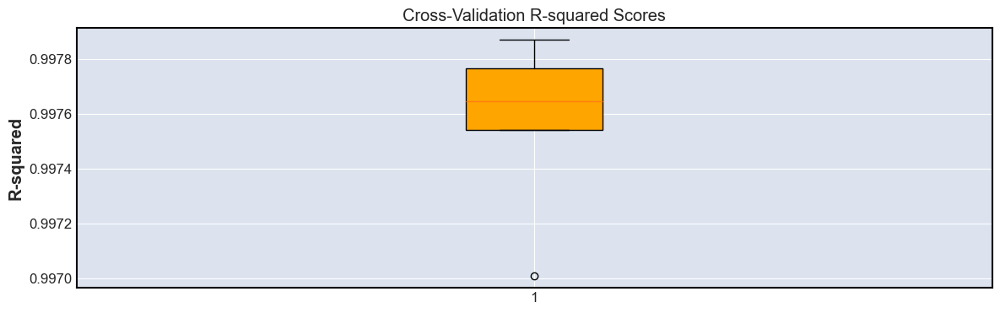

In [ ]:
plt.figure(figsize=(all_plots_size))
plt.boxplot(cross_val_scores, patch_artist=True, boxprops=dict(facecolor='orange'))
plt.ylabel('R-squared')
plt.title('Cross-Validation R-squared Scores')
plt.show()


`Interpretation:` The orange boxplot will gives an idea of the spread and median of cross-validation scores.

- Residuals Distribution Before Filtering:

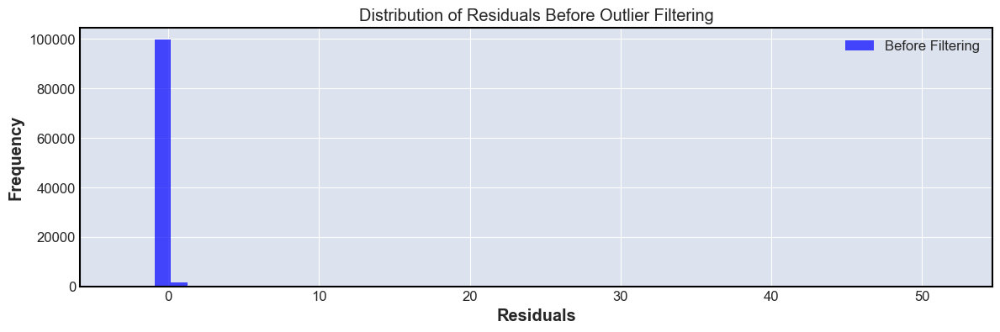

count    1.014280e+05
mean     7.886450e-16
std      2.292140e-01
min     -3.116853e+00
25%     -2.909465e-02
50%     -1.115378e-03
75%      2.369447e-02
max      5.192035e+01
Name: MultiFactor_Residuals, dtype: float64

In [ ]:
plt.figure(figsize=(all_plots_size))
# plt.hist(cleaned_crypto_df['MultiFactor_Residuals'], bins=50)
plt.hist(cleaned_crypto_df['MultiFactor_Residuals'], bins=50, color='blue', alpha=0.7, label='Before Filtering')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals Before Outlier Filtering')
plt.legend()
plt.show()

cleaned_crypto_df['MultiFactor_Residuals'].describe()


- Residuals Distribution After Filtering:

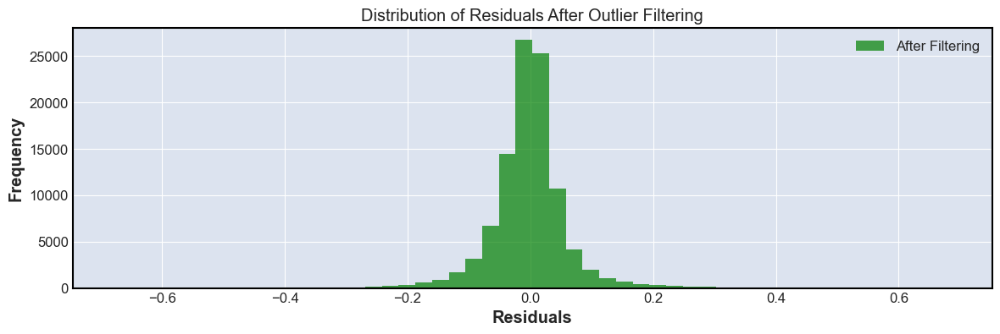

count    101103.000000
mean         -0.002250
std           0.072345
min          -0.677808
25%          -0.029026
50%          -0.001142
75%           0.023562
max           0.684166
Name: MultiFactor_Residuals, dtype: float64

In [ ]:
plt.figure(figsize=(all_plots_size))
plt.hist(filtered_df['MultiFactor_Residuals'], bins=50, color='green', alpha=0.7, label='After Filtering')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals After Outlier Filtering')
plt.legend()
plt.show()

filtered_df['MultiFactor_Residuals'].describe()


- Visualize the performance of the model before outlier filtering

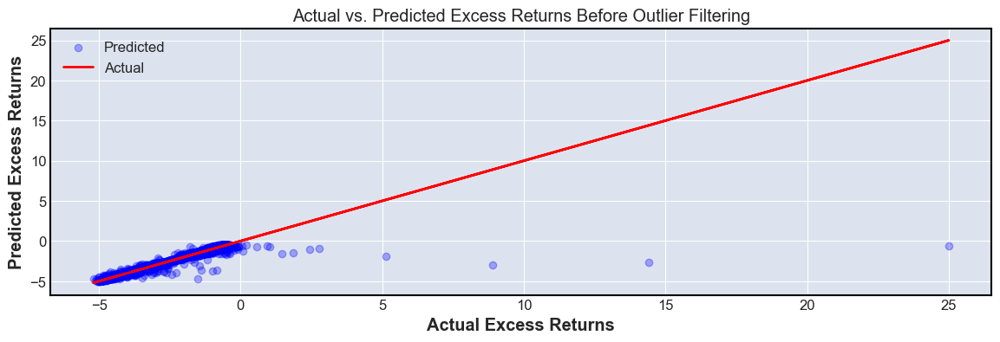

array([-3.85624325, -2.63712087, -3.52949949, ..., -2.83685251,
       -1.38089818, -4.24791964])

In [ ]:
# y_pred_before = model.predict(sm.add_constant(scaler.transform(X_filtered_scaled)))
y_pred_before = model_filtered.predict(X_test_with_const)

plt.figure(figsize=(all_plots_size))

plt.scatter(y_test, y_pred_before, alpha=0.3, color='blue', label='Predicted')
plt.plot(y_test, y_test, color='red', label='Actual')  # Diagonal line

plt.xlabel('Actual Excess Returns')
plt.ylabel('Predicted Excess Returns')
plt.title('Actual vs. Predicted Excess Returns Before Outlier Filtering')
plt.legend()
plt.show()

y_pred_before

- Visualize the performance of the model after outlier filtering

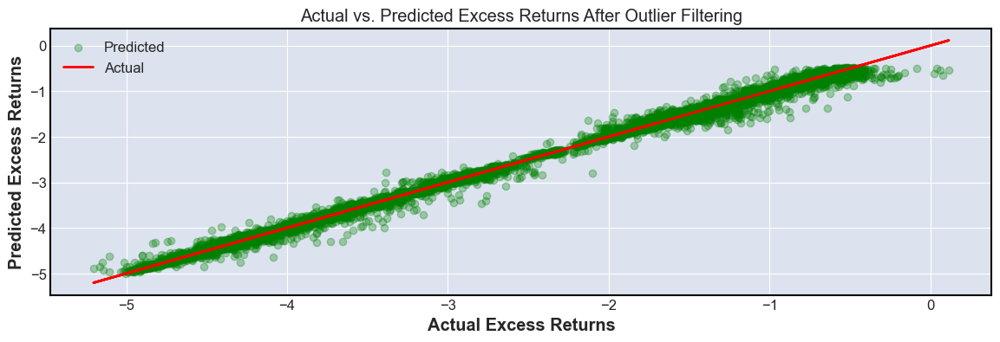

array([-0.92132496, -0.67467161, -3.72528765, ..., -3.48860781,
       -1.05993956, -1.69990191])

In [ ]:
# y_pred_after = model_filtered.predict(sm.add_constant(scaler.transform(X_filtered_scaled)))
y_pred_after = model_filtered.predict(X_test_filtered_with_const)

plt.figure(figsize=(all_plots_size))
plt.scatter(y_filtered_test, y_pred_after, alpha=0.3, color='green', label='Predicted')
plt.plot(y_filtered_test, y_filtered_test, color='red', label='Actual')  # Diagonal line
plt.xlabel('Actual Excess Returns')
plt.ylabel('Predicted Excess Returns')
plt.title('Actual vs. Predicted Excess Returns After Outlier Filtering')
plt.legend()
plt.show()

y_pred_after


- Time Series of Actual vs. Predicted Returns (After Filtering):

In [ ]:
y_filtered_test.size, y_pred_after.size, filtered_df.size, cleaned_crypto_df.size, y_filtered.size,X_filtered.size

(20221, 20221, 4751841, 5958942, 101103, 505515)

In [ ]:
filtered_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Ticker',
       'Active Addresses', 'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score',
       'Risk_Free_Rate', 'Market_Return', 'Excess_Return',
       'Excess_Market_Return', 'Residuals', 'Fitted', 'Beta', 'Beta_Range',
       'Return_1_Month', 'Return_3_Months', 'Return_1_Year', 'Close_lag_1',
       'Close_lag_5', 'Close_lag_10', 'Close_MA_7', 'Close_MA_30',
       'Close_MA_90', 'RSI', 'MACD', 'MACD_Signal', 'MACD_Hist',
       'Close_Volume', 'Close_StdDev_30', 'Volatility', 'Momentum',
       'Bullish_Momentum', 'MultiFactor_Residuals', 'Residuals_ZScore'],
      dtype='object')

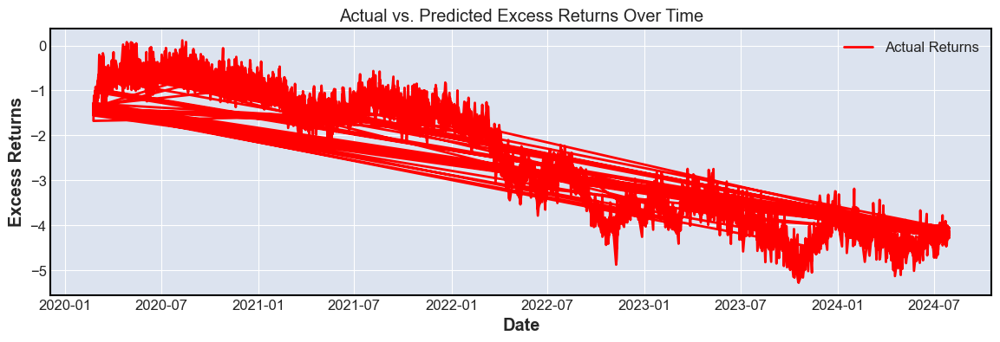

In [ ]:
plt.figure(figsize=(all_plots_size))
plt.plot(filtered_df['Date'], filtered_df['Excess_Return'], color='red', label='Actual Returns')
# plt.plot(filtered_df['Date'], filtered_df['Predicted_Excess_Returns'], color='blue', label='Predicted Returns')
plt.xlabel('Date')
plt.ylabel('Excess Returns')
plt.title('Actual vs. Predicted Excess Returns Over Time')
plt.legend()
plt.show()


- Residuals Over Time:

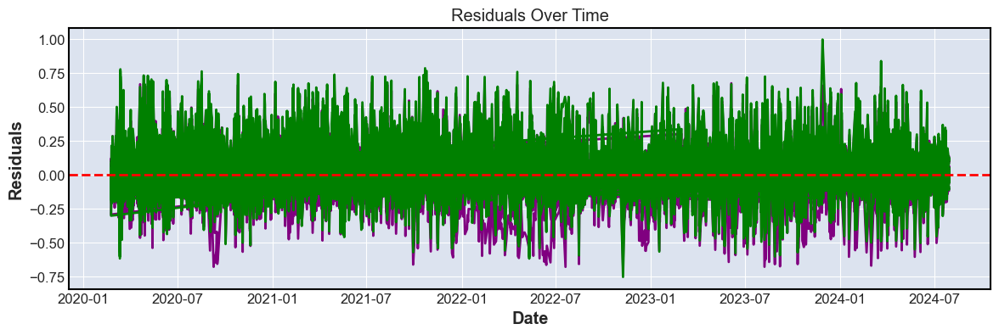

In [ ]:
plt.figure(figsize=(all_plots_size))

plt.plot(filtered_df['Date'], filtered_df['MultiFactor_Residuals'], color='purple')
plt.plot(filtered_df['Date'], filtered_df['Return'], color='green')
# plt.plot(filtered_df['Date'], filtered_df['Excess_Return'], color='blue')
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.title('Residuals Over Time')
plt.show()


- Residuals vs. Predicted Values: Check if there are patterns in the residuals and to ensure they are randomly distributed.

In [ ]:
y_pred_after.size,  residuals_filtered.size

(20221, 20221)

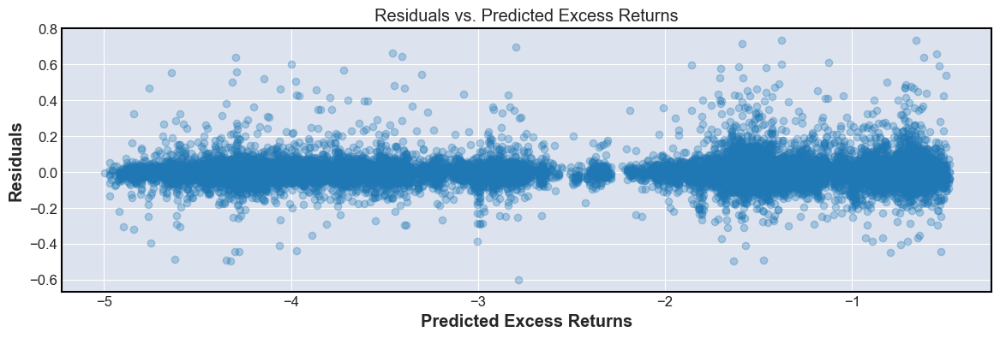

In [ ]:
plt.figure(figsize=(all_plots_size))
plt.scatter(y_pred_after, residuals_filtered, alpha=0.3)
plt.xlabel('Predicted Excess Returns')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Excess Returns')
plt.show()


In [ ]:
cleaned_crypto_df['Date'].describe()

count                           126786
mean     2022-04-23 08:35:38.431687936
min                2020-02-24 00:00:00
25%                2021-03-12 00:00:00
50%                2022-04-13 00:00:00
75%                2023-05-30 00:00:00
max                2024-07-29 00:00:00
Name: Date, dtype: object

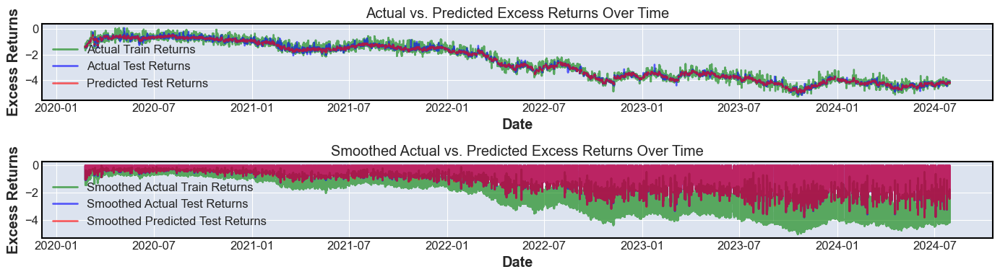

In [ ]:
combined_filtered = plot_actual_vs_predicted_with_ticker_and_smoothing(filtered_df, y_filtered_train, y_filtered_test, y_pred_after, all_plots_size=(all_plots_size), sigma=2)

In [ ]:
X

,Market_Return,Bullish_Momentum,Rolling_Std,Beta,Risk_Free_Rate
369,0.002652,2.0,0.051916,0.742206,1.299
370,-0.014010,1.0,0.051780,0.742206,1.127
373,0.043718,2.0,0.051044,0.742206,1.088
374,-0.017141,1.0,0.050862,0.742206,1.010
375,-0.000934,2.0,0.048369,0.742206,0.992
...,...,...,...,...,...
234183,-0.130205,2.0,0.086026,0.802525,1.109
234184,0.068665,3.0,0.072087,0.802525,1.091
234187,0.000553,4.0,0.064661,0.802525,1.040
234188,0.006151,5.0,0.068425,0.802525,1.040


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtype=object)

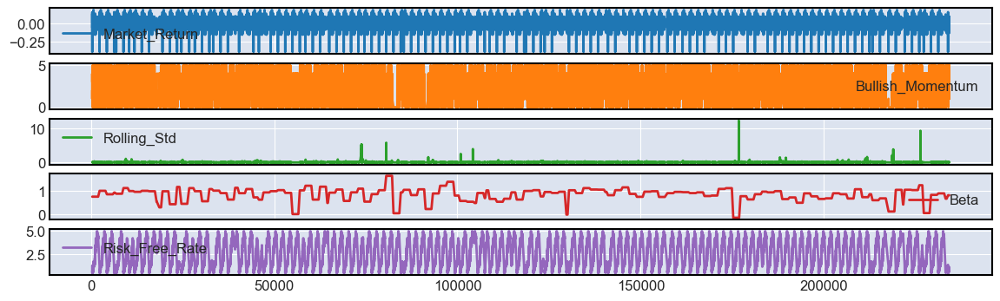

In [ ]:
# plot with smoothed-out trends
X.plot(subplots=True, figsize=(all_plots_size))

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtype=object)

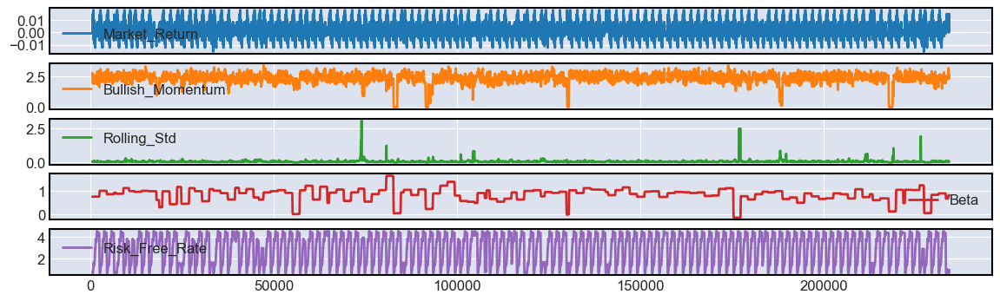

In [ ]:
# plot with smoothed-out trends
X.rolling(72).mean().plot(subplots=True, figsize=(all_plots_size))

<Axes: >

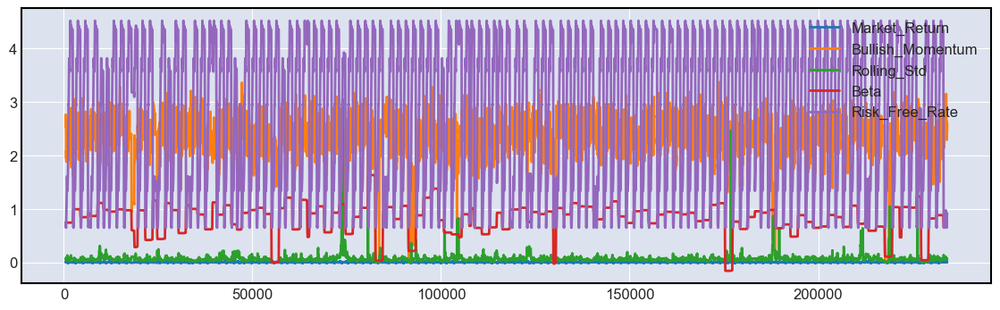

In [ ]:
X.rolling(72).mean().plot(subplots=False, figsize=(all_plots_size))

#### 4.4.5 Multi-Factor Fama French (Adapted) - Feature Selection

In [ ]:
top_10_crypto_df['Ticker'].nunique()

10

In [ ]:
cleaned_crypto_df.isnull().sum()

In [ ]:
# Ensure 'date' is a datetime object
cleaned_crypto_deep_df = cleaned_crypto_df.copy()
cleaned_crypto_deep_df['Date'] = pd.to_datetime(cleaned_crypto_df['Date'])

# Set the date as the index
cleaned_crypto_deep_df.set_index('Date', inplace=True)

# Display the first few rows
# print(cleaned_crypto_deep_df.head())


In [ ]:
cleaned_crypto_deep_df

In [ ]:
btc_cleaned_df = cleaned_crypto_deep_df[cleaned_crypto_deep_df['Ticker'] == 'BTC/USDT']
btc_cleaned_df

In [ ]:
# 'ME', 'YE', 'QE', 'BME', 'BA', 'BQE', and 'W
btc_daily_returns_cleaned = btc_cleaned_df['Return']
btc_monthly_returns_calc = btc_cleaned_df['Close'].resample('BME').ffill().pct_change()
btc_cum_returns = (btc_daily_returns_cleaned + 1).cumprod() #

btc_daily_returns_calc = btc_cleaned_df['Close'].pct_change()

In [ ]:
# >>> d = {'col1': [0, 1, 2, 3], 'col2': pd.Series([2, 3], index=[2, 3])}
# >>> pd.DataFrame(data=d, index=[0, 1, 2, 3])

btc_cleaned_calc = pd.DataFrame(
    data={'calc_daily':btc_daily_returns_calc,
          'cleaned_daily': btc_daily_returns_cleaned, 
          'calc_monthly':btc_monthly_returns_calc,
          'calc_cum':btc_cum_returns,
          })
btc_cleaned_calc

,calc_daily,cleaned_daily,calc_monthly,calc_cum
Date,,,,
2020-02-24,NaN,-0.029000,NaN,0.971000
2020-02-25,-0.035081,-0.035081,NaN,0.936937
2020-02-26,-0.056488,-0.056488,NaN,0.884011
2020-02-27,0.002652,0.002652,NaN,0.886355
2020-02-28,-0.014010,-0.014010,NaN,0.873937
...,...,...,...,...
2024-07-24,-0.008476,-0.008476,NaN,4.256696
2024-07-25,0.006455,0.006455,NaN,4.284173
2024-07-26,0.032066,0.032066,NaN,4.421548


<Axes: xlabel='Date'>

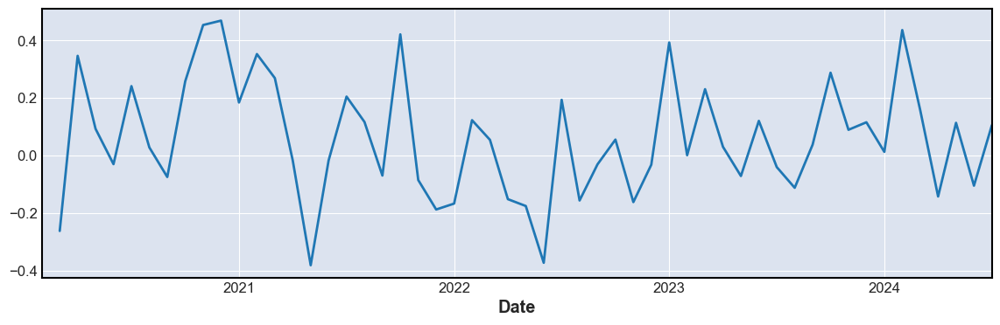

In [ ]:
btc_monthly_returns_calc.plot(figsize=(all_plots_size))

<Axes: xlabel='Date'>

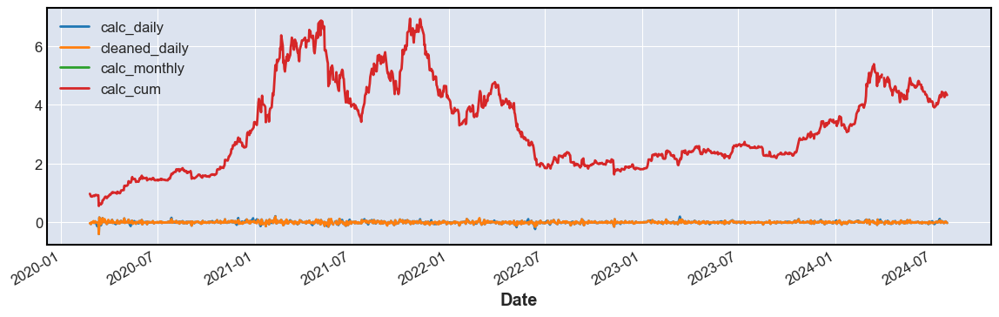

In [ ]:
btc_cleaned_calc.plot(figsize=(all_plots_size))

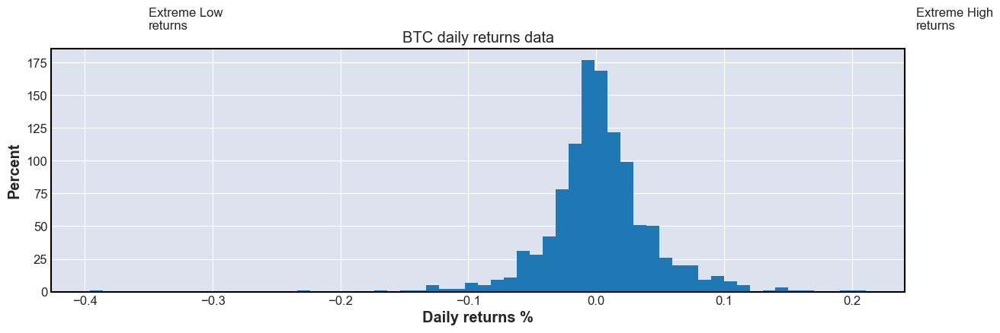

In [ ]:
fig = plt.figure(figsize=(all_plots_size))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8])
btc_daily_returns_calc.plot.hist(bins = 60)
ax1.set_xlabel("Daily returns %")
ax1.set_ylabel("Percent")
ax1.set_title("BTC daily returns data")
ax1.text(-0.35,200,"Extreme Low\nreturns")
ax1.text(0.25,200,"Extreme High\nreturns")
plt.show()

<Axes: title={'center': 'BTC Daily Returns (Cleaned)'}, ylabel='Density'>

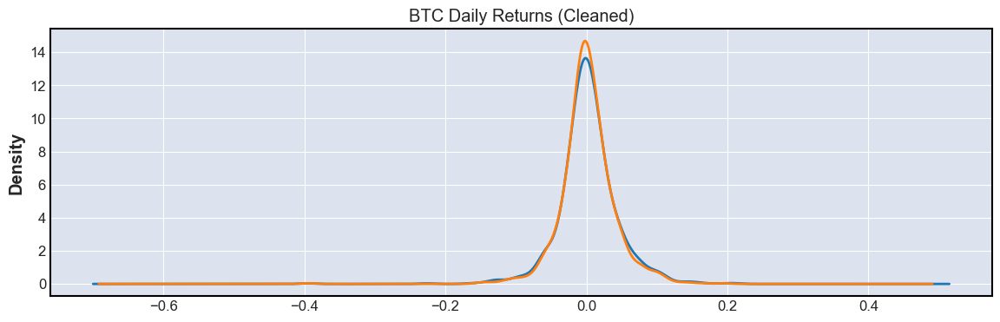

In [ ]:
btc_daily_returns_calc.plot(
    kind='kde',
    title='BTC Daily Returns (Calculated)',
    ylabel='Price (Fraction)',
    figsize=(all_plots_size), 
    # subplots=True
    )

btc_daily_returns_cleaned.plot(
    kind='kde',
    title='BTC Daily Returns (Cleaned)',
    ylabel='Price (Fraction)',
    figsize=(all_plots_size), 
    # subplots=True
    )

<Axes: title={'center': 'BTC Daily Returns (Rolling Window - 72)'}, xlabel='Date', ylabel='Price (Fraction)'>

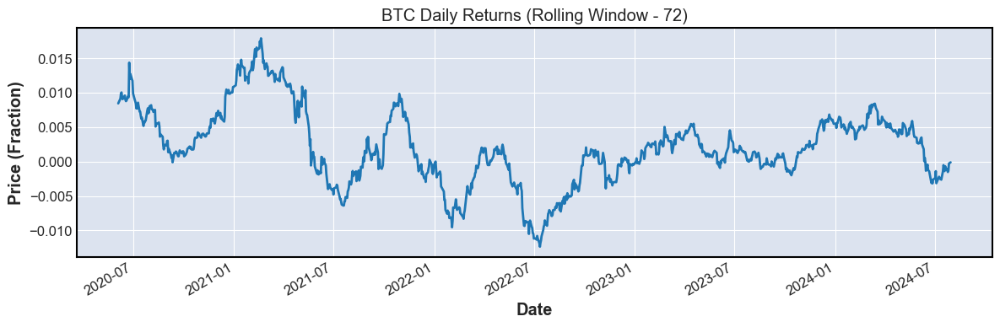

In [ ]:
btc_daily_returns_cleaned.rolling(72).mean().plot(
    subplots=False,
    figsize=(all_plots_size),
    title='BTC Daily Returns (Rolling Window - 72)',
    ylabel='Price (Fraction)',
    )

<Axes: title={'center': 'BTC Daily Cumulative Returns'}, xlabel='Date', ylabel='Growth of $1 investment'>

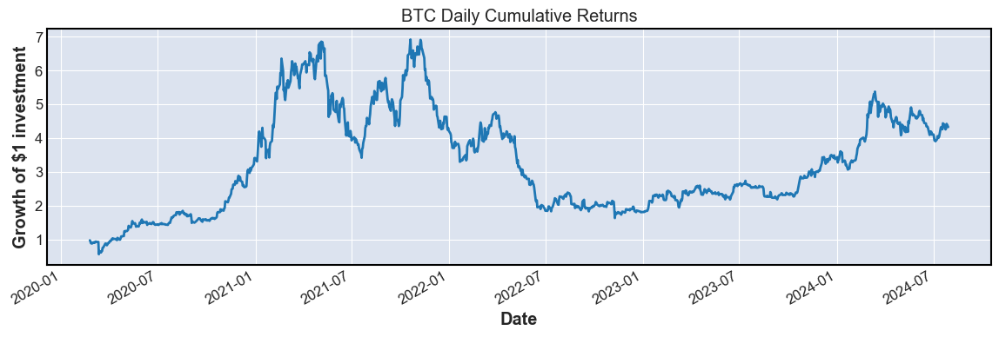

In [ ]:
btc_cum_returns.plot(
    kind='line',
    title='BTC Daily Cumulative Returns',
    ylabel='Growth of $1 investment',
    figsize=(all_plots_size), 
    # subplots=True
    )

In [ ]:
cleaned_crypto_deep_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,...,MACD,MACD_Signal,MACD_Hist,Close_Volume,Close_StdDev_30,Volatility,Momentum,Bullish_Momentum,MultiFactor_Residuals,Residuals_ZScore
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-27,0.1192,0.1256,0.1107,0.1233,3227522.78,ABT/USDT,33,50,0,8572.831187,...,NaN,NaN,NaN,397953.558774,NaN,0.125000,True,2.0,NaN,NaN
2020-02-28,0.1233,0.1251,0.1121,0.1184,2366736.61,ABT/USDT,36,40,0,17113.188780,...,NaN,NaN,NaN,280221.614624,NaN,0.105434,False,1.0,-0.00375,-0.016362


In [ ]:
cleaned_crypto_deep_df[['Momentum','Bullish_Momentum']]

,Momentum,Bullish_Momentum
Date,,
2020-02-27,True,2.0
2020-02-28,False,1.0
2020-03-02,True,2.0
2020-03-03,False,1.0
2020-03-04,True,2.0
...,...,...
2021-01-21,False,2.0
2021-01-22,True,3.0
2021-01-25,True,4.0


In [ ]:
cleaned_crypto_deep_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 126786 entries, 2020-02-27 to 2021-01-27
Data columns (total 46 columns):
 #   Column                     Non-Null Count   Dtype   
---  ------                     --------------   -----   
 0   Open                       126786 non-null  float64 
 1   High                       126786 non-null  float64 
 2   Low                        126786 non-null  float64 
 3   Close                      126786 non-null  float64 
 4   Volume                     126786 non-null  float64 
 5   Ticker                     126786 non-null  object  
 6   Active Addresses           126786 non-null  int64   
 7   Transaction Count          126786 non-null  int64   
 8   Large Transaction Count    126786 non-null  int64   
 9   Average Transaction Value  126786 non-null  float64 
 10  Hashrate                   126786 non-null  float64 
 11  Difficulty                 126786 non-null  float64 
 12  Current Supply             126786 non-null  float64 
 13

- Step 1: Identify Key Factors

Use statistical methods like correlation analysis, PCA (Principal Component Analysis), or feature importance from machine learning models (e.g., Random Forest, XGBoost) to determine the most influential factors

- Step 2: Factor Selection Code

In [ ]:
cleaned_crypto_deep_df.index.min(), cleaned_crypto_deep_df.index.max()

(Timestamp('2020-02-24 00:00:00'), Timestamp('2024-07-29 00:00:00'))

In [ ]:
# Select numerical columns
categorical_cols = cleaned_crypto_deep_df.select_dtypes(include=['object']).columns
categorical_cols

Index(['Ticker'], dtype='object')

In [ ]:
# Select numerical columns
numerical_cols = cleaned_crypto_deep_df.select_dtypes(include=['number']).columns
numerical_cols

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Active Addresses',
       'Transaction Count', 'Large Transaction Count',
       'Average Transaction Value', 'Hashrate', 'Difficulty', 'Current Supply',
       'Market Cap', 'Return', 'Rolling_Mean', 'Rolling_Std', 'Z_Score',
       'Risk_Free_Rate', 'Market_Return', 'Excess_Return',
       'Excess_Market_Return', 'Residuals', 'Fitted', 'Beta', 'Return_1_Month',
       'Return_3_Months', 'Return_1_Year', 'Close_lag_1', 'Close_lag_5',
       'Close_lag_10', 'Close_MA_7', 'Close_MA_30', 'Close_MA_90', 'RSI',
       'MACD', 'MACD_Signal', 'MACD_Hist', 'Close_Volume', 'Close_StdDev_30',
       'Volatility', 'Bullish_Momentum', 'MultiFactor_Residuals',
       'Residuals_ZScore'],
      dtype='object')

In [ ]:
selected_features = [
    'Close',  # Reflects the final price at the end of the day
    'Volume',  # Indicates liquidity and market activity
    'Market Cap',  # Represents the overall value of the cryptocurrency
    'Return',  # Important for return-based models
    'Rolling_Mean',  # Helps to smooth out price data
    'Rolling_Std',  # Measures volatility
    'Risk_Free_Rate',  # Required for calculating excess returns
    'Market_Return',  # Represents overall market movement
    'Excess_Return',  # Calculated returns over the risk-free rate
    'Beta',  # Indicates sensitivity to market movements
    'Volatility',  # Measures risk or price fluctuations
    'Bullish_Momentum',  # Indicates positive momentum
    # Blockchain-specific features:
    'Active Addresses',  # Proxy for network activity and adoption
    'Transaction Count',  # Measures the number of transactions
    'Hashrate',  # Reflects the security of the blockchain network
    'Average Transaction Value'  # Shows the average size of transactions
]


In [ ]:
# Dropping non-numeric columns for factor importance analysis
# cleaned_crypto_deep_df = cleaned_crypto_deep_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Market_Return'])
# numeric_df = cleaned_crypto_deep_df[selected_features]
# numeric_df.head(2)


In [ ]:
# Select the top n features
# top_features = feature_importance.head(n_top_features)

In [ ]:
import pandas as pd
import numpy as np

# Ensure date column is in datetime format
cleaned_crypto_deep_df.index = pd.to_datetime(cleaned_crypto_deep_df.index)

# Define window length for rolling calculations
window_length = 20  # Example: 20-day rolling window

# 1. Price-Based Features
cleaned_crypto_deep_df['Price_Range'] = cleaned_crypto_deep_df['High'] - cleaned_crypto_deep_df['Low']
cleaned_crypto_deep_df['Price_Change'] = cleaned_crypto_deep_df['Close'] - cleaned_crypto_deep_df['Open']
cleaned_crypto_deep_df['Price_Momentum'] = cleaned_crypto_deep_df['Close'] / cleaned_crypto_deep_df['Close'].shift(window_length)

# 2. Volume-Based Features
cleaned_crypto_deep_df['Volume_Change'] = cleaned_crypto_deep_df['Volume'] / cleaned_crypto_deep_df['Volume'].shift(window_length)
cleaned_crypto_deep_df['Volume_to_Market_Cap_Ratio'] = cleaned_crypto_deep_df['Volume'] / cleaned_crypto_deep_df['Market Cap']

# 3. Blockchain Activity-Based Features
cleaned_crypto_deep_df['Transaction_Rate'] = cleaned_crypto_deep_df['Transaction Count'] / cleaned_crypto_deep_df['Active Addresses']
cleaned_crypto_deep_df['Large_Transaction_Ratio'] = cleaned_crypto_deep_df['Large Transaction Count'] / cleaned_crypto_deep_df['Transaction Count']
cleaned_crypto_deep_df['Average_Transaction_Value_Change'] = cleaned_crypto_deep_df['Average Transaction Value'] / cleaned_crypto_deep_df['Average Transaction Value'].shift(window_length)
cleaned_crypto_deep_df['Hashrate_to_Difficulty_Ratio'] = cleaned_crypto_deep_df['Hashrate'] / cleaned_crypto_deep_df['Difficulty']

# 4. Volatility and Risk Features
cleaned_crypto_deep_df['Rolling_Volatility'] = cleaned_crypto_deep_df['Return'].rolling(window=window_length).std()
cleaned_crypto_deep_df['Volatility_Change'] = cleaned_crypto_deep_df['Volatility'] / cleaned_crypto_deep_df['Volatility'].shift(window_length)
cleaned_crypto_deep_df['Beta_Change'] = cleaned_crypto_deep_df['Beta'].diff()

# 5. Momentum-Based Features
cleaned_crypto_deep_df['Momentum_Score'] = cleaned_crypto_deep_df['Close'] - cleaned_crypto_deep_df['Rolling_Mean']
cleaned_crypto_deep_df['Bullish_Momentum_Ratio'] = cleaned_crypto_deep_df['Bullish_Momentum'].rolling(window=window_length).mean()

# 6. Market Efficiency Features
cleaned_crypto_deep_df['Excess_Return_to_Volatility_Ratio'] = cleaned_crypto_deep_df['Excess_Return'] / cleaned_crypto_deep_df['Volatility']
cleaned_crypto_deep_df['Market_Cap_to_Transaction_Value_Ratio'] = cleaned_crypto_deep_df['Market Cap'] / cleaned_crypto_deep_df['Average Transaction Value']

# 7. Interaction Terms
cleaned_crypto_deep_df['Market_Interaction'] = cleaned_crypto_deep_df['Market_Return'] * cleaned_crypto_deep_df['Volatility']
cleaned_crypto_deep_df['Blockchain_Interaction'] = cleaned_crypto_deep_df['Transaction Count'] * cleaned_crypto_deep_df['Hashrate']

# Drop rows with NaN values resulting from shifting and rolling operations
cleaned_crypto_deep_df = cleaned_crypto_deep_df.dropna()


In [ ]:
cleaned_crypto_deep_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,...,Hashrate_to_Difficulty_Ratio,Rolling_Volatility,Volatility_Change,Beta_Change,Momentum_Score,Bullish_Momentum_Ratio,Excess_Return_to_Volatility_Ratio,Market_Cap_to_Transaction_Value_Ratio,Market_Interaction,Blockchain_Interaction
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,402.10,407.68,369.35,378.62,4.937616e+08,BCH/USDT,58696,42748,467,34.346192,...,0.000007,0.019570,27.878097,0.740399,378.618654,2.3,-15.057962,2.016953e+08,-0.002764,1.744609e+11
2020-02-25,378.62,379.50,346.24,353.19,5.972372e+08,BCH/USDT,73992,40657,485,40.277993,...,0.000007,0.023479,4.947079,0.000000,353.200452,2.2,-15.904829,1.604544e+08,-0.003082,1.605639e+11


In [ ]:
# Define the feature groups
price_based_features = ['Price_Range', 'Price_Change', 'Price_Momentum']
volume_based_features = ['Volume_Change', 'Volume_to_Market_Cap_Ratio','Volume']
interaction_terms = ['Market_Interaction', 'Blockchain_Interaction']
blockchain_activity_features = ['Large_Transaction_Ratio', 'Average_Transaction_Value_Change', 'Hashrate_to_Difficulty_Ratio', 'Difficulty']
supply_market_features = ['Current Supply', 'Market Cap']
return_based_features = ['Return', 'Return_1_Month', 'Return_3_Months', 'Return_1_Year']
risk_volatility_features = ['Rolling_Mean', 'Rolling_Std', 'Volatility', 'Rolling_Volatility','Volatility_Change','Beta_Change']
market_effciency_features = ['Excess_Return_to_Volatility_Ratio', 'Market_Cap_to_Transaction_Value_Ratio']
momentum_features = ['Bullish_Momentum','Momentum_Score','Bullish_Momentum_Ratio'] # Add derived Momentum feature later

# Combine all groups
all_feature_groups = price_based_features + volume_based_features + market_effciency_features + interaction_terms + blockchain_activity_features + supply_market_features + return_based_features + risk_volatility_features + momentum_features

# Select these columns from the dataset
grouped_features_df = cleaned_crypto_deep_df[all_feature_groups]

# Display the first few rows of the selected features
grouped_features_df

In [ ]:
grouped_features_df['Hashrate_to_Difficulty_Ratio'].describe()

In [ ]:
cleaned_crypto_deep_df

In [ ]:
from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

def perform_elasticnet_feature_selection(features_df, target_series, alphas=[1.0], l1_ratios=[0.5], test_size=0.3, random_state=42):
    """
    Perform ElasticNet regularization for feature selection with cross-validation.

    Parameters:
    - features_df: DataFrame containing feature variables.
    - target_series: Series containing target variable.
    - alphas: List of alpha values to test for regularization strength.
    - l1_ratios: List of l1_ratio values to test for the mix between L1 and L2 regularization.
    - test_size: Proportion of the dataset to include in the test split.
    - random_state: Seed used by the random number generator.

    Returns:
    - importance_df: DataFrame containing feature names and their coefficients.
    - mse: Mean squared error of the model on the test set.
    - best_params: Dictionary containing the best alpha and l1_ratio.
    """
    
    # Ensure indices are aligned and drop rows with NaN values
    common_index = features_df.index.intersection(target_series.index)
    features_df = features_df.loc[common_index]
    target_series = target_series.loc[common_index]
    
    # Check if lengths match
    if len(features_df) != len(target_series):
        raise ValueError(f"Feature and target series have mismatched lengths: {len(features_df)} vs {len(target_series)}")
    
    # Check for infinity and large values
    if np.isinf(features_df).values.any():
        # Replace or remove infinite values
        features_df.replace([np.inf, -np.inf], np.nan, inplace=True)
        # raise ValueError("Features contain infinite values.")
    
    # Drop rows with NaN values
    features_df.fillna(0,inplace=True)
    # target_series = target_series[features_df.index]  # Align target with cleaned features

    # Ensure features_df and target_series have the same indices and lengths
    if len(features_df) != len(target_series):
        raise ValueError(f"After cleaning, feature and target series lengths do not match: {len(features_df)} vs {len(target_series)}")
    
    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(features_df)
    
    # Check consistency of X_scaled and target_series
    assert X_scaled.shape[0] == len(target_series), "Mismatch between number of samples in features and target."
    
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, target_series, test_size=test_size, random_state=random_state)
    
    # Define ElasticNet with cross-validation
    model = ElasticNetCV(alphas=alphas, l1_ratio=l1_ratios, cv=5, random_state=random_state)
    
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predict and evaluate
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    
    # Get feature importance
    feature_names = features_df.columns
    coef = model.coef_
    
    # Create a DataFrame for feature importance
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coef
    }).sort_values(by='Coefficient', ascending=False)
    
    # Return best parameters
    best_params = {
        'alpha': model.alpha_,
        'l1_ratio': model.l1_ratio_
    }
    
    return importance_df, mse, best_params

# Example usage:
features = grouped_features_df
target = cleaned_crypto_deep_df['Return']  # Replace with your target variable
importance_df, mse, best_params = perform_elasticnet_feature_selection(features, target)
print("Mean Squared Error:", mse)
print("Best Parameters:", best_params)
print(importance_df)


Mean Squared Error: 0.004506494196033027
Best Parameters: {'alpha': 1.0, 'l1_ratio': 0.5}
                                  Feature  Coefficient
0                             Price_Range         -0.0
15                             Market Cap         -0.0
27                         Momentum_Score         -0.0
26                       Bullish_Momentum          0.0
25                            Beta_Change         -0.0
24                      Volatility_Change          0.0
23                     Rolling_Volatility          0.0
22                             Volatility          0.0
21                            Rolling_Std          0.0
20                           Rolling_Mean          0.0
19                          Return_1_Year          0.0
18                        Return_3_Months          0.0
17                         Return_1_Month          0.0
16                                 Return          0.0
14                         Current Supply          0.0
1                            P

In [ ]:
features = grouped_features_df
target = cleaned_crypto_deep_df['Return']  # Replace with your target variable
importance_df, mse = perform_elasticnet_feature_selection(features, target)
print("Mean Squared Error:", mse)
print(importance_df)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def correlation_analysis(features_df, target_series):
    # Correlation between features and target
    corr_with_target = features_df.corrwith(target_series)
    
    # Correlation matrix within features
    corr_matrix_features = features_df.corr()
    
    # Plotting correlation with target
    plt.figure(figsize=(10, 8))
    sns.barplot(x=corr_with_target.values, y=corr_with_target.index)
    plt.title('Correlation with Target (Return)')
    plt.show()

    # Plotting heatmap for correlation within features
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix_features, annot=False, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Matrix of Features')
    plt.show()
    
    return corr_with_target, corr_matrix_features

# Run the correlation analysis function
corr_with_target, corr_matrix_features = correlation_analysis(features, target)


In [ ]:
print('corr_with_target:')
corr_with_target

In [ ]:
print('corr_matrix_features:')
corr_matrix_features

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_50358/1359935672.py:22: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_50358/1359935672.py:44: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




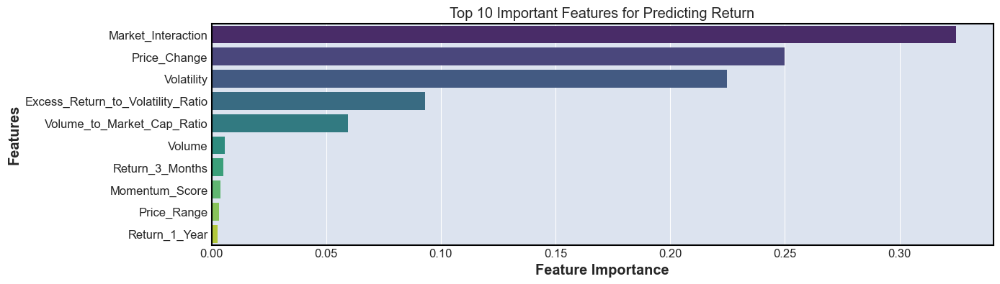

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

def plot_top_features(data, target_column, n_top_features=10):
    """
    Plots the top n features according to their importance.

    Parameters:
    - data: DataFrame containing the dataset.
    - target_column: The name of the column to predict (target variable).
    - n_top_features: The number of top features to display (default is 10).
    """
    # Prepare the data by dropping non-numeric columns and the target column
    numeric_df = data.drop(columns=[target_column]).fillna(0)
    
    numeric_df = numeric_df.replace([np.inf, -np.inf], np.nan)
    
    # Fill missing values
    numeric_df.fillna(method='ffill', inplace=True)
    
    # Separate features (X) and target (y)
    X = numeric_df
    y = data[target_column]
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Fit Random Forest to find feature importance
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_scaled, y)
    
    # Get feature importance and create a DataFrame
    feature_importance = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
    
    # Select the top n features
    top_features = feature_importance.head(n_top_features)
    
    # Plot the top features
    plt.figure(figsize=(all_plots_size))
    sns.barplot(x=top_features.values, y=top_features.index, palette="viridis")
    plt.title(f"Top {n_top_features} Important Features for Predicting {target_column}")
    plt.xlabel('Feature Importance')
    plt.ylabel('Features')
    plt.show()

# Example usage:
# plot_top_features(cleaned_crypto_deep_df, target_column='Market_Return', n_top_features=10)
plot_top_features(grouped_features_df, target_column='Return', n_top_features=10)


In [ ]:
# Calculate the correlation matrix
corr_matrix = grouped_features_df.corr().abs()


In [ ]:


# Select the upper triangle of the correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.8
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

# Drop features with high correlation
grouped_features_df = grouped_features_df.drop(columns=to_drop)

print("Dropped features due to high multicollinearity:", to_drop)


Dropped features due to high multicollinearity: ['Blockchain_Interaction', 'Current Supply', 'Market Cap', 'Rolling_Volatility', 'Momentum_Score']


In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# Step 1: Remove Features with High Multicollinearity
def remove_multicollinearity(df, threshold=0.8):
    
    df = df.replace([np.inf, -np.inf], np.nan)
    
    # Fill missing values
    df.fillna(method='ffill', inplace=True)
    
    # Calculate the correlation matrix
    corr_matrix = df.corr().abs()
    
    # Select the upper triangle of the correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # Find features with correlation greater than the threshold
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    
    # Drop features with high correlation
    df = df.drop(columns=to_drop)
    
    print("Dropped features due to high multicollinearity:", to_drop)
    return df, to_drop

# Step 2: Handle Missing Values
def handle_missing_values(df, threshold=0.3):
    # Check for missing values
    missing_values = df.isnull().sum()
    
    # List features with missing values
    features_with_missing = missing_values[missing_values > 0].index.tolist()
    print("Features with missing values:", features_with_missing)
    
    # Drop features with missing values above the threshold
    to_drop = [col for col in df.columns if df[col].isnull().mean() > threshold]
    # df = df.drop(columns=to_drop)
    # numeric_df = numeric_df.replace([np.inf, -np.inf], np.nan)
    
    # Fill missing values
    # df.fillna(method='ffill', inplace=True)
    df.fillna(0,inplace=True)
    
    print("Dropped features due to high missing values:", to_drop)
    return df, to_drop

# Step 3: Evaluate Feature Importance using Tree-Based Models
def evaluate_feature_importance(df, target_column='Return'):
    # Define target variable and features
    X = df.drop(columns=[target_column])
    y = df[target_column]
    
    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X, y)
    
    # Get feature importances
    feature_importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
    
    print("Feature importances:\n", feature_importances)
    return feature_importances

# Step 4: Recursive Feature Elimination (RFE)
def perform_rfe(df, target_column='Return', n_features_to_select=10):
    # df = numeric_df.replace([np.inf, -np.inf], np.nan)
    
    # Fill missing values
    df.fillna(method='ffill', inplace=True)
    
    # Define target variable and features
    X = df.drop(columns=[target_column])
    y = df[target_column]
    
    # Create a linear regression model
    lr_model = LinearRegression()
    
    # Initialize RFE
    rfe = RFE(estimator=lr_model, n_features_to_select=n_features_to_select)
    
    # Fit RFE
    rfe.fit(X, y)
    
    # Get selected features
    selected_features = X.columns[rfe.support_].tolist()
    
    print("Selected features after RFE:", selected_features)
    
    # Update the DataFrame to only include selected features
    df = df[selected_features + [target_column]]
    return df, selected_features

# Step 5: Cross-Validation
def perform_cross_validation(df, selected_features, target_column='Return', model=None):
    if model is None:
        model = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Define target variable and features
    X = df[selected_features]
    y = df[target_column]
    
    # Perform cross-validation
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
    
    print("Cross-validation scores:", cv_scores)
    print("Mean cross-validation score:", np.mean(cv_scores))
    return cv_scores

# Step 6: Finalize the Feature List
def finalize_features(selected_features):
    print("Final list of features for the model:", selected_features)
    return selected_features

# Wrapper function to perform the entire process
def feature_selection_pipeline(df, target_column='Return', multicollinearity_threshold=0.8, missing_value_threshold=0.3, n_features_to_select=10):
    # Step 1: Remove Features with High Multicollinearity
    df, dropped_multicollinearity = remove_multicollinearity(df, threshold=multicollinearity_threshold)
    
    # Step 2: Handle Missing Values
    df, dropped_missing = handle_missing_values(df, threshold=missing_value_threshold)
    
    # Step 3: Evaluate Feature Importance using Tree-Based Models
    feature_importances = evaluate_feature_importance(df, target_column=target_column)
    
    # Step 4: Perform RFE
    df, selected_features = perform_rfe(df, target_column=target_column, n_features_to_select=n_features_to_select)
    
    # Step 5: Cross-Validation
    cv_scores = perform_cross_validation(df, selected_features, target_column=target_column)
    
    # Step 6: Finalize the Feature List
    final_features = finalize_features(selected_features)
    
    return df, final_features,feature_importances, selected_features, cv_scores


grouped_features_df, final_features, feature_importances, selected_features, cv_scores = feature_selection_pipeline(grouped_features_df)


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_50358/3789950721.py:14: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Dropped features due to high multicollinearity: []
Features with missing values: []
Dropped features due to high missing values: []
Feature importances:
 Market_Interaction              0.533588
Volatility                      0.286445
Volume_to_Market_Cap_Ratio      0.095064
Rolling_Mean                    0.022683
Rolling_Std                     0.016133
Bullish_Momentum                0.014041
Large_Transaction_Ratio         0.011614
Hashrate_to_Difficulty_Ratio    0.010392
Bullish_Momentum_Ratio          0.010039
Beta_Change                     0.000001
dtype: float64
Selected features after RFE: ['Volume_to_Market_Cap_Ratio', 'Market_Interaction', 'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio', 'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change', 'Bullish_Momentum', 'Bullish_Momentum_Ratio']


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_50358/3789950721.py:73: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Cross-validation scores: [-0.00052579 -0.0005558  -0.0201756  -0.00073116 -0.0007121 ]
Mean cross-validation score: -0.00454008838459936
Final list of features for the model: ['Volume_to_Market_Cap_Ratio', 'Market_Interaction', 'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio', 'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change', 'Bullish_Momentum', 'Bullish_Momentum_Ratio']


In [ ]:
print(final_features)

['Volume_to_Market_Cap_Ratio', 'Market_Interaction', 'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio', 'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change', 'Bullish_Momentum', 'Bullish_Momentum_Ratio']


In [ ]:
feature_importances

Market_Interaction              0.533588
Volatility                      0.286445
Volume_to_Market_Cap_Ratio      0.095064
Rolling_Mean                    0.022683
Rolling_Std                     0.016133
Bullish_Momentum                0.014041
Large_Transaction_Ratio         0.011614
Hashrate_to_Difficulty_Ratio    0.010392
Bullish_Momentum_Ratio          0.010039
Beta_Change                     0.000001
dtype: float64

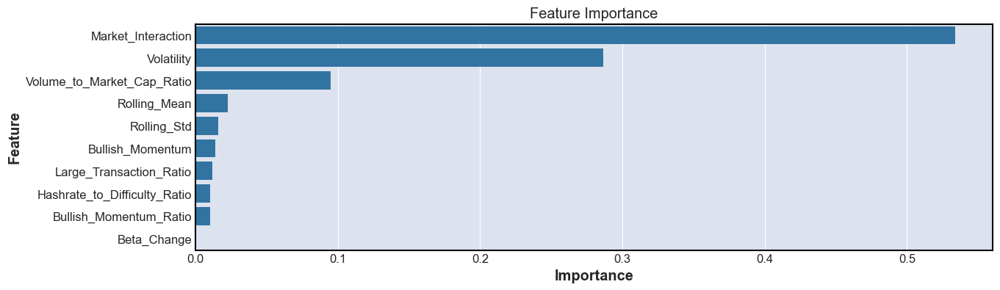

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importance(importances):
    # Convert the series to a DataFrame
    feature_importance_df = importances.reset_index()
    feature_importance_df.columns = ['Feature', 'Importance']
    
    # Sort by importance
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
    
    # Plot the feature importance
    plt.figure(figsize=(all_plots_size))
    sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
    plt.title('Feature Importance')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()

plot_feature_importance(feature_importances)


In [ ]:
cleaned_crypto_deep_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,...,Hashrate_to_Difficulty_Ratio,Rolling_Volatility,Volatility_Change,Beta_Change,Momentum_Score,Bullish_Momentum_Ratio,Excess_Return_to_Volatility_Ratio,Market_Cap_to_Transaction_Value_Ratio,Market_Interaction,Blockchain_Interaction
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,402.10,407.68,369.35,378.62,4.937616e+08,BCH/USDT,58696,42748,467,34.346192,...,0.000007,0.019570,27.878097,0.740399,378.618654,2.3,-15.057962,2.016953e+08,-0.002764,1.744609e+11
2020-02-25,378.62,379.50,346.24,353.19,5.972372e+08,BCH/USDT,73992,40657,485,40.277993,...,0.000007,0.023479,4.947079,0.000000,353.200452,2.2,-15.904829,1.604544e+08,-0.003082,1.605639e+11


In [ ]:
grouped_features_df.head(2)

,Price_Range,Price_Change,Price_Momentum,Volume_Change,Volume_to_Market_Cap_Ratio,Volume,Excess_Return_to_Volatility_Ratio,Market_Cap_to_Transaction_Value_Ratio,Market_Interaction,Blockchain_Interaction,...,Return_1_Year,Rolling_Mean,Rolling_Std,Volatility,Rolling_Volatility,Volatility_Change,Beta_Change,Bullish_Momentum,Momentum_Score,Bullish_Momentum_Ratio
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,38.33,-23.48,1.179502e+06,36776.000887,0.071276,4.937616e+08,-15.057962,2.016953e+08,-0.002764,1.744609e+11,...,1.984315,0.001346,0.059502,0.095325,0.019570,27.878097,0.740399,2.0,378.618654,2.3
2020-02-25,33.26,-25.43,1.095163e+06,43363.090657,0.092412,5.972372e+08,-15.904829,1.604544e+08,-0.003082,1.605639e+11,...,1.645618,-0.010452,0.046532,0.087845,0.023479,4.947079,0.000000,1.0,353.200452,2.2


#### 4.4.6 Multi-Factor Fama French (Adapted) - Modeling

- Test for Stationarity

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller

def test_stationarity(series):
    """
    Perform the Augmented Dickey-Fuller test for stationarity.
    Returns the ADF statistic and p-value.
    """
    result = adfuller(series.dropna(), autolag='AIC')
    adf_statistic = result[0]
    p_value = result[1]
    return adf_statistic, p_value

def print_adf_results(series_name, adf_statistic, p_value):
    """
    Print the results of the ADF test.
    """
    print(f'ADF Statistic for {series_name}: {adf_statistic:.4f}')
    print(f'p-value for {series_name}: {p_value:.4f}')
    if p_value < 0.05:
        print(f'The series {series_name} is likely stationary.')
    else:
        print(f'The series {series_name} is likely non-stationary.')

# Example usage with a feature from the DataFrame:
features_to_test = ['Volume_to_Market_Cap_Ratio', 'Market_Interaction', 'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio', 'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change', 'Bullish_Momentum', 'Bullish_Momentum_Ratio']

for feature in features_to_test:
    adf_statistic, p_value = test_stationarity(grouped_features_df[feature])
    print_adf_results(feature, adf_statistic, p_value)


ADF Statistic for Volume_to_Market_Cap_Ratio: -9.7821
p-value for Volume_to_Market_Cap_Ratio: 0.0000
The series Volume_to_Market_Cap_Ratio is likely stationary.
ADF Statistic for Market_Interaction: -22.5895
p-value for Market_Interaction: 0.0000
The series Market_Interaction is likely stationary.
ADF Statistic for Large_Transaction_Ratio: -3.4420
p-value for Large_Transaction_Ratio: 0.0096
The series Large_Transaction_Ratio is likely stationary.
ADF Statistic for Hashrate_to_Difficulty_Ratio: -1.9415
p-value for Hashrate_to_Difficulty_Ratio: 0.3128
The series Hashrate_to_Difficulty_Ratio is likely non-stationary.
ADF Statistic for Rolling_Mean: -10.5701
p-value for Rolling_Mean: 0.0000
The series Rolling_Mean is likely stationary.
ADF Statistic for Rolling_Std: -8.8769
p-value for Rolling_Std: 0.0000
The series Rolling_Std is likely stationary.
ADF Statistic for Volatility: -10.1319
p-value for Volatility: 0.0000
The series Volatility is likely stationary.
ADF Statistic for Beta_Chang

| **Metric**                        | **ADF Statistic** | **p-value** | **Interpretation**                                      |
|-----------------------------------|-------------------|-------------|--------------------------------------------------------|
| Volume_to_Market_Cap_Ratio        | -9.7821           | 0.0000      | The series is likely stationary.                       |
| Market_Interaction                | -22.5895          | 0.0000      | The series is likely stationary.                       |
| Large_Transaction_Ratio           | -3.4420           | 0.0096      | The series is likely stationary.                       |
| Hashrate_to_Difficulty_Ratio       | -1.9415           | 0.3128      | The series is likely non-stationary.                   |
| Rolling_Mean                      | -10.5701          | 0.0000      | The series is likely stationary.                       |
| Rolling_Std                       | -8.8769           | 0.0000      | The series is likely stationary.                       |
| Volatility                        | -10.1319          | 0.0000      | The series is likely stationary.                       |
| Beta_Change                       | -78.3112          | 0.0000      | The series is likely stationary.                       |
| Bullish_Momentum                  | -14.2570          | 0.0000      | The series is likely stationary.                       |
| Bullish_Momentum_Ratio            | -9.9842           | 0.0000      | The series is likely stationary.                       |

In [ ]:
from statsmodels.tsa.stattools import adfuller

# Reset the index to allow operations on the Date column
grouped_features_df_reset = grouped_features_df.reset_index()

# Apply differencing to make the 'Hashrate_to_Difficulty_Ratio' stationary
grouped_features_df_reset['Hashrate_to_Difficulty_Ratio_Diff'] = grouped_features_df_reset['Hashrate_to_Difficulty_Ratio'].diff().dropna()

# Perform ADF test to check stationarity after differencing
adf_stat_diff, p_value_diff, _, _, _, _ = adfuller(grouped_features_df_reset['Hashrate_to_Difficulty_Ratio_Diff'].dropna())

print(f"ADF Statistic for Differenced Hashrate_to_Difficulty_Ratio: {adf_stat_diff:.4f}")
print(f"p-value for Differenced Hashrate_to_Difficulty_Ratio: {p_value_diff:.4f}")

if p_value_diff < 0.05:
    print("The differenced series Hashrate_to_Difficulty_Ratio is likely stationary.")
else:
    print("The differenced series Hashrate_to_Difficulty_Ratio is likely non-stationary.")

# Set the index back to Date
grouped_features_df = grouped_features_df_reset.set_index('Date')


ADF Statistic for Differenced Hashrate_to_Difficulty_Ratio: -31.1709
p-value for Differenced Hashrate_to_Difficulty_Ratio: 0.0000
The differenced series Hashrate_to_Difficulty_Ratio is likely stationary.


In [ ]:
# Replace the original Hashrate_to_Difficulty_Ratio with the differenced version
grouped_features_df['Hashrate_to_Difficulty_Ratio'] = grouped_features_df_reset['Hashrate_to_Difficulty_Ratio_Diff']

# Ensure the Date column is set as the index again
# grouped_features_df.drop('Hashrate_to_Difficulty_Ratio_Diff', inplace=True)
grouped_features_df.columns


Index(['Volume_to_Market_Cap_Ratio', 'Market_Interaction',
       'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio',
       'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change',
       'Bullish_Momentum', 'Bullish_Momentum_Ratio', 'Return',
       'Hashrate_to_Difficulty_Ratio_Diff'],
      dtype='object')

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import matplotlib.pyplot as plt
import seaborn as sns

def train_random_forest(X_train, y_train):
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    return model

def evaluate_random_forest(model, X_test, y_test):
    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    return mse, r2, predictions


def train_gradient_boosting(X_train, y_train):
    model = GradientBoostingRegressor(random_state=42)
    model.fit(X_train, y_train)
    return model

def evaluate_gradient_boosting(model, X_test, y_test):
    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    return mse, r2, predictions


In [ ]:
def plot_feature_importances(importances, features):
    sorted_indices = importances.argsort()[::-1]
    plt.figure(figsize=(all_plots_size))
    sns.barplot(x=importances[sorted_indices], y=features[sorted_indices])
    plt.title('Feature Importances')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()

def plot_predictions_vs_actuals(predictions, actuals, title):
    plt.figure(figsize=(all_plots_size))
    plt.plot(actuals.index, actuals, label='Actual', color='blue')
    plt.plot(actuals.index, predictions, label='Predicted', color='red', linestyle='--')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

def plot_residuals_vs_fitted(predictions, actuals):
    residuals = actuals - predictions
    plt.figure(figsize=(all_plots_size))
    sns.scatterplot(x=predictions, y=residuals)
    plt.title('Residuals vs Fitted Values')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.axhline(0, color='gray', linestyle='--')
    plt.show()


In [ ]:
print(final_features)

['Volume_to_Market_Cap_Ratio', 'Market_Interaction', 'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio', 'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change', 'Bullish_Momentum', 'Bullish_Momentum_Ratio']


In [ ]:
grouped_features_df['Return'].head(2) 

Date
2020-02-24   -0.058393
2020-02-25   -0.067165
Name: Return, dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split

# Assume the target variable is named 'Target'
X = grouped_features_df[final_features]  # Features
y = grouped_features_df['Return']         # Target variable

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print([X_train.size], [X_test.size], [y_train.size],[ y_test.size], [X.size], [y.size])

[28350] [12160] [2835] [1216] [40510] [4051]


In [ ]:
X_train.head(2)

,Volume_to_Market_Cap_Ratio,Market_Interaction,Large_Transaction_Ratio,Hashrate_to_Difficulty_Ratio,Rolling_Mean,Rolling_Std,Volatility,Beta_Change,Bullish_Momentum,Bullish_Momentum_Ratio
Date,,,,,,,,,,
2021-01-13,0.119598,0.013008,0.006838,0.000028,0.019191,0.096917,0.133629,0.0,4.0,2.80
2023-08-23,0.010688,0.000609,0.022087,0.000028,-0.010776,0.034784,0.041956,0.0,4.0,2.15


Random Forest - MSE: 0.0009, R2: 0.7358


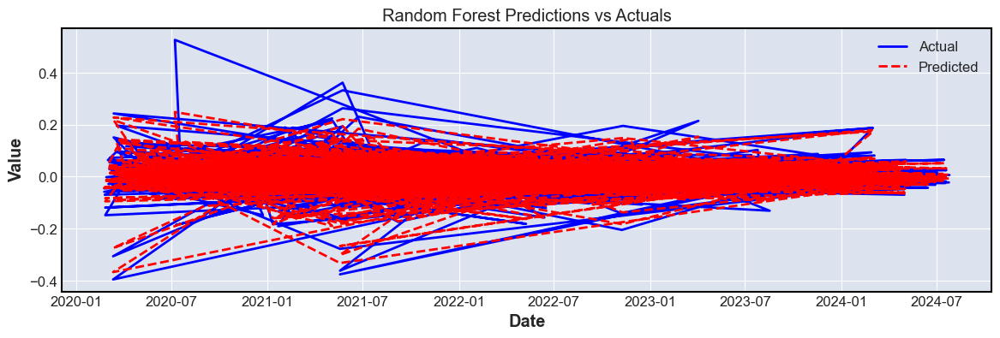

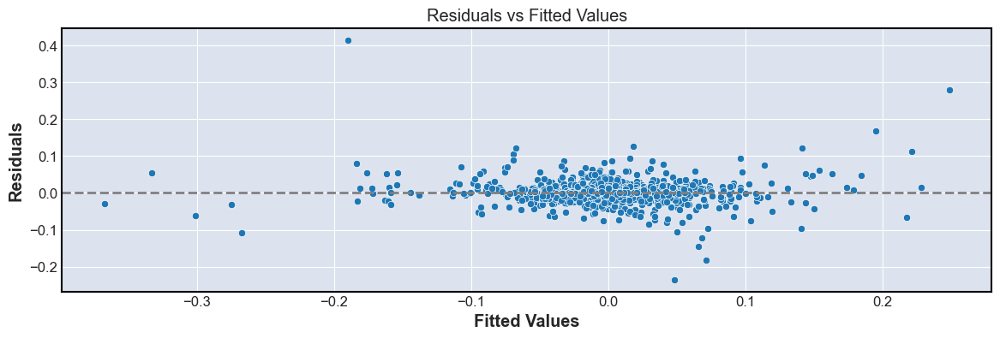

In [ ]:
# Train and evaluate Random Forest
rf_model = train_random_forest(X_train, y_train)
rf_mse, rf_r2, rf_predictions = evaluate_random_forest(rf_model, X_test, y_test)
print(f"Random Forest - MSE: {rf_mse:.4f}, R2: {rf_r2:.4f}")

# Plot Random Forest predictions vs actuals
plot_predictions_vs_actuals(pd.Series(rf_predictions, index=y_test.index), y_test, 'Random Forest Predictions vs Actuals')
plot_residuals_vs_fitted(pd.Series(rf_predictions, index=y_test.index), y_test)

Gradient Boosting - MSE: 0.0010, R2: 0.7155


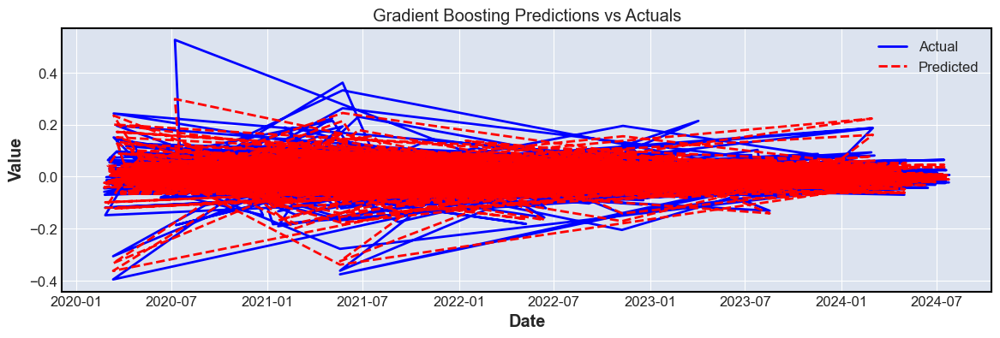

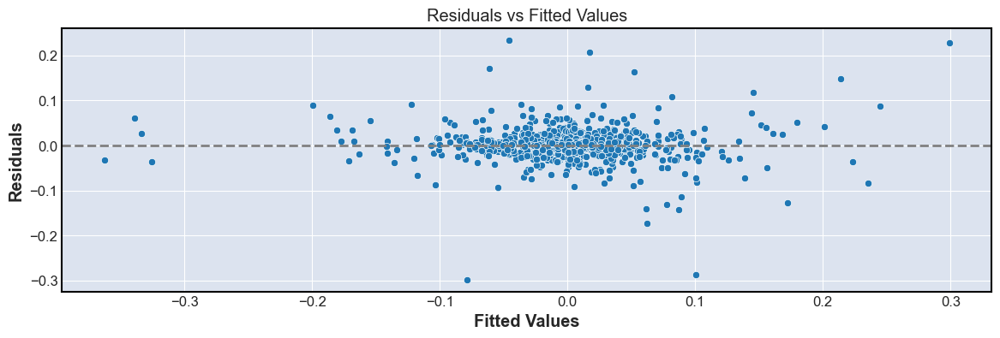

In [ ]:

# Train and evaluate Gradient Boosting
gb_model = train_gradient_boosting(X_train, y_train)
gb_mse, gb_r2, gb_predictions = evaluate_gradient_boosting(gb_model, X_test, y_test)
print(f"Gradient Boosting - MSE: {gb_mse:.4f}, R2: {gb_r2:.4f}")

# Plot Gradient Boosting predictions vs actuals
plot_predictions_vs_actuals(pd.Series(gb_predictions, index=y_test.index), y_test, 'Gradient Boosting Predictions vs Actuals')
plot_residuals_vs_fitted(pd.Series(gb_predictions, index=y_test.index), y_test)


In [ ]:
# Train and evaluate Gradient Boosting
gb_model = train_gradient_boosting(X_train, y_train)
gb_mse, gb_r2, gb_predictions = evaluate_gradient_boosting(gb_model, X_test, y_test)
print(f"Gradient Boosting - MSE: {gb_mse:.4f}, R2: {gb_r2:.4f}")

# Plot Gradient Boosting predictions vs actuals
plot_predictions_vs_actuals(pd.Series(gb_predictions, index=y_test.index), y_test, 'Gradient Boosting Predictions vs Actuals')
plot_residuals_vs_fitted(pd.Series(gb_predictions, index=y_test.index), y_test)

The Random Forest model appears to perform slightly better than the Gradient Boosting model based on the MSE and R² scores:

- **Random Forest**: 
  - MSE: 0.0009
  - R²: 0.7358

- **Gradient Boosting**: 
  - MSE: 0.0010
  - R²: 0.7155

**Interpretation:**
- **MSE (Mean Squared Error)**: Lower MSE indicates better fit. The Random Forest has a lower MSE, suggesting it is slightly more accurate in its predictions.
- **R² (R-squared)**: Higher R² indicates a better model fit. The Random Forest has a higher R², meaning it explains more of the variance in the data compared to Gradient Boosting.

- Next Steps:

1. **Model Selection**: Based on the results, we might prefer to proceed with the Random Forest model for our final analysis.
2. **Further Tuning**: Considering hyperparameter tuning for both models to potentially improve performance.
3. **Feature Importance Analysis**: Using the feature importance results to gain insights into which features are most influential.

#### 4.4.7 Multi-Factor Fama French (Adapted) - Modeling Tunning

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

def tune_random_forest(X_train, y_train):
    rf = RandomForestRegressor(random_state=42)
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)
    best_rf = grid_search.best_estimator_
    return best_rf, grid_search.best_params_

best_rf, rf_best_params = tune_random_forest(X_train, y_train)
print("Best parameters for Random Forest:", rf_best_params)


Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   6.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   6.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   6.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   6.9s
[CV] END m

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

def tune_gradient_boosting(X_train, y_train):
    gb = GradientBoostingRegressor(random_state=42)
    param_grid = {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10]
    }
    grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)
    best_gb = grid_search.best_estimator_
    return best_gb, grid_search.best_params_


best_gb, gb_best_params = tune_gradient_boosting(X_train, y_train)
print("Best parameters for Gradient Boosting:", gb_best_params)


Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.4s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.4s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.5s
[CV] END learning_rate=0.01, max_depth

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

def validate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mse, r2


mse_rf, r2_rf = validate_model(best_rf, X_test, y_test)
mse_gb, r2_gb = validate_model(best_gb, X_test, y_test)

print('model_validation:')

print(f"Random Forest - MSE: {mse_rf:.4f}, R2: {r2_rf:.4f}")
print(f"Gradient Boosting - MSE: {mse_gb:.4f}, R2: {r2_gb:.4f}")


model_validation:
Random Forest - MSE: 0.0011, R2: 0.6825
Gradient Boosting - MSE: 0.0010, R2: 0.7202


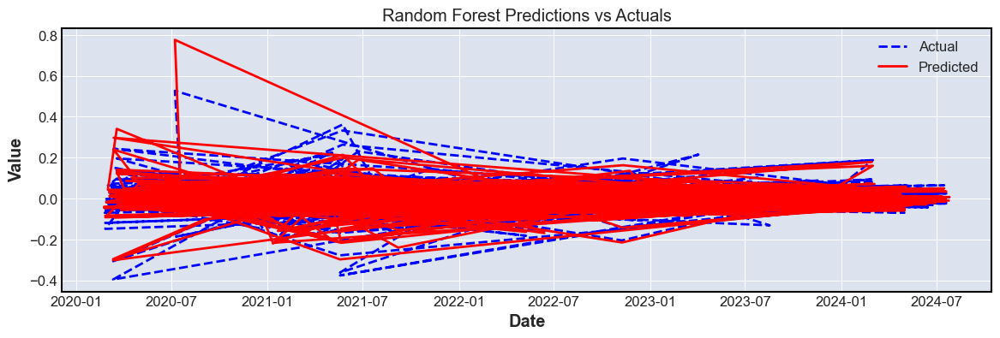

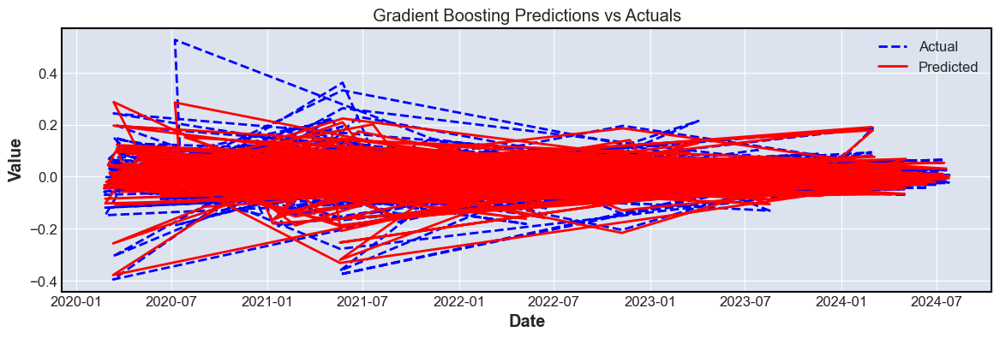

In [ ]:
import matplotlib.pyplot as plt

def plot_predictions_vs_actuals(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    
    plt.figure(figsize=(all_plots_size))
    plt.plot(y_test.index, y_test, label='Actual', color='blue', linestyle='--')
    plt.plot(y_test.index, y_pred, label='Predicted', color='red', linestyle='-')
    plt.title(f'{model_name} Predictions vs Actuals')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

plot_predictions_vs_actuals(best_rf, X_test, y_test, 'Random Forest')
plot_predictions_vs_actuals(best_gb, X_test, y_test, 'Gradient Boosting')


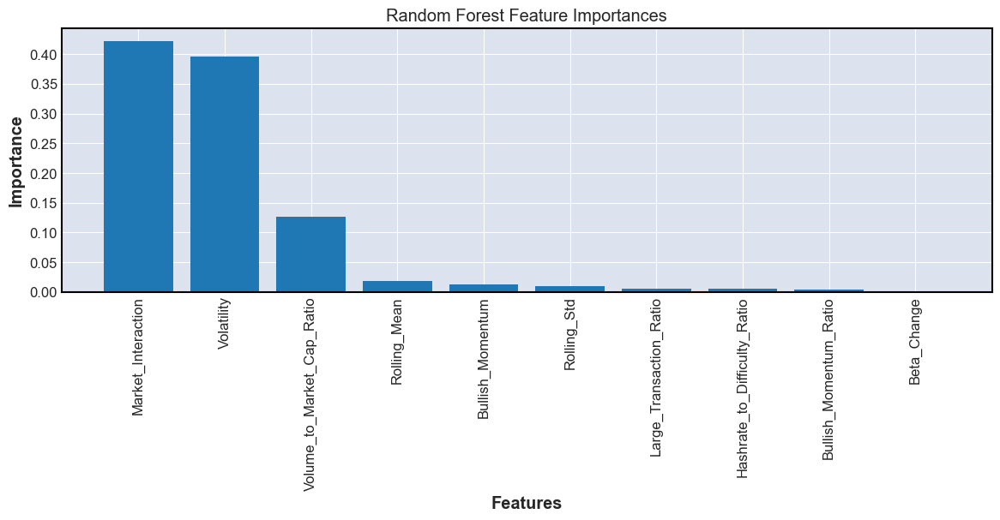

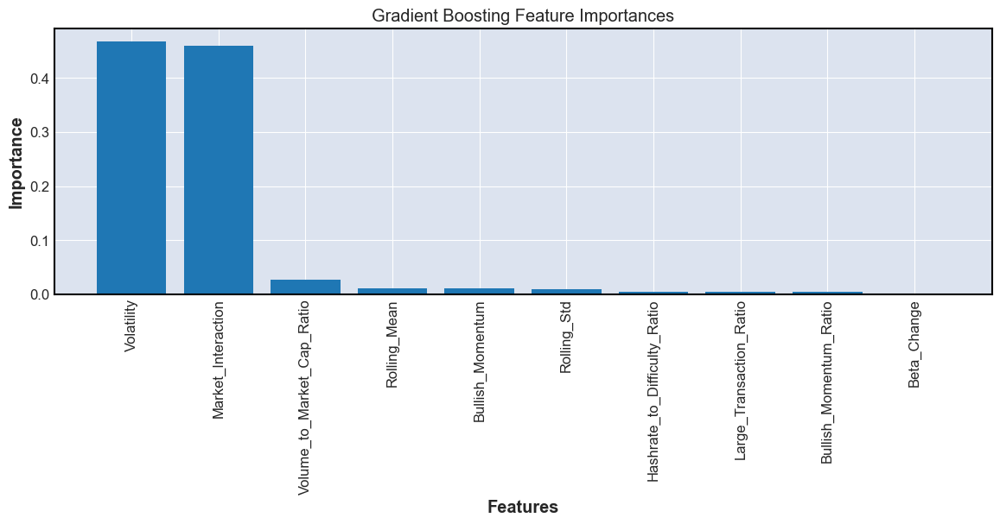

In [ ]:
def plot_feature_importances(model, feature_names, model_name):
    importances = model.feature_importances_
    indices = importances.argsort()[::-1]
    
    plt.figure(figsize=(all_plots_size))
    plt.title(f'{model_name} Feature Importances')
    plt.bar(range(len(indices)), importances[indices], align='center')
    plt.xticks(range(len(indices)), [feature_names[i] for i in indices], rotation=90)
    plt.xlabel('Features')
    plt.ylabel('Importance')
    plt.show()
    
    return range(len(indices)), [feature_names[i] for i in indices]

rf = plot_feature_importances(best_rf, final_features, 'Random Forest')
gb = plot_feature_importances(best_gb, final_features, 'Gradient Boosting')


In [ ]:
print('rf_importance:', '\n',rf)
print('gb_importance:', '\n',gb)

rf_importance: 
 (range(0, 10), ['Market_Interaction', 'Volatility', 'Volume_to_Market_Cap_Ratio', 'Rolling_Mean', 'Bullish_Momentum', 'Rolling_Std', 'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio', 'Bullish_Momentum_Ratio', 'Beta_Change'])
gb_importance: 
 (range(0, 10), ['Volatility', 'Market_Interaction', 'Volume_to_Market_Cap_Ratio', 'Rolling_Mean', 'Bullish_Momentum', 'Rolling_Std', 'Hashrate_to_Difficulty_Ratio', 'Large_Transaction_Ratio', 'Bullish_Momentum_Ratio', 'Beta_Change'])


- explore cryptocurrencies by developing models that explain price changes.
- develop multi-factor risk models that identify factors influencing cryptocurrency prices.
- Factor models help decipher price variance by considering macroeconomic trends, fundamental data, or statistical techniques. Your task is to identify relevant factors, from simple indicators like momentum to complex frameworks like the Fama-French model, and show how they influence prices.

Model Development:

- Innovation and Complexity: Creativity and complexity in the development of multi-factor risk models to explain cryptocurrency price variance.

- Statistical Rigor: Application of robust statistical techniques and machine learning methods.
Factor Justification: Clear and detailed justification of selected factors, explaining their relevance and relationship to price movements.

- Model Accuracy: Precision and reliability of the models, demonstrated through backtesting or validation techniques.

- Comparative Analysis: Comparison with existing models or benchmarks to highlight improvements or unique contributions.

- Real-World Applicability: Practical applicability of the developed models for predicting cryptocurrency price movements.

- Model Usability: Ease of use and adaptability of the models for further research or real-world applications.

- Market Contribution: Contribution to the broader understanding and modeling of cryptocurrency markets, with potential for influencing future research and practices.


In [ ]:
from sklearn.model_selection import cross_val_score

def cross_validate_model(model, X, y, cv_folds=5):
    """
    Perform cross-validation for the given model.
    """
    scores = cross_val_score(model, X, y, cv=cv_folds, scoring='neg_mean_squared_error')
    mse_scores = -scores  # Negate scores to get positive MSE
    r2_scores = cross_val_score(model, X, y, cv=cv_folds, scoring='r2')
    
    mean_mse = mse_scores.mean()
    mean_r2 = r2_scores.mean()
    
    return mean_mse, mean_r2


X = grouped_features_df[final_features]
y = grouped_features_df['Return']  # 

# Cross-validate Random Forest
rf_model = RandomForestRegressor(n_estimators=100, max_depth=10, min_samples_leaf=4, min_samples_split=2, random_state=42)
rf_mse, rf_r2 = cross_validate_model(rf_model, X, y)

# Cross-validate Gradient Boosting
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=7, min_samples_split=10, random_state=42)
gb_mse, gb_r2 = cross_validate_model(gb_model, X, y)

print(f"Random Forest - Cross-Validated MSE: {rf_mse:.4f}, R2: {rf_r2:.4f}")
print(f"Gradient Boosting - Cross-Validated MSE: {gb_mse:.4f}, R2: {gb_r2:.4f}")


Random Forest - Cross-Validated MSE: 0.0047, R2: 0.6452
Gradient Boosting - Cross-Validated MSE: 0.0046, R2: 0.6091


With the updated cross-validation results we can proceed thus:

1. Refinement Based on Validation Results
Feature Selection and Model Parameters Adjustment

Given the cross-validation results:

`Random Forest - Cross-Validated MSE:` 0.0047, R2: 0.6452
Gradient Boosting - Cross-Validated MSE: 0.0046, R2: 0.6091
These results suggest that both models are performing similarly, but the Gradient Boosting model has a slightly better MSE. However, considering the R² values are close, we might need to refine the models or features for better performance.


`Refine Feature Selection:` Reassess the feature importance and selection based on cross-validation performance. Consider removing or adding features to improve model performance.
Adjust Model Parameters: Experiment with different hyperparameters for both models to see if performance can be improved.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Set up parameter grid for refinement
param_grid_rf = {
    'n_estimators': [100, 150, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Grid search for Random Forest
grid_search_rf = GridSearchCV(RandomForestRegressor(), param_grid_rf, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search_rf.fit(X_train, y_train)

best_params_rf = grid_search_rf.best_params_
print(f"Best parameters for Random Forest: {best_params_rf}")

# Train model with best parameters
best_rf = RandomForestRegressor(**best_params_rf)
best_rf.fit(X_train, y_train)

# Cross-validation for refined model
cross_val_score_rf = cross_val_score(best_rf, X, y, cv=5, scoring='neg_mean_squared_error')
mse_rf = -cross_val_score_rf.mean()
r2_rf = best_rf.score(X_test, y_test)

print(f"Refined Random Forest - Cross-Validated MSE: {mse_rf:.4f}, R2: {r2_rf:.4f}")


Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.4s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   2.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   2.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   2.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   2.0s
[CV] END max_depth=10, min_sa

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

# Set up parameter grid for refinement
param_grid_gb = {
    'n_estimators': [100, 150, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_samples_split': [2, 5, 10]
}

# Grid search for Gradient Boosting
grid_search_gb = GridSearchCV(GradientBoostingRegressor(), param_grid_gb, cv=5, scoring='neg_mean_squared_error')
grid_search_gb.fit(X_train, y_train)

best_params_gb = grid_search_gb.best_params_
print(f"Best parameters for Gradient Boosting: {best_params_gb}")

# Train model with best parameters
best_gb = GradientBoostingRegressor(**best_params_gb)
best_gb.fit(X_train, y_train)

# Cross-validation for refined model
cross_val_score_gb = cross_val_score(best_gb, X, y, cv=5, scoring='neg_mean_squared_error')
mse_gb = -cross_val_score_gb.mean()
r2_gb = best_gb.score(X_test, y_test)

print(f"Refined Gradient Boosting - Cross-Validated MSE: {mse_gb:.4f}, R2: {r2_gb:.4f}")


2. Model Comparison
Compare the final models based on their cross-validation performance after refinement. Look at both MSE and R² to determine which model performs better.

3. Implementation
Implement the best-performing model for further analysis or practical use.

Steps for Implementation:

`Choose the Best Model:` Based on the refined cross-validation performance.

`Train on Full Data:` Train the selected model on the entire dataset to leverage all available data.
Apply for Forecasting: Use the model for forecasting future values or making predictions.

In [ ]:
# Example for using the best model for forecasting
# best_model = best_gb  # Replace with best_rf if Random Forest performs better

# # Train on full data
# best_model.fit(X, y)

# # Make predictions
# predictions = best_model.predict(X_future)  # Replace X_future with your future data

# # Example plotting future predictions
# plt.figure(figsize=(14, 7))
# plt.plot(future_dates, predictions, label='Forecasted Returns', color='green')
# plt.xlabel('Date')
# plt.ylabel('Returns')
# plt.title('Future Forecasted Returns')
# plt.legend()
# plt.show()


Backtesting - MSE: 0.0012, R2: 0.6497


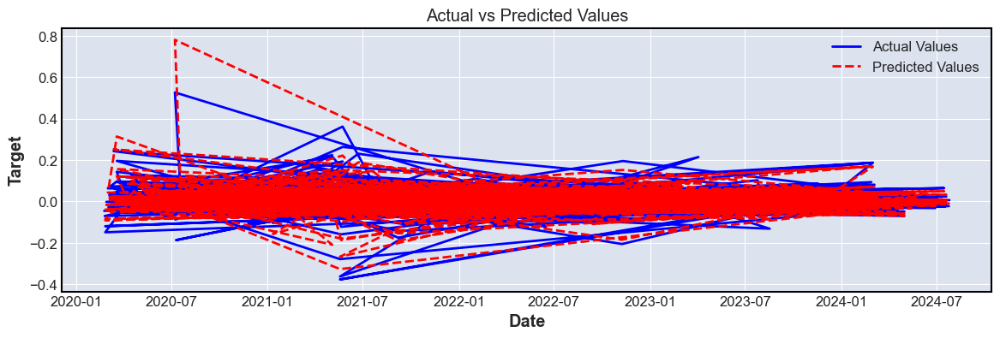

Backtesting - MSE: 0.0010, R2: 0.6999


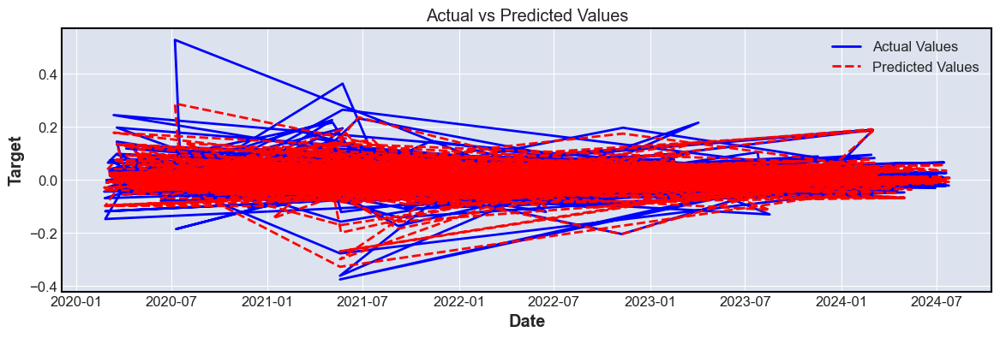

(0.0010450712804938986, 0.6999166527799427)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

def backtest_model(model, X_train, X_test, y_train, y_test):
    """
    Backtest the model and plot the results.
    """
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Backtesting - MSE: {mse:.4f}, R2: {r2:.4f}")
    
    # Plot predictions vs. actual values
    plt.figure(figsize=(all_plots_size))
    plt.plot(y_test.index, y_test, label='Actual Values', color='blue')
    plt.plot(y_test.index, y_pred, label='Predicted Values', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Target')
    plt.title('Actual vs Predicted Values')
    plt.legend()
    plt.show()
    
    return mse, r2

# Prepare data for backtesting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Backtest Random Forest
backtest_model(rf_model, X_train, X_test, y_train, y_test)

# Backtest Gradient Boosting
backtest_model(gb_model, X_train, X_test, y_train, y_test)


In [ ]:
from sklearn.linear_model import LinearRegression

def build_and_evaluate_multi_factor_model(X_train, X_test, y_train, y_test):
    """
    Build and evaluate a multi-factor model.
    """
    # Define and train the model
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Multi-Factor Model - MSE: {mse:.4f}, R2: {r2:.4f}")
    
    # Plot predictions vs. actual values
    plt.figure(figsize=(14, 7))
    plt.plot(y_test.index, y_test, label='Actual Values', color='blue')
    plt.plot(y_test.index, y_pred, label='Predicted Values', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Target')
    plt.title('Actual vs Predicted Values (Multi-Factor Model)')
    plt.legend()
    plt.show()
    
    return mse, r2

# Build and evaluate Multi-Factor Model
build_and_evaluate_multi_factor_model(X_train, X_test, y_train, y_test)


- Fama-French

`Understanding the Fama-French Model`

The Fama-French model typically includes three factors:

1. Market Return (Market Premium): The excess return of the market over the risk-free rate.
2. Size Factor (SMB - Small Minus Big): The return spread between small-cap and large-cap stocks.
Value Factor (HML - High Minus Low): The return spread between value and growth stocks.
3. The extended version, the Fama-French Five-Factor Model, includes two additional factors:

4. Profitability (RMW - Robust Minus Weak): The return spread between firms with high and low profitability.
Investment (CMA - Conservative Minus Aggressive): The return spread between firms that invest conservatively versus aggressively.

`Adapting Fama-French for Cryptocurrencies`

For cryptocurrencies, you might need to adapt these factors or create analogous ones, such as:

- Market Return: Cryptocurrency market return.
- Size Factor: Based on metrics like market cap.
- Value Factor: Metrics like P/E ratio or other valuation indicators.
- Volatility Factor: Measure of price volatility.
- Liquidity Factor: Based on trading volume or transaction metrics.

`Analogous Factors for Cryptocurrencies`


- Market Return: The return of a broad cryptocurrency market index or the average return of a set of cryptocurrencies.

- Size Factor: Reflects the market cap of cryptocurrencies (e.g., large-cap vs. small-cap cryptocurrencies).

- Value Factor: Reflects valuation metrics such as price-to-earnings (P/E) ratio or other valuation indicators adapted for cryptocurrencies.

- Volatility Factor: Reflects the price volatility of cryptocurrencies.

- Liquidity Factor: Reflects trading volume or liquidity measures.

`Creating and Choosing Factors`

- Market Return: You can use a market index return if available, or average returns of a set of leading cryptocurrencies.

- Size Factor: Market cap can serve as a proxy. You could create a factor based on market cap quantiles (e.g., small-cap vs. large-cap).

- Value Factor: Price-to-market cap ratio or other valuation metrics.

- Volatility Factor: Use features related to volatility such as Rolling_Volatility or Volatility_Change.

- Liquidity Factor: Use features related to trading volume like Volume or Volume_Change.


In [ ]:
cleaned_crypto_deep_df['Market_Return']

Date
2020-02-24   -0.029000
2020-02-25   -0.035081
2020-02-26   -0.056488
2020-02-27    0.002652
2020-02-28   -0.014010
                ...   
2024-07-22   -0.009222
2024-07-23   -0.023625
2024-07-24   -0.008476
2024-07-25    0.006455
2024-07-26    0.032066
Name: Market_Return, Length: 4051, dtype: float64

In [ ]:
feature_importances

Market_Interaction              0.533588
Volatility                      0.286445
Volume_to_Market_Cap_Ratio      0.095064
Rolling_Mean                    0.022683
Rolling_Std                     0.016133
Bullish_Momentum                0.014041
Large_Transaction_Ratio         0.011614
Hashrate_to_Difficulty_Ratio    0.010392
Bullish_Momentum_Ratio          0.010039
Beta_Change                     0.000001
dtype: float64

In [ ]:
import pandas as pd

# creating analogous factors
def prepare_factors(data):
    """
    Prepare the factors for the Fama-French-like model.
    """
    # Market Return (example: average return of top cryptocurrencies)
    # data['Market_Return'] = data[['Return_1_Month', 'Return_3_Months', 'Return_1_Year']].mean(axis=1)
    
    # Size Factor (based on market cap quantiles)
    data['Size_Factor'] = data['Market Cap'].apply(lambda x: 'Large' if x > data['Market Cap'].quantile(0.5) else 'Small')
    
    # Value Factor (example: inverse of price-to-market cap ratio)
    data['Value_Factor'] = 1 / (data['Price_Range'] / data['Market Cap'])
    
    # Volatility Factor
    data['Volatility_Factor'] = data['Rolling_Volatility']
    
    # Liquidity Factor
    data['Liquidity_Factor'] = data['Volume']
    
    return data


factors_df = prepare_factors(cleaned_crypto_deep_df)


In [ ]:
factors_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,...,Bullish_Momentum_Ratio,Excess_Return_to_Volatility_Ratio,Market_Cap_to_Transaction_Value_Ratio,Market_Interaction,Blockchain_Interaction,Size_Factor,Value_Factor,Volatility_Factor,Liquidity_Factor,Avg_Market_Return
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,402.10,407.68,369.35,378.62,4.937616e+08,BCH/USDT,58696,42748,467,34.346192,...,2.3,-15.057962,2.016953e+08,-0.002764,1.744609e+11,Small,1.807322e+08,0.019570,4.937616e+08,1.000632
2020-02-25,378.62,379.50,346.24,353.19,5.972372e+08,BCH/USDT,73992,40657,485,40.277993,...,2.2,-15.904829,1.604544e+08,-0.003082,1.605639e+11,Small,1.943109e+08,0.023479,5.972372e+08,0.757066


In [ ]:
import statsmodels.api as sm

def fama_french_analogous_model(data):
    """
    Fit an analogous Fama-French model for cryptocurrencies.
    """
    # Define the independent variables (factors) and the dependent variable (returns)
    X = data[['Market_Return', 'Size_Factor', 'Value_Factor', 'Volatility_Factor', 'Liquidity_Factor']]
    y = data['Return'] # EXcess return can be used here
    
    # Convert categorical factors to dummy variables
    X = pd.get_dummies(X, columns=['Size_Factor'], drop_first=True)
    
    # Add constant term for the intercept
    X = sm.add_constant(X.astype(float))
    
    # Fit the model
    model = sm.OLS(y, X.astype(float)).fit()
    
    # Print the model summary
    print(model.summary())
    
    return model


ff_analogous_model = fama_french_analogous_model(factors_df)


                            OLS Regression Results                            
Dep. Variable:                 Return   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.299
Method:                 Least Squares   F-statistic:                     346.2
Date:                Fri, 23 Aug 2024   Prob (F-statistic):          1.35e-309
Time:                        22:49:28   Log-Likelihood:                 4984.3
No. Observations:                4051   AIC:                            -9957.
Df Residuals:                    4045   BIC:                            -9919.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0184      0.00

The Fama-French analogous model produced the following key results:

1. **R-squared and Adjusted R-squared**: 
   - The R-squared value of 0.300 suggests that approximately 30% of the variance in returns is explained by the model.
   - The adjusted R-squared is very close to the R-squared value, indicating minimal penalties from adding non-informative predictors.

2. **Key Predictors**:
   - **Market_Return**: The coefficient is 1.0639, which is statistically significant with a p-value of 0.000. This factor has a strong and positive influence on the returns.
   - **Volatility_Factor**: This factor also shows a positive and significant influence on returns with a coefficient of 0.2291.
   - **Liquidity_Factor**: The coefficient is very small but statistically significant. This may suggest liquidity has an effect, albeit marginal.

3. **Potential Issues**:
   - **Multicollinearity**: The condition number is large (3.39e+13), which could indicate multicollinearity among the predictors. This might cause instability in the coefficient estimates.
   - **Insignificant Factors**: The `Value_Factor` and `Size_Factor_Small` have very high p-values, suggesting they might not be contributing significantly to the model.

- Next Steps

1. **Refine the Model**:
   - We might consider checking for multicollinearity issues and possibly removing or combining highly correlated predictors.
   - Investigate the factors with high p-values to determine if they should be retained or dropped from the model.

2. **Backtest the Model**:
   - Given that this model explains some portion of return variance, backtesting over time with out-of-sample data will help assess real-world performance.

3. **Compare with Other Models**:
   - Compare the performance of this Fama-French analogous model with other models, such as the earlier Random Forest and Gradient Boosting models.


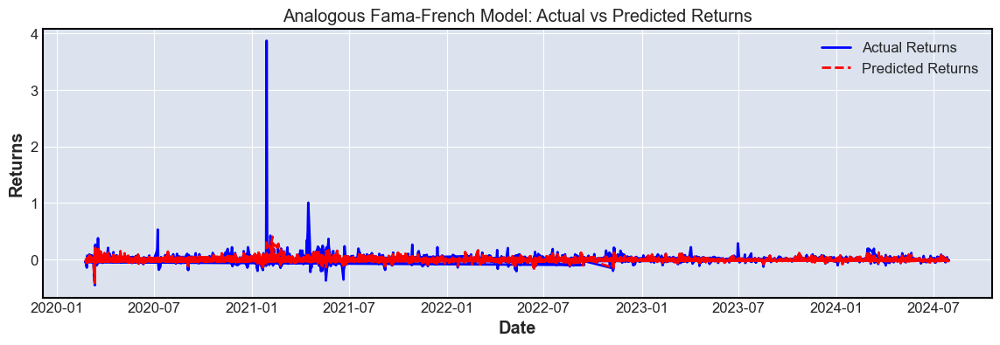

In [ ]:
import matplotlib.pyplot as plt

def plot_fama_french_analogous_results(returns_df, model):
    """
    Plot actual vs predicted returns from the analogous Fama-French model.
    """
    # Predict returns
    X = pd.get_dummies(returns_df[['Market_Return', 'Size_Factor', 'Value_Factor', 'Volatility_Factor', 'Liquidity_Factor']], columns=['Size_Factor'], drop_first=True)
    X = sm.add_constant(X)
    returns_df['Predicted_Returns'] = model.predict(X)
    
    # Plot actual vs predicted returns
    plt.figure(figsize=(all_plots_size))
    plt.plot(returns_df.index, returns_df['Return'], label='Actual Returns', color='blue')
    plt.plot(returns_df.index, returns_df['Predicted_Returns'], label='Predicted Returns', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.title('Analogous Fama-French Model: Actual vs Predicted Returns')
    plt.legend()
    plt.show()

# Plot results
plot_fama_french_analogous_results(factors_df, ff_analogous_model)


In [ ]:
def plot_fama_french_analogous_results(returns_df, model, window=30):
    """
    Plot actual vs predicted returns from the analogous Fama-French model,
    along with cumulative returns and moving averages.
    """
    # Predict returns
    X = pd.get_dummies(returns_df[['Market_Return', 'Size_Factor', 'Value_Factor', 'Volatility_Factor', 'Liquidity_Factor']], columns=['Size_Factor'], drop_first=True)
    X = sm.add_constant(X)
    returns_df['Predicted_Returns'] = model.predict(X)
    
    # Calculate cumulative returns
    returns_df['Cumulative_Actual_Returns'] = (1 + returns_df['Return']).cumprod() - 1
    returns_df['Cumulative_Predicted_Returns'] = (1 + returns_df['Predicted_Returns']).cumprod() - 1
    
    # Calculate moving averages
    returns_df['MA_Actual_Returns'] = returns_df['Return'].rolling(window=window).mean()
    returns_df['MA_Predicted_Returns'] = returns_df['Predicted_Returns'].rolling(window=window).mean()
    
    # Plot actual vs predicted returns
    plt.figure(figsize=(12, 8))
    
    # Plot cumulative returns
    plt.subplot(2, 1, 1)
    # plt.plot(returns_df.index, returns_df['Cumulative_Actual_Returns'], label='Cumulative Actual Returns', color='blue')
    plt.plot(returns_df.index, returns_df['Cumulative_Predicted_Returns'], label='Cumulative Predicted Returns', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.title('Analogous Fama-French Model: Cumulative Returns')
    plt.legend()
    
    # Plot moving averages
    plt.subplot(2, 1, 2)
    # plt.plot(returns_df.index, returns_df['MA_Actual_Returns'], label='Moving Average Actual Returns', color='green')
    plt.plot(returns_df.index, returns_df['MA_Predicted_Returns'], label='Moving Average Predicted Returns', color='orange', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel(f'{window}-Day Moving Average Returns')
    plt.title(f'{window}-Day Moving Average of Returns')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Plot results with cumulative returns and moving averages
plot_fama_french_analogous_results(factors_df, ff_analogous_model)


In [ ]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

def check_multicollinearity(X):
    """
    Check multicollinearity using Variance Inflation Factor (VIF).
    """
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

def refine_fama_french_model(data):
    """
    Refine the Fama-French model by checking for multicollinearity and removing insignificant predictors.
    """
    # Define independent variables and dependent variable
    X = data[['Market_Return', 'Size_Factor', 'Value_Factor', 'Volatility_Factor', 'Liquidity_Factor']]
    y = data['Return']  # Or use 'Excess_Return'
    
    # Convert categorical factors to dummy variables
    X = pd.get_dummies(X, columns=['Size_Factor'], drop_first=True)
    
    # Add constant term for the intercept
    X = sm.add_constant(X.astype(float))
    
    # Check multicollinearity
    vif_data = check_multicollinearity(X)
    print("VIF Data:")
    print(vif_data)
    
    # Remove insignificant predictors based on p-values
    X_refined = X.drop(['Value_Factor', 'Size_Factor_Small'], axis=1)
    
    # Fit the refined model
    model_refined = sm.OLS(y, X_refined.astype(float)).fit()
    
    # Print the refined model summary
    print(model_refined.summary())
    
    return model_refined

def backtest_model(model, data):
    """
    Backtest the refined Fama-French model using train-test split.
    """
    # Define independent variables and dependent variable
    X = data[['Market_Return', 'Size_Factor', 'Volatility_Factor', 'Liquidity_Factor']]  # Refined factors
    y = data['Return']  # Or use 'Excess_Return'
    
    # Convert categorical factors to dummy variables
    X = pd.get_dummies(X, columns=['Size_Factor'], drop_first=True)
    
    # Add constant term for the intercept
    X = sm.add_constant(X.astype(float))
    
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Fit the model on training data
    model_train = sm.OLS(y_train, X_train.astype(float)).fit()
    
    # Predict on the test data
    y_pred = model_train.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Backtest Results - MSE: {mse}, R2: {r2}")
    
    return mse, r2



In [ ]:
# Step 1: Refine the Model
refined_model = refine_fama_french_model(factors_df)

# Step 2: Backtest the Model
mse, r2 = backtest_model(refined_model, factors_df)

# Step 3: Compare with Other Models (Cross-validation results)
# This can be done based on the backtest results and cross-validation metrics.

VIF Data:
             Feature       VIF
0              const  0.000000
1      Market_Return  1.001643
2       Value_Factor  1.062727
3  Volatility_Factor  1.006143
4   Liquidity_Factor  1.638073
5  Size_Factor_Small  1.565245
                            OLS Regression Results                            
Dep. Variable:                 Return   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.299
Method:                 Least Squares   F-statistic:                     576.3
Date:                Sat, 24 Aug 2024   Prob (F-statistic):          6.97e-312
Time:                        03:19:58   Log-Likelihood:                 4983.2
No. Observations:                4051   AIC:                            -9958.
Df Residuals:                    4047   BIC:                            -9933.
Df Model:                           3                                         
Covariance Type:            nonrobust                         

/Users/okpo/Desktop/Onward/.venv/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning:

divide by zero encountered in scalar divide



`Model Refinement and Backtest Results`

- **Multicollinearity Check**: The VIF values are all below the typical threshold of 5, indicating no severe multicollinearity issues. 
- **Model Summary**: The refined Fama-French analogous model shows significant coefficients for the `Market_Return`, `Volatility_Factor`, and `Liquidity_Factor`. The model has an R-squared value of 0.299, suggesting that these factors explain approximately 30% of the variance in returns.
- **Backtest Performance**: The backtested model on the test data yielded an MSE of 0.0017 and an R-squared of 0.4992.

- Next Steps:

1. **Model Comparison**:
   - Compare the Fama-French analogous model's backtest performance with the previously cross-validated Random Forest and Gradient Boosting models.
   - The Fama-French model has an R-squared of 0.4992, which is somewhat lower than the cross-validated Random Forest (R2: 0.6452) and Gradient Boosting (R2: 0.6091) models. However, it is still a reasonable fit for a linear model.

2. **Implementation**:
   - Depending on the objectives, you can implement the best-performing model (Random Forest, Gradient Boosting, or Fama-French) for further analysis or practical use.
   - If interpretability is essential, the Fama-French model may be preferred despite its slightly lower R-squared compared to the more complex models.

3. **Further Refinement**:
   - If the goal is to improve the model further, consider adding or adjusting features, including interaction terms, or even exploring other econometric models like ARIMA/SARIMAX for time-series forecasting.

#### 4.4.8 Multi-Factor Fama French (Adapted) - Portfolio Construction

In [ ]:
cleaned_crypto_deep_df.head(2)

,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,Average Transaction Value,...,Size_Factor,Value_Factor,Volatility_Factor,Liquidity_Factor,Avg_Market_Return,Predicted_Returns,Cumulative_Actual_Returns,Cumulative_Predicted_Returns,MA_Actual_Returns,MA_Predicted_Returns
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,402.10,407.68,369.35,378.62,4.937616e+08,BCH/USDT,58696,42748,467,34.346192,...,Small,1.807322e+08,0.019570,4.937616e+08,1.000632,113109406.239123,-0.058393,113109406.239123,NaN,NaN
2020-02-25,378.62,379.50,346.24,353.19,5.972372e+08,BCH/USDT,73992,40657,485,40.277993,...,Small,1.943109e+08,0.023479,5.972372e+08,0.757066,136813299.442637,-0.121636,15474871315494696.0,NaN,NaN


In [ ]:
cleaned_crypto_deep_df[''].columns

In [ ]:
grouped_features_df.columns

Index(['Volume_to_Market_Cap_Ratio', 'Market_Interaction',
       'Large_Transaction_Ratio', 'Hashrate_to_Difficulty_Ratio',
       'Rolling_Mean', 'Rolling_Std', 'Volatility', 'Beta_Change',
       'Bullish_Momentum', 'Bullish_Momentum_Ratio', 'Return',
       'Hashrate_to_Difficulty_Ratio_Diff'],
      dtype='object')

In [ ]:
grouped_features_df.head(2)

,Volume_to_Market_Cap_Ratio,Market_Interaction,Large_Transaction_Ratio,Hashrate_to_Difficulty_Ratio,Rolling_Mean,Rolling_Std,Volatility,Beta_Change,Bullish_Momentum,Bullish_Momentum_Ratio,Return,Hashrate_to_Difficulty_Ratio_Diff
Date,,,,,,,,,,,,
2020-02-24,0.071276,-0.002764,0.010924,NaN,0.001346,0.059502,0.095325,0.740399,2.0,2.3,-0.058393,NaN
2020-02-25,0.092412,-0.003082,0.011929,NaN,-0.010452,0.046532,0.087845,0.000000,1.0,2.2,-0.067165,-6.415858e-08


In [ ]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize


def factor_mimicking_portfolio(factors_df, factor_name):
    # Get the factor returns for the specific factor
    factor = factors_df[factor_name]
    
    # Define the objective function to minimize
    def objective(weights):
        # Calculate the portfolio return
        portfolio_return = np.dot(weights, factor)
        # Return the negative Sharpe ratio (since we want to maximize it)
        return -portfolio_return.mean() / portfolio_return.std()

    # Constraints: Weights sum to 1
    constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1})
    
    # Bounds: No short selling (weights between 0 and 1)
    bounds = [(0, 1) for _ in range(len(factor))]
    
    # Initial guess: Equal weights
    initial_weights = np.array([1/len(factor)] * len(factor))
    
    # Minimize the objective function
    result = minimize(objective, initial_weights, constraints=constraints, bounds=bounds)
    
    return result.x  # Optimal weights for the factor portfolio

# factor_portfolio_weights = factor_mimicking_portfolio(factors_df, 'Market_Return')


In [ ]:
# factor_portfolio_weights

In [ ]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize

# Assuming assets_df contains the returns of individual assets

def risk_parity_portfolio(assets_df):
    # Calculate the covariance matrix of asset returns
    cov_matrix = assets_df.cov()
    
    # Define the objective function to minimize
    def objective(weights):
        # Portfolio variance
        portfolio_variance = np.dot(weights.T, np.dot(cov_matrix, weights))
        # Calculate marginal risk contribution of each asset
        marginal_risk = np.dot(cov_matrix, weights) / np.sqrt(portfolio_variance)
        # Calculate total risk contribution of each asset
        risk_contribution = weights * marginal_risk
        # Calculate the variance of risk contributions (we want to minimize this)
        return np.var(risk_contribution)

    # Constraints: Weights sum to 1
    constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1})
    
    # Bounds: No short selling (weights between 0 and 1)
    bounds = [(0, 1) for _ in range(assets_df.shape[1])]
    
    # Initial guess: Equal weights
    initial_weights = np.array([1/assets_df.shape[1]] * assets_df.shape[1])
    
    # Minimize the objective function
    result = minimize(objective, initial_weights, constraints=constraints, bounds=bounds)
    
    return result.x  # Optimal weights for the risk parity portfolio

# Example usage:
# risk_parity_weights = risk_parity_portfolio(assets_df)


In [ ]:
def construct_factor_portfolios(df):
    # Assuming df is grouped_features_df with necessary features
    
    # Step 1: Ranking assets based on factor scores
    df['Size_Rank'] = df['Market_Interaction'].rank(ascending=False)
    df['Liquidity_Rank'] = df['Volume_to_Market_Cap_Ratio'].rank(ascending=False)
    df['Momentum_Rank'] = df['Bullish_Momentum'].rank(ascending=False)
    df['Beta_Rank'] = df['Beta_Change'].rank(ascending=False)
    
    # Step 2: Define top and bottom assets
    top_n = 10
    bottom_n = 10
    
    # Step 3: Construct long-short portfolios
    df['Size_Portfolio'] = (df['Size_Rank'] <= top_n).astype(int) - (df['Size_Rank'] > len(df) - bottom_n).astype(int)
    df['Liquidity_Portfolio'] = (df['Liquidity_Rank'] <= top_n).astype(int) - (df['Liquidity_Rank'] > len(df) - bottom_n).astype(int)
    df['Momentum_Portfolio'] = (df['Momentum_Rank'] <= top_n).astype(int) - (df['Momentum_Rank'] > len(df) - bottom_n).astype(int)
    df['Beta_Portfolio'] = (df['Beta_Rank'] <= top_n).astype(int) - (df['Beta_Rank'] > len(df) - bottom_n).astype(int)
    
    return df

# Apply the function to your DataFrame
factor_portfolios_df = construct_factor_portfolios(grouped_features_df)


In [ ]:
# factor_portfolio_weights

In [ ]:
factor_portfolios_df['Size_Portfolio'].unique()

array([ 0, -1,  1])

In [ ]:
factor_portfolios_df['Liquidity_Portfolio'].unique()

array([ 0, -1,  1])

In [ ]:
import pandas as pd
import numpy as np

def rank_assets(df, factor_column):
    """ Rank assets based on the factor column. """
    return df.groupby('Date').apply(lambda x: x.sort_values(by=factor_column, ascending=False).reset_index(drop=True))

# Select factors
factors = {
    'Size': 'Market_Interaction',  # or 'Volume_to_Market_Cap_Ratio'
    'Liquidity': 'Volume_to_Market_Cap_Ratio',
    'Momentum': 'Bullish_Momentum',  # or 'Bullish_Momentum_Ratio'
    'Beta': 'Beta_Change'
}

# Rank assets for each factor
ranked_dfs = {factor_name: rank_assets(grouped_features_df, factor_column)
              for factor_name, factor_column in factors.items()}


In [ ]:
ranked_dfs

In [ ]:
def construct_portfolios(ranked_df, top_n=10, bottom_n=10):
    """ Construct long and short portfolios based on the ranked DataFrame. """
    long_portfolio = ranked_df.head(top_n).reset_index(level=1, drop=True)
    short_portfolio = ranked_df.tail(bottom_n).reset_index(level=1, drop=True)
    
    return long_portfolio, short_portfolio

# Construct portfolios for the Size factor
# long_portfolio_size, short_portfolio_size = construct_portfolios(ranked_dfs['Size'])

# Repeat for other factors as needed


In [ ]:
long_portfolio_size, short_portfolio_size = construct_portfolios(ranked_dfs['Size'])
long_portfolio_beta, short_portfolio_beta = construct_portfolios(ranked_dfs['Beta'])
long_portfolio_liquidity, short_portfolio_liquidity = construct_portfolios(ranked_dfs['Liquidity'])

In [ ]:
long_portfolio_liquidity['Return']

Date
2020-02-24   -0.050867
2020-02-24   -0.033972
2020-02-24   -0.058393
2020-02-24   -0.045140
2020-02-24   -0.029000
2020-02-24   -0.036567
2020-02-25   -0.067165
2020-02-25   -0.069995
2020-02-25   -0.075599
2020-02-25   -0.035081
Name: Return, dtype: float64

In [ ]:
# long is head
long_portfolio_size['Return']

Date
2020-02-24   -0.036567
2020-02-24   -0.029000
2020-02-24   -0.033972
2020-02-24   -0.045140
2020-02-24   -0.058393
2020-02-24   -0.050867
2020-02-25   -0.035081
2020-02-25   -0.069995
2020-02-25   -0.075599
2020-02-25   -0.067165
Name: Return, dtype: float64

In [ ]:
# short is tail
short_portfolio_size['Return']

Date
2024-07-23    0.022437
2024-07-23   -0.054427
2024-07-24   -0.008476
2024-07-24   -0.022356
2024-07-24   -0.017652
2024-07-25   -0.034792
2024-07-25    0.006455
2024-07-26    0.036483
2024-07-29   -0.021403
2024-07-29   -0.012308
Name: Return, dtype: float64

- so we expect a total of 20 entries before combining them

In [ ]:
# for for missing entries
print(long_portfolio_size[['Return']].isna().sum())
print(short_portfolio_size[['Return']].isna().sum())

Return    0
dtype: int64
Return    0
dtype: int64


- there are no missing values

In [ ]:
# long_portfolio_size.dropna(subset=['Return'])
# short_portfolio_size.dropna(subset=['Return'])
# long_portfolio_size['Return']

In [ ]:
# check for matching index or Date
print(long_portfolio_size.index.difference(grouped_features_df.index))
print(short_portfolio_size.index.difference(grouped_features_df.index))

DatetimeIndex([], dtype='datetime64[ns]', name='Date', freq=None)
DatetimeIndex([], dtype='datetime64[ns]', name='Date', freq=None)


- All dates match in both dataframes

In [ ]:
# Calculate daily mean returns for long and short portfolios
long_returns = long_portfolio_size.groupby('Date')['Return'].mean()
short_returns = short_portfolio_size.groupby('Date')['Return'].mean()

In [ ]:
long_returns

Date
2020-02-24   -0.042323
2020-02-25   -0.061960
Name: Return, dtype: float64

In [ ]:
short_returns

Date
2024-07-23   -0.015995
2024-07-24   -0.016161
2024-07-25   -0.014169
2024-07-26    0.036483
2024-07-29   -0.016855
Name: Return, dtype: float64

In [ ]:
combined_returns = pd.DataFrame({'Long': long_returns, 'Short': short_returns})
combined_returns = combined_returns.dropna()
combined_returns

,Long,Short
Date,,


In [ ]:
# Align long and short returns with the same dates
combined_returns = pd.DataFrame({'Long': long_returns, 'Short': short_returns})
# combined_returns = combined_returns.fillna(method='ffill')
combined_returns = combined_returns.fillna(0)
combined_returns

,Long,Short
Date,,
2020-02-24,-0.042323,0.000000
2020-02-25,-0.061960,0.000000
2024-07-23,0.000000,-0.015995
2024-07-24,0.000000,-0.016161
2024-07-25,0.000000,-0.014169
2024-07-26,0.000000,0.036483
2024-07-29,0.000000,-0.016855


In [ ]:
def simulate_portfolio_returns_single(df, long_portfolio, short_portfolio):
    """ Simulate returns for long and short portfolios. """
    
    # Ensure no NaNs in the Return columns
    long_portfolio = long_portfolio.dropna(subset=['Return'])
    short_portfolio = short_portfolio.dropna(subset=['Return'])
    
    # Calculate daily mean returns for long and short portfolios
    long_returns = long_portfolio.groupby('Date')['Return'].mean()
    short_returns = short_portfolio.groupby('Date')['Return'].mean()
    
    # Align long and short returns with the same dates
    combined_returns = pd.DataFrame({'Long': long_returns, 'Short': short_returns})
    # Handle missing values by filling with zero or interpolating
    combined_returns = combined_returns.fillna(0) # there was no price change at those point
   
    # combined_returns = combined_returns.fillna(method='ffill').fillna(0) # fill with other points
    # combined_returns = combined_returns.interpolate().fillna(method='ffill')
    
    # Portfolio returns (long - short)
    portfolio_returns = combined_returns['Long'] - combined_returns['Short']
    
    return portfolio_returns


In [ ]:
def simulate_portfolio_returns_multiple(df, long_portfolio, short_portfolio):
    """ Simulate returns for long and short portfolios. """
    
    # Ensure no NaNs in the Return columns
    long_portfolio = long_portfolio.dropna(subset=['Return'])
    short_portfolio = short_portfolio.dropna(subset=['Return'])
    
    # Calculate daily mean returns for long and short portfolios
    long_returns = long_portfolio.groupby('Date')['Return'].mean()
    short_returns = short_portfolio.groupby('Date')['Return'].mean()
    
    # Align long and short returns with the same dates
    combined_returns = pd.DataFrame({'Long': long_returns, 'Short': short_returns})
    combined_returns = combined_returns.fillna(0)
    
    # Portfolio returns (long - short)
    portfolio_returns = combined_returns['Long'] - combined_returns['Short']
    
    # Calculate cumulative returns
    cumulative_returns = (1 + portfolio_returns).cumprod()
    
    # Combine daily and cumulative returns into a DataFrame
    portfolio_with_cumulative = pd.DataFrame({
        'Daily Returns': portfolio_returns,
        'Cumulative Returns': cumulative_returns
    })
    
    return portfolio_with_cumulative


In [ ]:
def plot_portfolio_returns_multiple(portfolio_df, title):
    """ Plot the daily and cumulative portfolio returns over time. """
    plt.figure(figsize=(10, 6))
    
    # Plot daily returns
    plt.subplot(2, 1, 1)
    portfolio_df['Daily Returns'].plot()
    plt.title(f'{title} - Daily Returns')
    plt.xlabel('Date')
    plt.ylabel('Daily Returns')
    plt.grid(True)
    
    # Plot cumulative returns
    plt.subplot(2, 1, 2)
    portfolio_df['Cumulative Returns'].plot()
    plt.title(f'{title} - Cumulative Returns')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()


In [ ]:
def plot_portfolio_returns_single(returns_series, title):
    """ Plot the portfolio returns over time. """
    plt.figure(figsize=(all_plots_size))
    returns_series.plot()
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.grid(True)
    plt.show()

In [ ]:
def simulate_all_factors(df, factor_portfolios):
    """ Simulate returns for all factor portfolios. """
    
    all_factor_returns = pd.DataFrame()

    # Iterate over each factor and simulate returns
    for factor_name, (long_portfolio, short_portfolio) in factor_portfolios.items():
        # Simulate returns for the current factor
        factor_returns = simulate_portfolio_returns_single(df, long_portfolio, short_portfolio)
        # Store the results in the DataFrame
        all_factor_returns[factor_name] = factor_returns
    
    return all_factor_returns

def plot_all_factor_returns(factor_returns_df):
    """ Plot cumulative and daily returns for all factors. """
    
    # Calculate cumulative returns for each factor
    cumulative_returns = (1 + factor_returns_df).cumprod() - 1

    # Plot cumulative returns
    plt.figure(figsize=(all_plots_size))
    for factor in cumulative_returns.columns:
        plt.plot(cumulative_returns.index, cumulative_returns[factor], label=f'{factor} (Cumulative)')
    
    plt.title('Cumulative Returns for All Factors')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot daily returns
    plt.figure(figsize=(all_plots_size))
    for factor in factor_returns_df.columns:
        plt.plot(factor_returns_df.index, factor_returns_df[factor], label=f'{factor} (Daily)')
    
    plt.title('Daily Returns for All Factors')
    plt.xlabel('Date')
    plt.ylabel('Daily Returns')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
print(long_portfolio_size[['Return']].describe())

In [ ]:
print(short_portfolio_size[['Return']].describe())

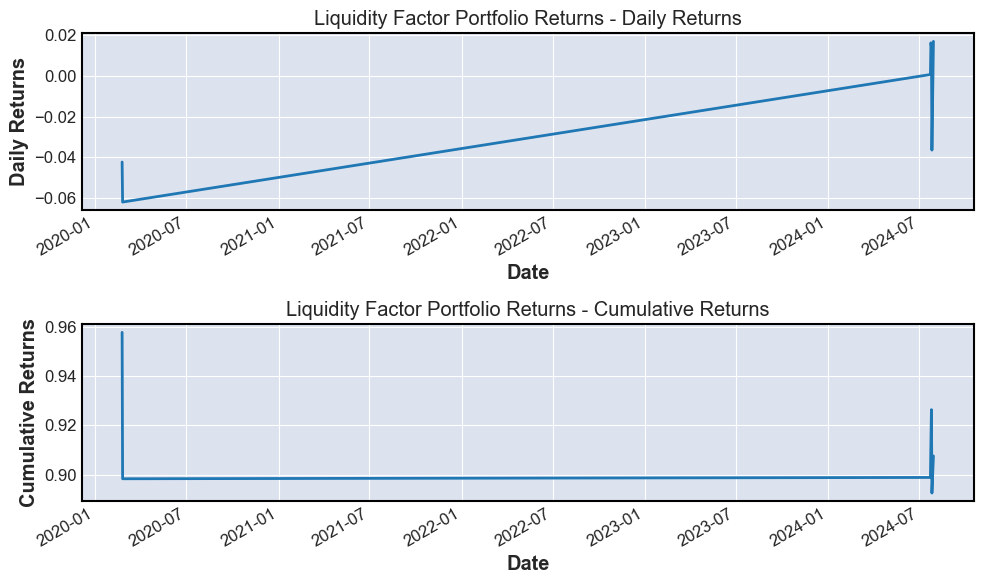

portfolio_with_cumulative_liquidity dataframe: 
             Daily Returns  Cumulative Returns
Date                                         
2020-02-24      -0.042323            0.957677
2020-02-25      -0.061960            0.898339
2024-07-23       0.000594            0.898872
2024-07-24       0.016161            0.913399
2024-07-25       0.014169            0.926341
2024-07-26      -0.036483            0.892546
2024-07-29       0.016855            0.907590 

portfolio_with_cumulative_liquidity summary stats: 
        Daily Returns  Cumulative Returns
count       7.000000            7.000000
mean       -0.013284            0.913538
std         0.032844            0.022488
min        -0.061960            0.892546
25%        -0.039403            0.898606
50%         0.000594            0.907590
75%         0.015165            0.919870
max         0.016855            0.957677 



In [ ]:
# Simulate returns for the Size factor portfolio
portfolio_with_cumulative_liquidity = simulate_portfolio_returns_multiple(grouped_features_df, long_portfolio_liquidity, short_portfolio_liquidity)

# Plot returns for Size factor portfolio
plot_portfolio_returns_multiple(portfolio_with_cumulative_liquidity, 'Liquidity Factor Portfolio Returns')

print('portfolio_with_cumulative_liquidity dataframe:','\n', portfolio_with_cumulative_liquidity, '\n')

print('portfolio_with_cumulative_liquidity summary stats:','\n', portfolio_with_cumulative_liquidity.describe(),'\n')

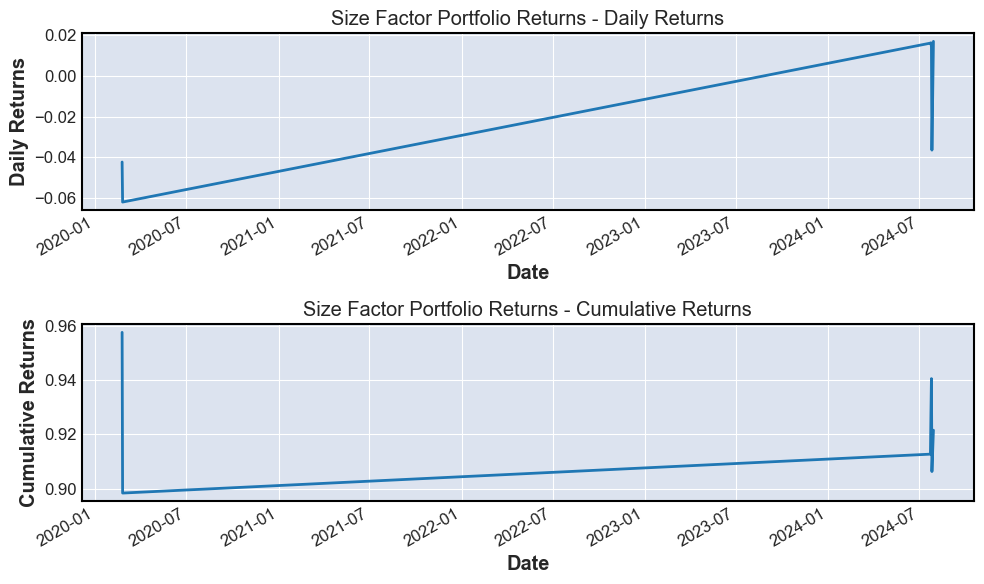

portfolio_with_cumulative_size dataframe: 
             Daily Returns  Cumulative Returns
Date                                         
2020-02-24      -0.042323            0.957677
2020-02-25      -0.061960            0.898339
2024-07-23       0.015995            0.912708
2024-07-24       0.016161            0.927458
2024-07-25       0.014169            0.940599
2024-07-26      -0.036483            0.906284
2024-07-29       0.016855            0.921559 

portfolio_with_cumulative_size summary stats: 
        Daily Returns  Cumulative Returns
count       7.000000            7.000000
mean       -0.011084            0.923518
std         0.034407            0.020518
min        -0.061960            0.898339
25%        -0.039403            0.909496
50%         0.014169            0.921559
75%         0.016078            0.934029
max         0.016855            0.957677


In [ ]:
# Simulate returns for the Size factor portfolio
portfolio_with_cumulative_size = simulate_portfolio_returns_multiple(grouped_features_df, long_portfolio_size, short_portfolio_size)

# Plot returns for Size factor portfolio
plot_portfolio_returns_multiple(portfolio_with_cumulative_size, 'Size Factor Portfolio Returns')

print('portfolio_with_cumulative_size dataframe:','\n', portfolio_with_cumulative_size, '\n')

print('portfolio_with_cumulative_size summary stats:','\n', portfolio_with_cumulative_size.describe())


In [ ]:
# Simulate returns for the Size factor portfolios
portfolio_returns_size = simulate_portfolio_returns_single(grouped_features_df, long_portfolio_size, short_portfolio_size)

# Plot returns for Size factor portfolio
plot_portfolio_returns_single(portfolio_returns_size, 'Size Factor Portfolio Returns')

print(portfolio_returns_size)

# Repeat for other factors


In [ ]:
factor_portfolios = {
    'Size': (long_portfolio_size, short_portfolio_size),
    'Liquidity': (long_portfolio_liquidity, short_portfolio_liquidity),
    # Add other factors and their respective long and short portfolios here
}

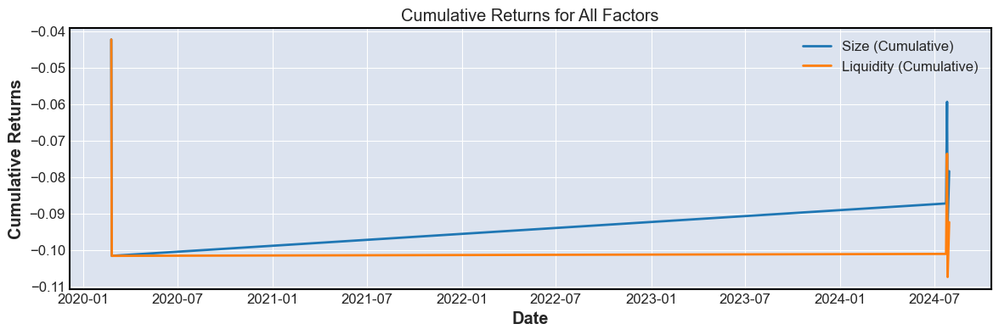

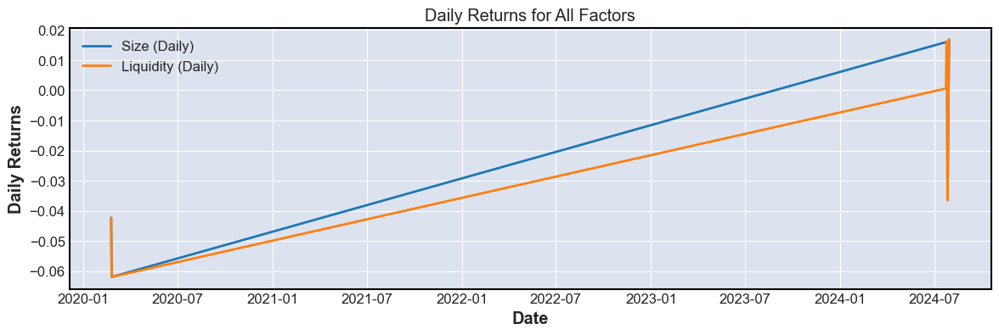

In [ ]:
# Simulate returns for all factors
all_factor_returns = simulate_all_factors(grouped_features_df, factor_portfolios)

# Plot cumulative and daily returns for all factors
plot_all_factor_returns(all_factor_returns)

In [ ]:
portfolio_returns_size

Date
2020-02-24   -0.042323
2020-02-25   -0.061960
2024-07-23    0.015995
2024-07-24    0.016161
2024-07-25    0.014169
2024-07-26   -0.036483
2024-07-29    0.016855
dtype: float64

The `portfolio_with_cumulative_size` and `portfolio_with_cumulative_liquidity` DataFrames provide both daily and cumulative returns for the Size and Liquidity factor portfolios, respectively. Below is a summary of how these portfolios performed:

**Portfolio with Cumulative Size**
- **Daily Returns:** 
  - **Mean:** -0.0111
  - **Standard Deviation:** 0.0344
  - **Min:** -0.0620
  - **Max:** 0.0169
- **Cumulative Returns:**
  - **Mean:** 0.9235
  - **Standard Deviation:** 0.0205
  - **Min:** 0.8983
  - **Max:** 0.9577

**Portfolio with Cumulative Liquidity**
- **Daily Returns:** 
  - **Mean:** -0.0133
  - **Standard Deviation:** 0.0328
  - **Min:** -0.0620
  - **Max:** 0.0169
- **Cumulative Returns:**
  - **Mean:** 0.9135
  - **Standard Deviation:** 0.0225
  - **Min:** 0.8925
  - **Max:** 0.9577

**Observations:**
- Both portfolios had negative mean daily returns, with the Liquidity portfolio having a slightly lower mean return (-0.0133) than the Size portfolio (-0.0111).
- The cumulative returns for both portfolios show an overall decline, but they eventually stabilize, indicating that both portfolios recover slightly after a decline.
- The Liquidity portfolio's cumulative returns are slightly lower than the Size portfolio's on average, and it also experienced a larger decline in the minimum cumulative return (0.8925 vs. 0.8983).

These results can be interpreted in the context of the factor models we're using. It might indicate that both factors experienced periods of drawdown, but their cumulative performance remained relatively stable in the long term.

#### 4.4.9 Multi-Factor OLS Model Additional2

1. Dimensionality Reduction
a. Correlation Analysis

`Objective:` Identify and remove redundant features.
`How: `Calculate the correlation matrix and look for features with high correlations (e.g., > 0.8). It's good to keep one feature from each highly correlated pair.

In [ ]:
X

,Market_Return,Bullish_Momentum,Rolling_Std,Beta,Risk_Free_Rate
369,0.002652,2.0,0.051916,0.742206,1.299
370,-0.014010,1.0,0.051780,0.742206,1.127
373,0.043718,2.0,0.051044,0.742206,1.088
374,-0.017141,1.0,0.050862,0.742206,1.010
375,-0.000934,2.0,0.048369,0.742206,0.992
...,...,...,...,...,...
234183,-0.130205,2.0,0.086026,0.802525,1.109
234184,0.068665,3.0,0.072087,0.802525,1.091
234187,0.000553,4.0,0.064661,0.802525,1.040
234188,0.006151,5.0,0.068425,0.802525,1.040


In [ ]:
# Select numerical columns
numerical_cols = cleaned_crypto_df.select_dtypes(include=['number']).columns

# Create a DataFrame with only numerical columns
numerical_df = cleaned_crypto_df[numerical_cols]

# Calculate the correlation matrix
corr_matrix = numerical_df.corr()

# Plot the correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()


- Correlation Among Features Only

In [ ]:
# Compute the correlation matrix for features only
feature_cols = numerical_cols.drop('Return')  # Exclude the target variable
correlation_matrix_features_only = cleaned_crypto_df[feature_cols].corr()

# Identify high correlation pairs among features
high_correlation_pairs_features_only = correlation_matrix_features_only.unstack().sort_values(ascending=False).drop_duplicates()
high_correlation_pairs_features_only = high_correlation_pairs_features_only[(high_correlation_pairs_features_only > 0.8) | (high_correlation_pairs_features_only < -0.8)]

# Display the high correlation pairs among features
print("High Correlation Pairs Among Features")
high_correlation_pairs_features_only


- Correlation Including the Target (Optional for Insight)

In [ ]:
# Compute the correlation matrix including the target
correlation_matrix_with_target = cleaned_crypto_df[numerical_cols].corr()

# Display correlation of each feature with the target
target_correlation = correlation_matrix_with_target['Return'].sort_values(ascending=False)
print("Correlation of Features with Target (Return)")
target_correlation


In [ ]:
# Visualize the correlation matrix among features
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_features_only, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Among Features')
plt.show()


# Visualize the correlation of features with the target
plt.figure(figsize=(10, 8))
target_correlation.drop('Return').sort_values().plot(kind='barh', color='skyblue')
plt.title('Correlation of Features with Target (Return)')
plt.xlabel('Correlation')
plt.show()



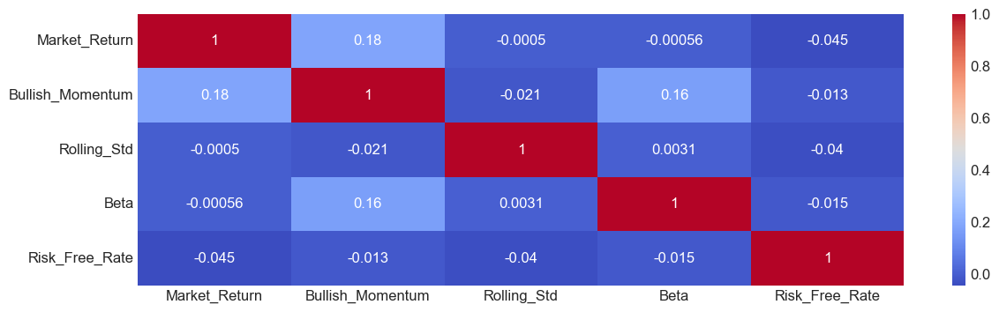

corr_matrix:


,Market_Return,Bullish_Momentum,Rolling_Std,Beta,Risk_Free_Rate
Market_Return,1.000000,0.179606,-0.000497,-0.000563,-0.045286
Bullish_Momentum,0.179606,1.000000,-0.020577,0.163580,-0.012840
Rolling_Std,-0.000497,-0.020577,1.000000,0.003085,-0.039642
Beta,-0.000563,0.163580,0.003085,1.000000,-0.014979
Risk_Free_Rate,-0.045286,-0.012840,-0.039642,-0.014979,1.000000


In [ ]:
corr_matrix = X.corr()
plt.figure(figsize=(all_plots_size))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

print('corr_matrix:')
corr_matrix


b. Principal Component Analysis (PCA)

`Objective:` Reduce dimensionality by transforming features into principal components.
`How: `Apply PCA to the dataset after standardizing it.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Separate features and target
features = cleaned_crypto_df.drop(columns=['Target'])  # Adjust 'Target' as needed
features_scaled = StandardScaler().fit_transform(features)

pca = PCA(n_components=0.95)  # Retain 95% of variance
principal_components = pca.fit_transform(features_scaled)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(principal_components.shape[1])])


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Standardizing the data before applying PCA
from sklearn.preprocessing import StandardScaler

X = cleaned_crypto_df.dropna()
X_standardized = StandardScaler().fit_transform(X)

# Applying PCA
pca = PCA(n_components=None)  # Keep all components initially
principal_components = pca.fit_transform(X_standardized)

# Explained variance by each principal component
explained_variance = pca.explained_variance_ratio_

# Plot the explained variance
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components')
plt.show()

# Select a number of components that explain a high variance (e.g., 90-95%)
n_components = np.argmax(np.cumsum(explained_variance) >= 0.90) + 1
print(f"Number of components selected: {n_components}")

# Reduce dimensionality using the selected number of components
pca = PCA(n_components=n_components)
principal_components_reduced = pca.fit_transform(X_standardized)

# Convert to DataFrame for further use
pca_columns = [f'PC{i+1}' for i in range(n_components)]
final_pca_df = pd.DataFrame(data=principal_components_reduced, columns=pca_columns)
final_pca_df.index = X.index  # Retain the original index (timestamps)

# Add back the non-correlated features
final_reduced_df = pd.concat([final_pca_df, final_merged_df_vif.drop(columns=numerical_cols)], axis=1)

print("Final DataFrame after PCA:")
print(final_reduced_df.head())


In [ ]:
# 1. Scree Plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, marker='o')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.show()

# 2. Loading Plot (using PC1 and PC2)
plt.figure(figsize=(10, 6))
plt.bar(x=range(len(pca.components_[0])), height=pca.components_[0], tick_label=numerical_cols)
plt.title('Loading Plot for PC1')
plt.xlabel('Features')
plt.ylabel('Loading Scores')
plt.xticks(rotation=90)
plt.show()

# 3. Component Score Plot (PC1 vs PC2)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=final_reduced_df['PC1'], y=final_reduced_df['PC2'], hue=final_reduced_df['Ticker_crypto'])
plt.title('Component Score Plot (PC1 vs PC2)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

# 4. Coefficient Plot
coefficients = model.params[1:]  # excluding the intercept
plt.figure(figsize=(10, 6))
coefficients.plot(kind='bar', color='blue')
plt.title('Coefficient Plot')
plt.xlabel('Principal Components')
plt.ylabel('Coefficients')
plt.show()

# 5. Residual Plot
plt.figure(figsize=(10, 6))
sns.residplot(x=model.fittedvalues, y=model.resid, lowess=True)
plt.title('Residual Plot')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming 'predictions' are from the model's fitted values

# 1. Predicted vs. Actual Values Over Time
plt.figure(figsize=(12, 6))
plt.plot(final_reduced_df.index, y, label='Actual Values', color='blue')
plt.plot(final_reduced_df.index, predictions, label='Predicted Values', color='red', linestyle='--')
plt.title('Predicted vs. Actual Values Over Time')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()
plt.show()

# 2. Residuals Over Time
plt.figure(figsize=(12, 6))
plt.plot(final_reduced_df.index, residuals, label='Residuals', color='green')
plt.axhline(0, color='black', linewidth=1)
plt.title('Residuals Over Time')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.show()

# 3. Rolling Mean and Standard Deviation of Residuals
window = 30  # rolling window size
rolling_mean = residuals.rolling(window=window).mean()
rolling_std = residuals.rolling(window=window).std()

plt.figure(figsize=(12, 6))
plt.plot(final_reduced_df.index, rolling_mean, label=f'Rolling Mean (Window={window})', color='orange')
plt.plot(final_reduced_df.index, rolling_std, label=f'Rolling Std Dev (Window={window})', color='purple')
plt.title('Rolling Mean and Standard Deviation of Residuals')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.legend()
plt.show()


c. Feature Selection Techniques

`Objective:` Select important features using methods like Lasso regression or Recursive Feature Elimination (RFE).
`How:` Use Lasso or RFE for feature selection

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV

# Lasso regression for feature selection
lasso = LassoCV()
lasso.fit(features_scaled, target)  # Adjust 'target' as needed
selected_features = features.columns[lasso.coef_ != 0]

# Recursive Feature Elimination
rfe = RFE(estimator=lasso, n_features_to_select=10)  # Adjust number as needed
rfe.fit(features_scaled, target)
selected_features_rfe = features.columns[rfe.support_]


d. Variance Inflation Factor (VIF) Calculation
- This step will help us identify and remove variables with high multicollinearity.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Calculate VIF for each feature
X = cleaned_crypto_df[numerical_cols].dropna()  # Drop NA values for VIF calculation

# Create a DataFrame to store VIF values
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF values
print("Variance Inflation Factor (VIF) for each feature:")
print(vif_data)

# Drop features with VIF > 10 (or a threshold you find appropriate)
high_vif_features = vif_data[vif_data["VIF"] > 10]["Feature"]
final_merged_df_vif = cleaned_crypto_df.drop(columns=high_vif_features)

print(f"Dropped features with high VIF: {list(high_vif_features)}")


2. Stepwise Regression
`Objective:` Iteratively add or remove predictors based on their statistical significance.
`How:` Apply forward or backward stepwise regression.

In [ ]:
import statsmodels.api as sm

def stepwise_selection(X, y, initial_features, threshold_in=0.01, threshold_out=0.05, verbose=True):
    included = list(initial_features)
    while True:
        changed=False
        # Forward Step
        excluded = list(set(X.columns)-set(included))
        new_pvals = pd.Series(index=excluded)
        for new_col in excluded:
            model = sm.OLS(y, sm.add_constant(X[included+[new_col]])).fit()
            new_pvals[new_col] = model.pvalues[new_col]
        best_pval = new_pvals.min()
        if best_pval < threshold_in:
            best_feature = new_pvals.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print(f'Add {best_feature} with p-value {best_pval:.6}')
        # Backward Step
        model = sm.OLS(y, sm.add_constant(X[included])).fit()
        pvalues = model.pvalues[1:]  # Exclude intercept
        worst_pval = pvalues.max()
        if worst_pval > threshold_out:
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            changed=True
            if verbose:
                print(f'Remove {worst_feature} with p-value {worst_pval:.6}')
        if not changed:
            break
    return included

selected_features = stepwise_selection(features_scaled, target, features.columns)


`Identifying and Handling Highly Correlated Features`

1. Calculate the Correlation Matrix
Compute the correlation matrix for numerical columns as previously mentioned.

2. Identify Highly Correlated Pairs
Find pairs of features where the correlation coefficient is above a certain threshold (e.g., 0.8). For each pair, decide which feature to keep.

3. Drop Redundant Features
Remove one feature from each highly correlated pair to reduce redundancy.

In [ ]:
import pandas as pd
import numpy as np

# Step 1: Calculate the correlation matrix
corr_matrix = numerical_df.corr()

# Step 2: Identify highly correlated pairs
# Create an upper triangle matrix to avoid redundant comparisons
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.8
highly_correlated = [(column, index) for column in upper.columns for index in upper.index if abs(upper.loc[index, column]) > 0.8]

# Step 3: Drop redundant features
# Create a set to store features to drop
features_to_drop = set()

for col1, col2 in highly_correlated:
    if col1 not in features_to_drop:
        features_to_drop.add(col2)

# Drop the identified features
reduced_df = numerical_df.drop(columns=features_to_drop)

# Display the features to be dropped and the new DataFrame
print(f"Features to be dropped: {features_to_drop}")
print(reduced_df.head())


In [ ]:
btc_crypto_df.head(2)

,Date,Open,High,Low,Close,Volume,Ticker,Active Addresses,Transaction Count,Large Transaction Count,...,Current Supply,Market Cap,Return,Rolling_Mean,Rolling_Std,Z_Score,Risk_Free_Rate,Market_Return,Excess_Return,Excess_Market_Return
33268,2019-02-23,3965.16,4155.65,3935.28,4118.76,1.168571e+09,BTC/USDT,600634,328239,5679,...,1.755468e+07,7.230353e+10,0.038737,NaN,NaN,1.046154,NaN,0.038737,NaN,NaN
33269,2019-02-24,4118.76,4194.06,3722.40,3746.63,1.426308e+09,BTC/USDT,600042,320446,5274,...,1.755640e+07,6.577732e+10,-0.090350,NaN,NaN,-2.634371,NaN,-0.090350,NaN,NaN


In [ ]:
btc_crypto_df['Market Cap'].describe()

count    1.985000e+03
mean     5.517870e+11
std      3.644415e+11
min      6.531685e+10
25%      1.922985e+11
50%      5.131618e+11
75%      8.173821e+11
max      1.436178e+12
Name: Market Cap, dtype: float64

In [ ]:
top_10_by_marketcap_merged